In [1]:
import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np
import os
import pandas as pd
from scipy import stats

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

import pickle

# ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
lineid = '39A_1'

## Read

In [3]:
df = pd.read_csv(f'{lineid}.csv')
df.head()

,DAYOFSERVICE,STARTSTOP,LINEID,HOUR,ENDSTOP,JOURNEYTIME,PLANNED_JOURNEYTIME,STOP_TIME
0,2018-01-01,767,39A_1,9,768,138.0,103.0,0.0
1,2018-01-01,768,39A_1,9,769,20.0,24.0,0.0
2,2018-01-01,769,39A_1,9,770,29.0,38.0,0.0
3,2018-01-01,770,39A_1,9,771,10.0,16.0,0.0
4,2018-01-01,771,39A_1,9,772,28.0,32.0,0.0


In [4]:
df.dtypes

DAYOFSERVICE            object
STARTSTOP                int64
LINEID                  object
HOUR                     int64
ENDSTOP                  int64
JOURNEYTIME            float64
PLANNED_JOURNEYTIME    float64
STOP_TIME              float64
dtype: object

In [5]:
df['DAYOFSERVICE'] = pd.to_datetime(df.DAYOFSERVICE)

df.dtypes

DAYOFSERVICE           datetime64[ns]
STARTSTOP                       int64
LINEID                         object
HOUR                            int64
ENDSTOP                         int64
JOURNEYTIME                   float64
PLANNED_JOURNEYTIME           float64
STOP_TIME                     float64
dtype: object

In [6]:
df['MONTH'] = df['DAYOFSERVICE'].dt.month_name()
df['DAY'] = df['DAYOFSERVICE'].dt.day_name()

df.head()

,DAYOFSERVICE,STARTSTOP,LINEID,HOUR,ENDSTOP,JOURNEYTIME,PLANNED_JOURNEYTIME,STOP_TIME,MONTH,DAY
0,2018-01-01,767,39A_1,9,768,138.0,103.0,0.0,January,Monday
1,2018-01-01,768,39A_1,9,769,20.0,24.0,0.0,January,Monday
2,2018-01-01,769,39A_1,9,770,29.0,38.0,0.0,January,Monday
3,2018-01-01,770,39A_1,9,771,10.0,16.0,0.0,January,Monday
4,2018-01-01,771,39A_1,9,772,28.0,32.0,0.0,January,Monday


In [7]:
df.drop(['DAYOFSERVICE'], axis = 1, inplace = True)

df.head()

,STARTSTOP,LINEID,HOUR,ENDSTOP,JOURNEYTIME,PLANNED_JOURNEYTIME,STOP_TIME,MONTH,DAY
0,767,39A_1,9,768,138.0,103.0,0.0,January,Monday
1,768,39A_1,9,769,20.0,24.0,0.0,January,Monday
2,769,39A_1,9,770,29.0,38.0,0.0,January,Monday
3,770,39A_1,9,771,10.0,16.0,0.0,January,Monday
4,771,39A_1,9,772,28.0,32.0,0.0,January,Monday


In [8]:
df.dtypes

STARTSTOP                int64
LINEID                  object
HOUR                     int64
ENDSTOP                  int64
JOURNEYTIME            float64
PLANNED_JOURNEYTIME    float64
STOP_TIME              float64
MONTH                   object
DAY                     object
dtype: object

## remove outliers

In [9]:
df.head()

,STARTSTOP,LINEID,HOUR,ENDSTOP,JOURNEYTIME,PLANNED_JOURNEYTIME,STOP_TIME,MONTH,DAY
0,767,39A_1,9,768,138.0,103.0,0.0,January,Monday
1,768,39A_1,9,769,20.0,24.0,0.0,January,Monday
2,769,39A_1,9,770,29.0,38.0,0.0,January,Monday
3,770,39A_1,9,771,10.0,16.0,0.0,January,Monday
4,771,39A_1,9,772,28.0,32.0,0.0,January,Monday


In [10]:
start_end_pairs = df.groupby(['STARTSTOP', 'ENDSTOP']).size().reset_index().rename(columns = {0 : 'COUNT'})

In [11]:
start_end_pairs = start_end_pairs.sort_values(by=['COUNT'], ascending=False)

In [12]:
start_end_pairs.reset_index(inplace=True, drop=True)
start_end_pairs

,STARTSTOP,ENDSTOP,COUNT
0,777,779,20864
1,773,774,20859
2,776,777,20858
3,774,775,20857
4,772,773,20853
...,...,...,...
68,793,7576,20390
69,1443,1444,20326
70,328,1443,20299
71,4529,7586,40


### ONROAD_TIME <= 0

In [13]:
df['ONROAD_TIME'] = df['JOURNEYTIME'] - df['STOP_TIME']

df.head()

,STARTSTOP,LINEID,HOUR,ENDSTOP,JOURNEYTIME,PLANNED_JOURNEYTIME,STOP_TIME,MONTH,DAY,ONROAD_TIME
0,767,39A_1,9,768,138.0,103.0,0.0,January,Monday,138.0
1,768,39A_1,9,769,20.0,24.0,0.0,January,Monday,20.0
2,769,39A_1,9,770,29.0,38.0,0.0,January,Monday,29.0
3,770,39A_1,9,771,10.0,16.0,0.0,January,Monday,10.0
4,771,39A_1,9,772,28.0,32.0,0.0,January,Monday,28.0


In [14]:
df[df['ONROAD_TIME'] <= 0]

,STARTSTOP,LINEID,HOUR,ENDSTOP,JOURNEYTIME,PLANNED_JOURNEYTIME,STOP_TIME,MONTH,DAY,ONROAD_TIME
80339,793,39A_1,12,7576,20.0,16.0,20.0,January,Friday,0.0
105766,793,39A_1,22,7576,34.0,10.0,34.0,January,Thursday,0.0
131706,793,39A_1,18,7576,32.0,20.0,32.0,February,Thursday,0.0
164911,2171,39A_1,17,7160,37.0,9.0,37.0,February,Thursday,0.0
235862,793,39A_1,18,7576,42.0,11.0,42.0,February,Sunday,0.0
409337,793,39A_1,17,7576,32.0,15.0,32.0,April,Thursday,0.0
462009,793,39A_1,18,7576,37.0,20.0,37.0,April,Wednesday,0.0
481777,793,39A_1,16,7576,52.0,16.0,52.0,April,Monday,0.0
486846,793,39A_1,11,7576,17.0,13.0,17.0,May,Tuesday,0.0
493943,793,39A_1,19,7576,80.0,18.0,80.0,May,Thursday,0.0


In [15]:
df.drop(df[df['ONROAD_TIME'] <= 0].index, inplace = True)

df[df['ONROAD_TIME'] <= 0]

,STARTSTOP,LINEID,HOUR,ENDSTOP,JOURNEYTIME,PLANNED_JOURNEYTIME,STOP_TIME,MONTH,DAY,ONROAD_TIME


### The initial data distribution

In [16]:
df[['JOURNEYTIME', 'PLANNED_JOURNEYTIME', 'STOP_TIME', 'ONROAD_TIME']].describe().T

,count,mean,std,min,25%,50%,75%,max
JOURNEYTIME,1465837.0,74.307506,67.896040,1.0,37.0,55.0,87.0,3357.0
PLANNED_JOURNEYTIME,1465837.0,63.961428,57.856434,5.0,31.0,46.0,71.0,865.0
STOP_TIME,1465837.0,14.648087,28.502549,0.0,0.0,11.0,17.0,1743.0
ONROAD_TIME,1465837.0,59.659418,57.236576,1.0,28.0,42.0,70.0,3343.0


777_779


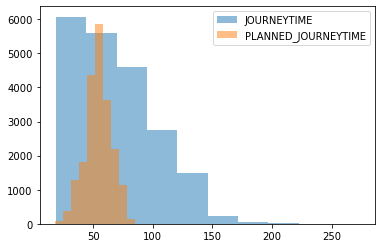

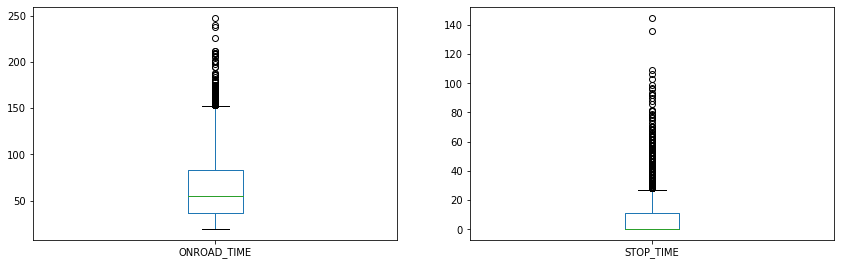

773_774


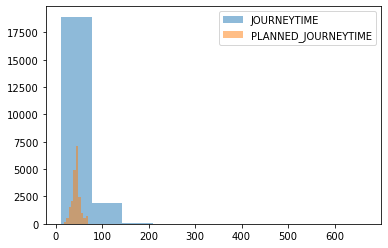

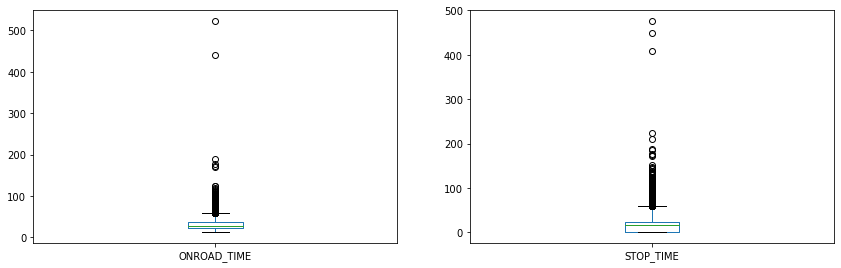

776_777


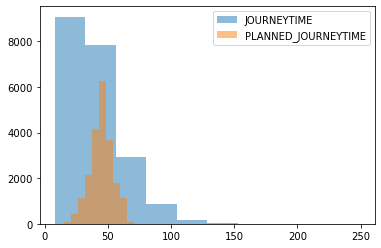

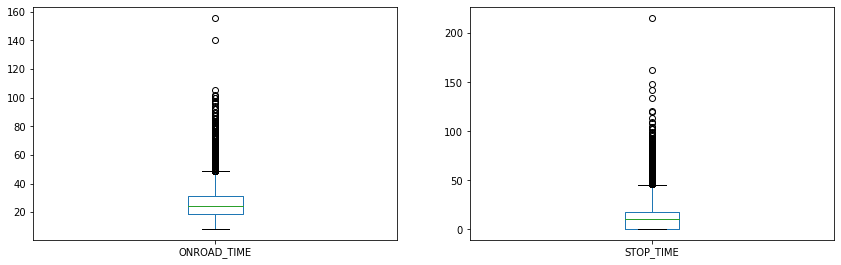

774_775


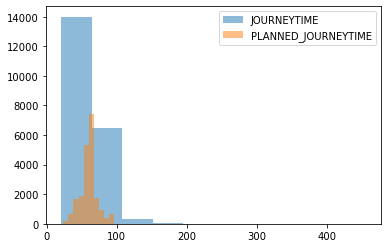

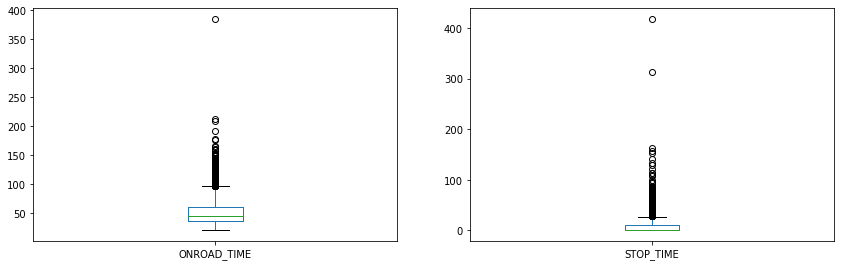

772_773


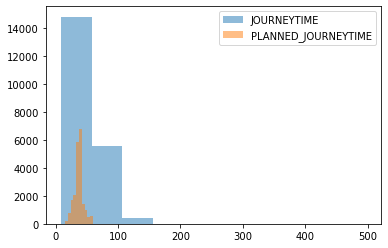

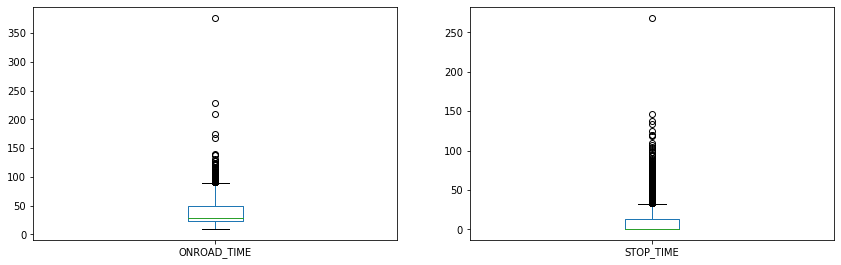

775_776


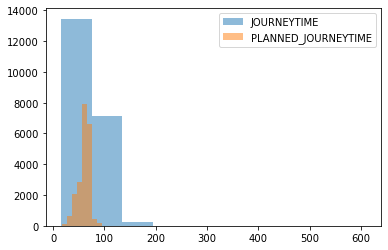

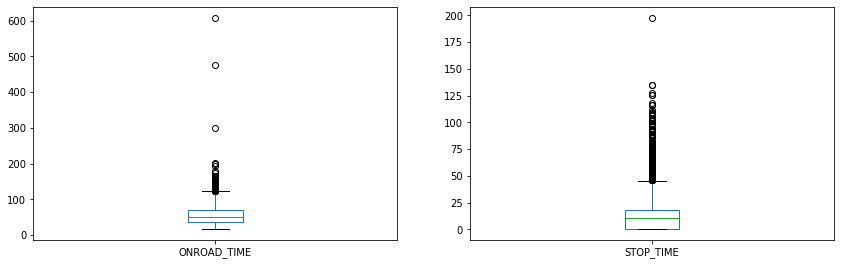

782_783


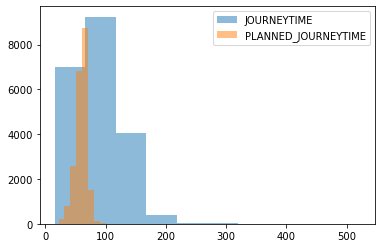

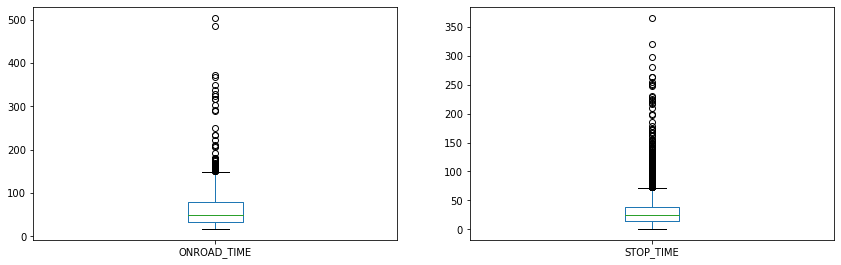

781_782


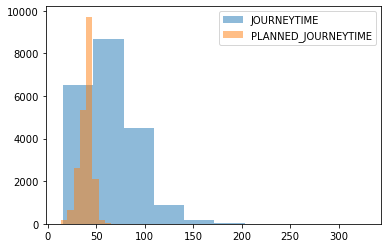

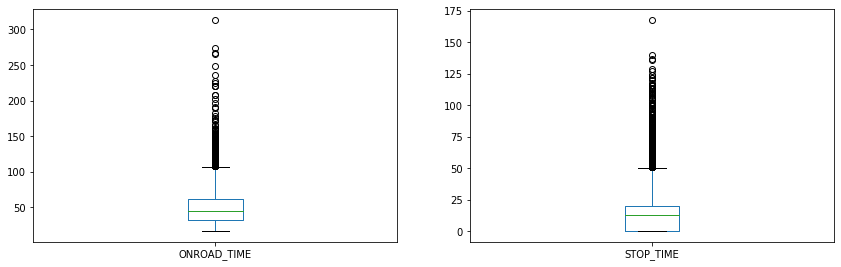

779_780


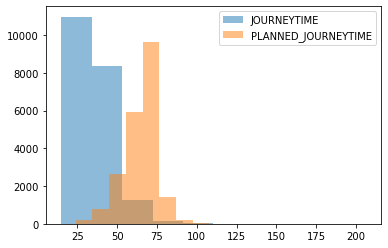

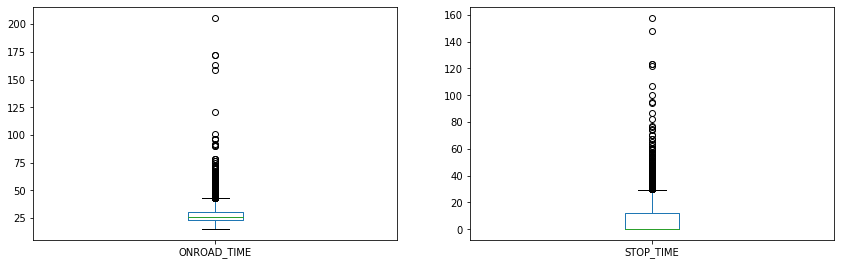

780_781


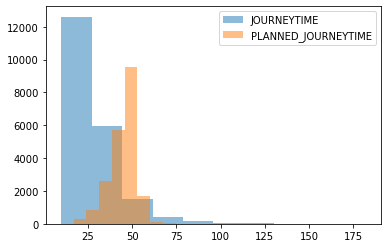

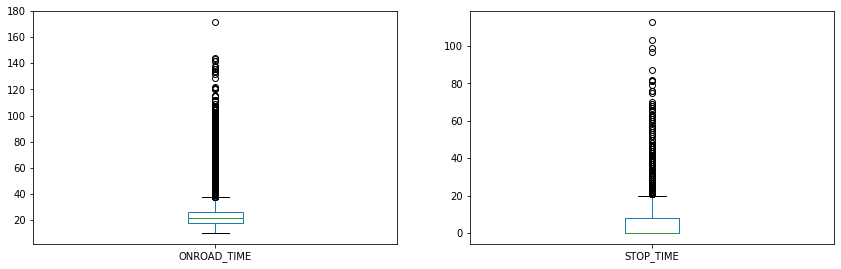

771_772


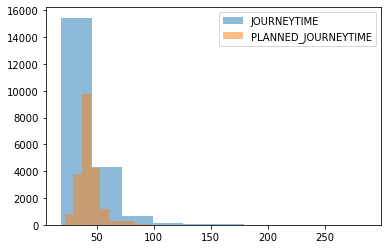

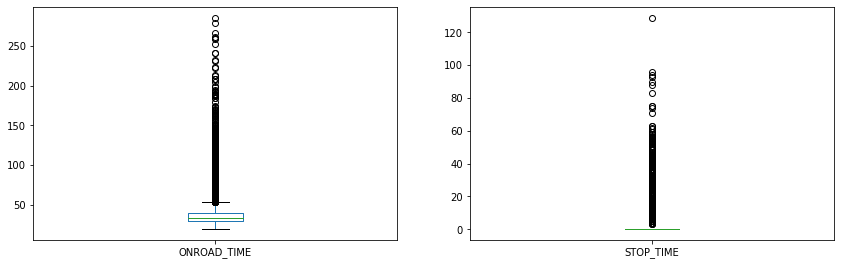

783_784


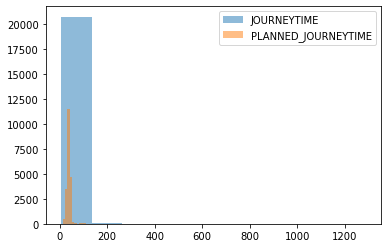

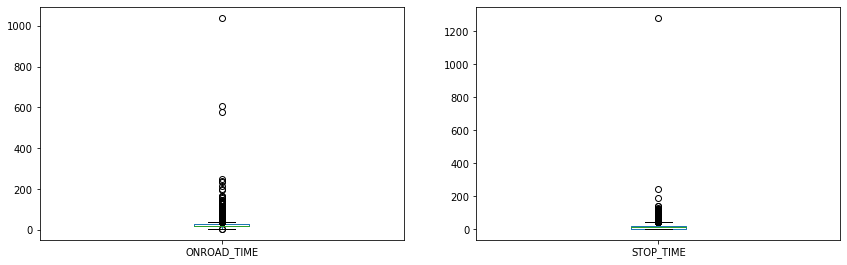

784_785


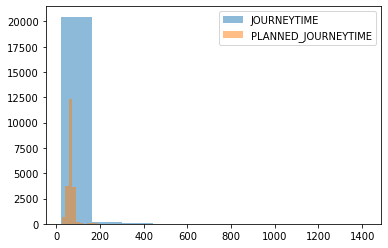

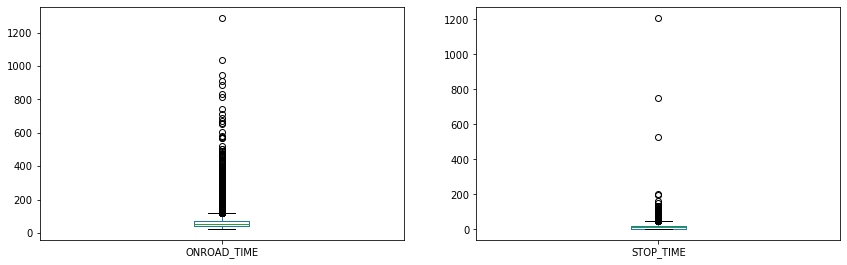

770_771


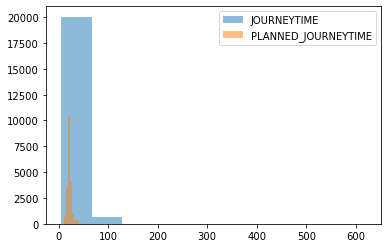

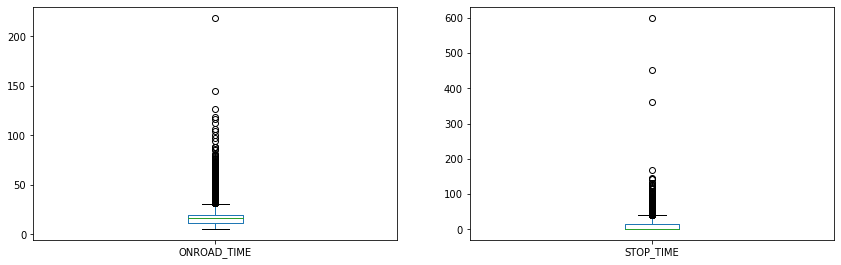

785_786


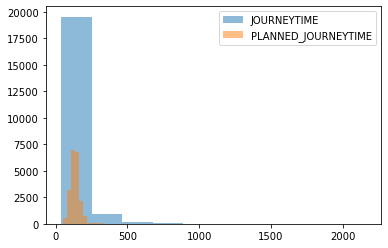

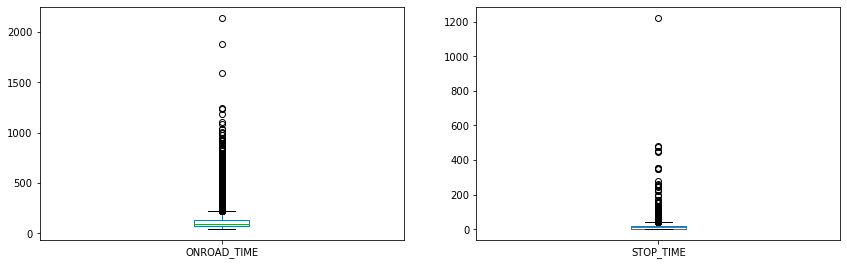

769_770


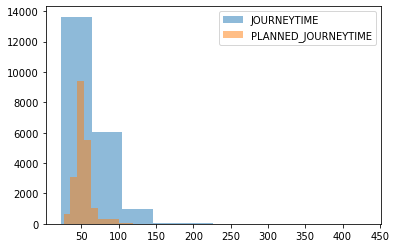

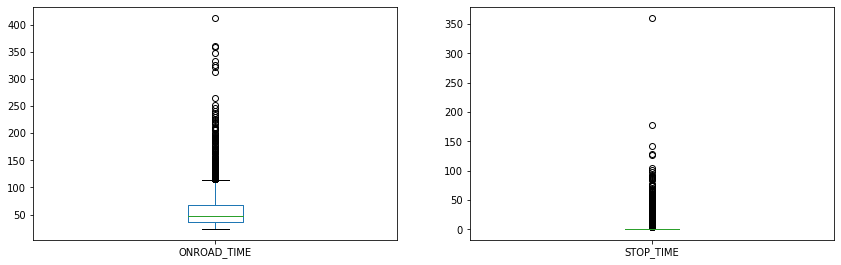

767_768


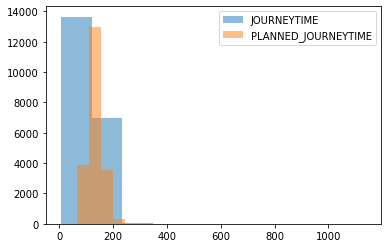

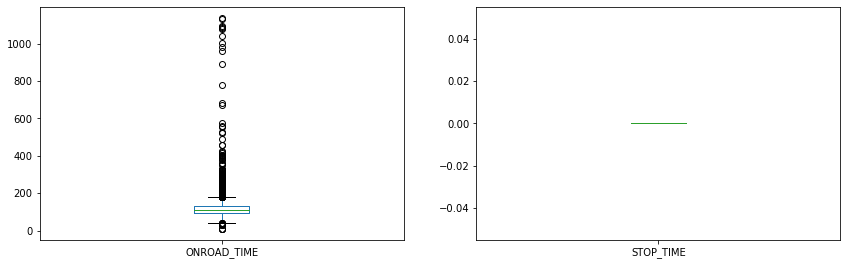

768_769


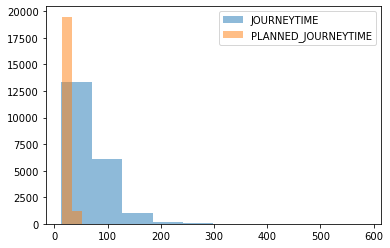

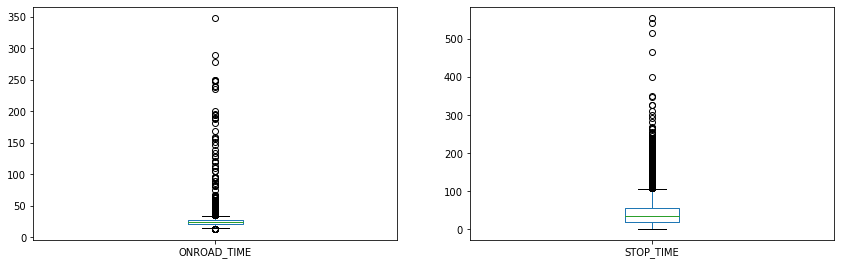

7587_7588


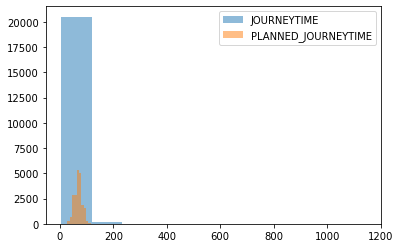

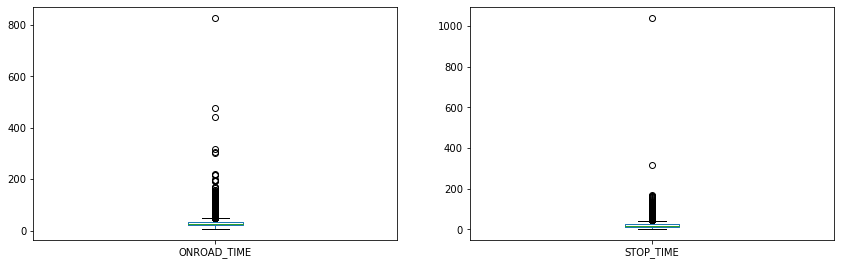

1877_1878


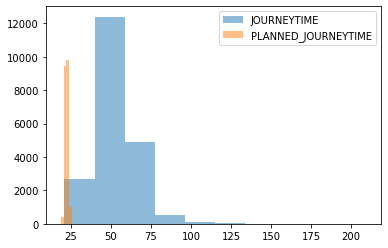

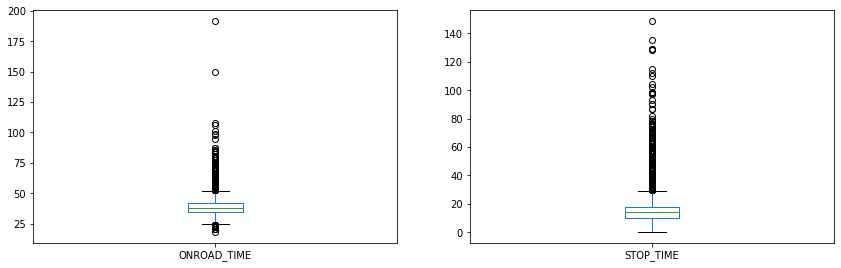

6109_6110


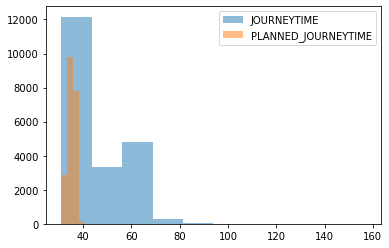

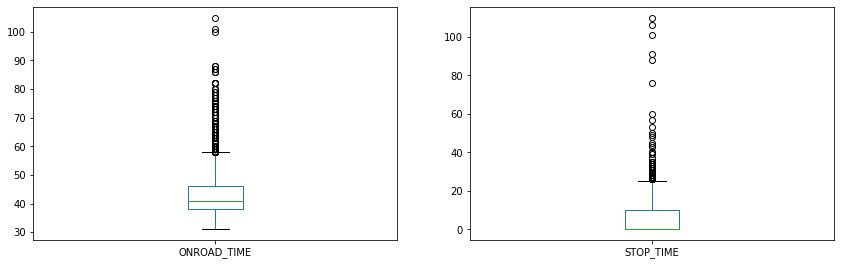

7161_7162


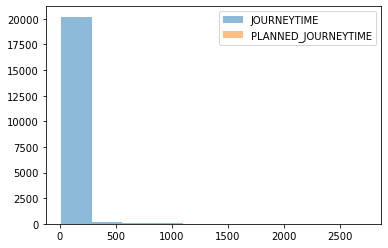

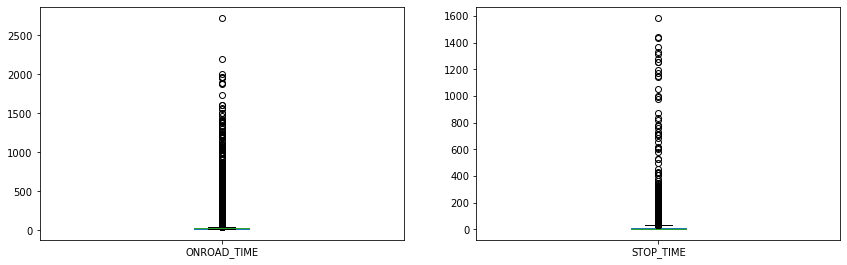

1876_1877


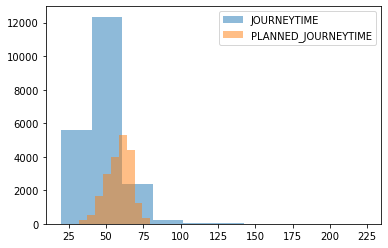

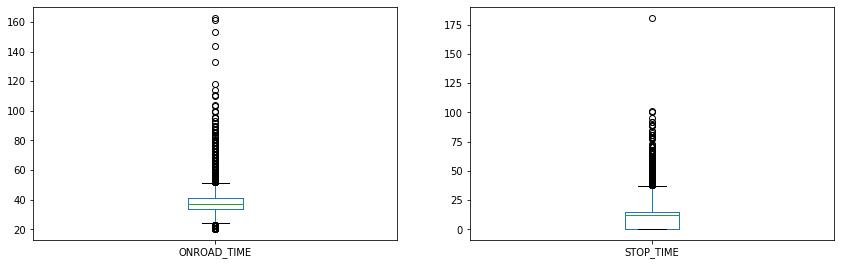

1875_1876


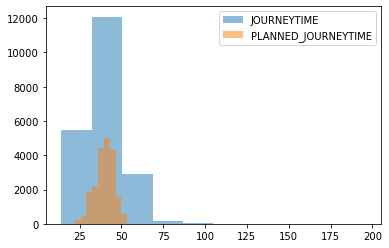

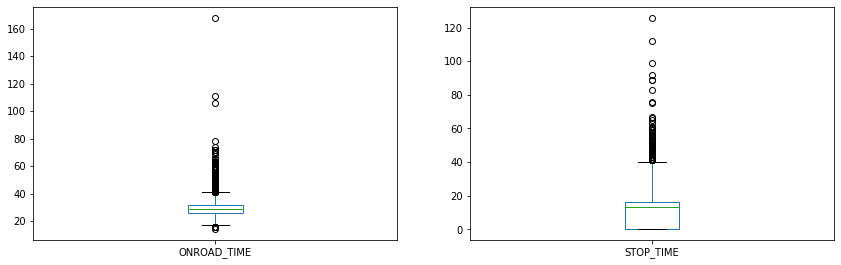

1872_1873


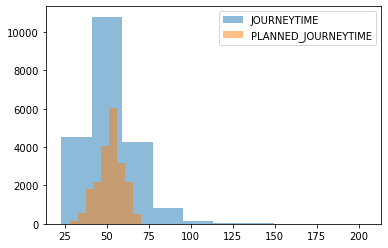

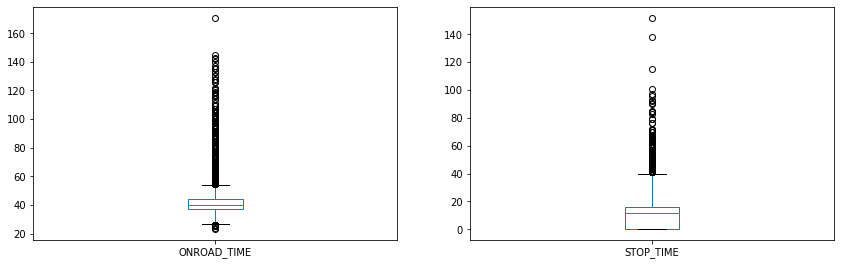

1873_1874


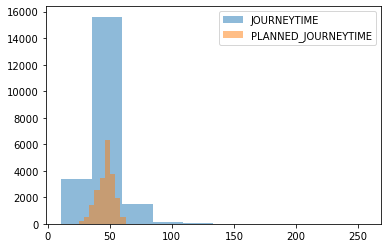

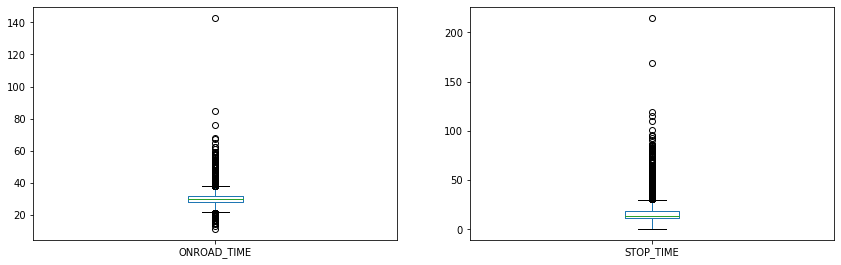

1874_1875


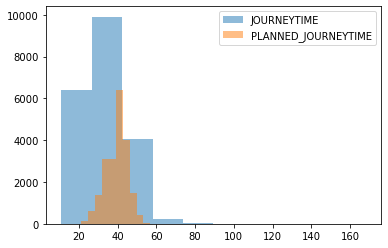

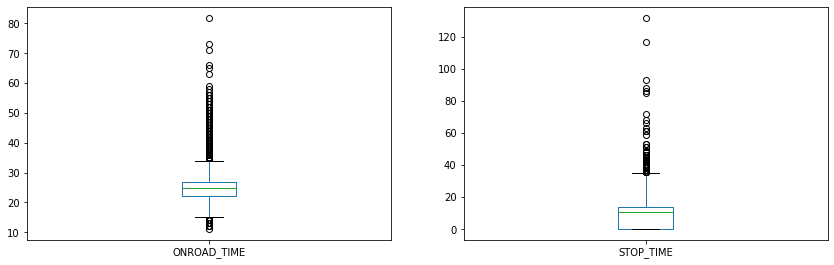

1871_1872


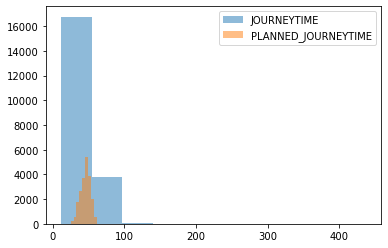

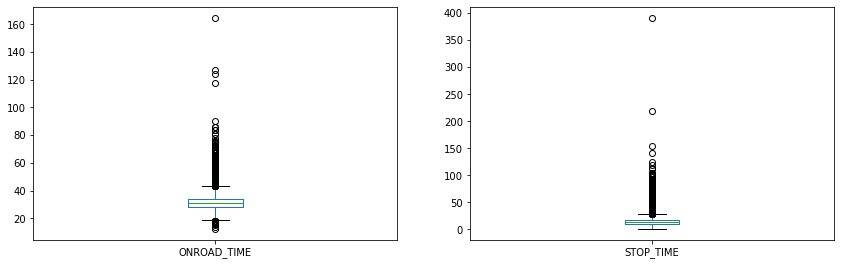

1899_6107


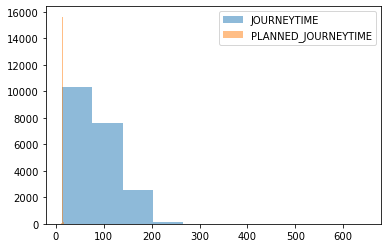

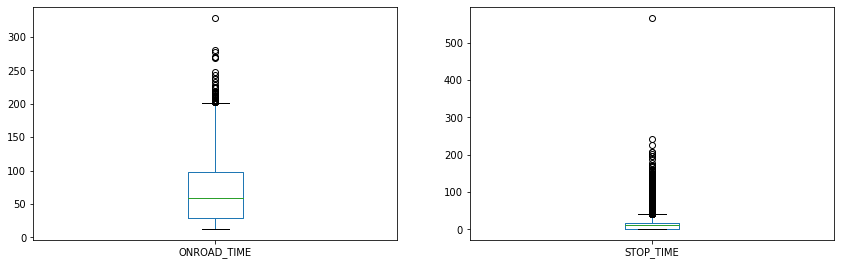

6108_6109


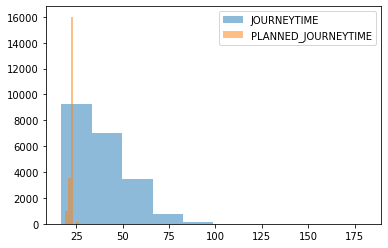

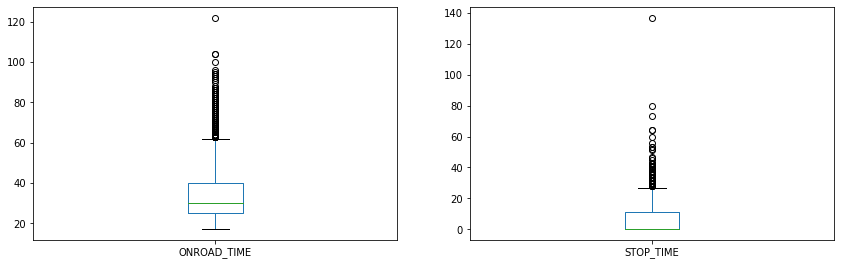

1879_1899


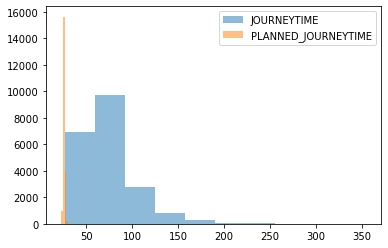

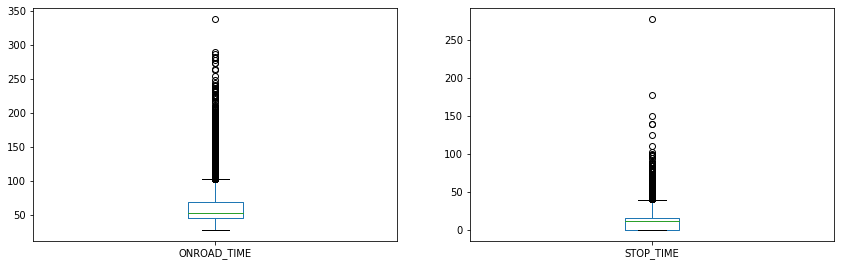

1878_1879


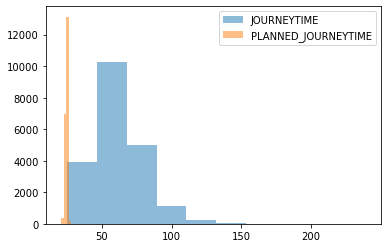

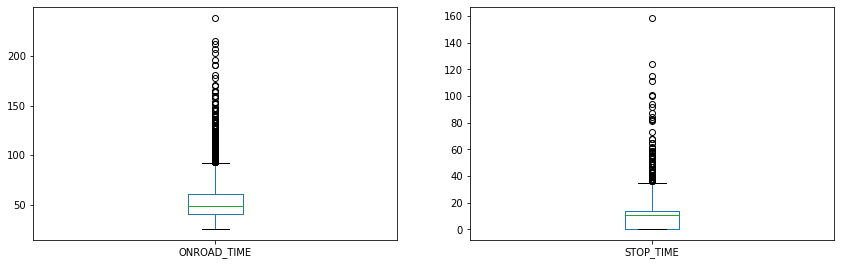

6107_6108


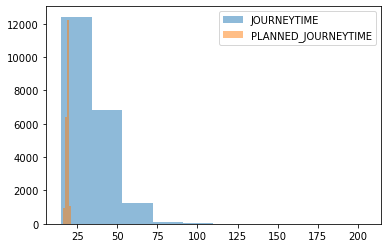

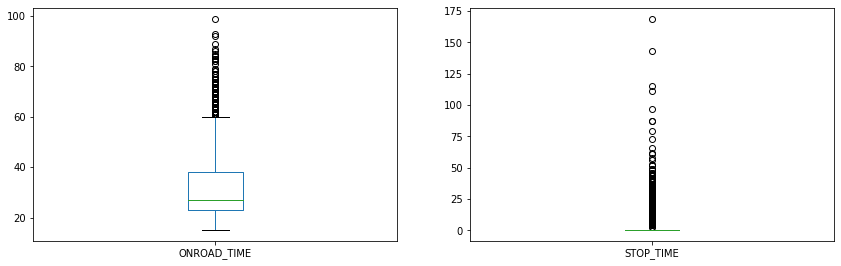

1870_1871


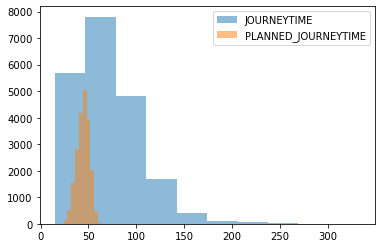

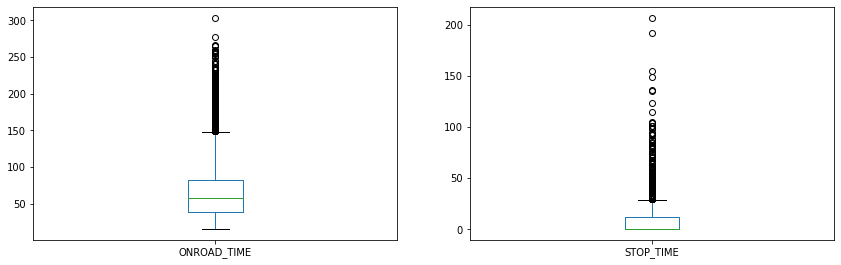

7029_7038


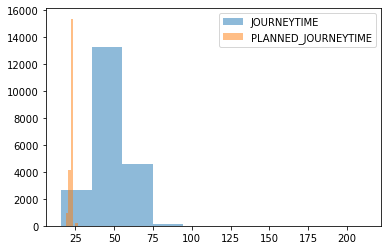

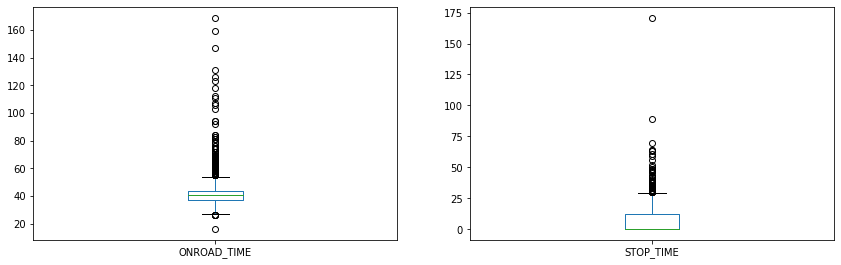

7160_7047


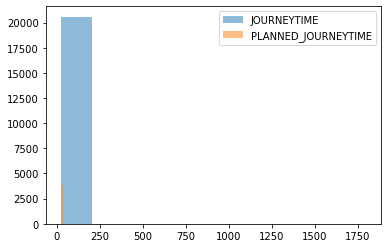

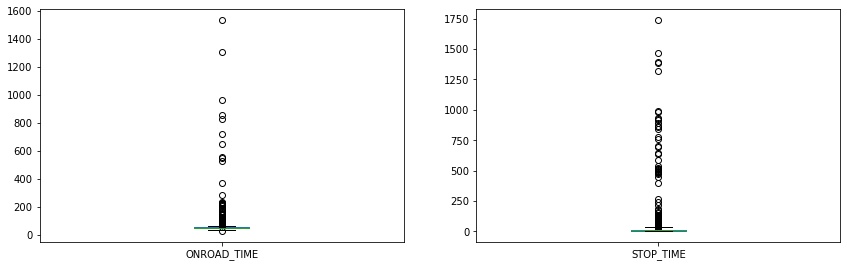

7020_7029


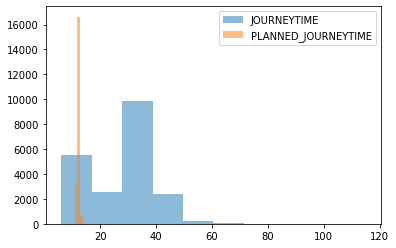

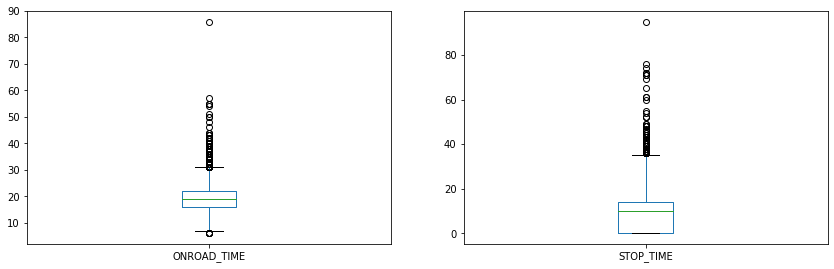

1869_1870


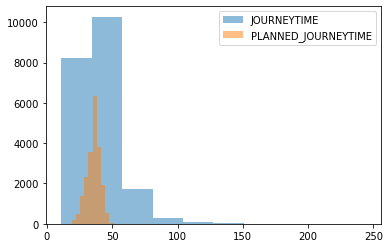

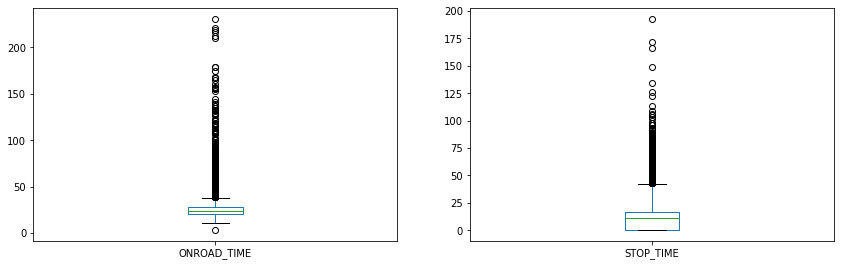

7047_7161


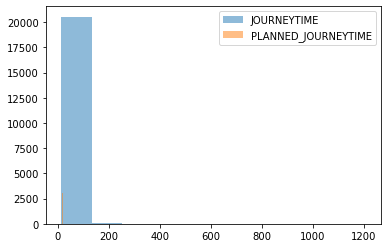

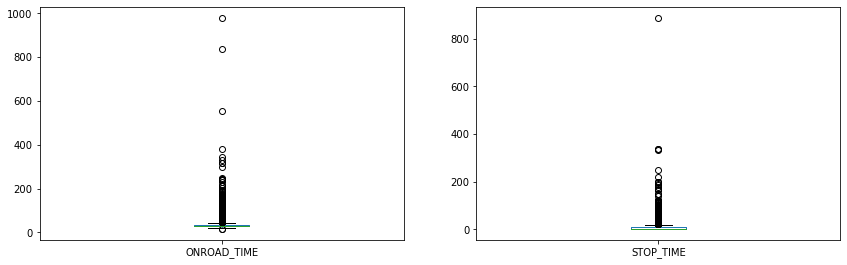

7038_7011


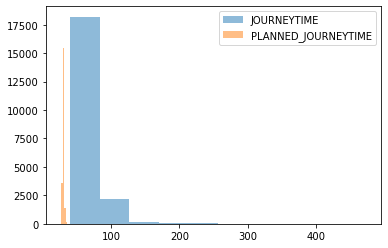

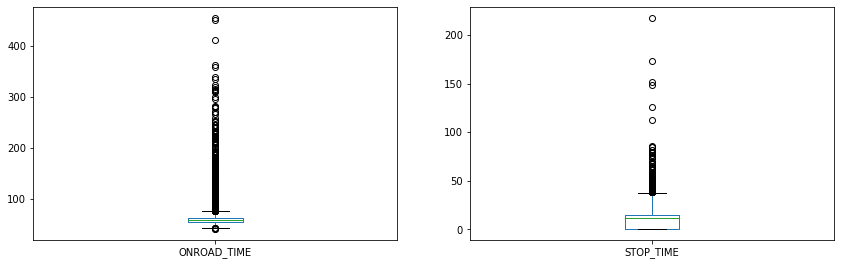

7586_7587


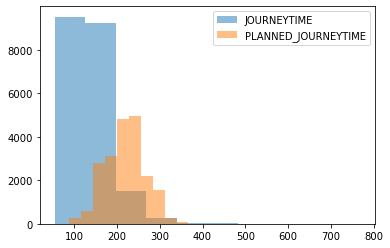

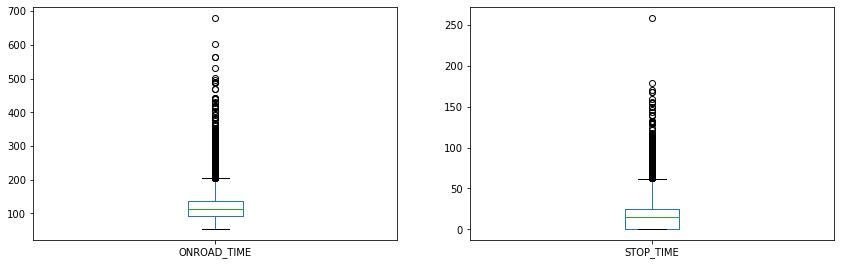

6110_7020


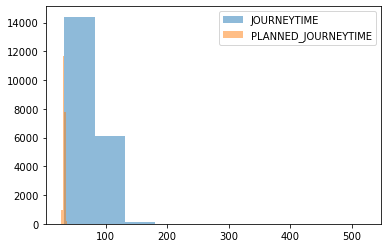

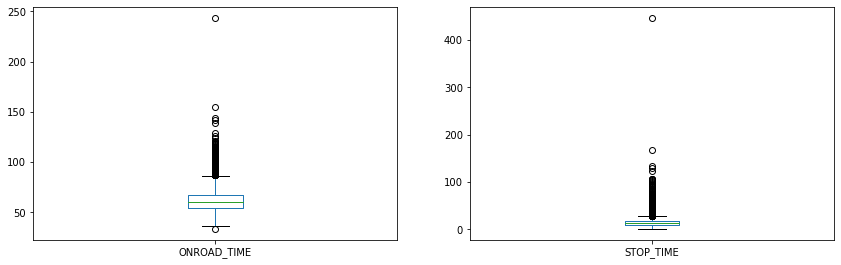

2171_7160


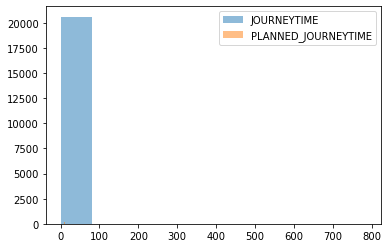

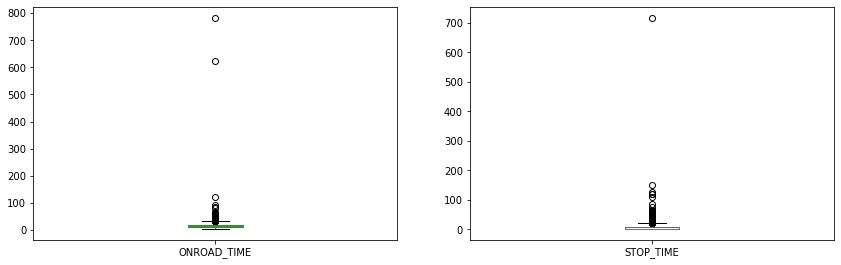

7011_2171


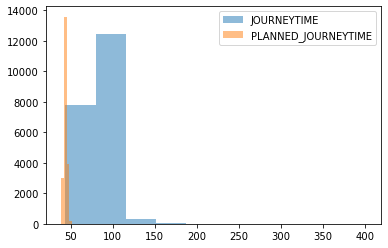

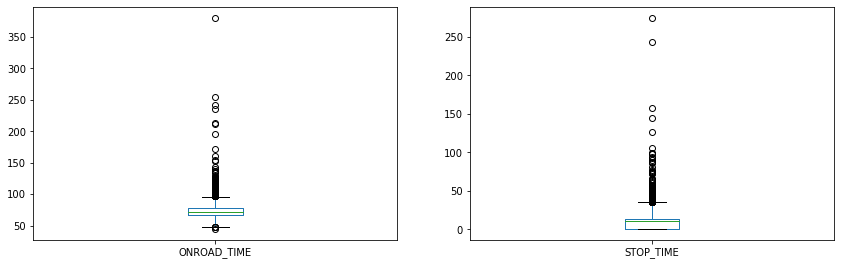

7389_7025


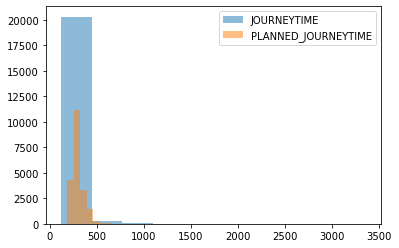

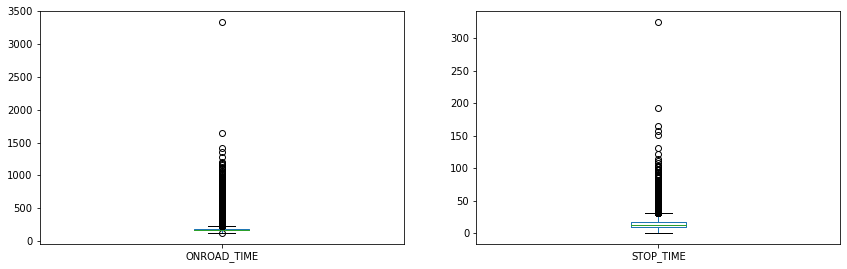

7588_328


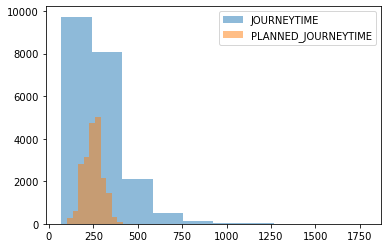

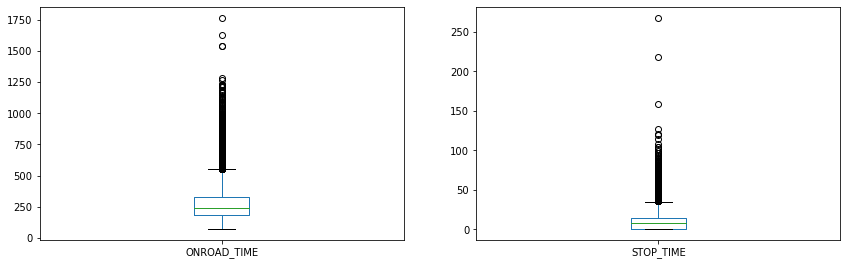

1666_1807


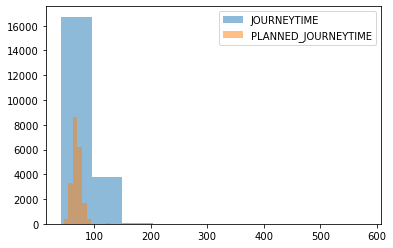

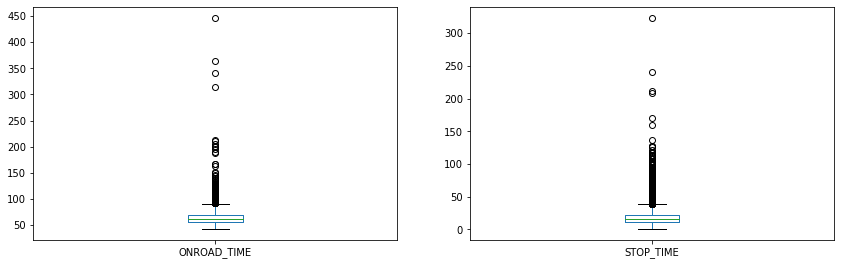

4464_1869


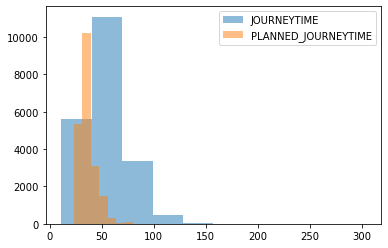

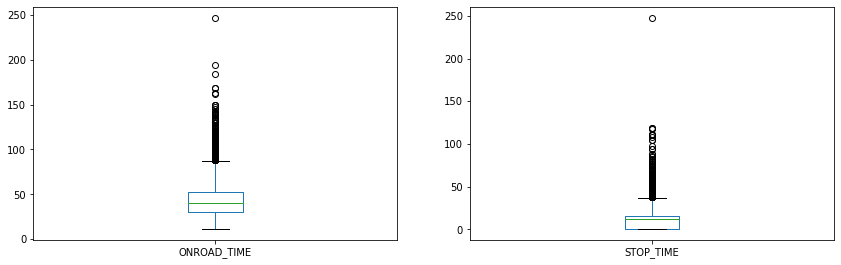

1808_7389


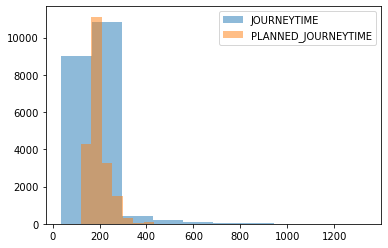

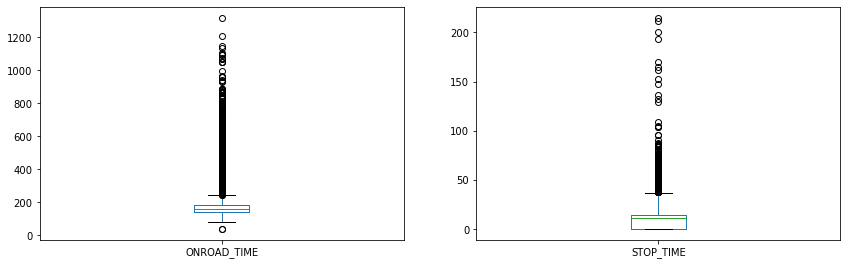

1807_7167


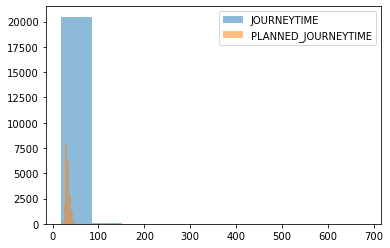

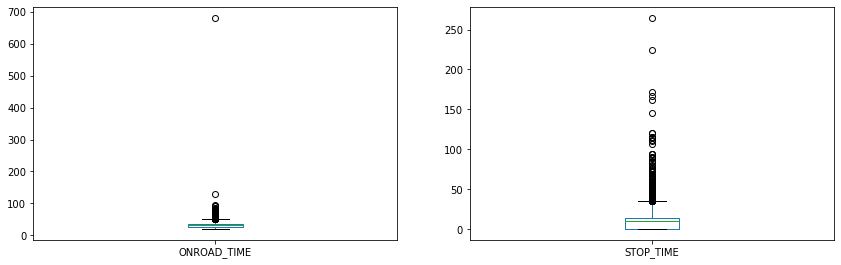

7167_1808


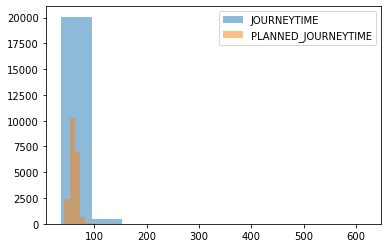

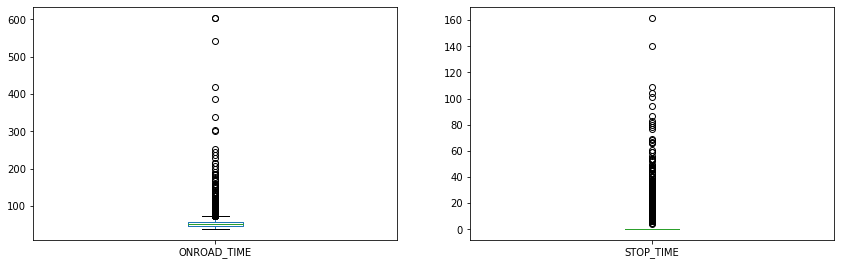

7025_4464


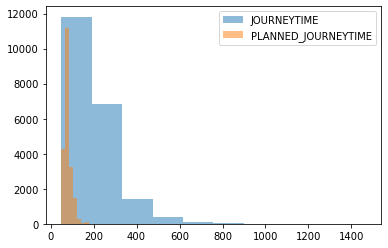

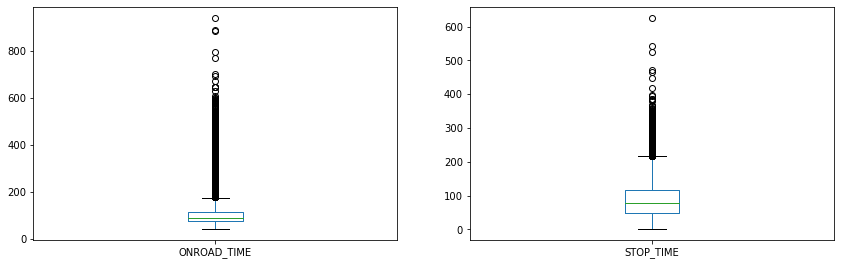

1665_1666


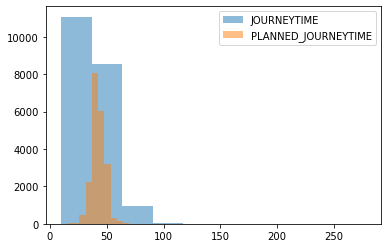

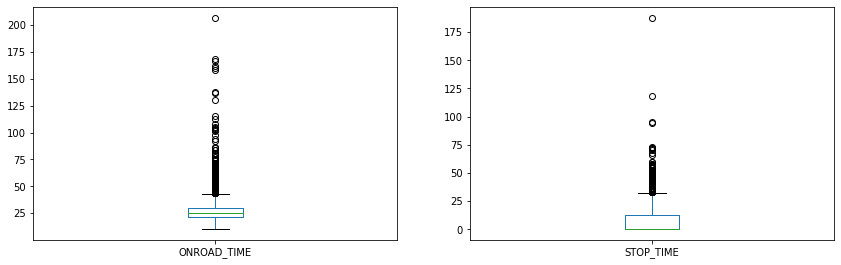

1664_1665


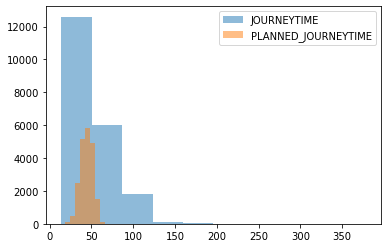

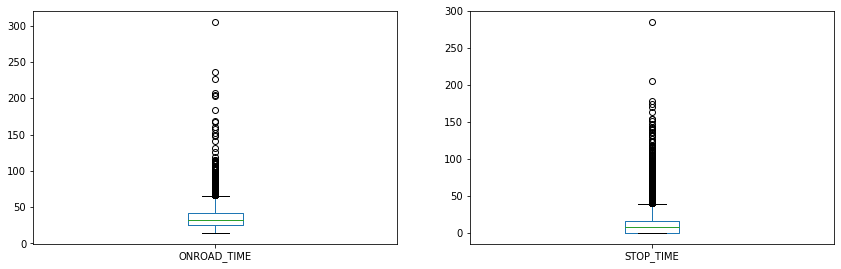

1662_1664


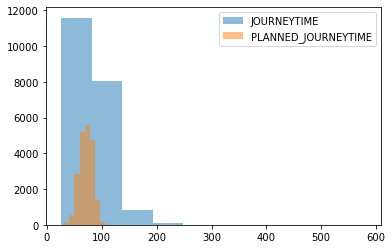

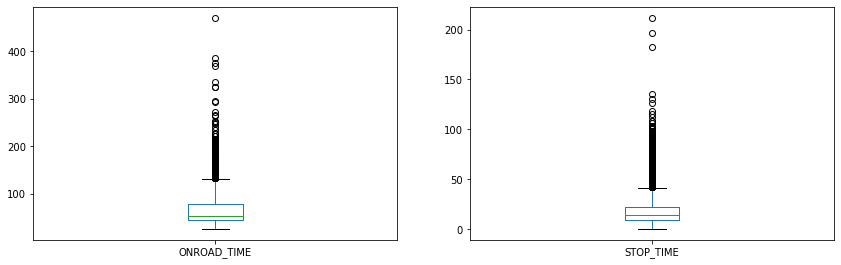

1661_1662


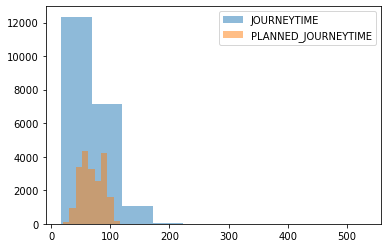

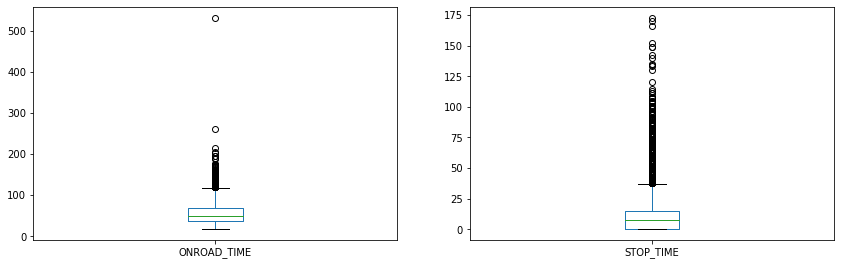

1660_1661


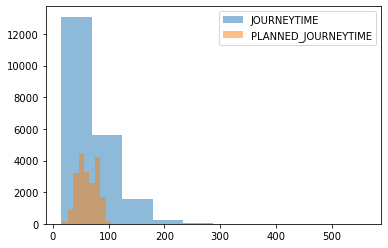

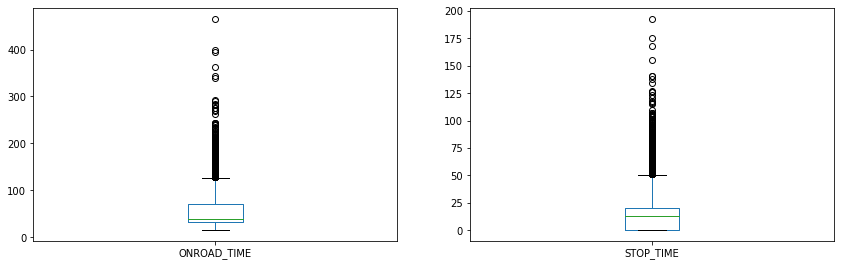

1806_1660


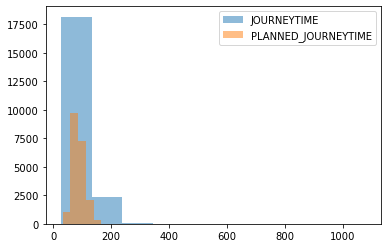

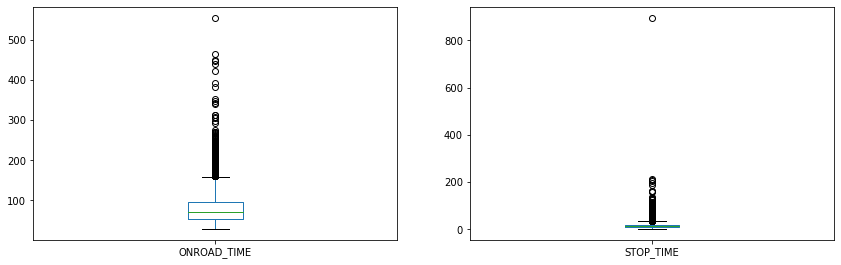

1805_1806


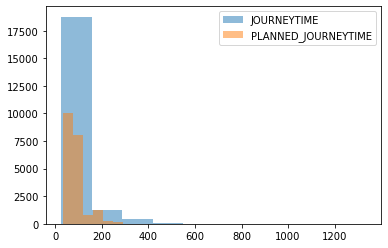

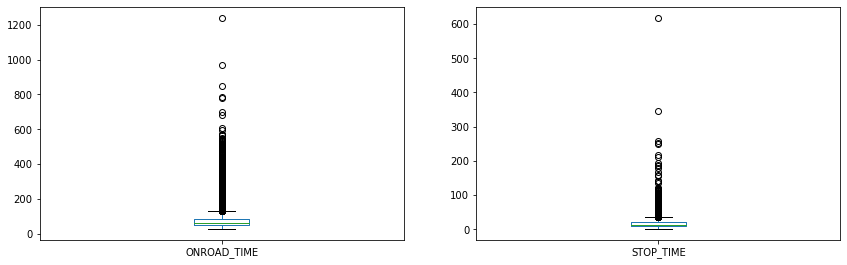

1914_1805


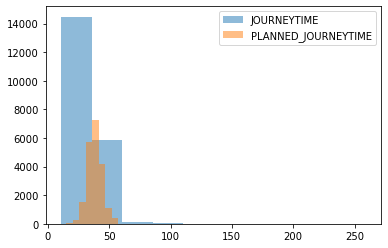

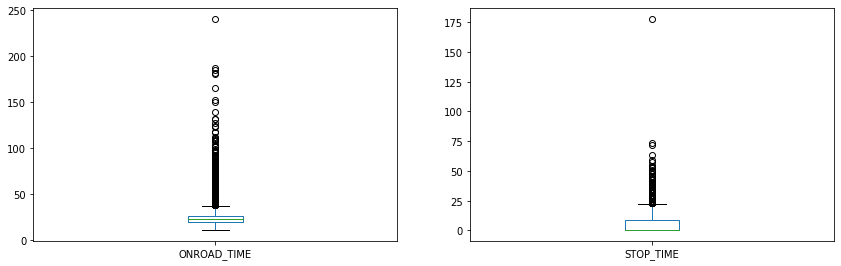

1648_1649


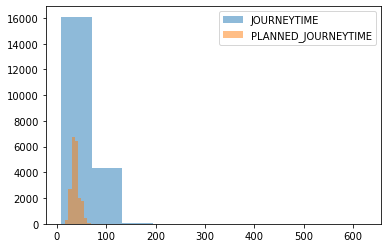

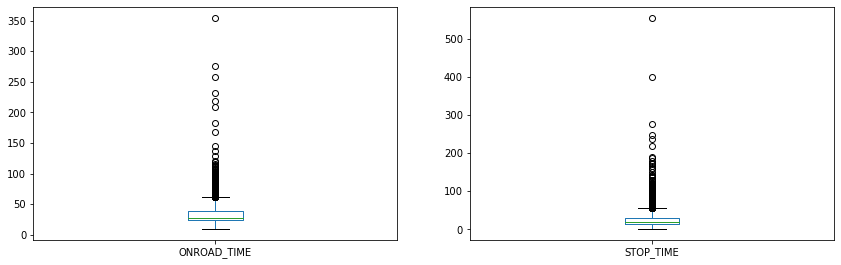

1649_1911


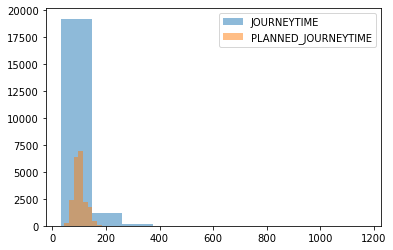

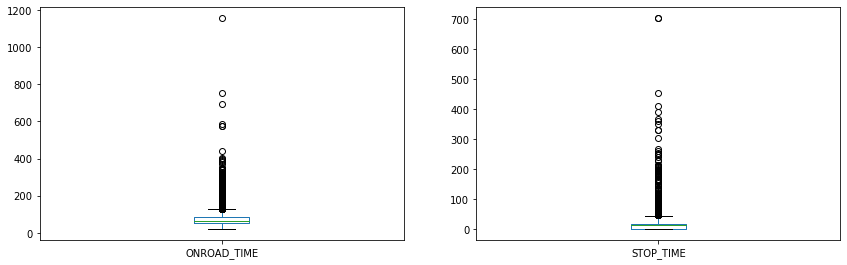

1913_1914


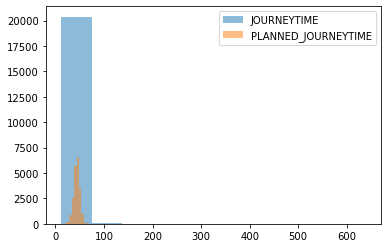

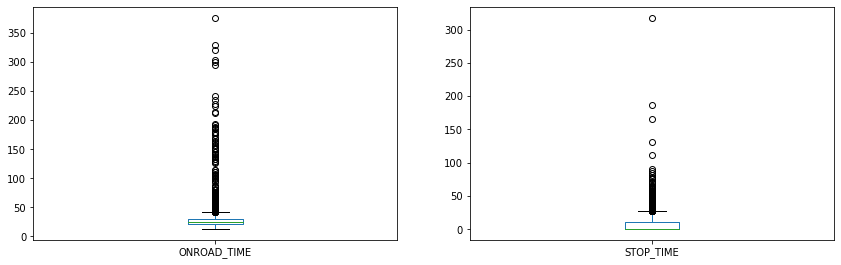

1647_1648


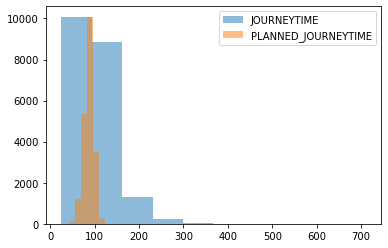

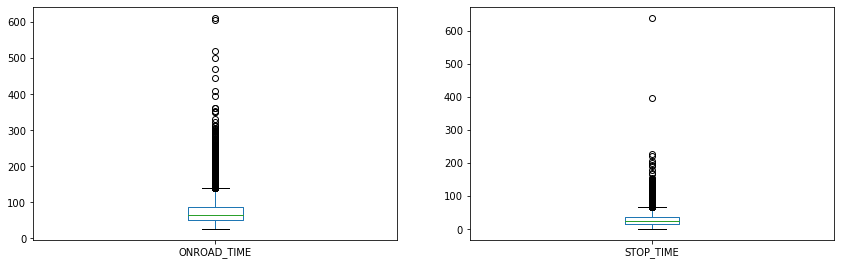

1911_1913


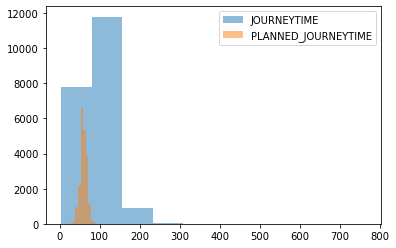

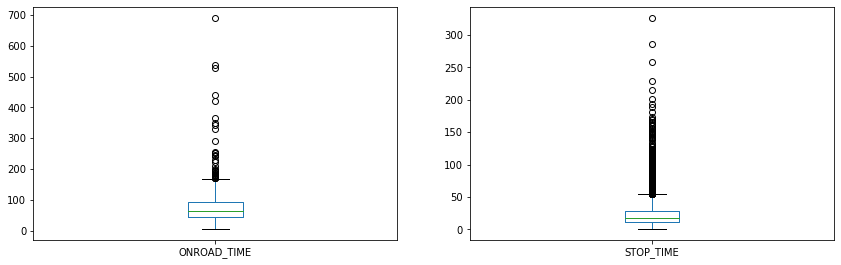

786_793


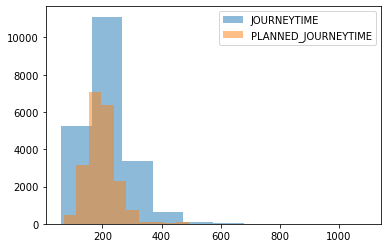

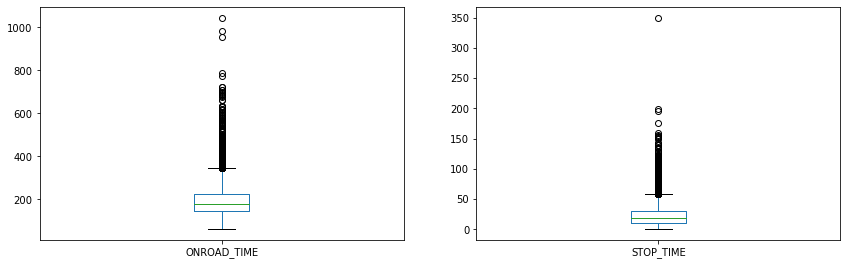

1445_1647


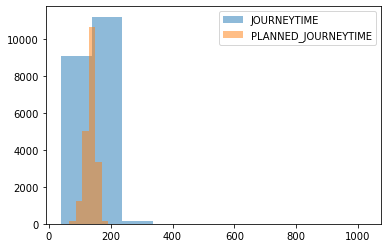

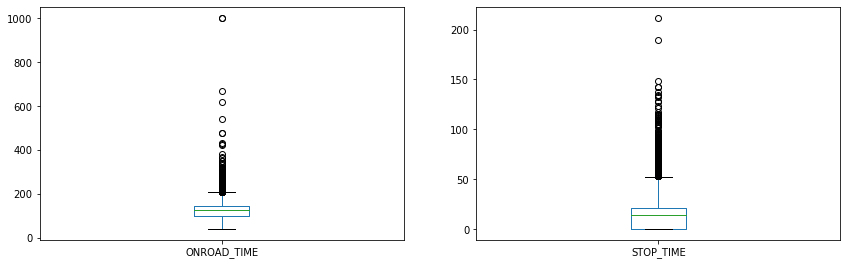

1444_1445


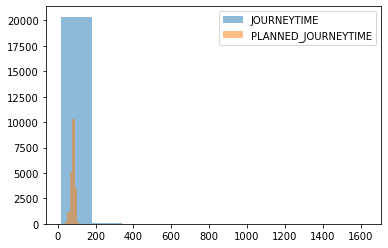

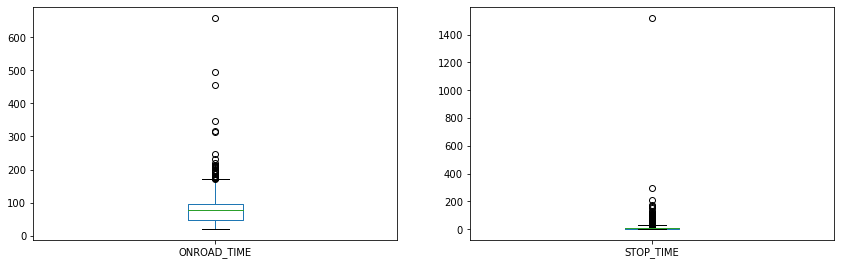

793_7576


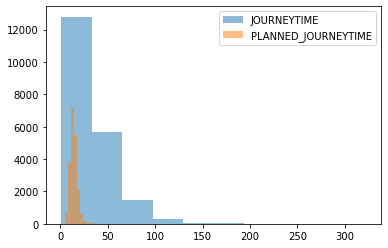

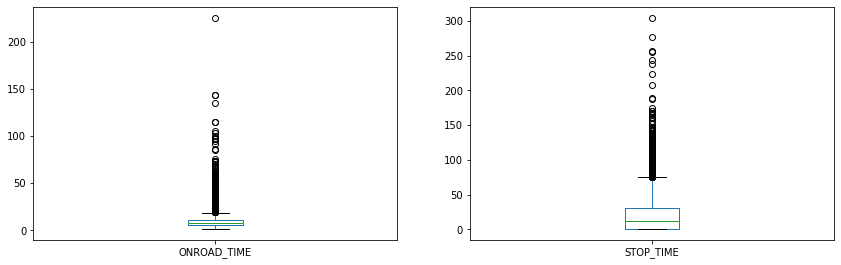

1443_1444


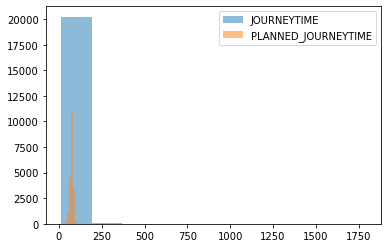

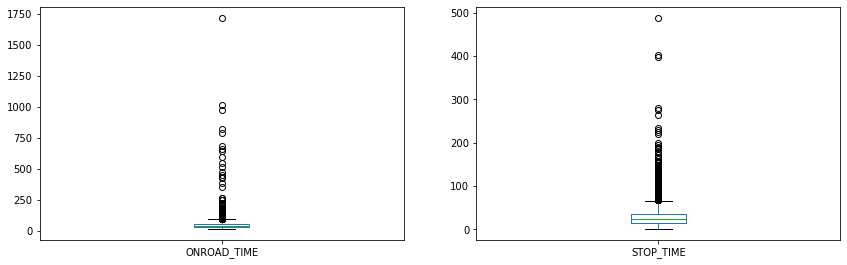

328_1443


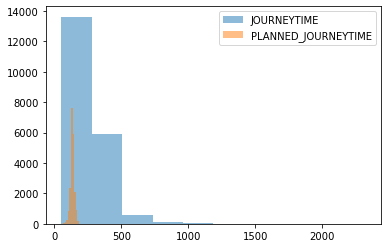

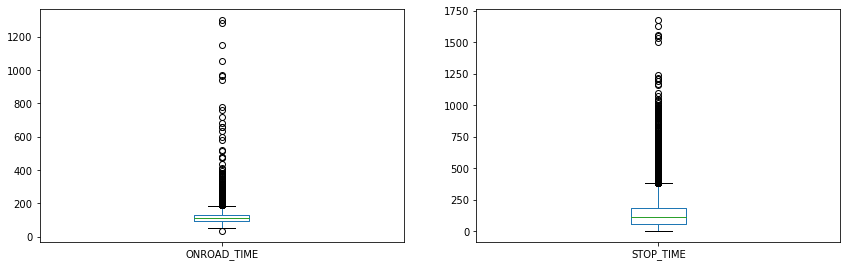

4529_7586


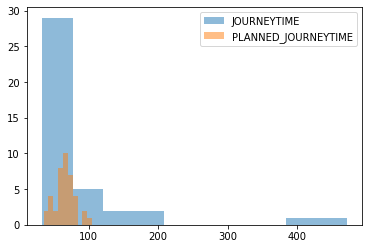

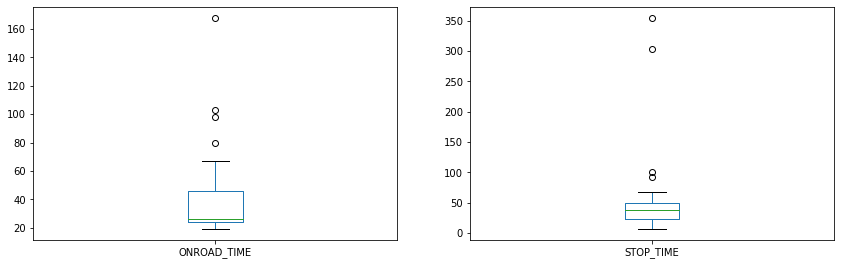

7576_4529


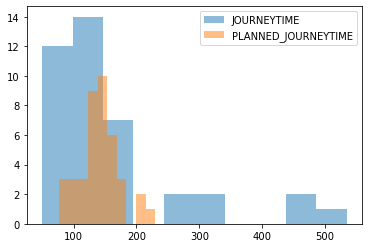

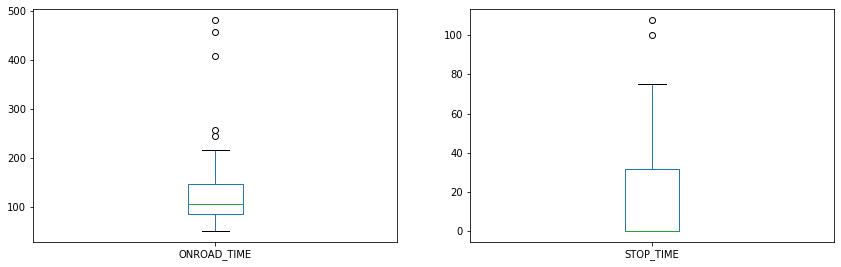

In [17]:
for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
    print(pair)
    
    data = df.loc[(df['STARTSTOP'] == start_end_pairs.loc[i, 'STARTSTOP']) & (df['ENDSTOP'] == start_end_pairs.loc[i, 'ENDSTOP'])]
   
    # before removing outliers
    plt.hist(data['JOURNEYTIME'], alpha=0.5, label='JOURNEYTIME')
    plt.hist(data['PLANNED_JOURNEYTIME'], alpha=0.5, label='PLANNED_JOURNEYTIME')
    plt.legend(loc='upper right')
    
    data[['ONROAD_TIME', 'STOP_TIME']].plot(kind='box', subplots=True, figsize=(30,30), layout=(6,4), sharex=False, sharey=False)

    plt.show()

### outliers

In [18]:
for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
    print(pair)
    
    data = df.loc[(df['STARTSTOP'] == start_end_pairs.loc[i, 'STARTSTOP']) & (df['ENDSTOP'] == start_end_pairs.loc[i, 'ENDSTOP'])]
   
    # clean the data
    outliers = data[(data['STOP_TIME'] > np.percentile(data['STOP_TIME'], 98)) | 
                    (data['STOP_TIME'] < np.percentile(data['STOP_TIME'], 1)) |
                    (data['ONROAD_TIME'] > np.percentile(data['ONROAD_TIME'], 98)) |
                    (data['ONROAD_TIME'] < np.percentile(data['ONROAD_TIME'], 1))]

    df.drop(outliers.index, inplace = True)

777_779
773_774
776_777
774_775
772_773
775_776
782_783
781_782
779_780
780_781
771_772
783_784
784_785
770_771
785_786
769_770
767_768
768_769
7587_7588
1877_1878
6109_6110
7161_7162
1876_1877
1875_1876
1872_1873
1873_1874
1874_1875
1871_1872
1899_6107
6108_6109
1879_1899
1878_1879
6107_6108
1870_1871
7029_7038
7160_7047
7020_7029
1869_1870
7047_7161
7038_7011
7586_7587
6110_7020
2171_7160
7011_2171
7389_7025
7588_328
1666_1807
4464_1869
1808_7389
1807_7167
7167_1808
7025_4464
1665_1666
1664_1665
1662_1664
1661_1662
1660_1661
1806_1660
1805_1806
1914_1805
1648_1649
1649_1911
1913_1914
1647_1648
1911_1913
786_793
1445_1647
1444_1445
793_7576
1443_1444
328_1443
4529_7586
7576_4529


In [19]:
df[['JOURNEYTIME', 'PLANNED_JOURNEYTIME', 'STOP_TIME', 'ONROAD_TIME']].describe().T

,count,mean,std,min,25%,50%,75%,max
JOURNEYTIME,1400385.0,71.236099,59.256162,2.0,36.0,54.0,84.0,669.0
PLANNED_JOURNEYTIME,1400385.0,63.661119,57.297579,5.0,31.0,46.0,71.0,865.0
STOP_TIME,1400385.0,13.501405,23.691253,0.0,0.0,11.0,17.0,488.0
ONROAD_TIME,1400385.0,57.734694,50.164185,2.0,28.0,41.0,69.0,638.0


777_779


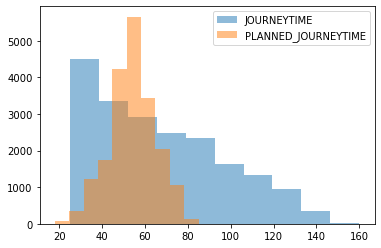

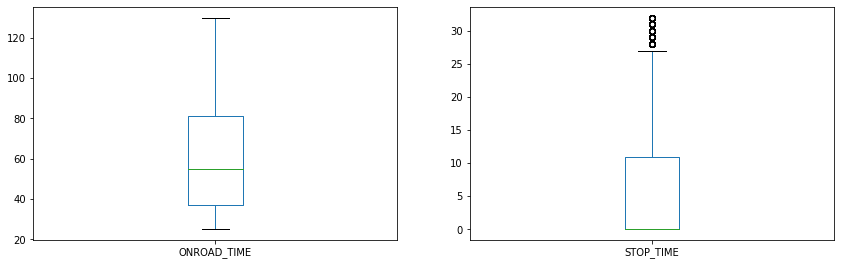

773_774


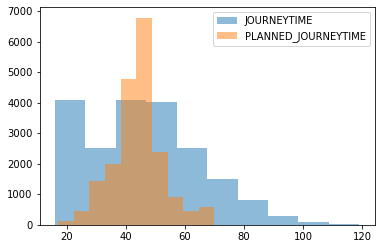

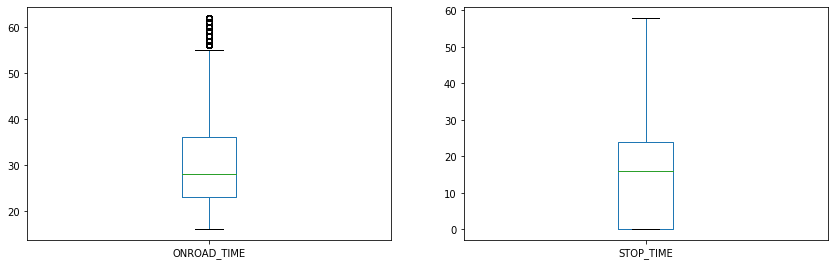

776_777


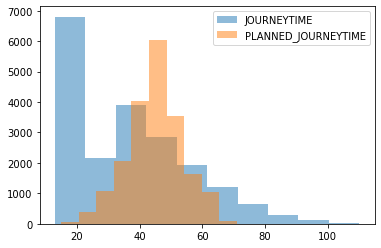

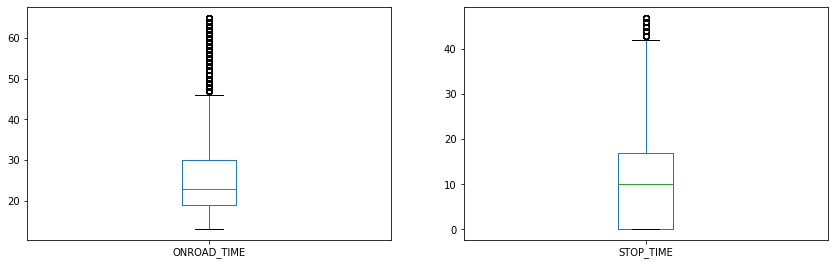

774_775


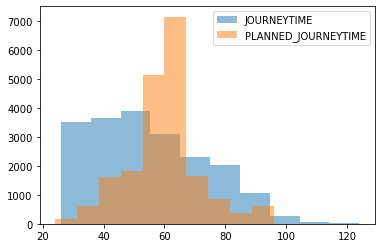

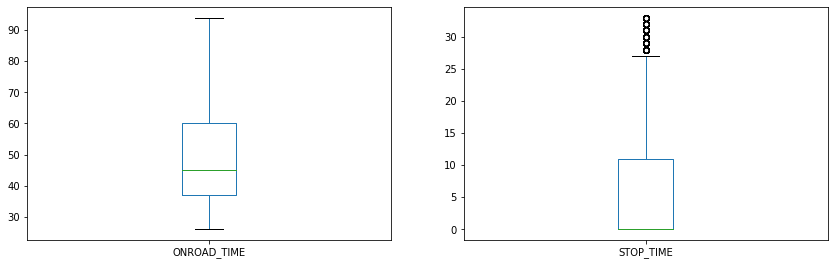

772_773


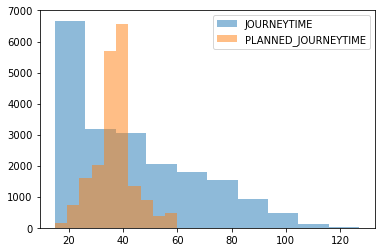

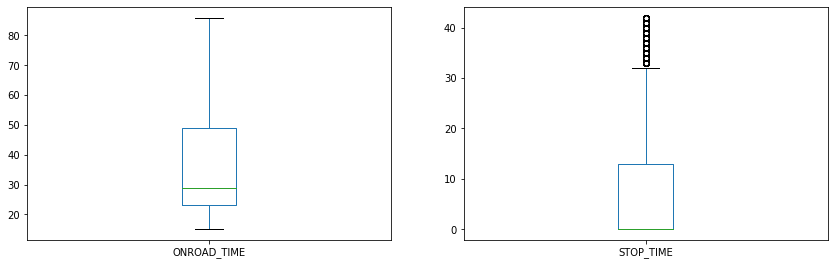

775_776


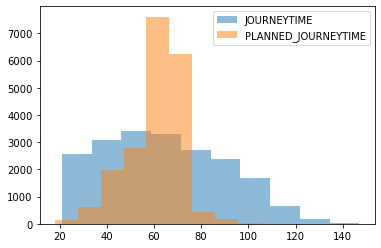

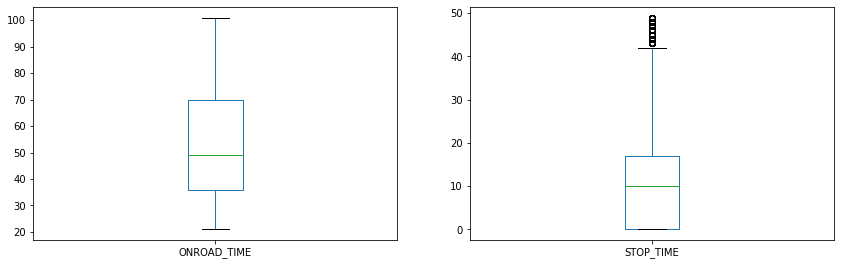

782_783


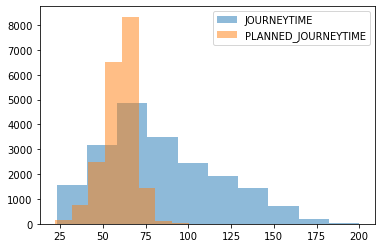

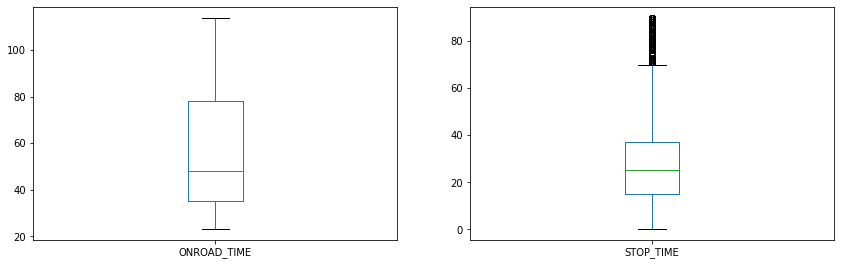

781_782


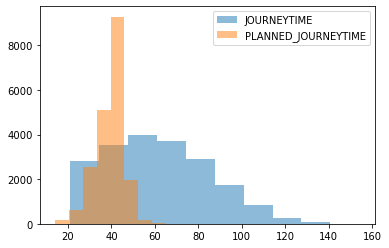

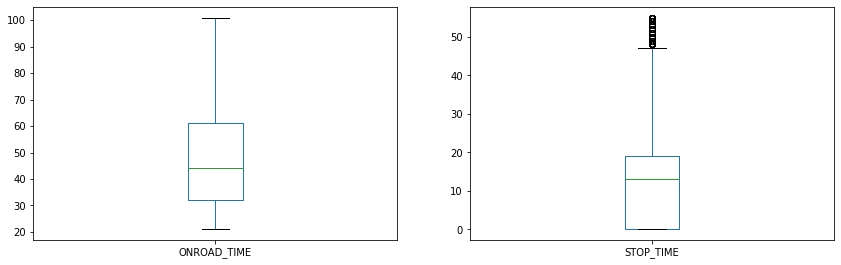

779_780


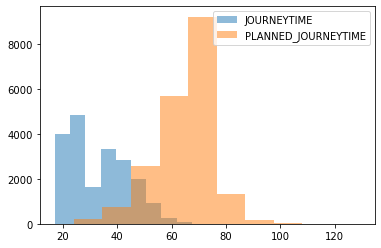

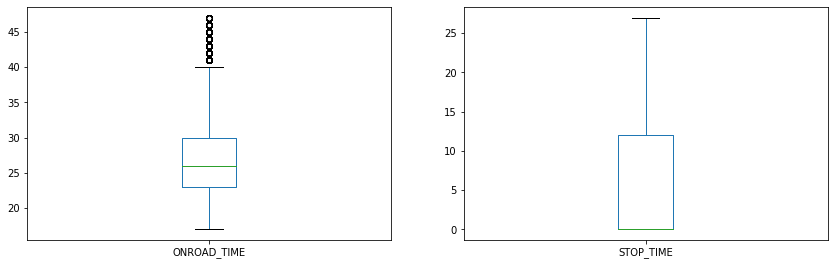

780_781


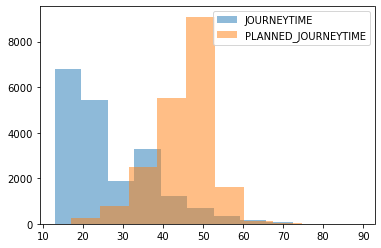

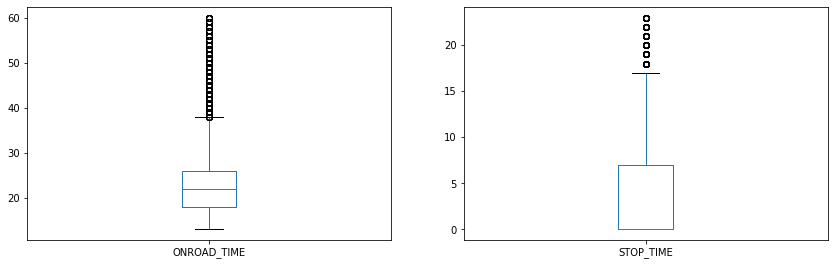

771_772


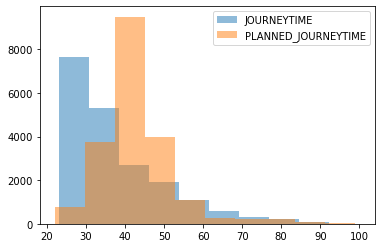

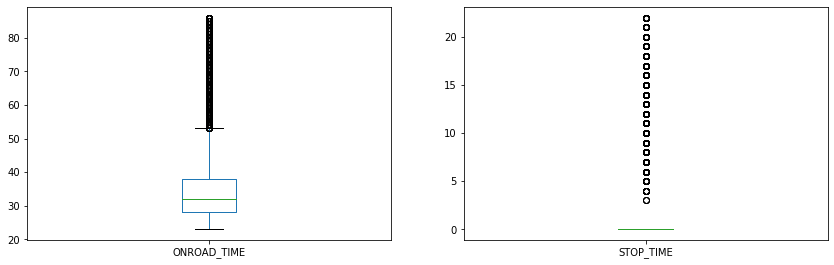

783_784


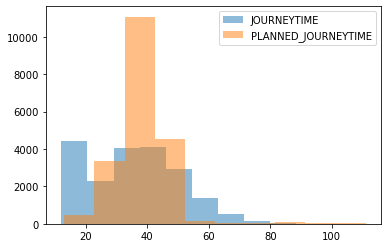

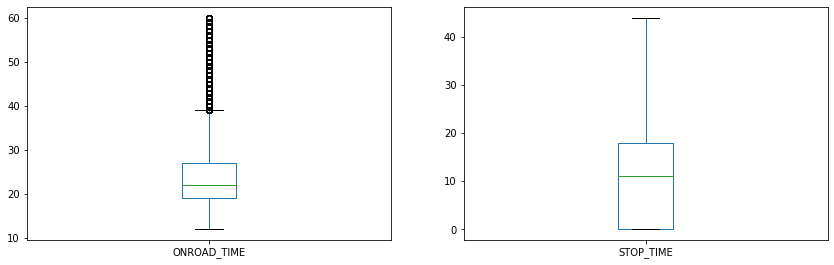

784_785


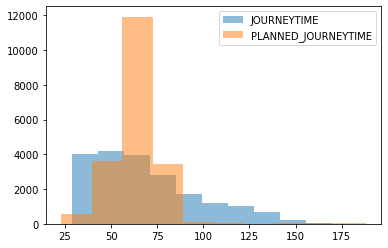

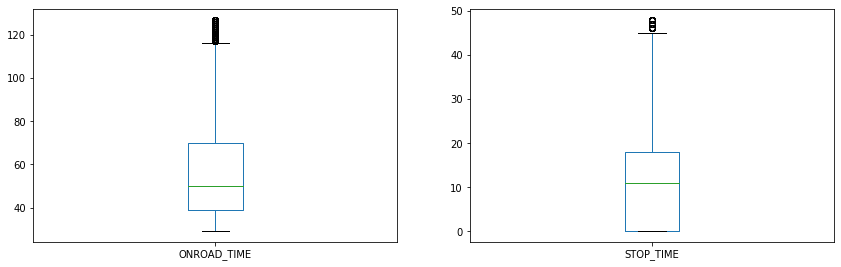

770_771


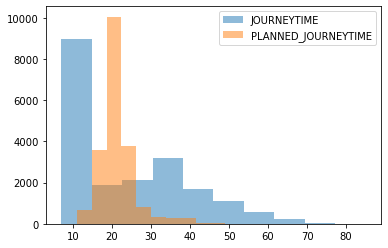

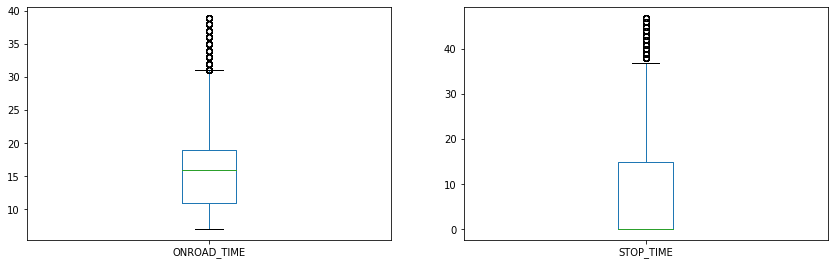

785_786


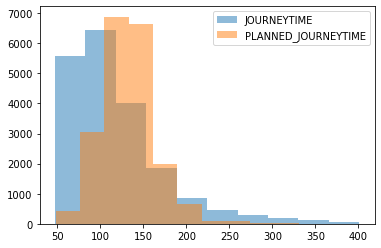

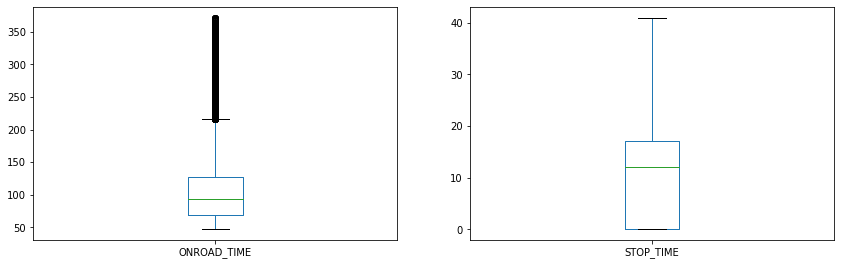

769_770


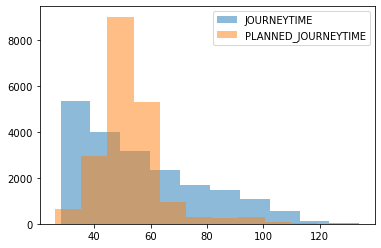

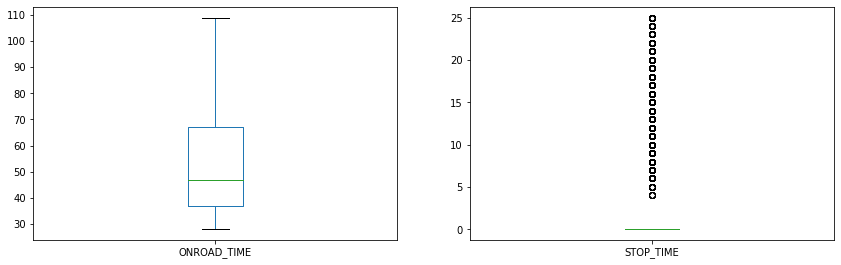

767_768


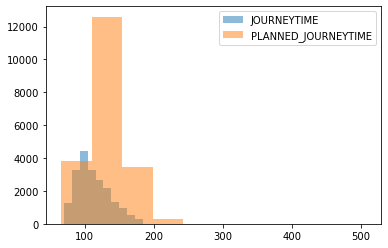

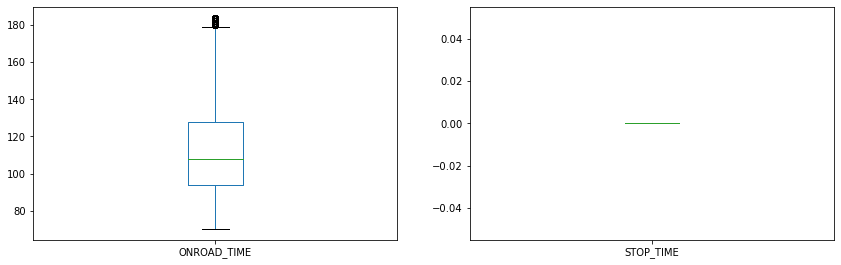

768_769


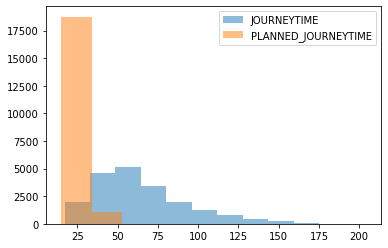

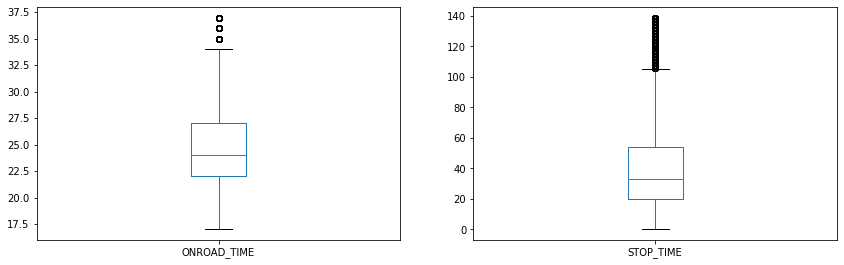

7587_7588


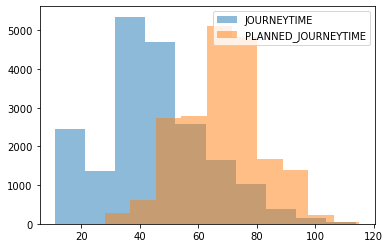

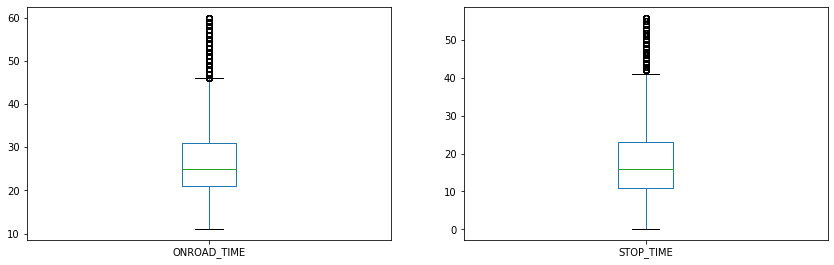

1877_1878


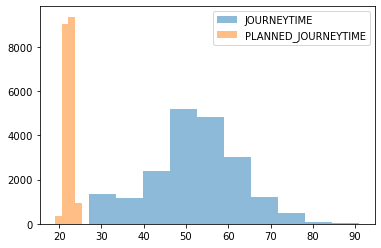

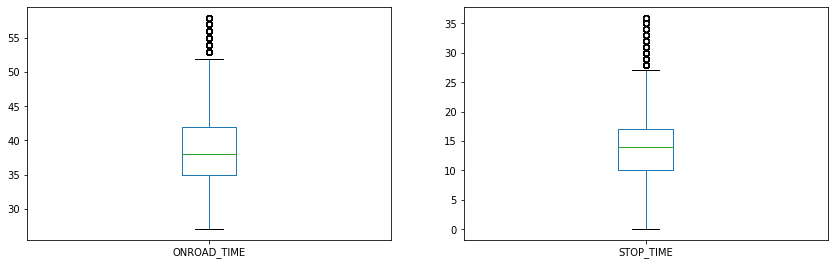

6109_6110


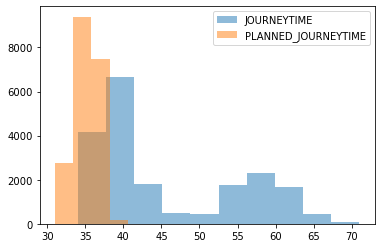

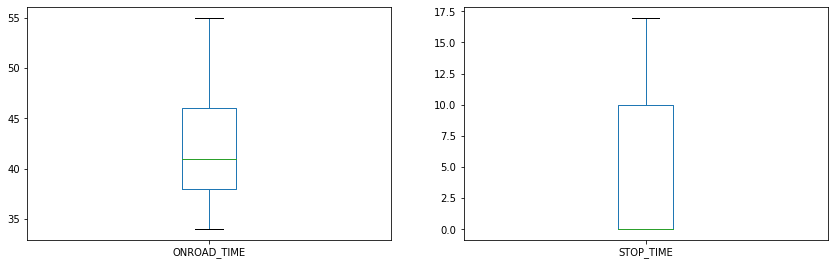

7161_7162


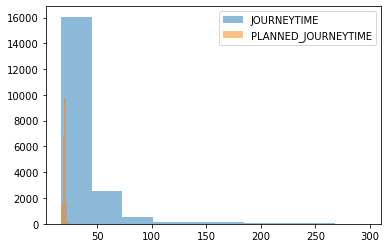

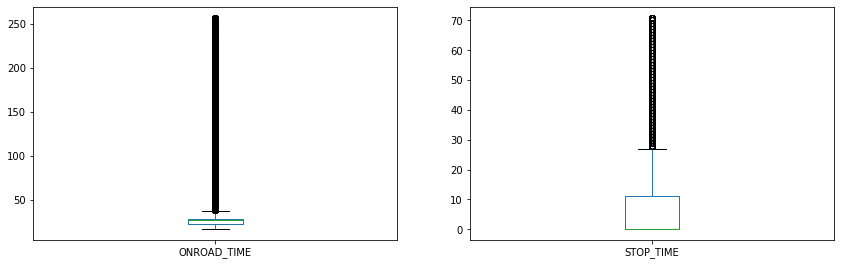

1876_1877


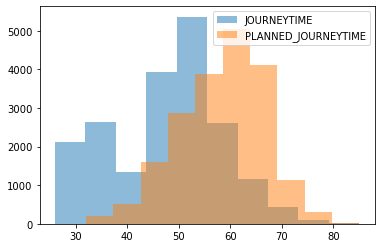

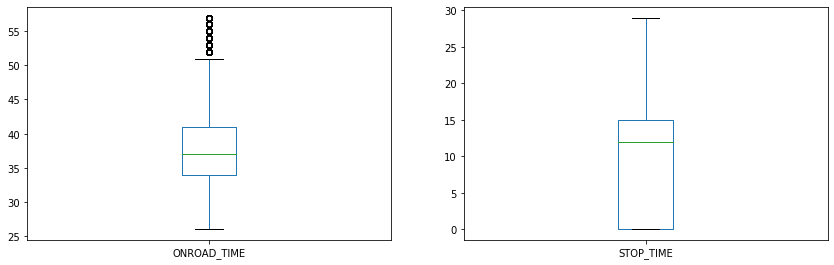

1875_1876


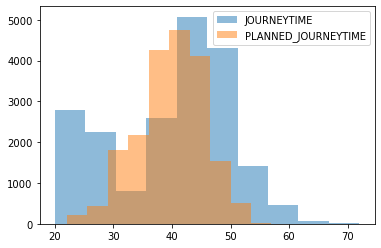

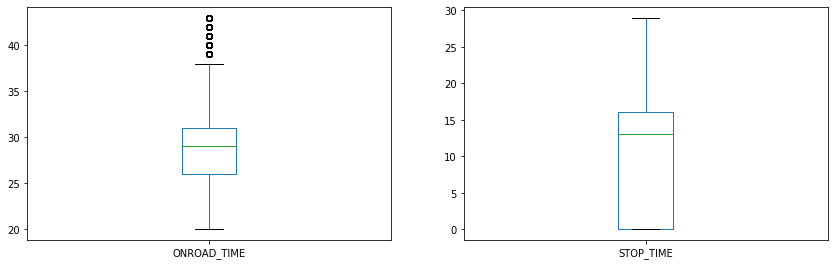

1872_1873


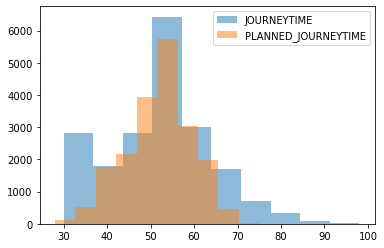

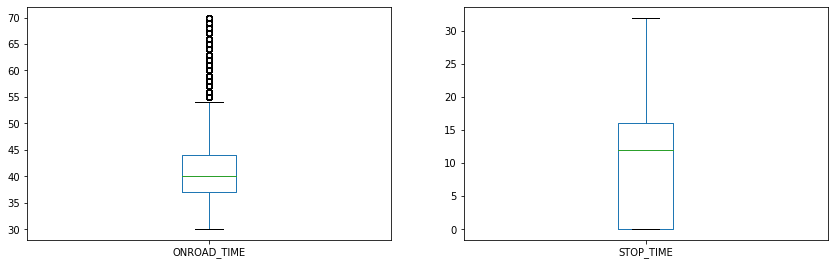

1873_1874


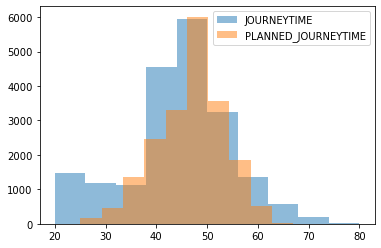

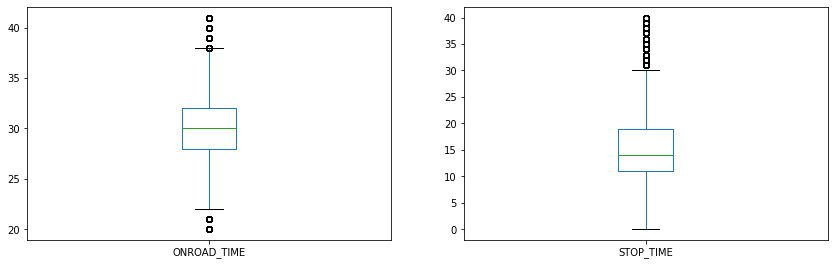

1874_1875


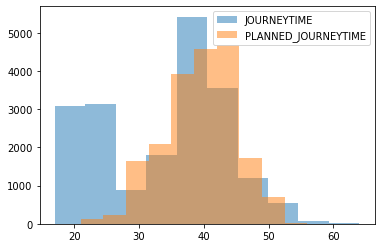

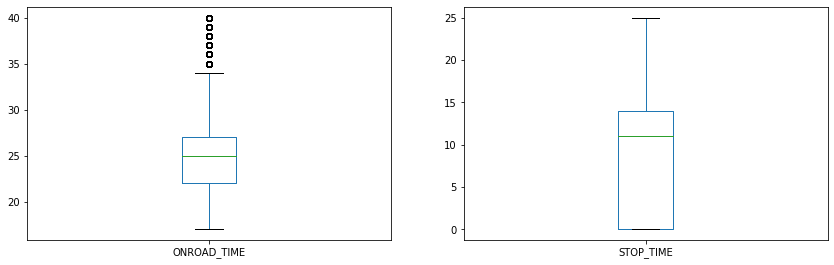

1871_1872


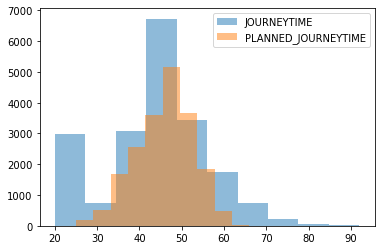

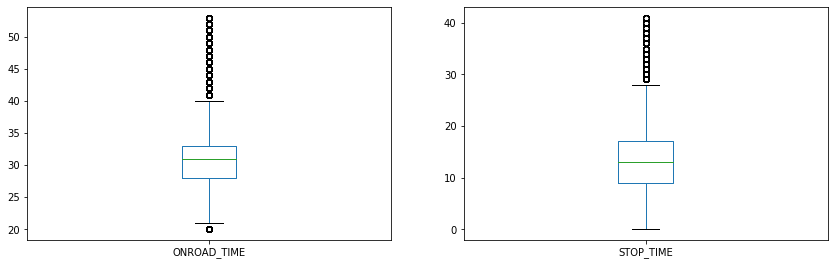

1899_6107


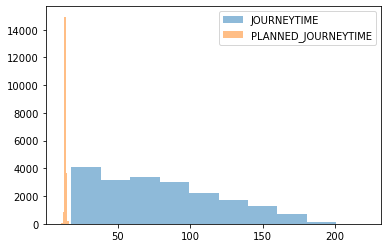

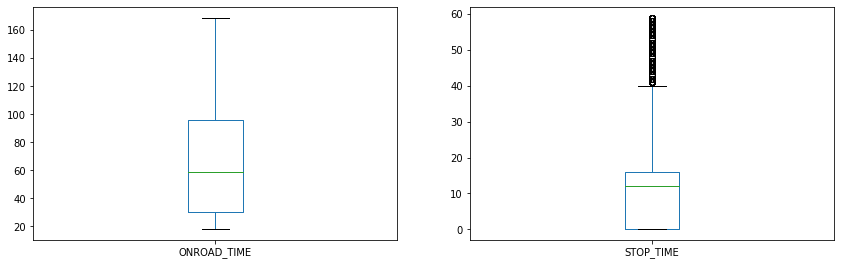

6108_6109


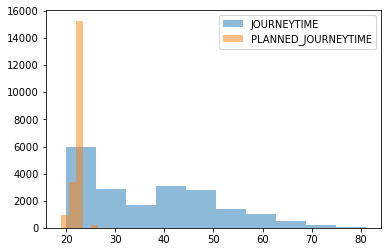

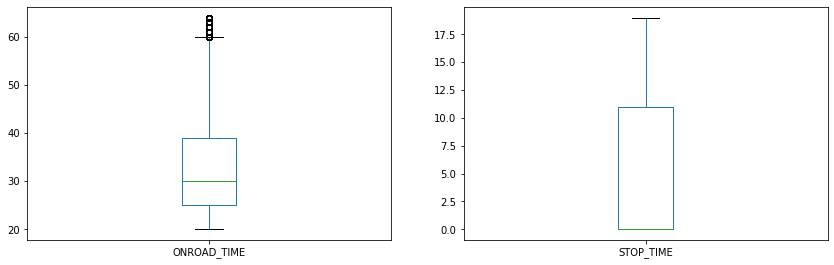

1879_1899


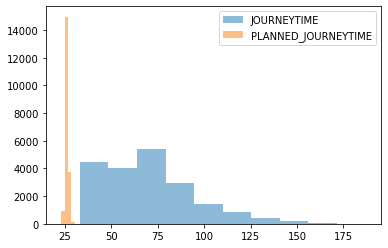

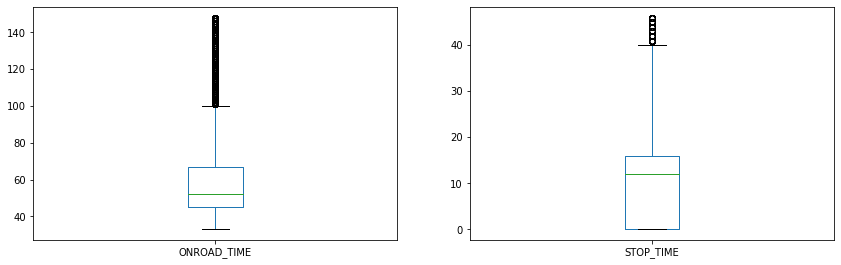

1878_1879


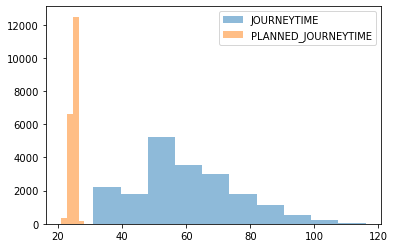

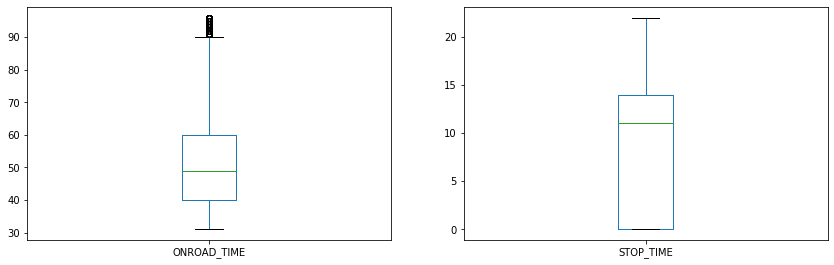

6107_6108


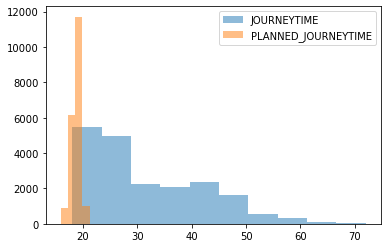

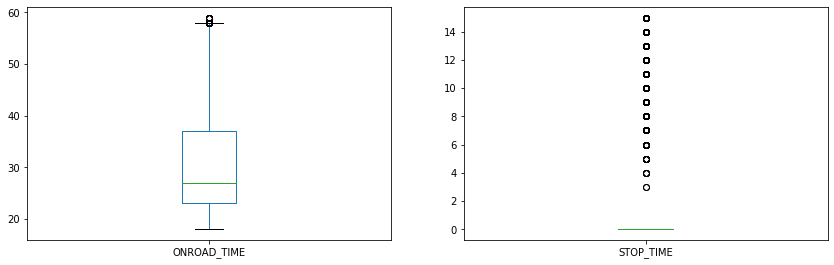

1870_1871


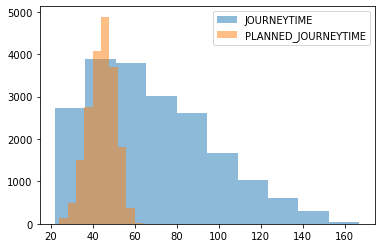

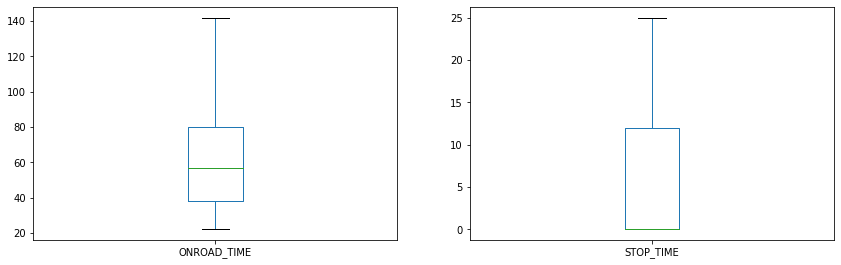

7029_7038


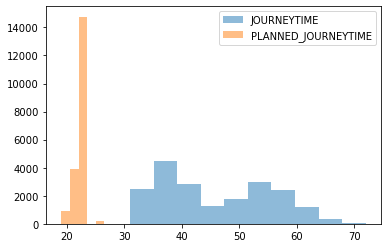

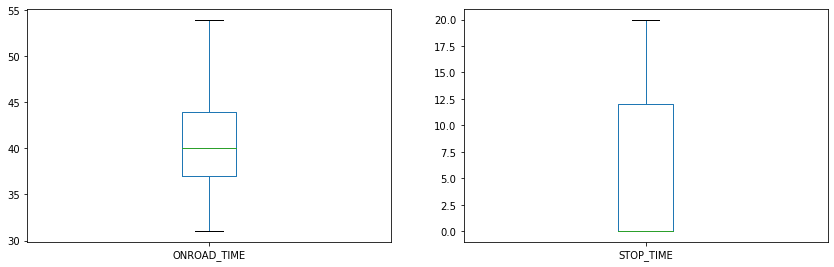

7160_7047


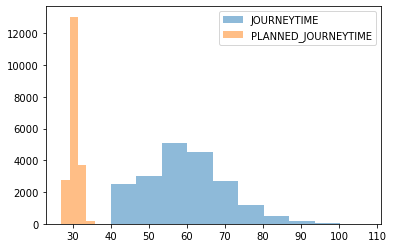

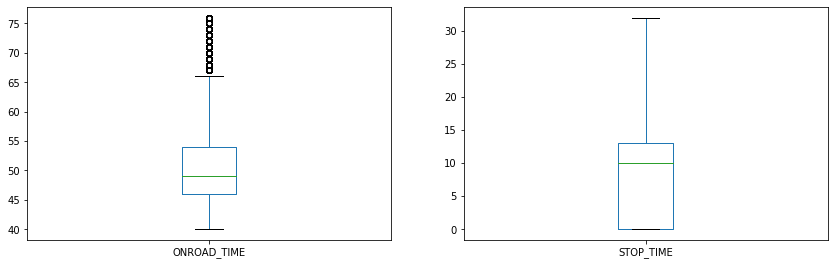

7020_7029


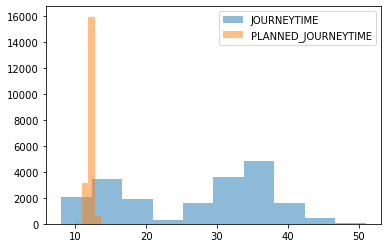

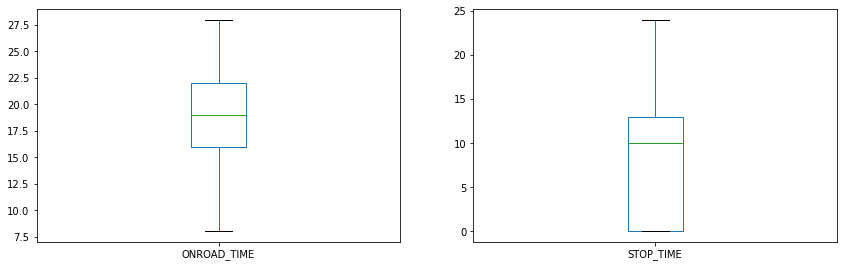

1869_1870


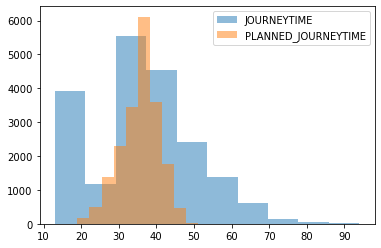

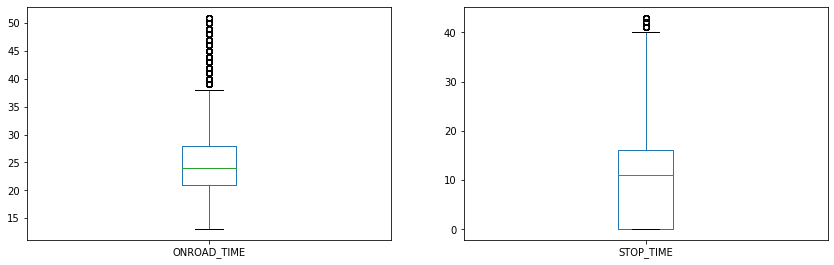

7047_7161


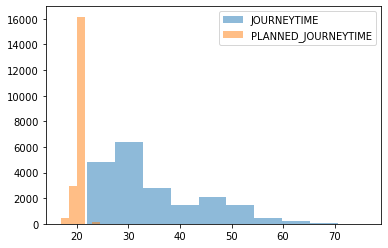

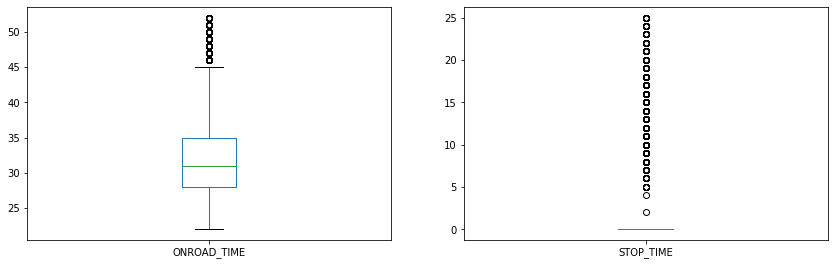

7038_7011


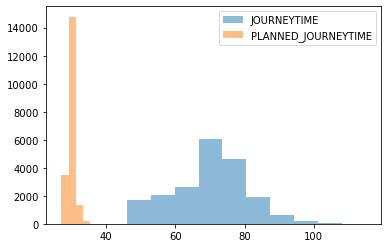

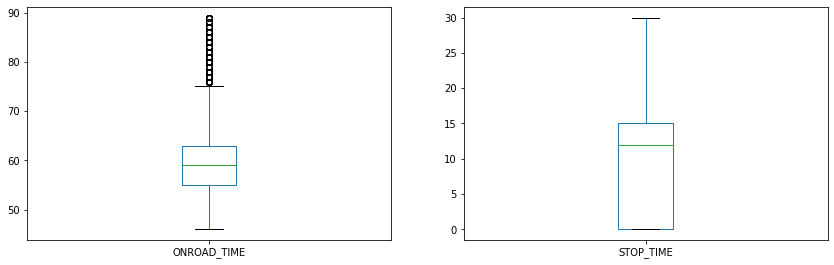

7586_7587


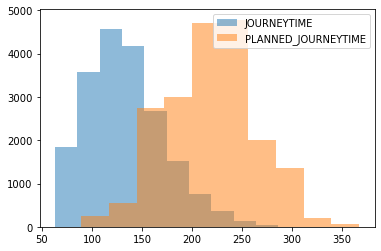

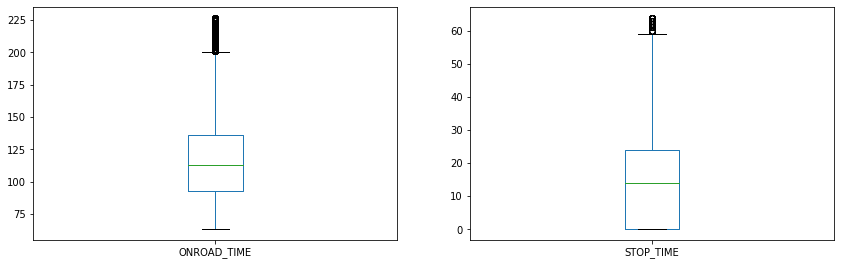

6110_7020


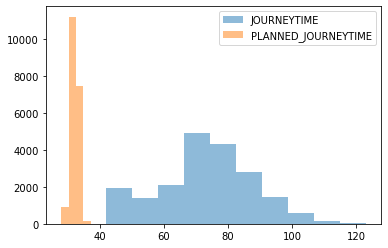

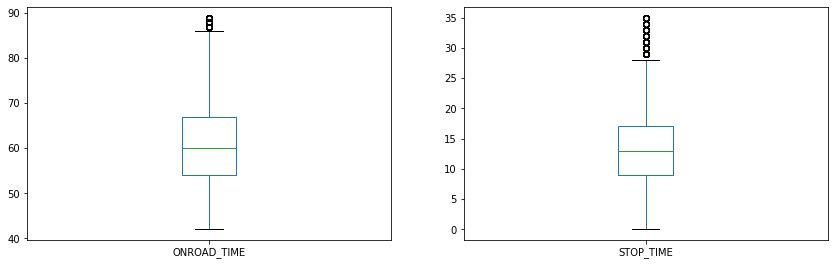

2171_7160


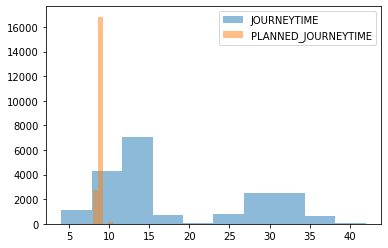

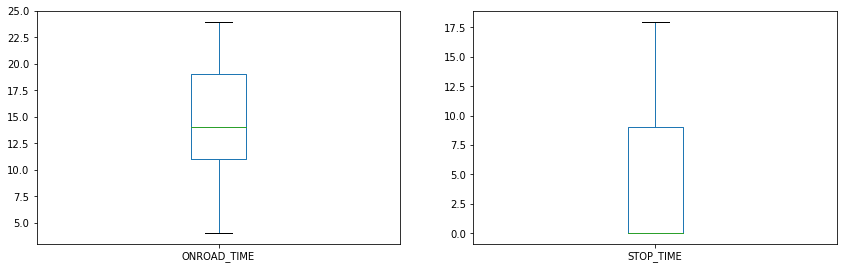

7011_2171


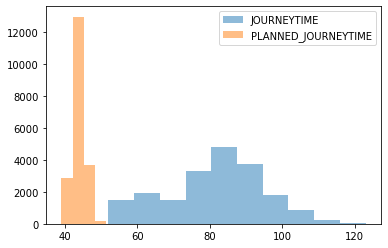

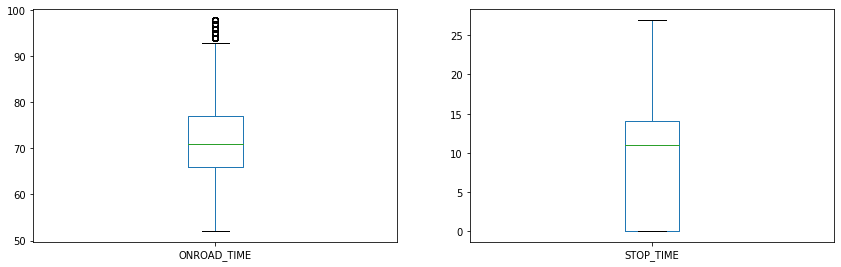

7389_7025


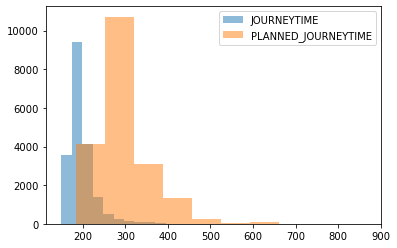

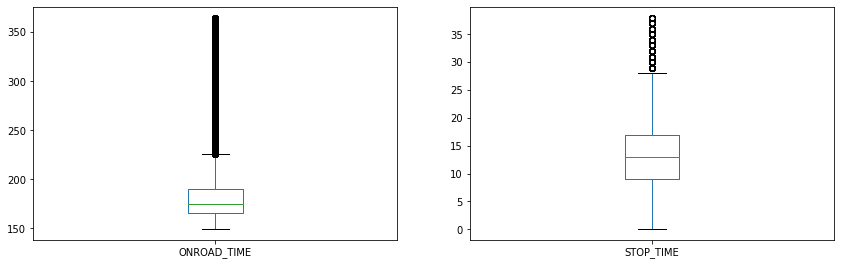

7588_328


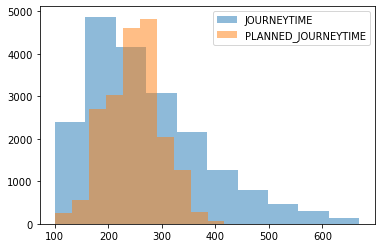

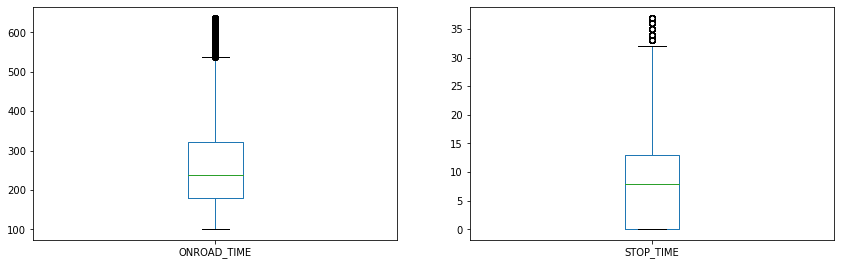

1666_1807


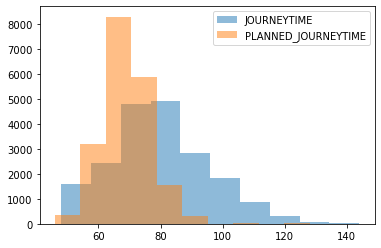

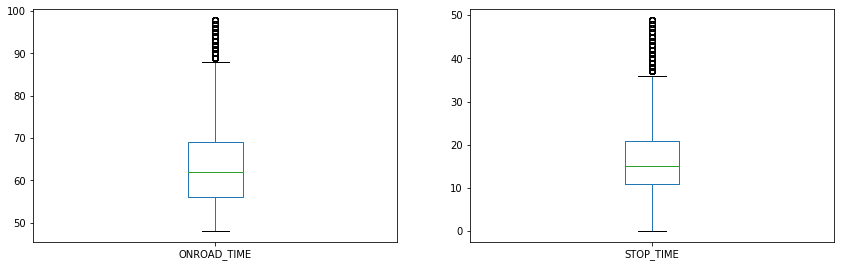

4464_1869


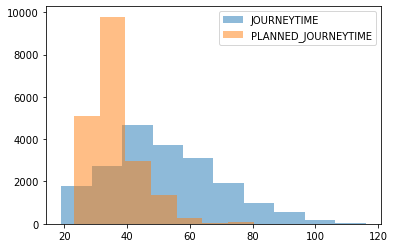

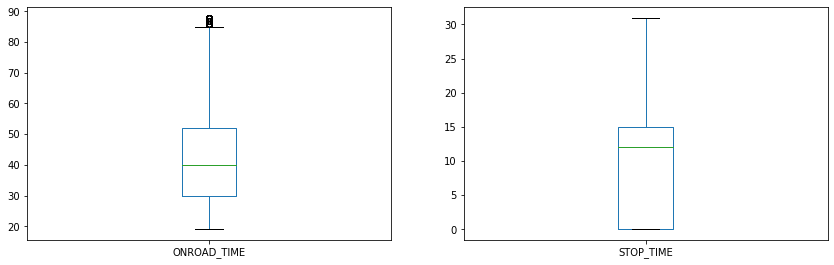

1808_7389


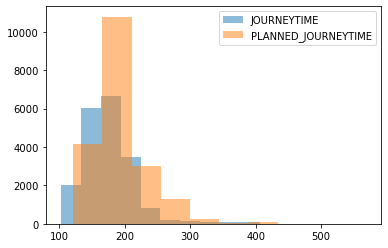

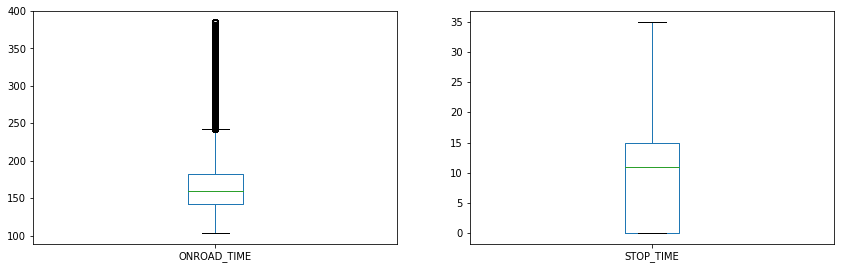

1807_7167


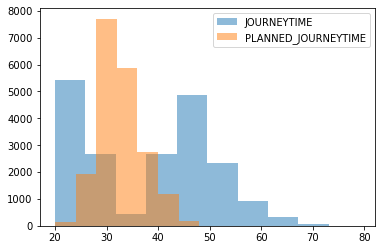

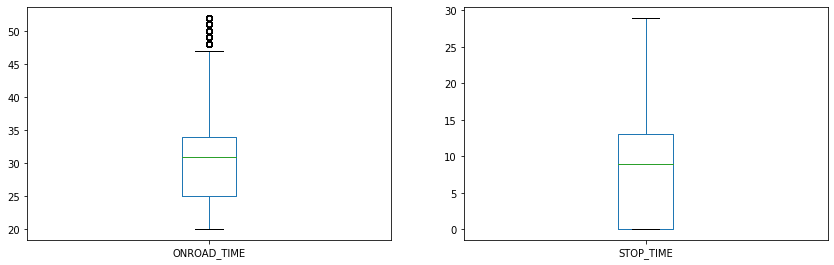

7167_1808


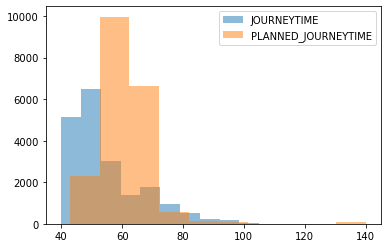

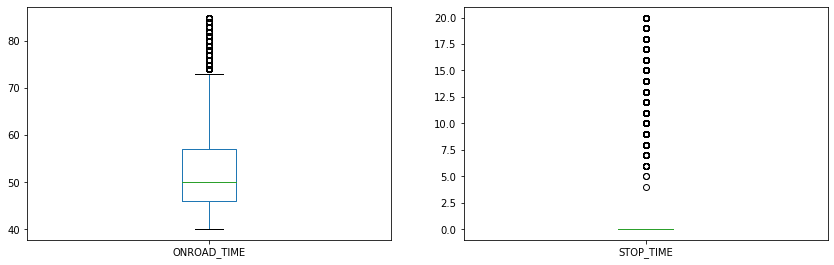

7025_4464


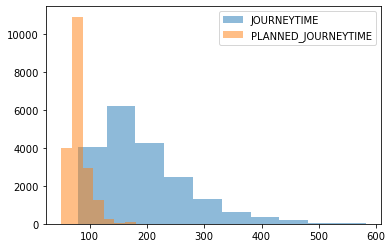

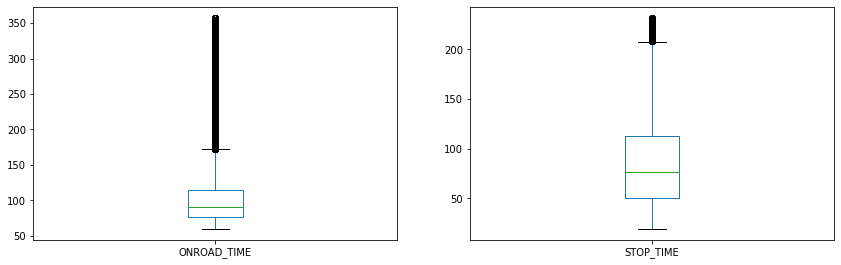

1665_1666


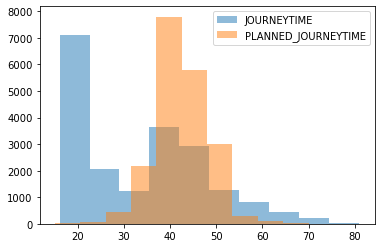

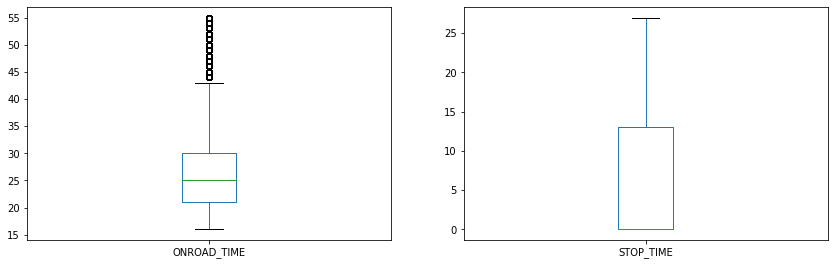

1664_1665


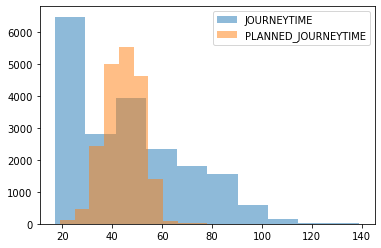

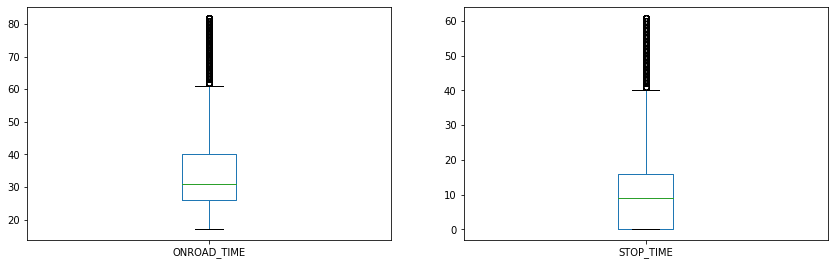

1662_1664


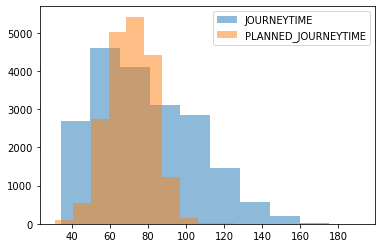

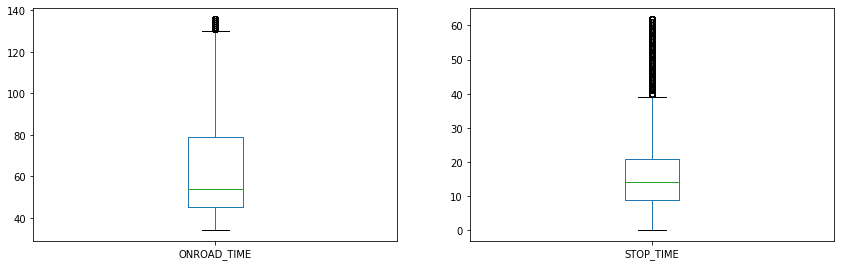

1661_1662


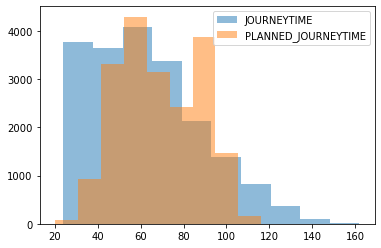

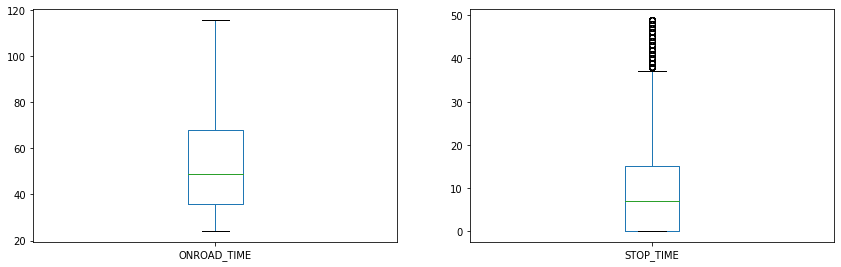

1660_1661


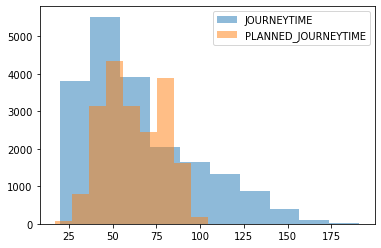

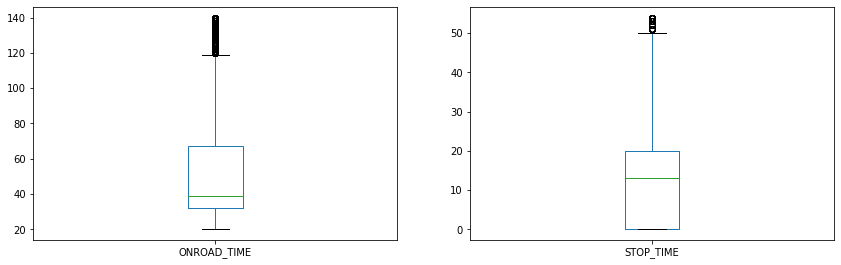

1806_1660


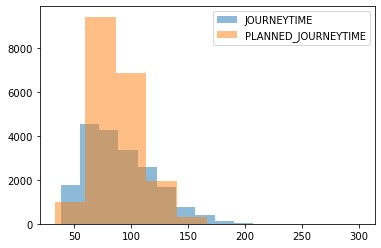

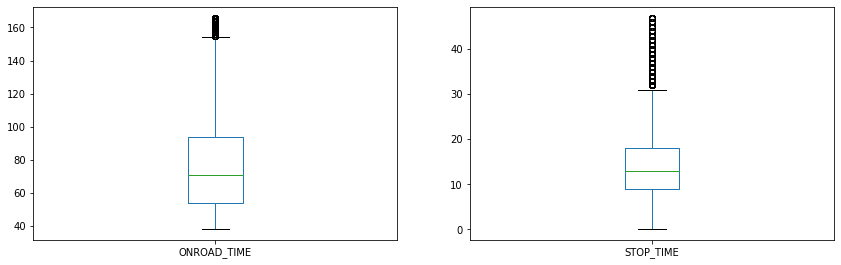

1805_1806


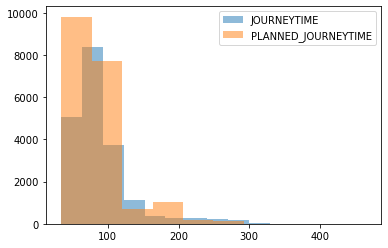

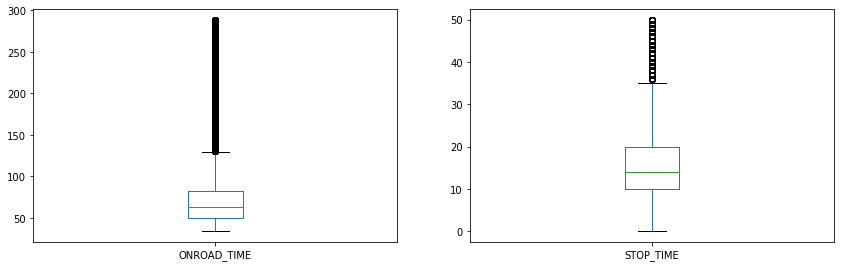

1914_1805


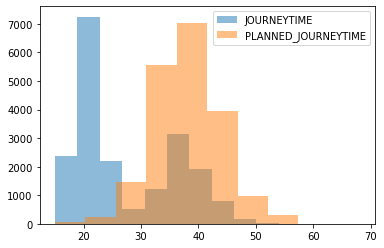

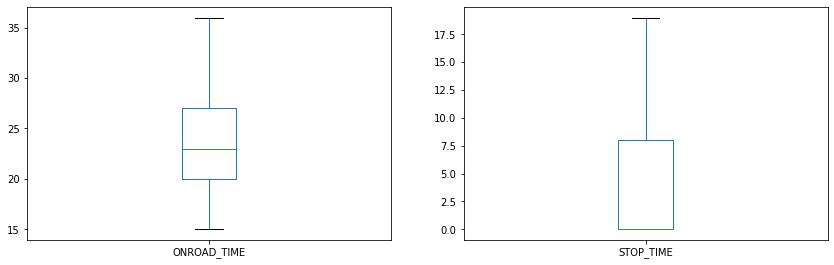

1648_1649


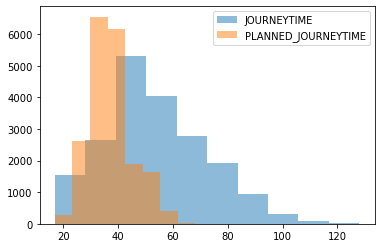

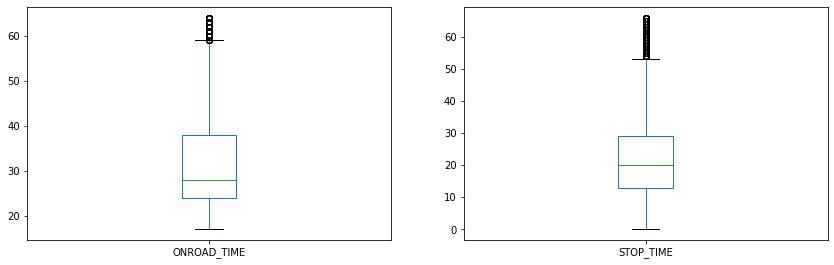

1649_1911


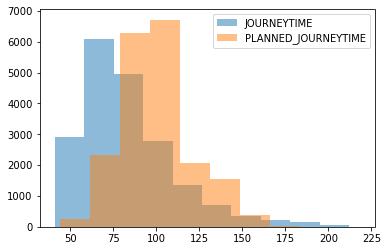

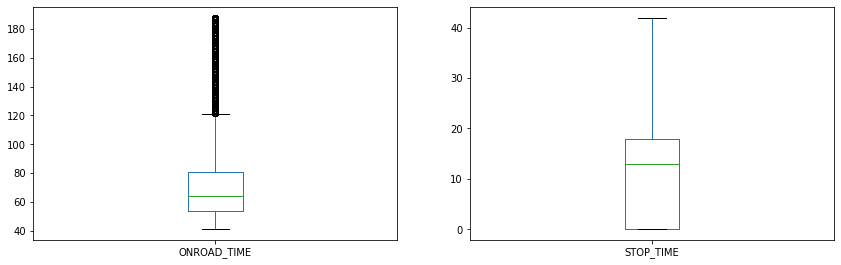

1913_1914


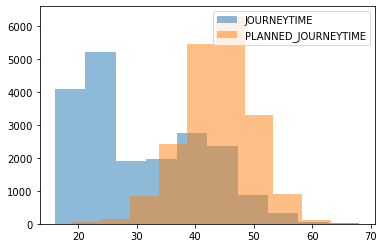

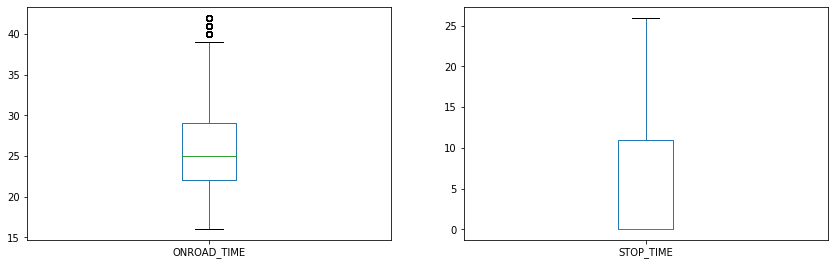

1647_1648


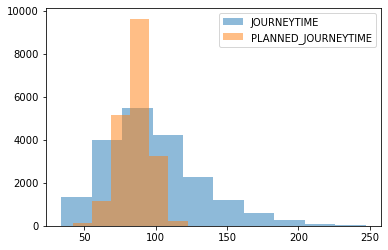

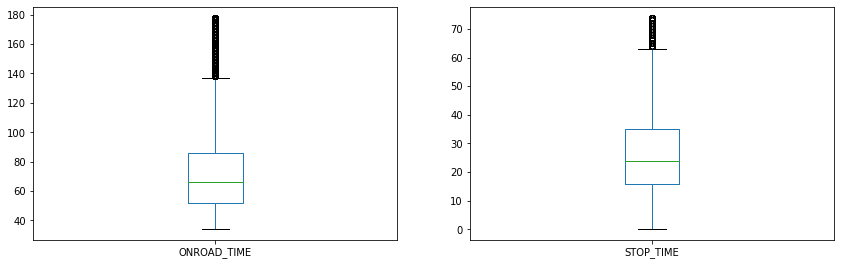

1911_1913


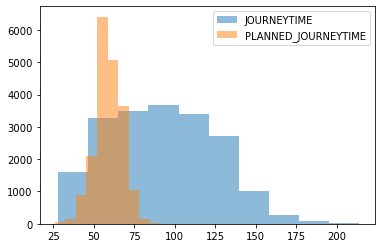

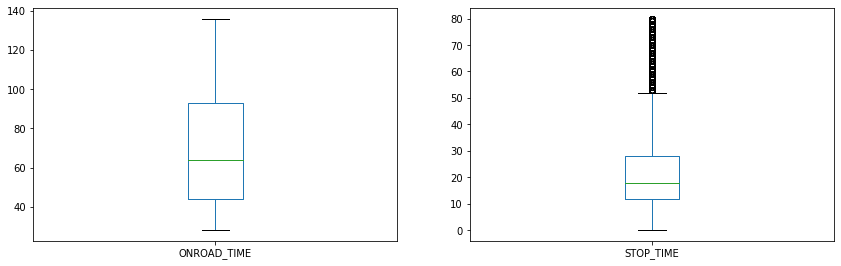

786_793


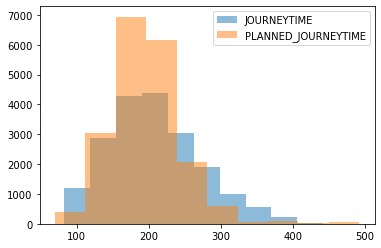

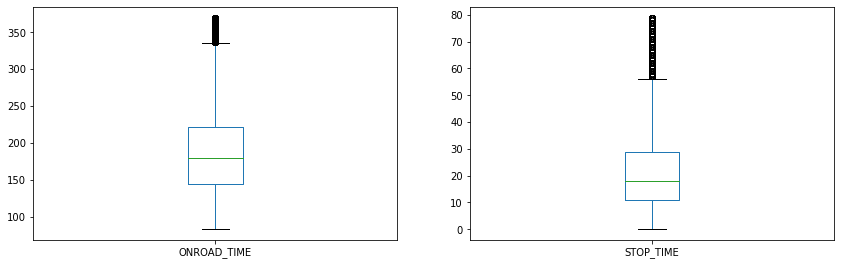

1445_1647


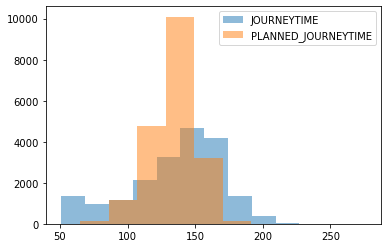

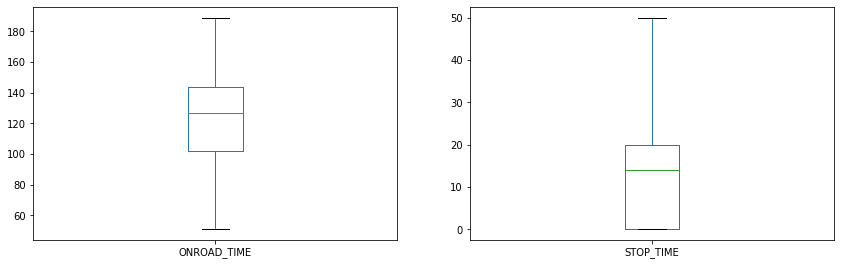

1444_1445


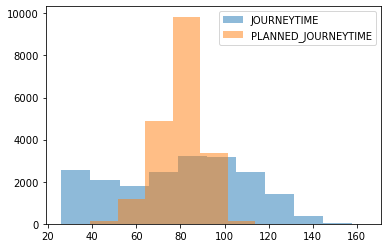

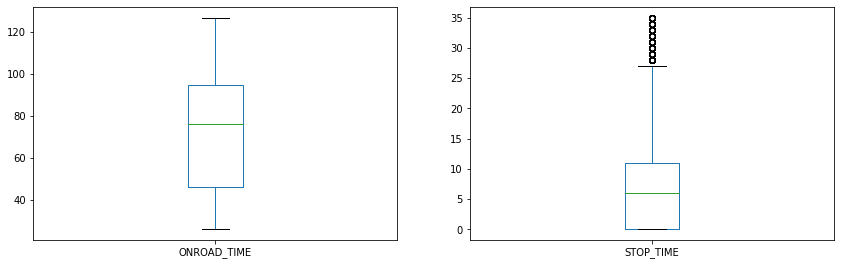

793_7576


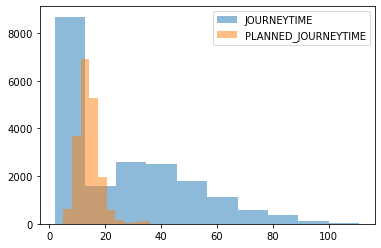

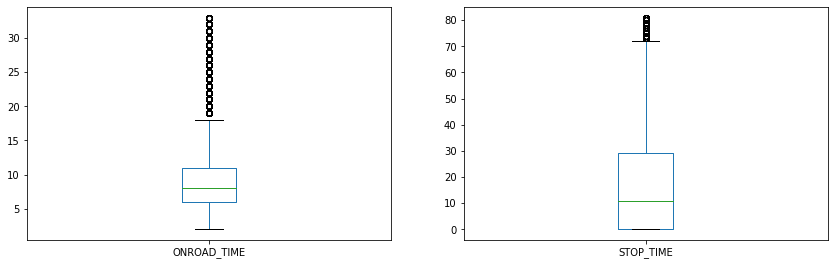

1443_1444


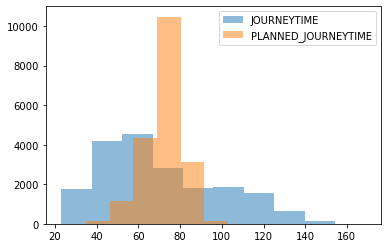

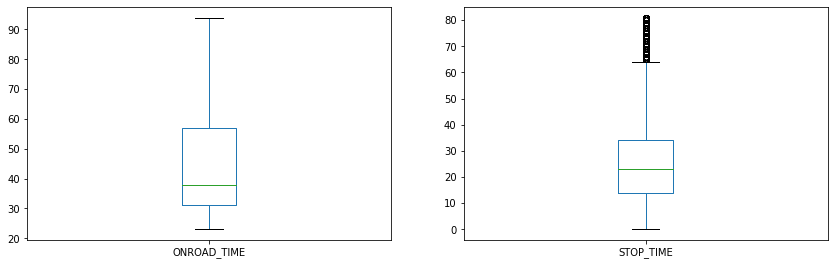

328_1443


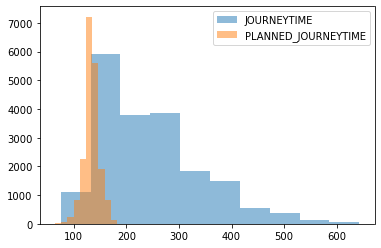

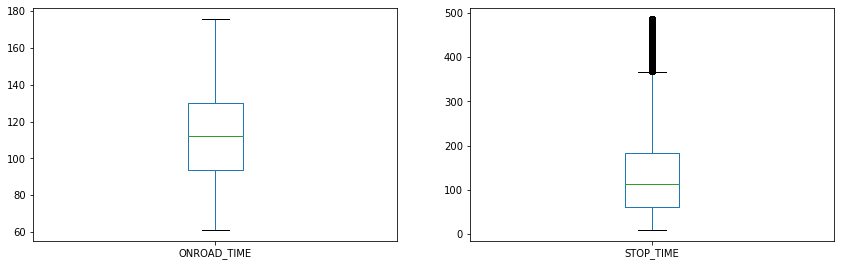

4529_7586


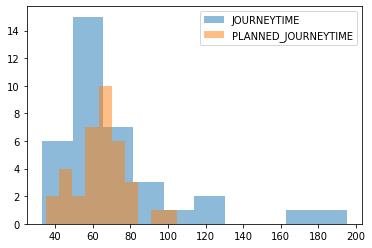

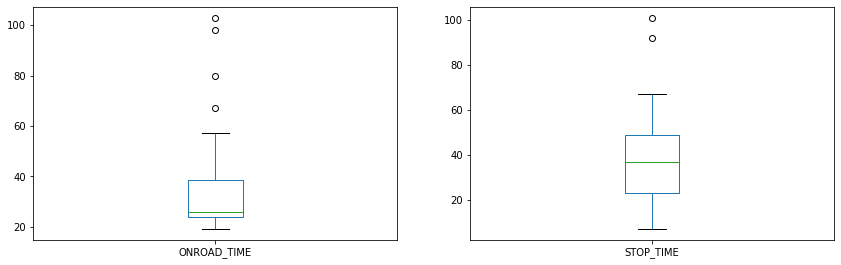

7576_4529


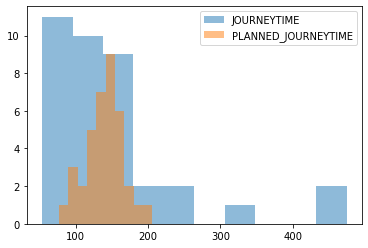

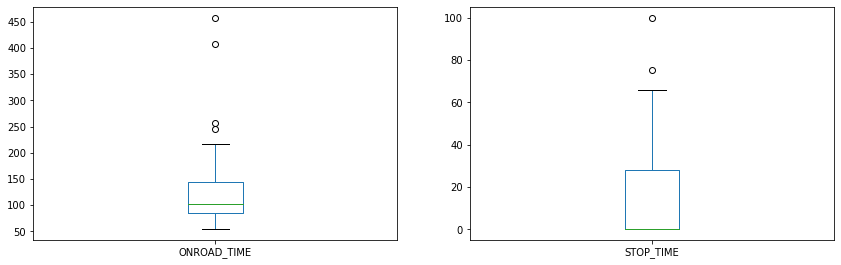

In [20]:
for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
    print(pair)
    
    data = df.loc[(df['STARTSTOP'] == start_end_pairs.loc[i, 'STARTSTOP']) & (df['ENDSTOP'] == start_end_pairs.loc[i, 'ENDSTOP'])]
    
    plt.hist(data['JOURNEYTIME'], alpha=0.5, label='JOURNEYTIME')
    plt.hist(data['PLANNED_JOURNEYTIME'], alpha=0.5, label='PLANNED_JOURNEYTIME')
    plt.legend(loc='upper right')
    
    data[['ONROAD_TIME', 'STOP_TIME']].plot(kind='box', subplots=True, figsize=(30,30), layout=(6,4), sharex=False, sharey=False)

    plt.show()

777_779


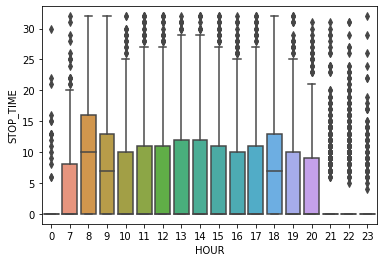

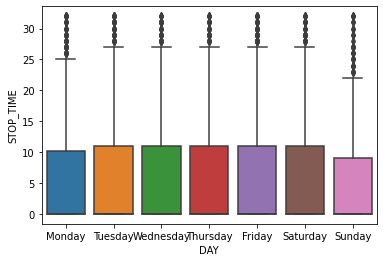

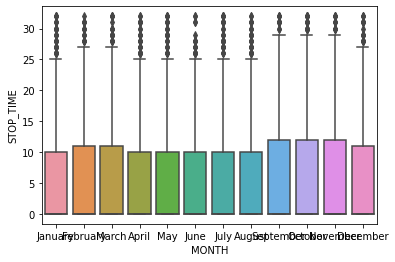

773_774


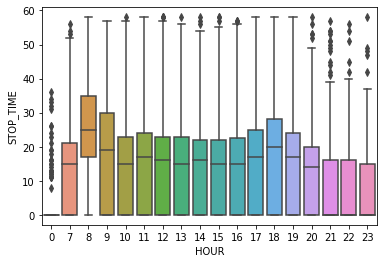

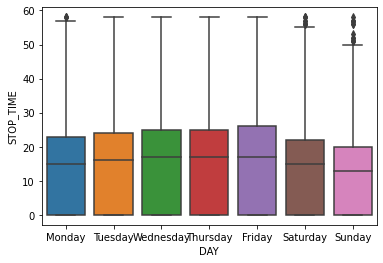

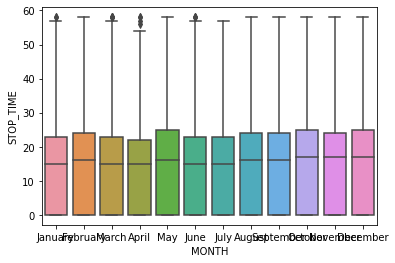

776_777


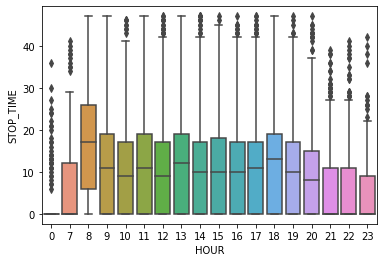

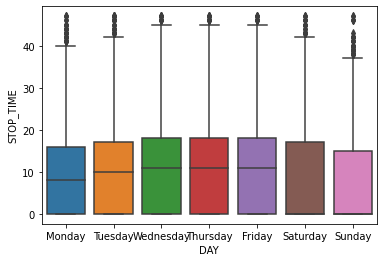

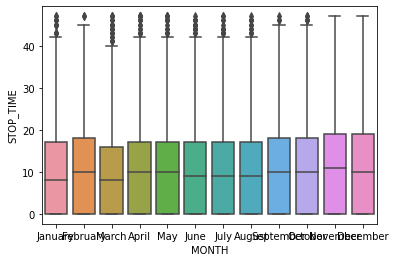

774_775


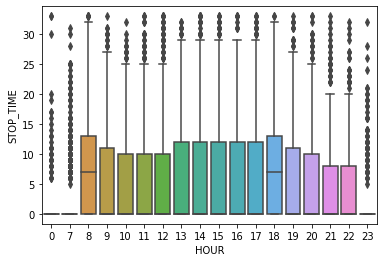

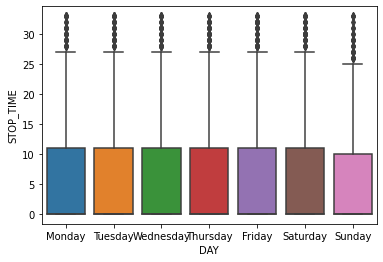

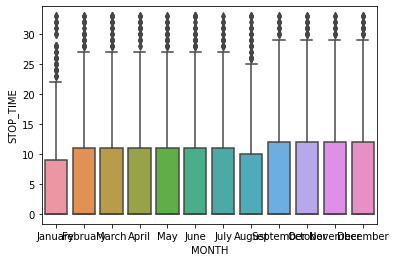

772_773


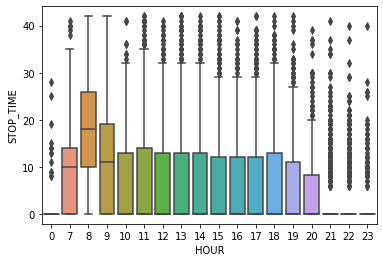

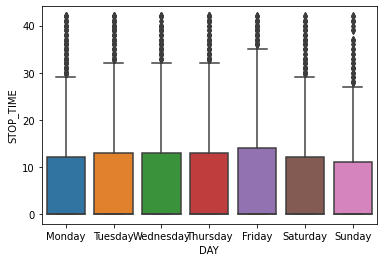

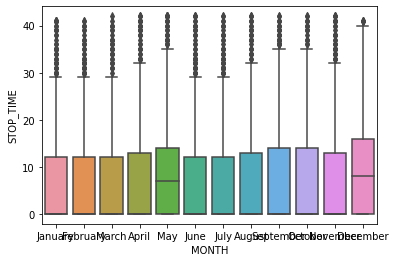

775_776


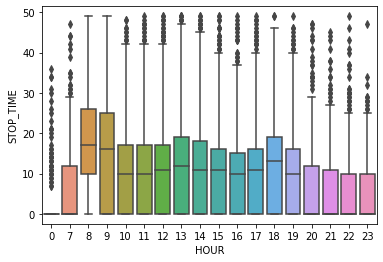

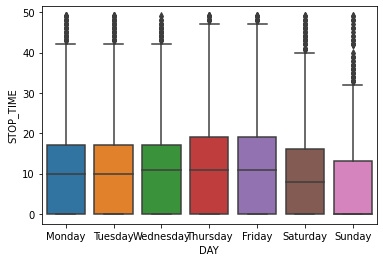

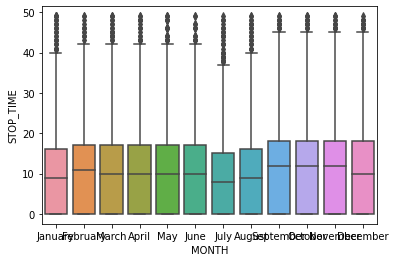

782_783


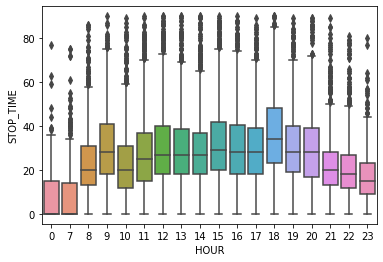

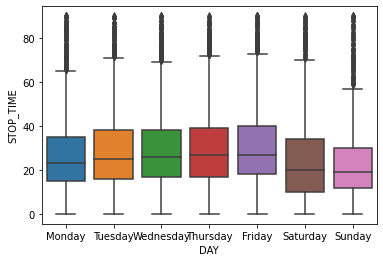

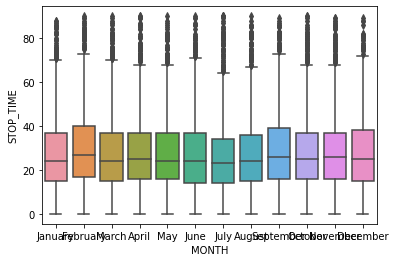

781_782


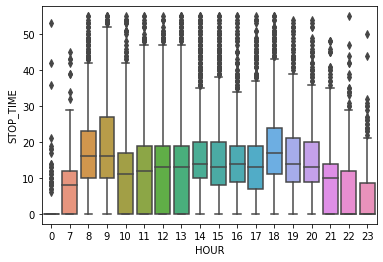

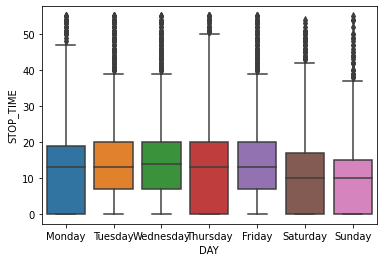

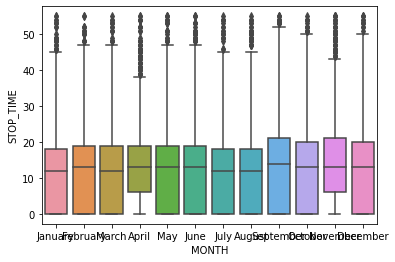

779_780


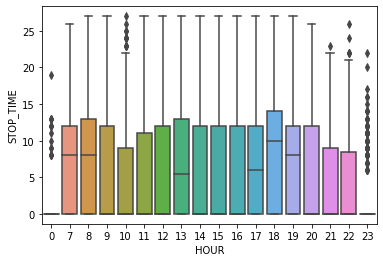

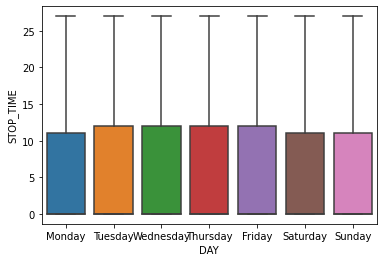

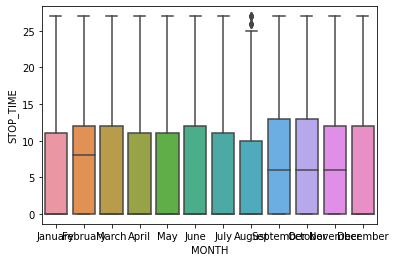

780_781


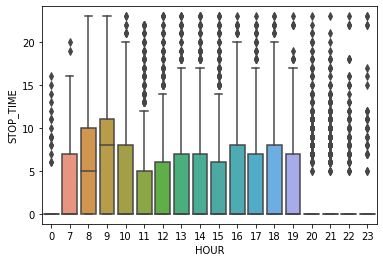

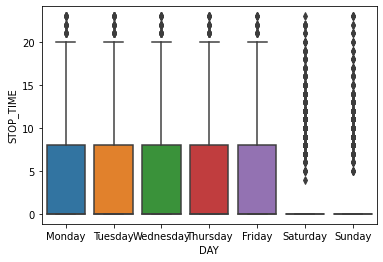

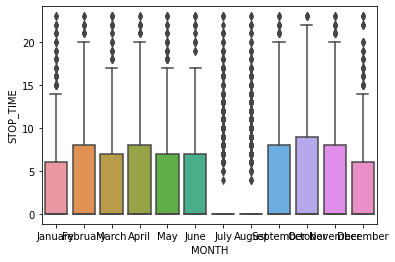

771_772


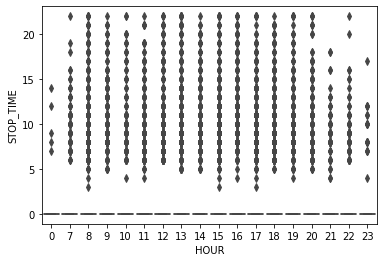

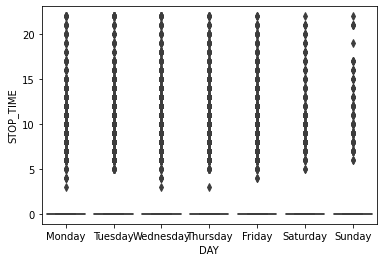

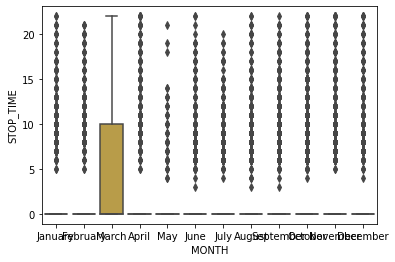

783_784


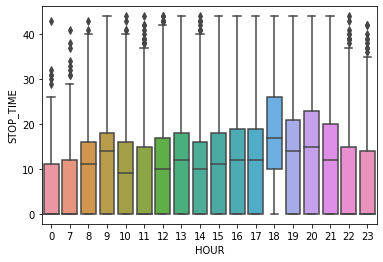

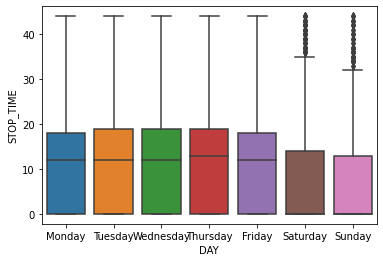

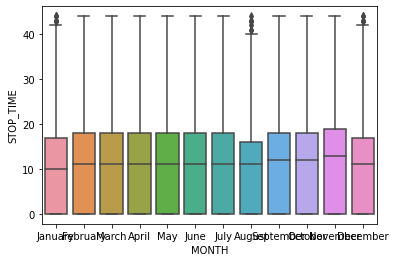

784_785


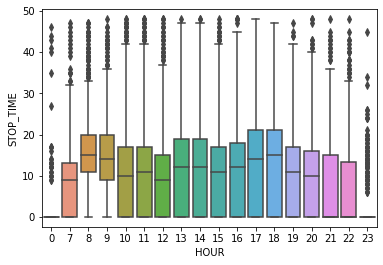

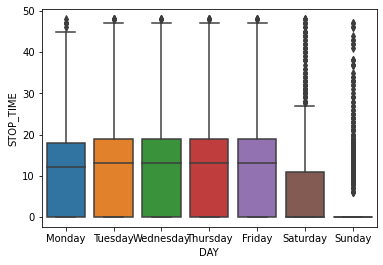

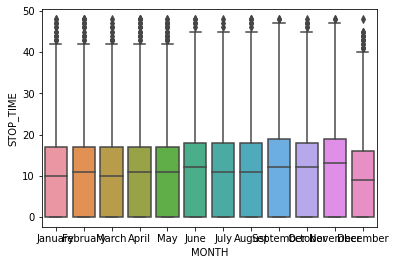

770_771


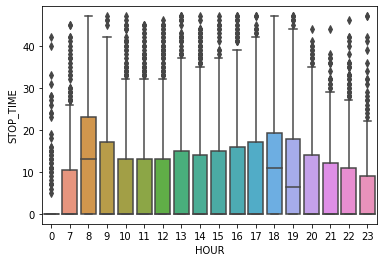

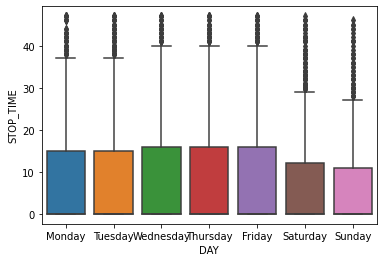

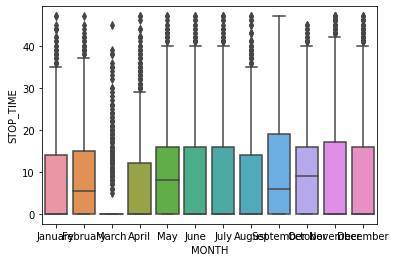

785_786


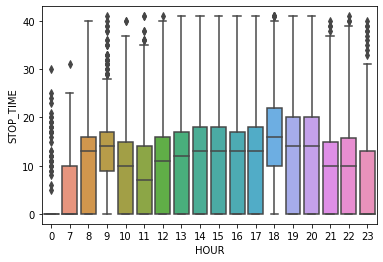

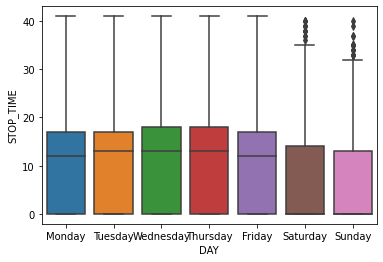

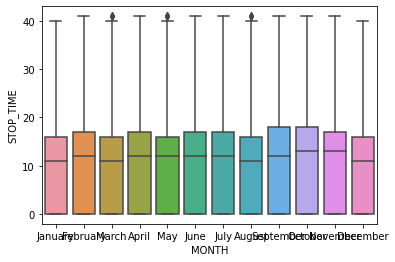

769_770


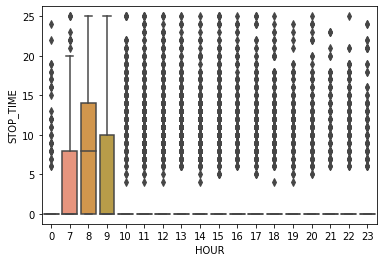

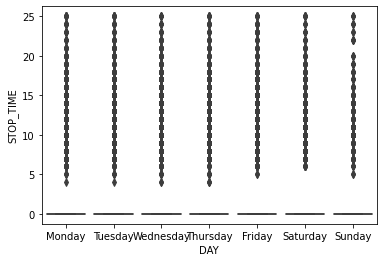

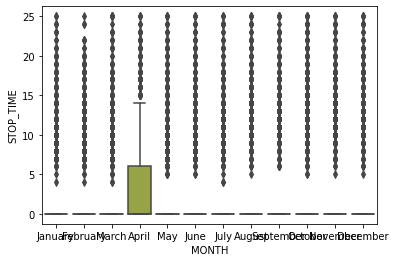

767_768


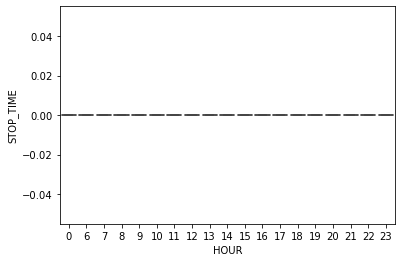

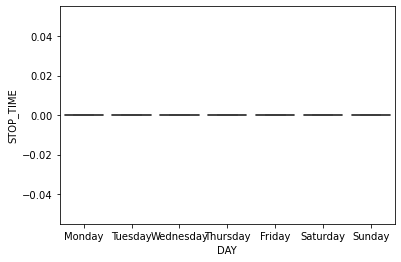

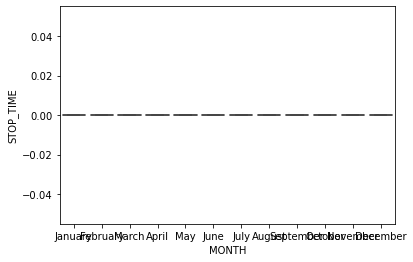

768_769


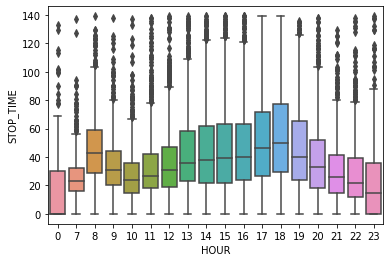

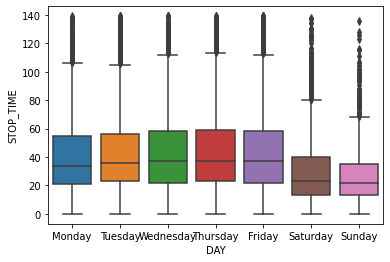

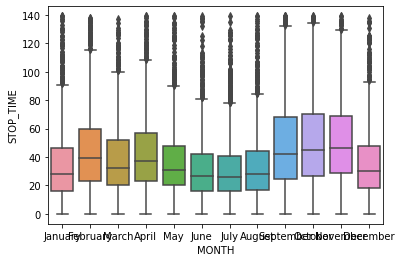

7587_7588


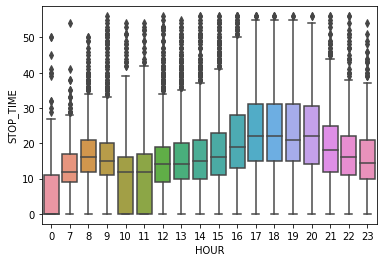

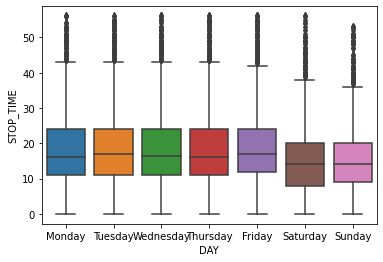

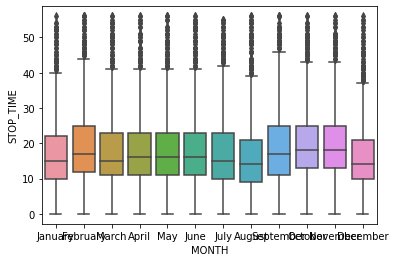

1877_1878


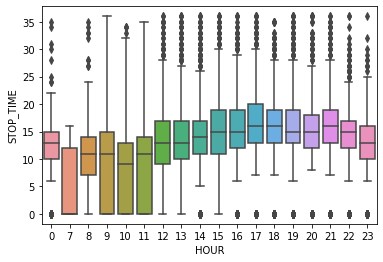

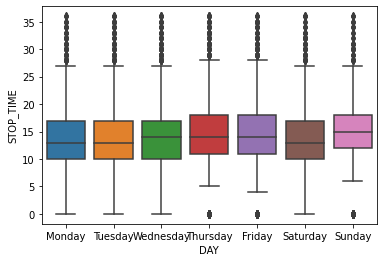

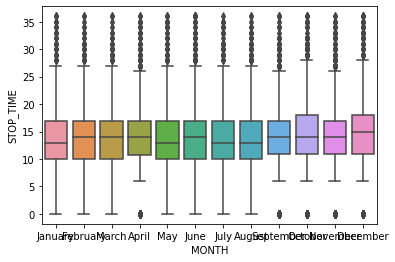

6109_6110


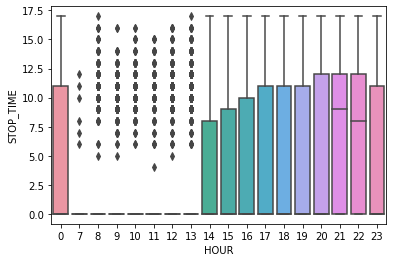

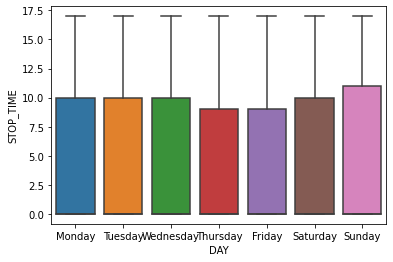

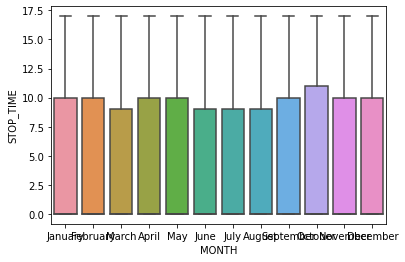

7161_7162


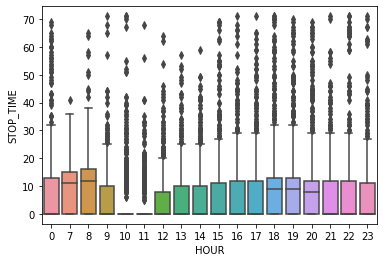

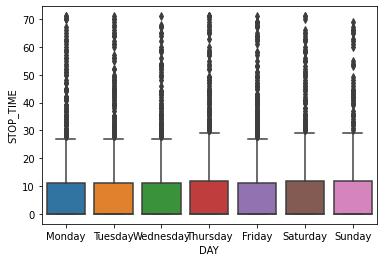

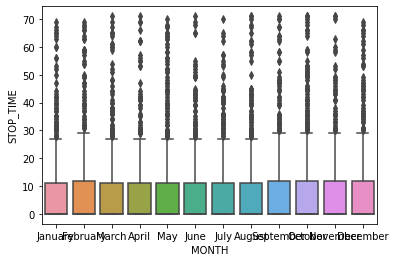

1876_1877


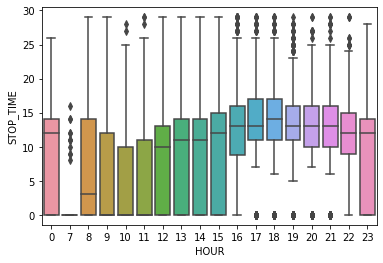

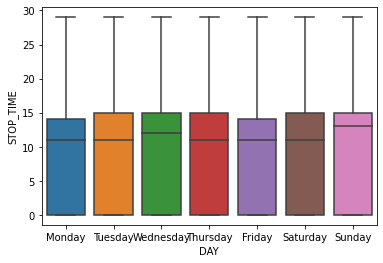

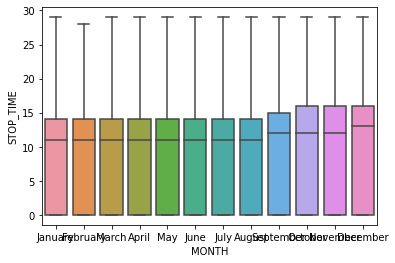

1875_1876


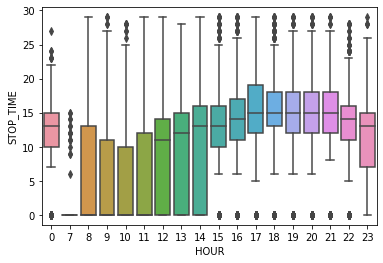

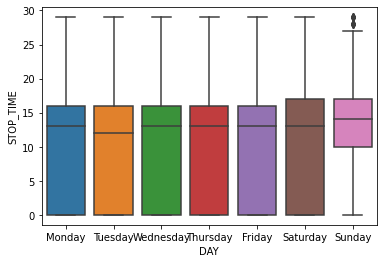

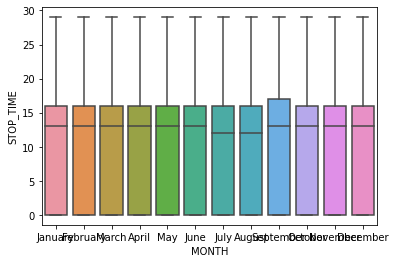

1872_1873


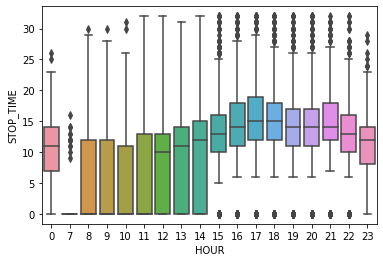

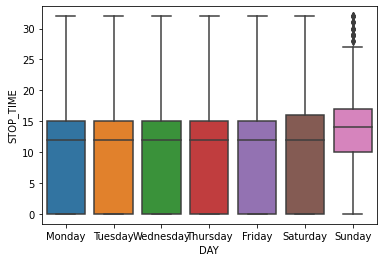

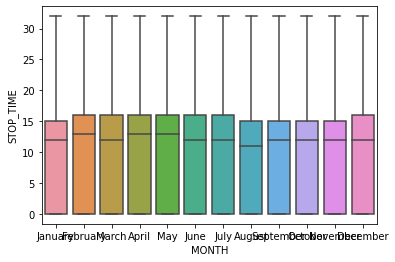

1873_1874


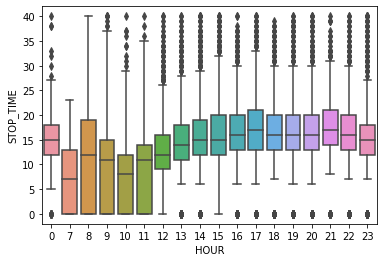

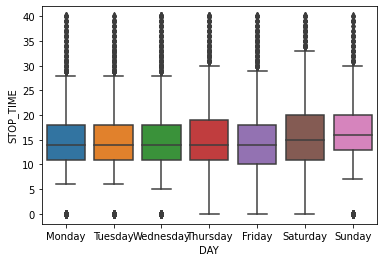

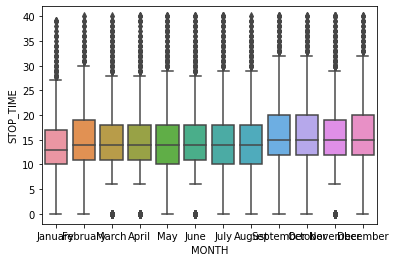

1874_1875


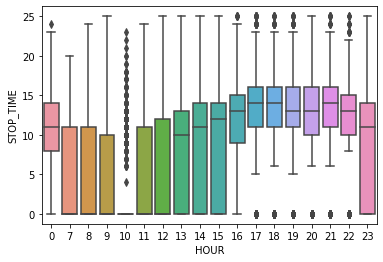

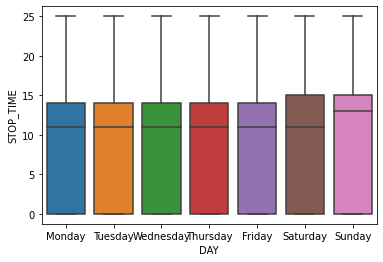

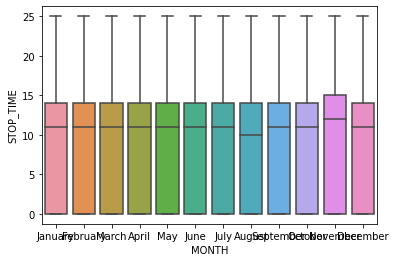

1871_1872


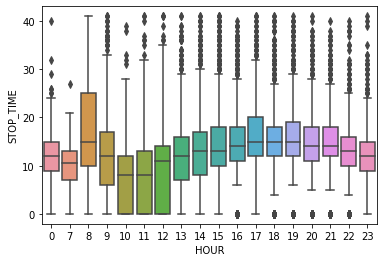

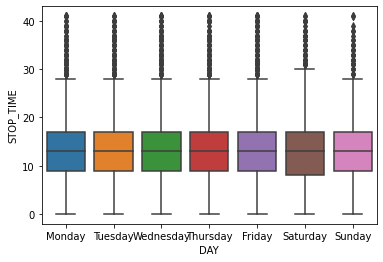

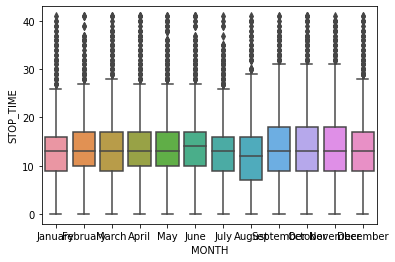

1899_6107


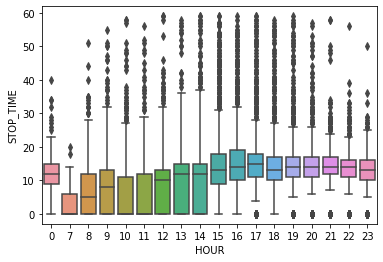

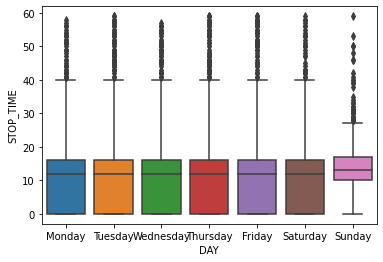

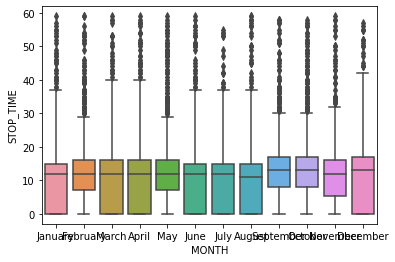

6108_6109


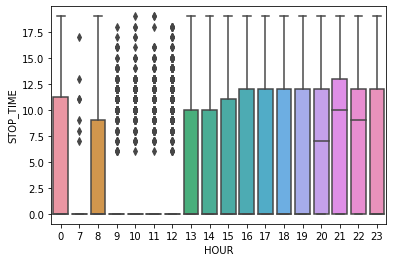

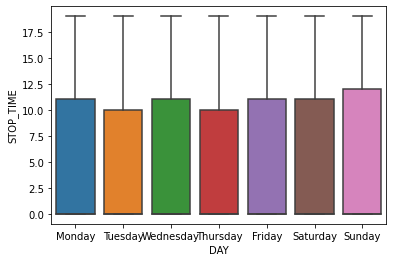

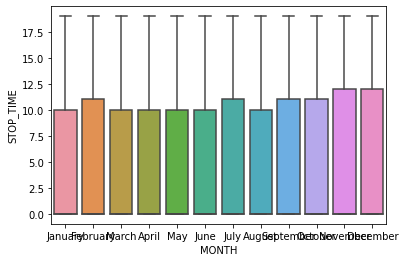

1879_1899


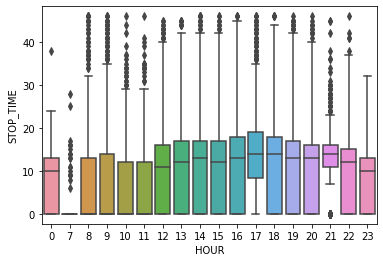

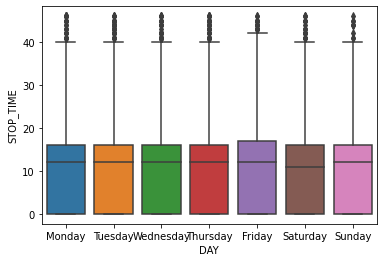

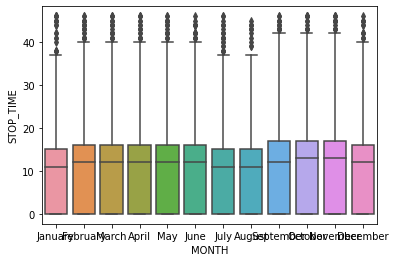

1878_1879


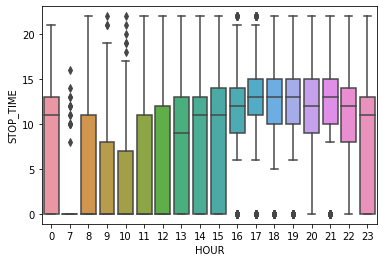

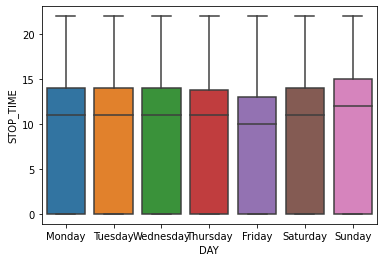

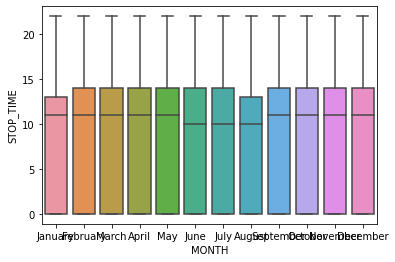

6107_6108


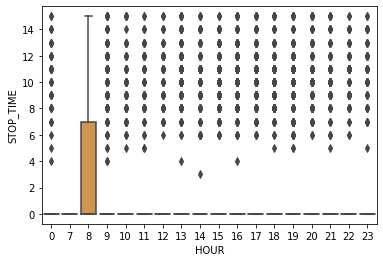

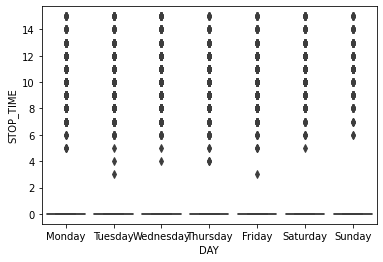

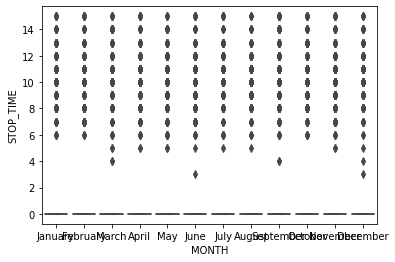

1870_1871


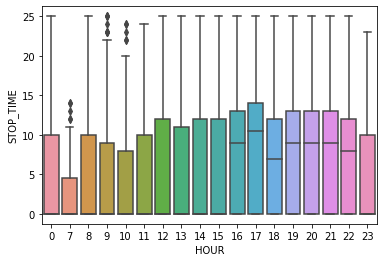

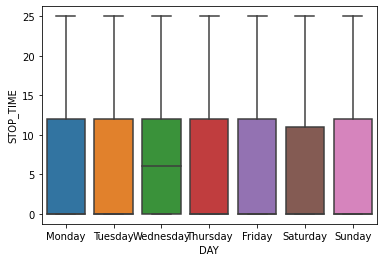

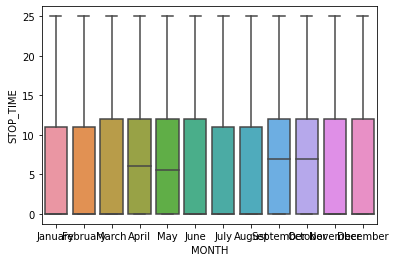

7029_7038


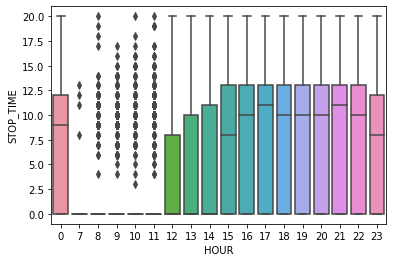

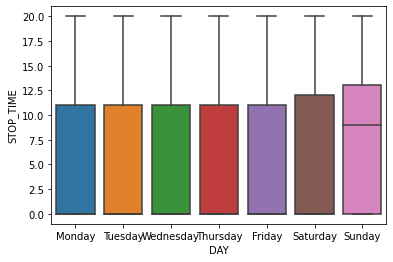

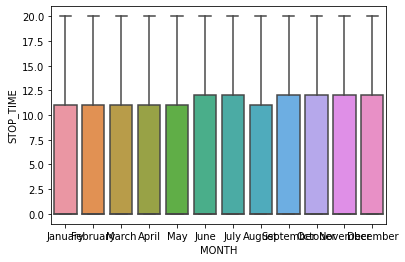

7160_7047


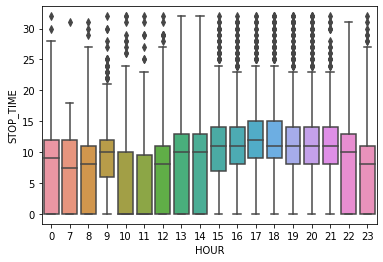

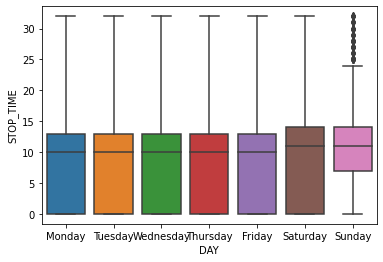

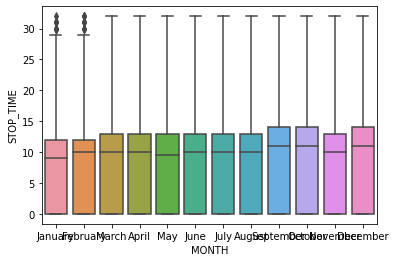

7020_7029


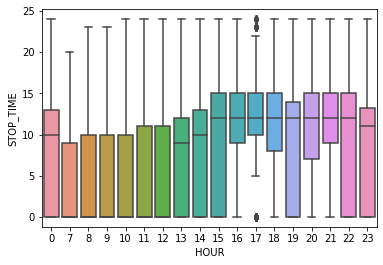

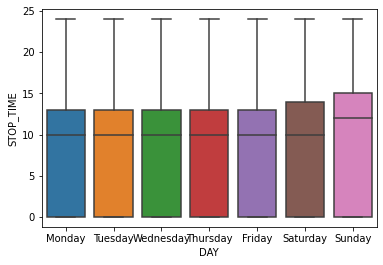

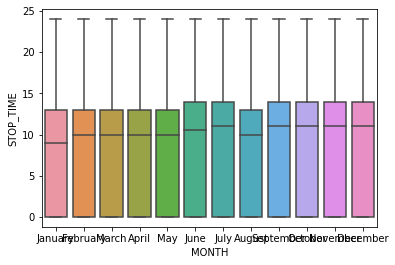

1869_1870


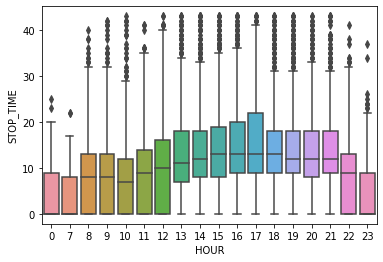

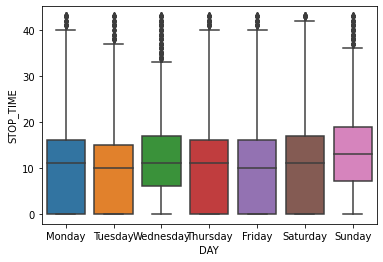

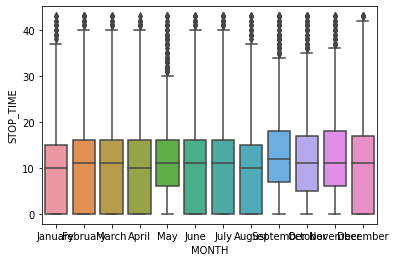

7047_7161


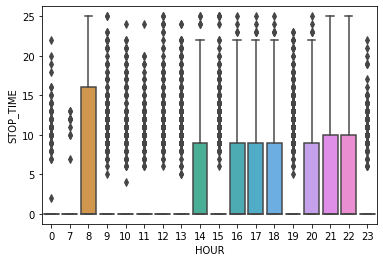

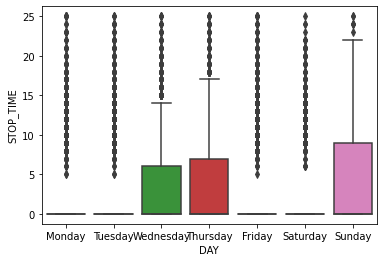

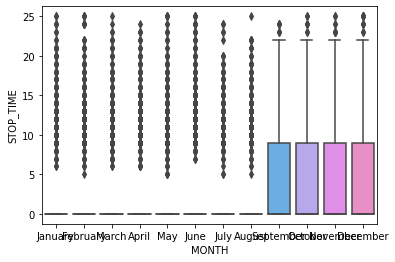

7038_7011


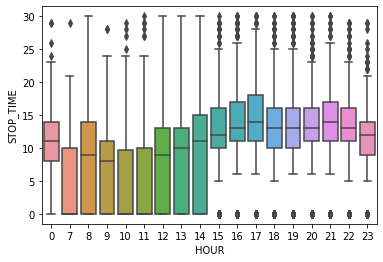

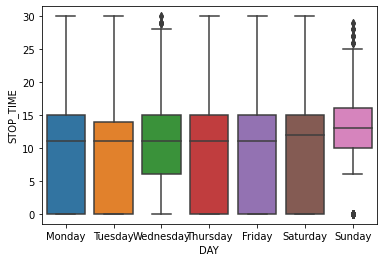

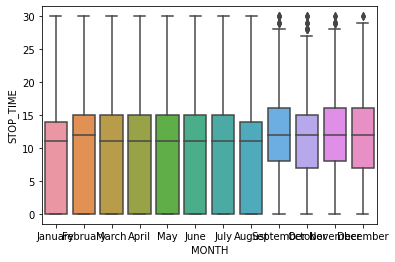

7586_7587


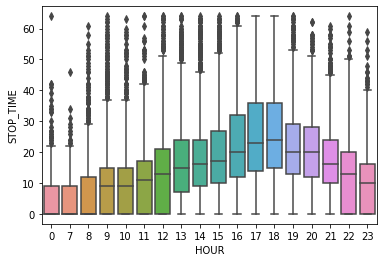

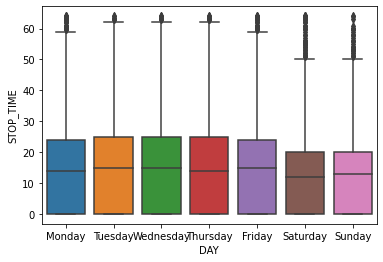

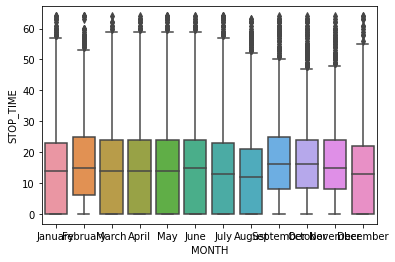

6110_7020


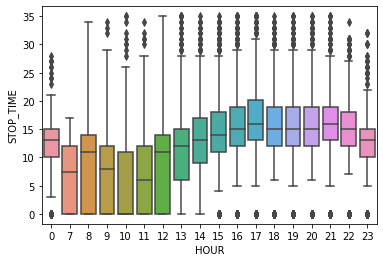

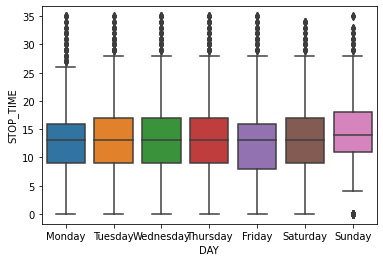

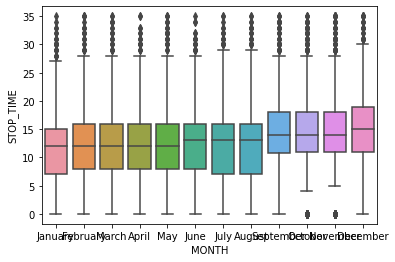

2171_7160


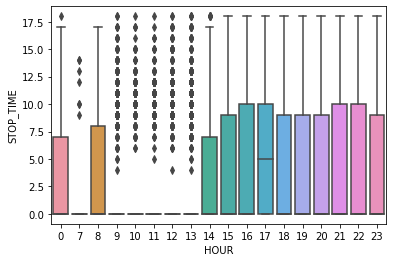

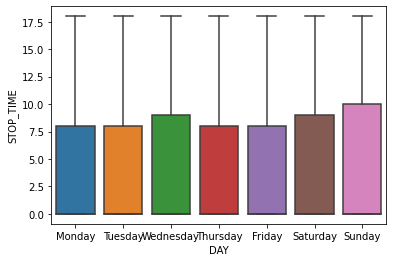

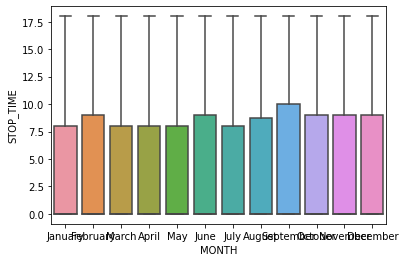

7011_2171


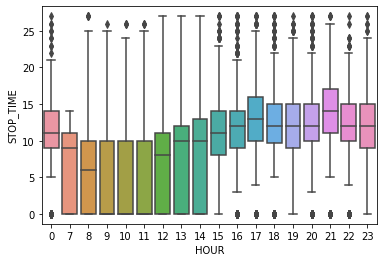

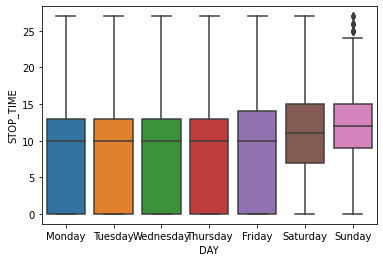

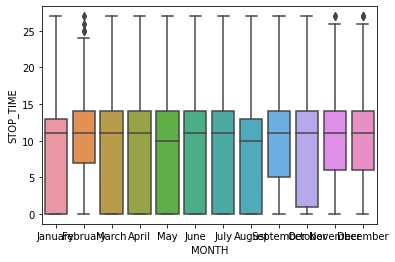

7389_7025


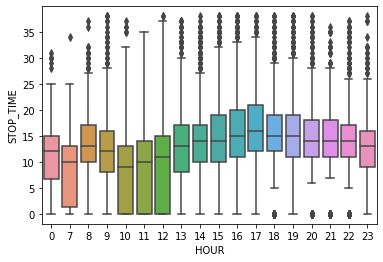

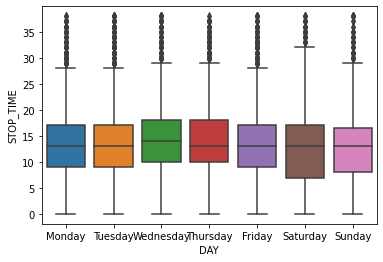

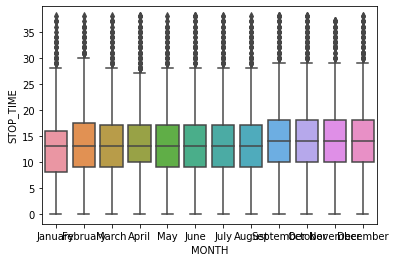

7588_328


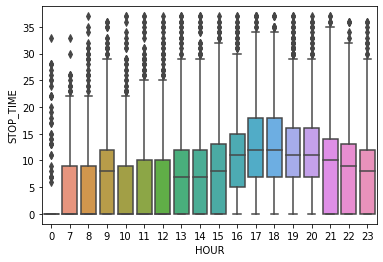

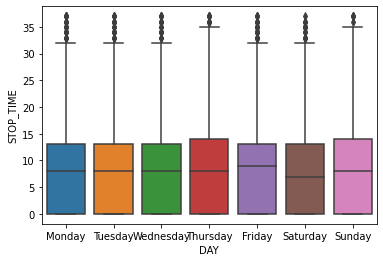

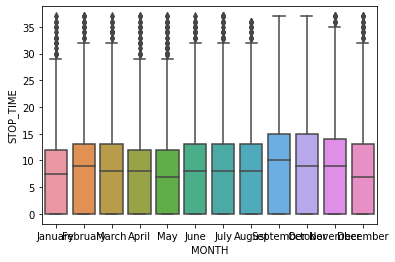

1666_1807


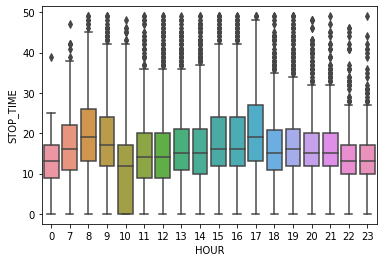

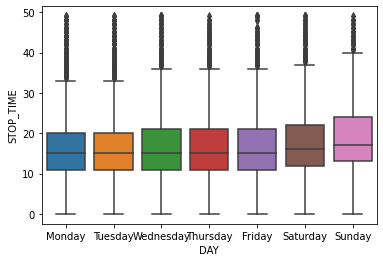

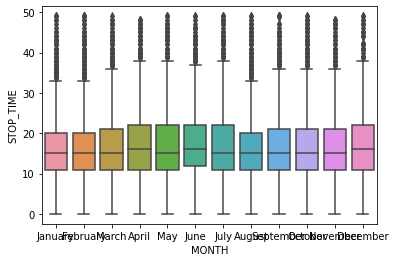

4464_1869


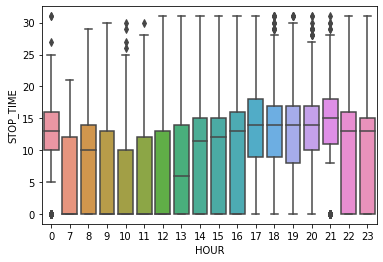

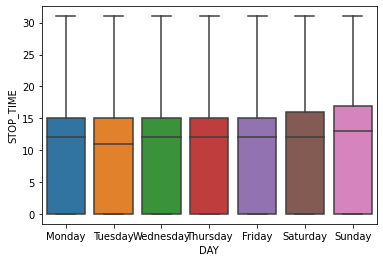

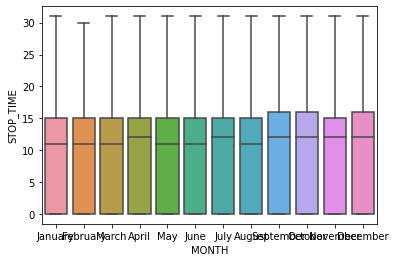

1808_7389


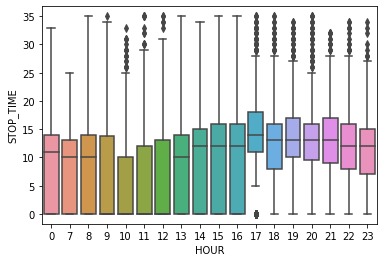

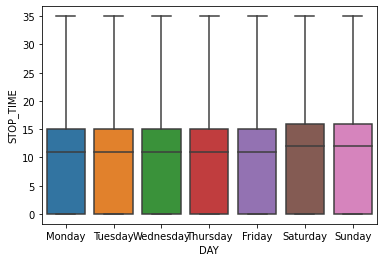

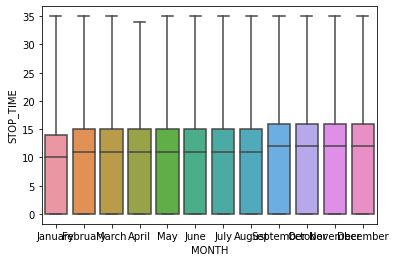

1807_7167


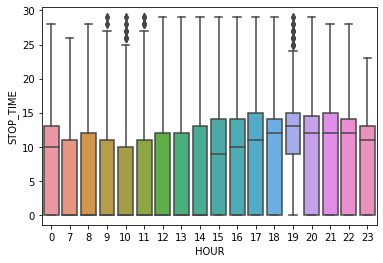

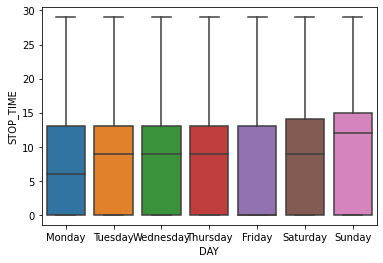

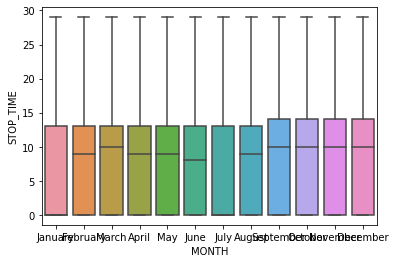

7167_1808


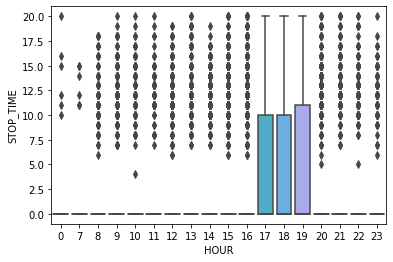

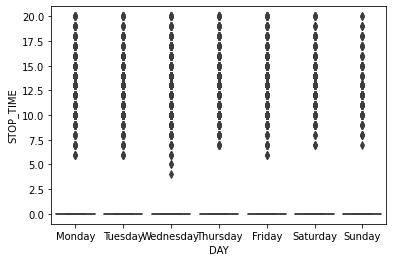

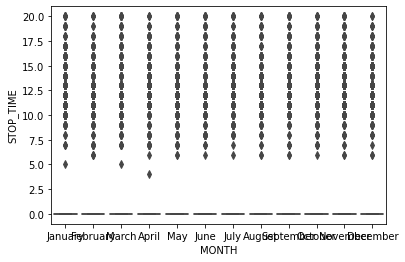

7025_4464


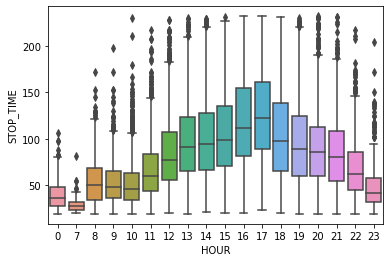

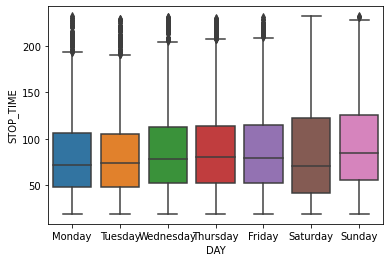

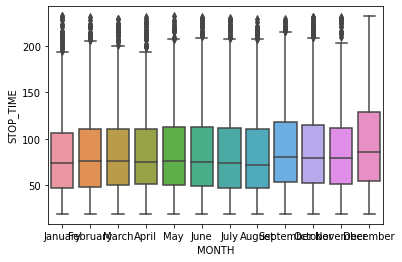

1665_1666


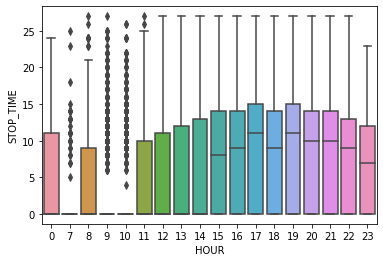

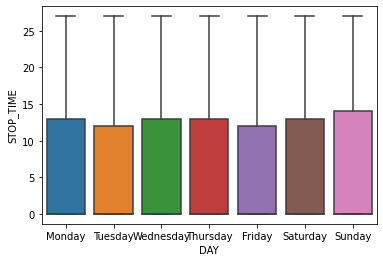

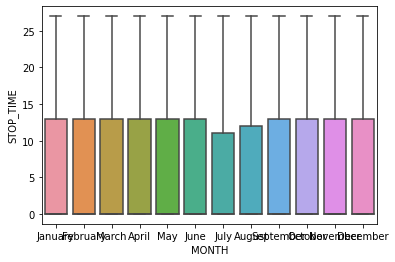

1664_1665


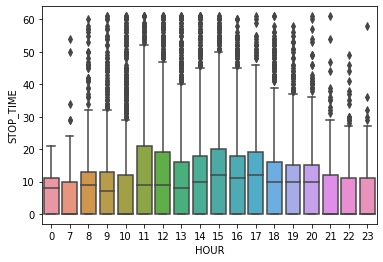

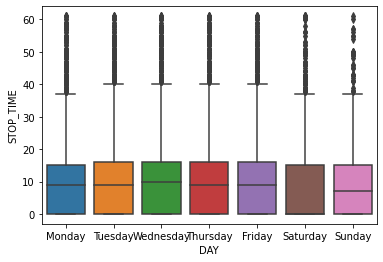

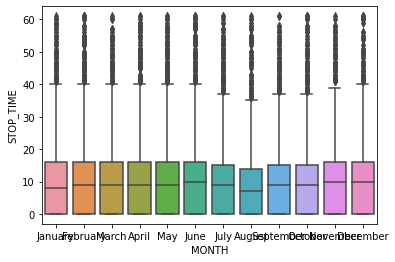

1662_1664


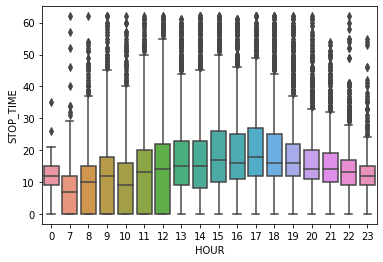

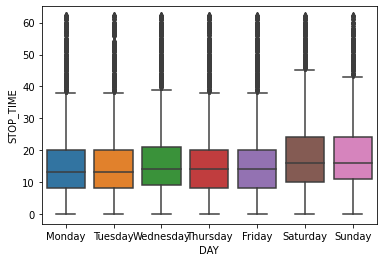

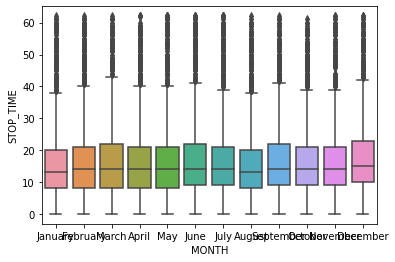

1661_1662


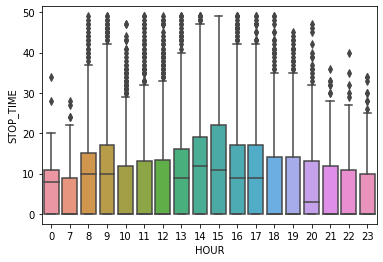

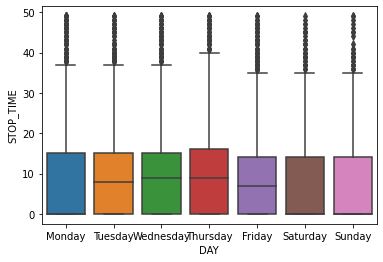

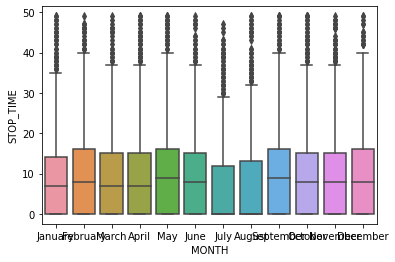

1660_1661


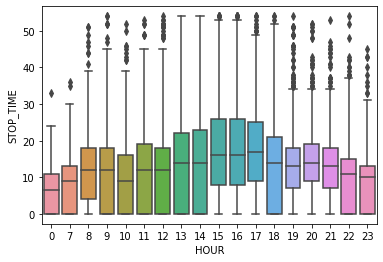

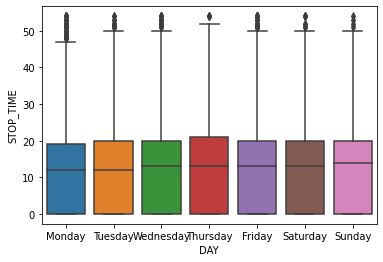

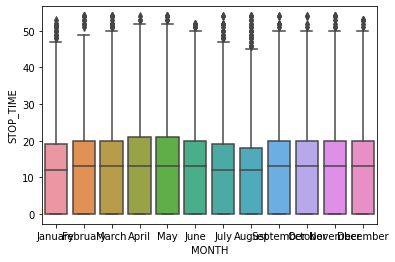

1806_1660


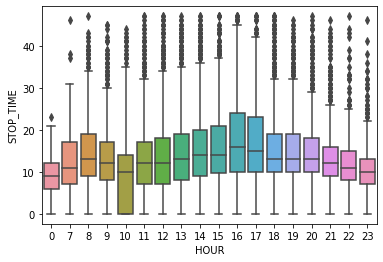

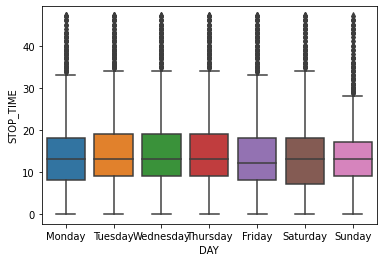

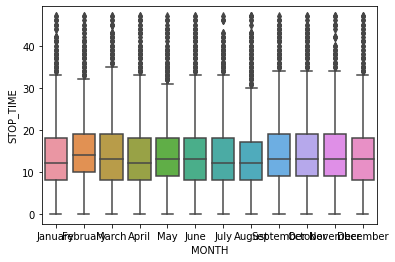

1805_1806


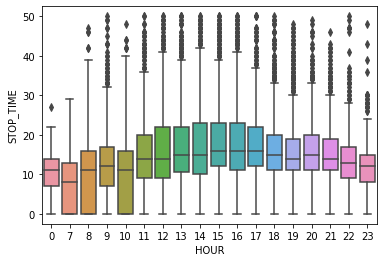

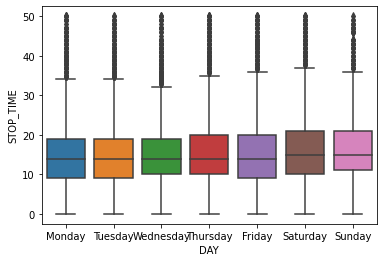

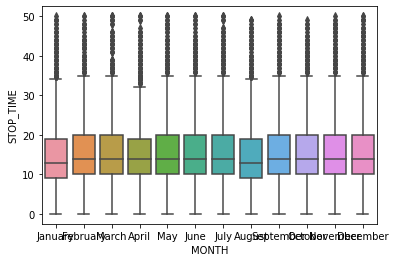

1914_1805


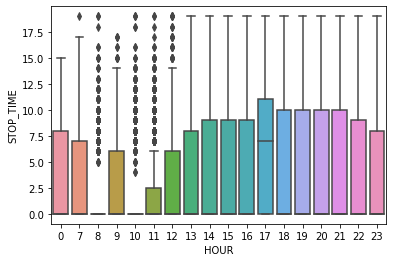

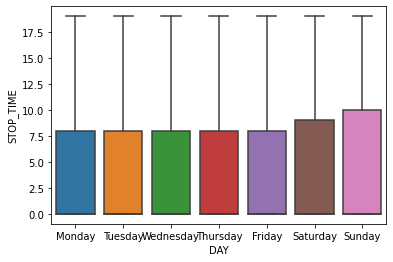

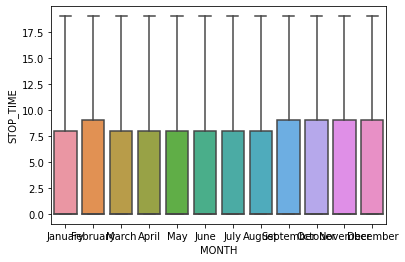

1648_1649


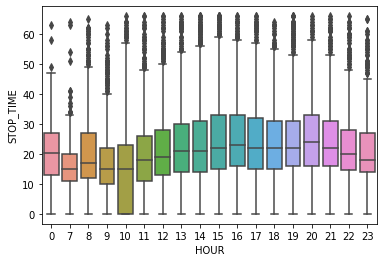

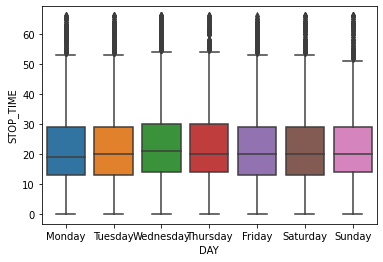

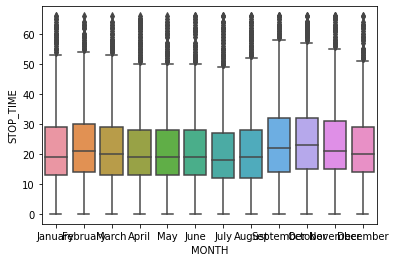

1649_1911


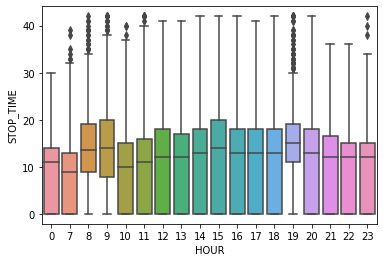

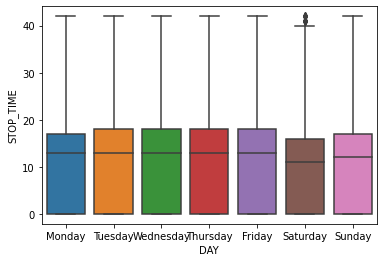

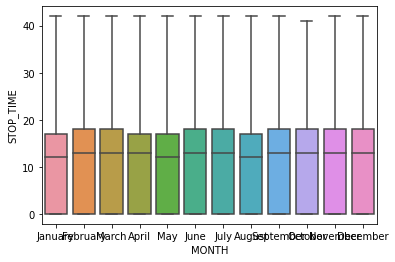

1913_1914


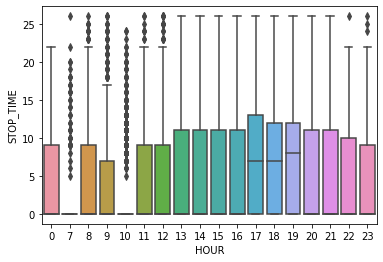

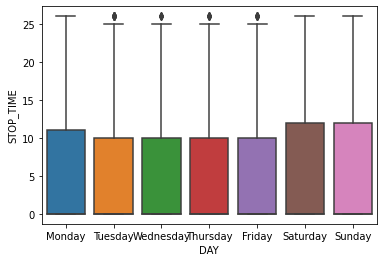

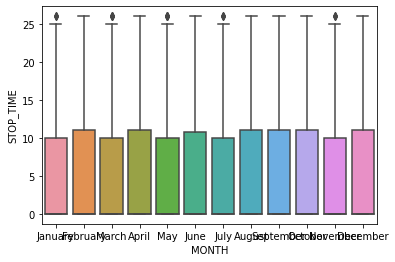

1647_1648


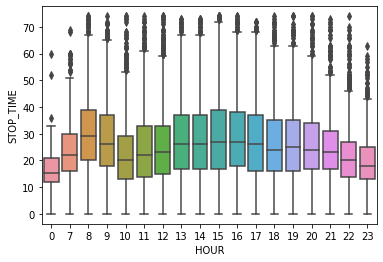

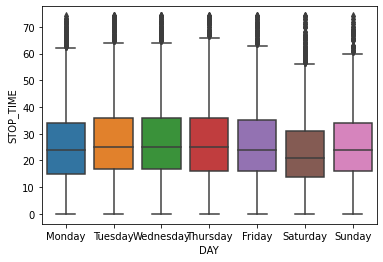

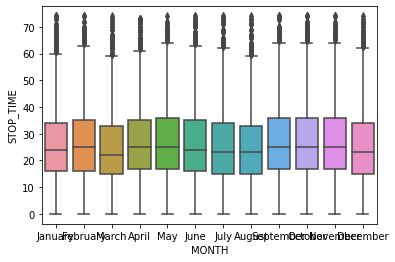

1911_1913


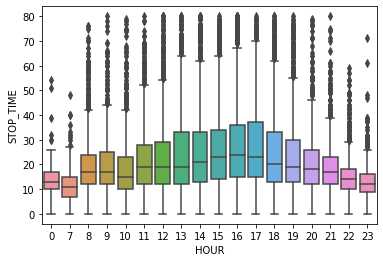

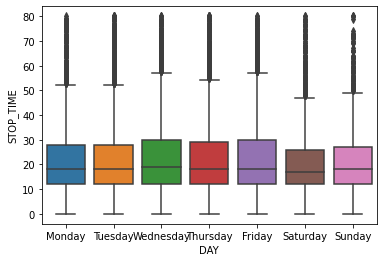

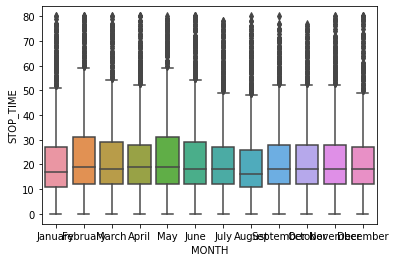

786_793


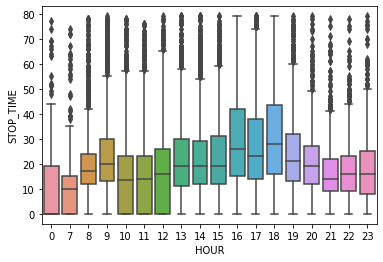

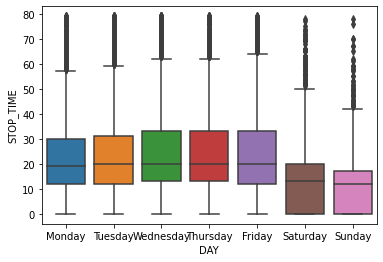

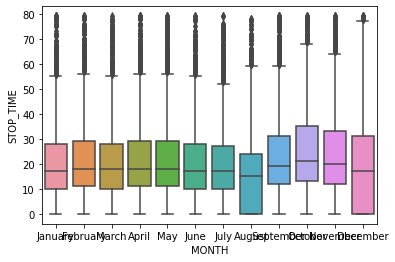

1445_1647


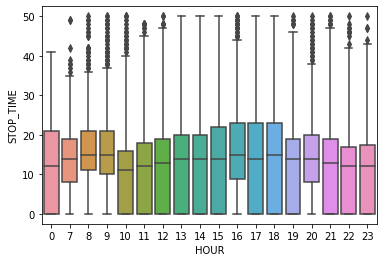

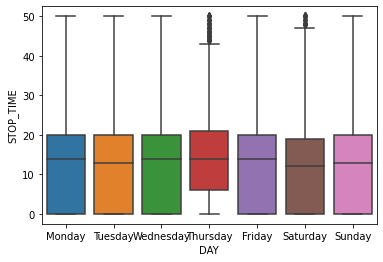

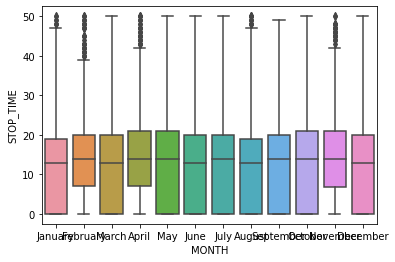

1444_1445


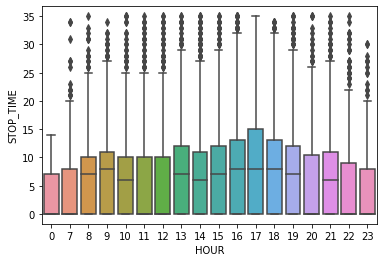

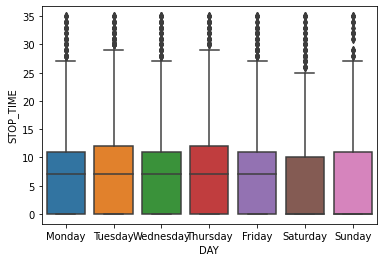

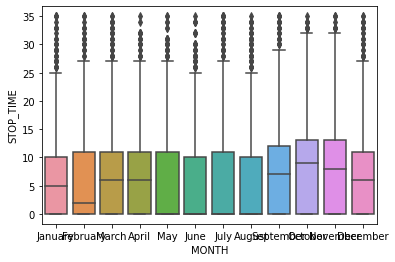

793_7576


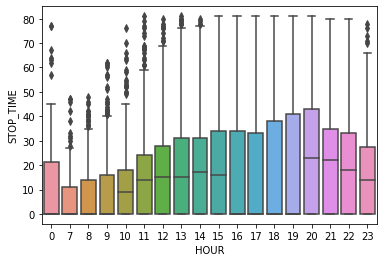

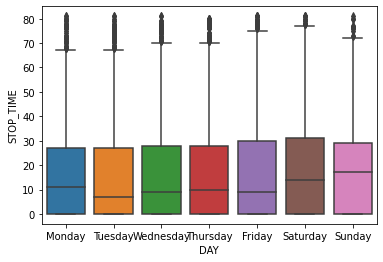

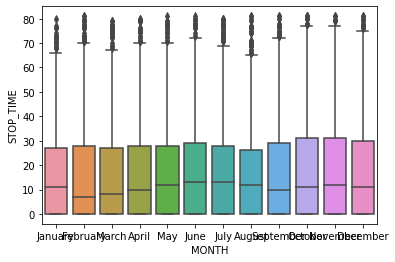

1443_1444


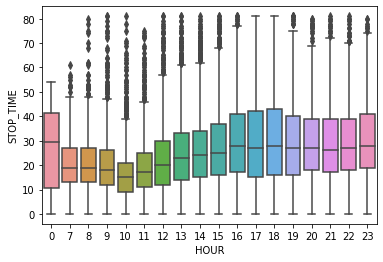

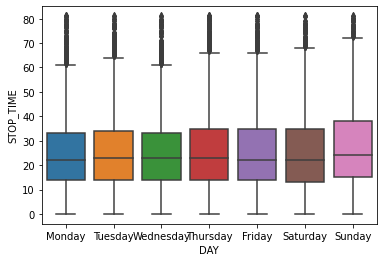

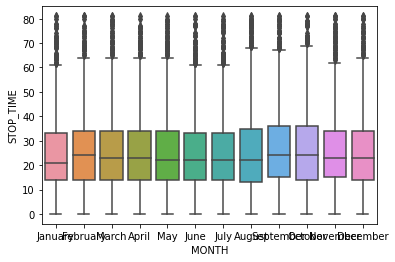

328_1443


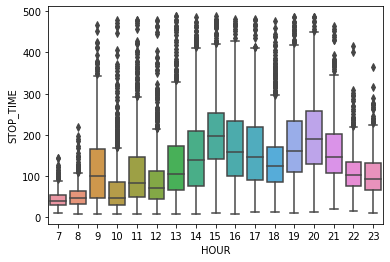

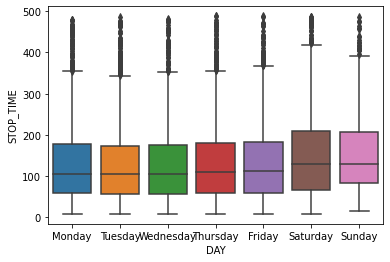

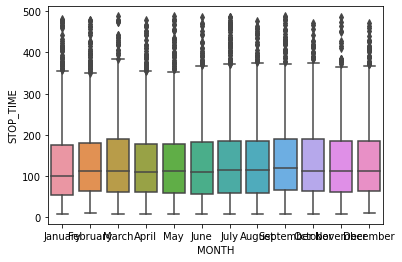

4529_7586


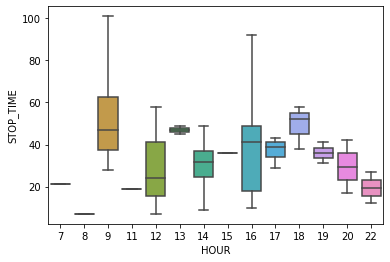

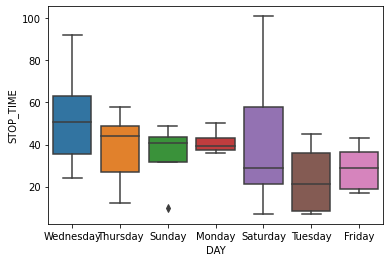

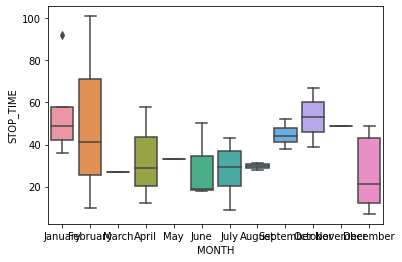

7576_4529


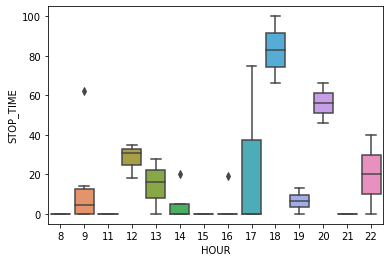

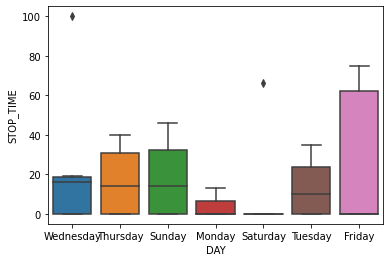

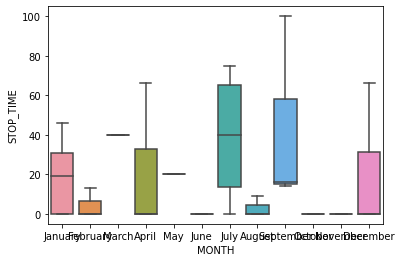

In [21]:
for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
    print(pair)
    
    data = df.loc[(df['STARTSTOP'] == start_end_pairs.loc[i, 'STARTSTOP']) & (df['ENDSTOP'] == start_end_pairs.loc[i, 'ENDSTOP'])]
    
    for categorical_feature in ['HOUR', 'DAY', 'MONTH']:
        sns.boxplot(x = categorical_feature, y = 'STOP_TIME', data = data)
        plt.show()

777_779


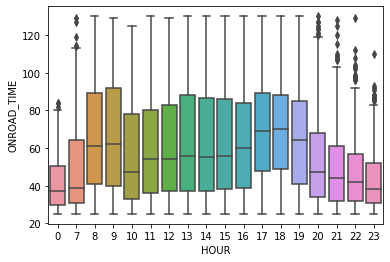

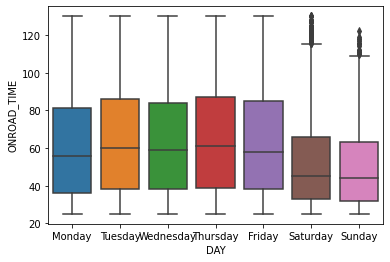

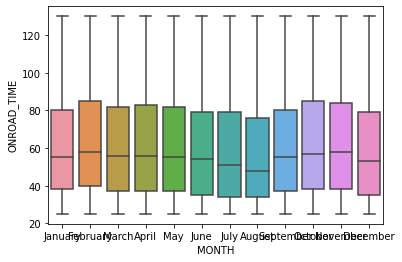

773_774


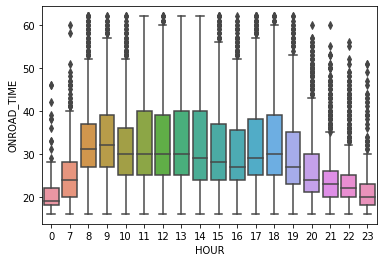

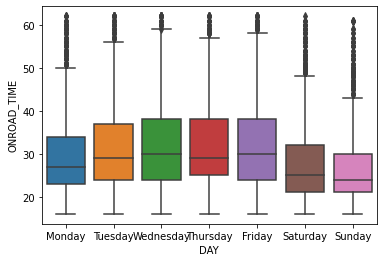

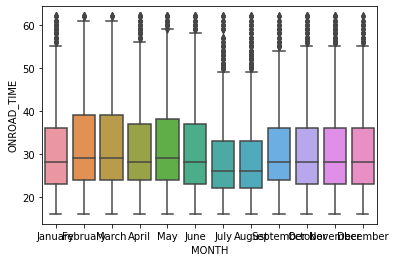

776_777


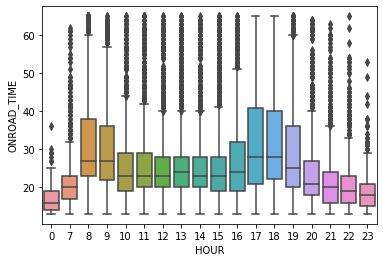

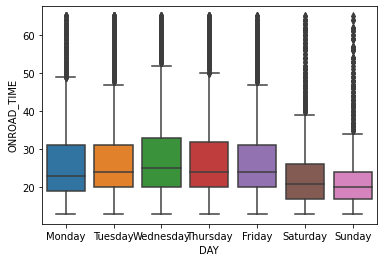

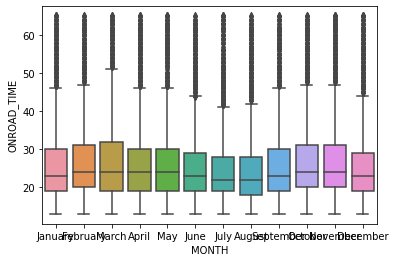

774_775


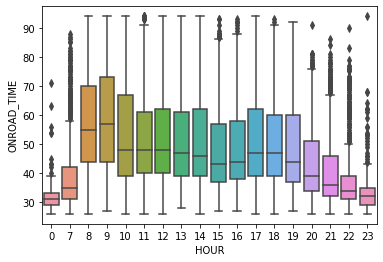

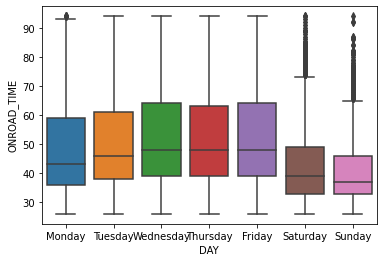

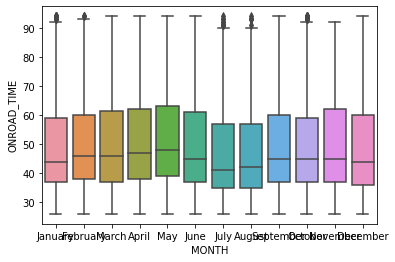

772_773


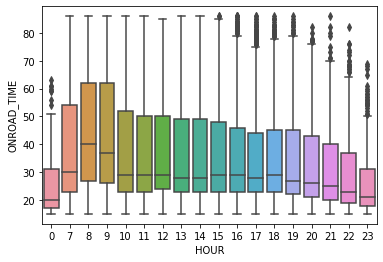

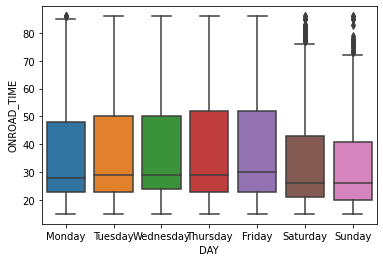

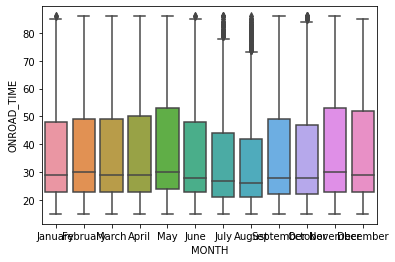

775_776


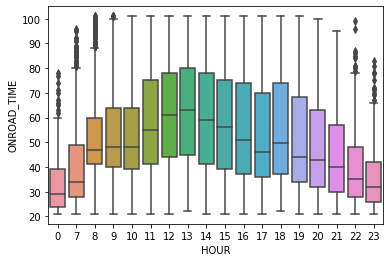

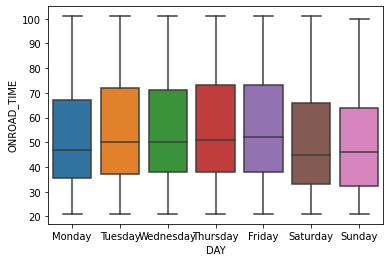

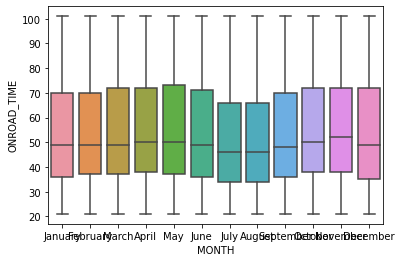

782_783


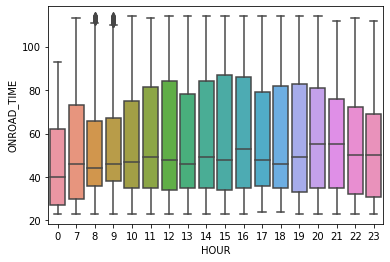

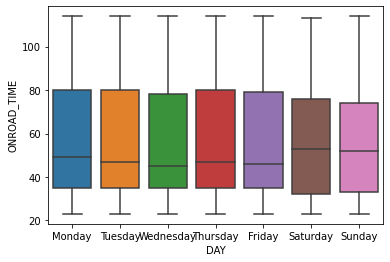

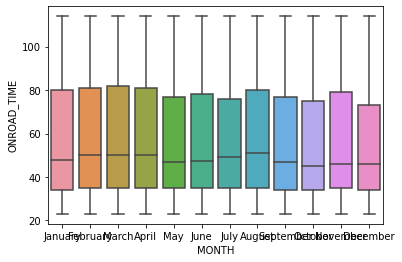

781_782


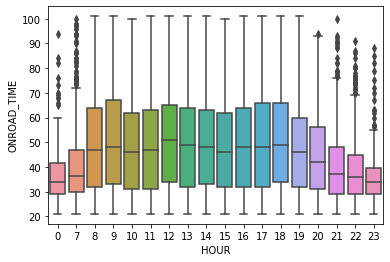

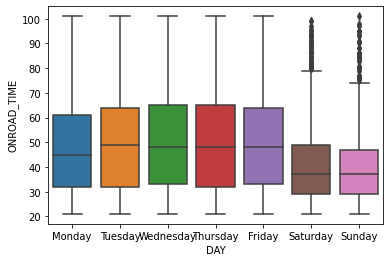

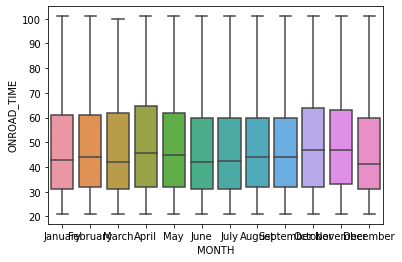

779_780


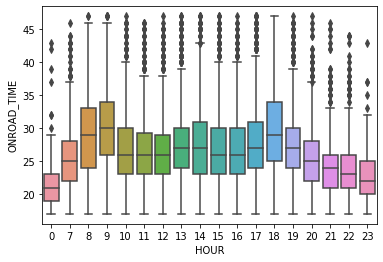

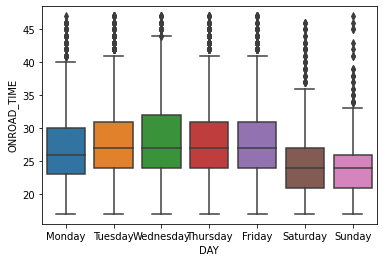

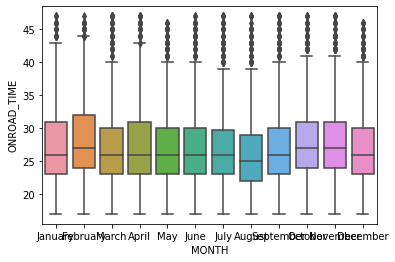

780_781


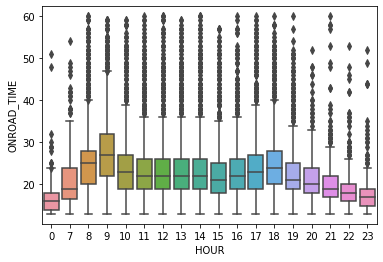

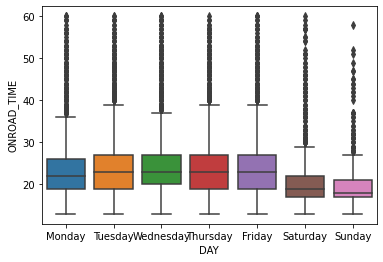

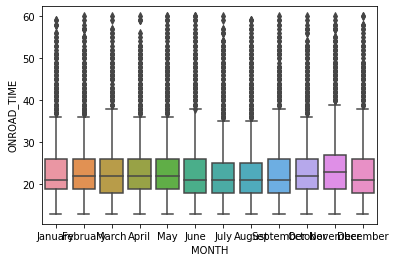

771_772


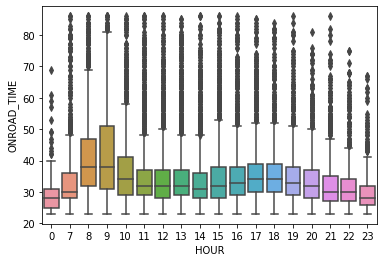

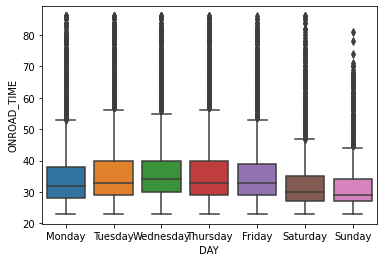

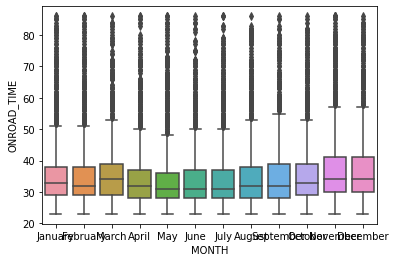

783_784


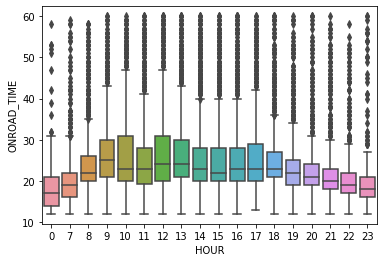

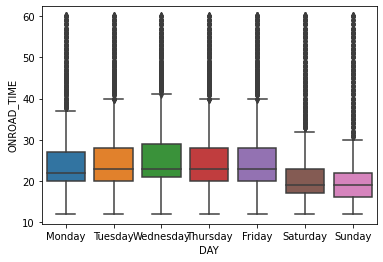

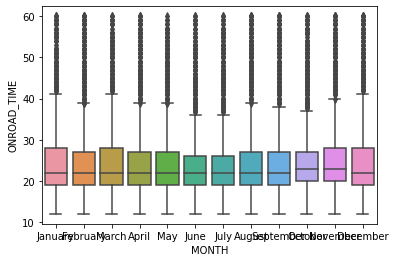

784_785


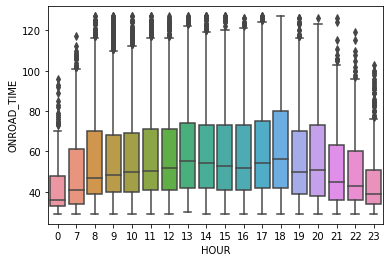

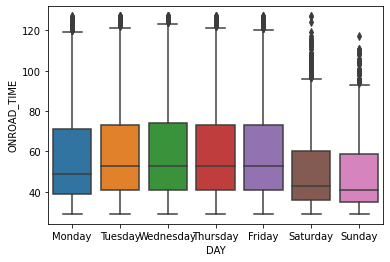

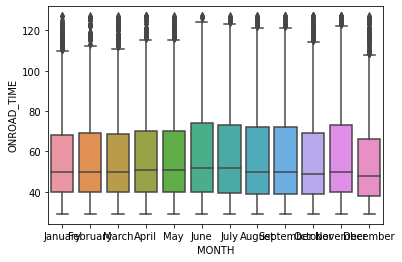

770_771


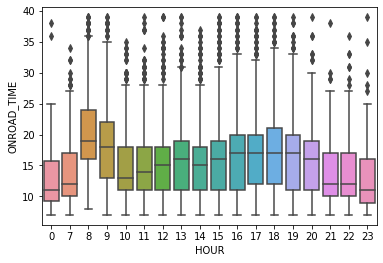

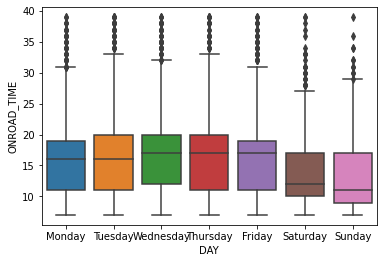

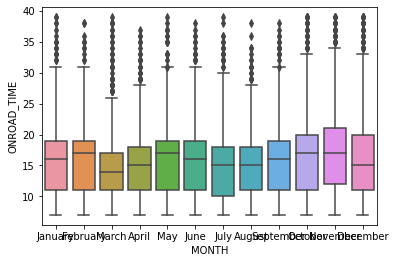

785_786


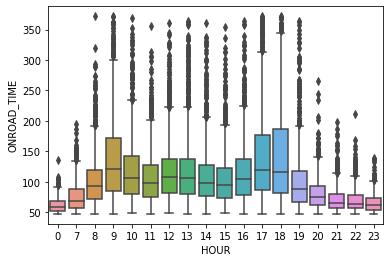

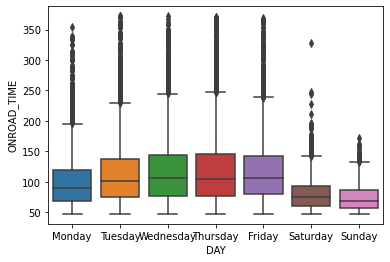

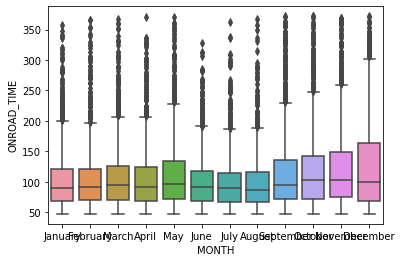

769_770


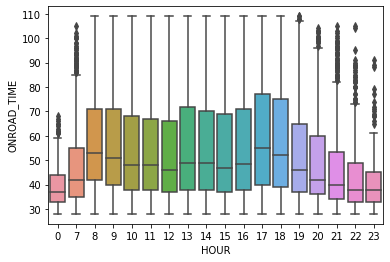

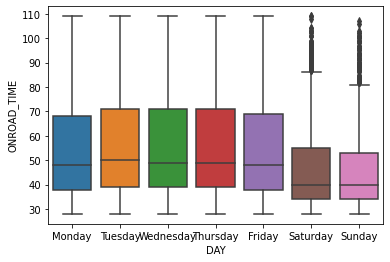

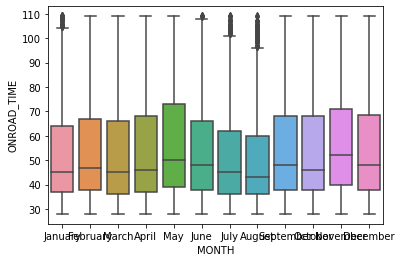

767_768


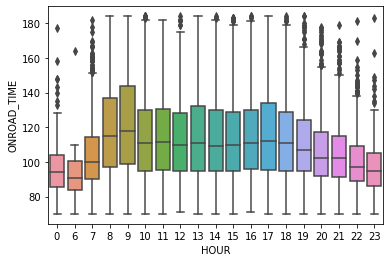

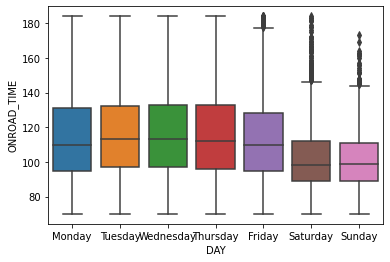

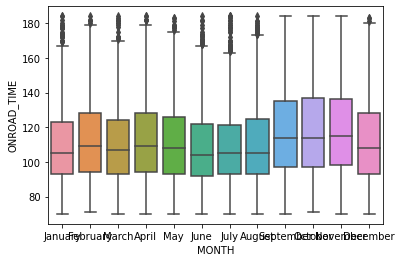

768_769


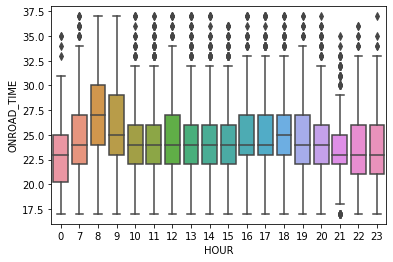

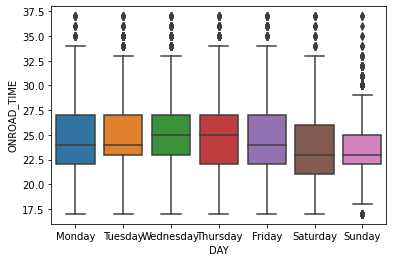

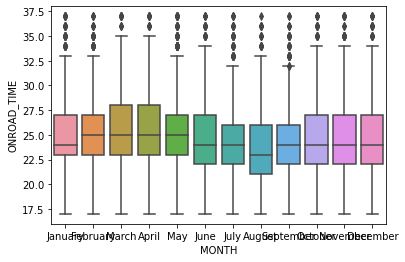

7587_7588


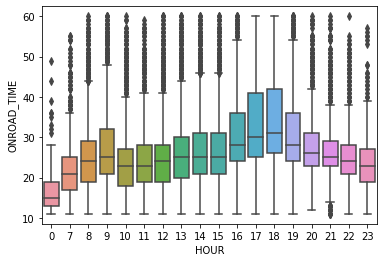

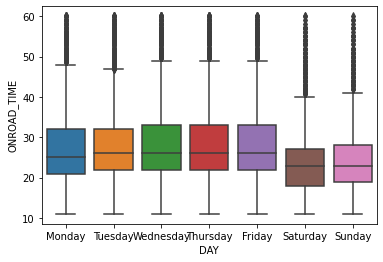

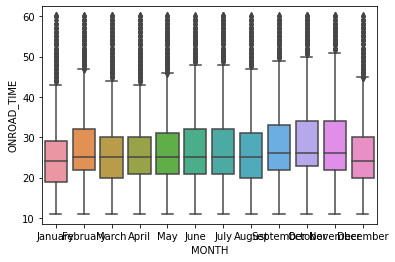

1877_1878


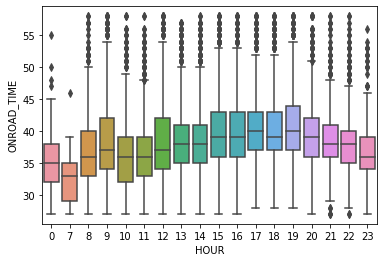

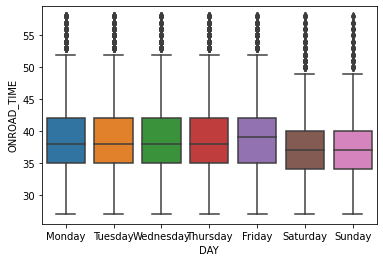

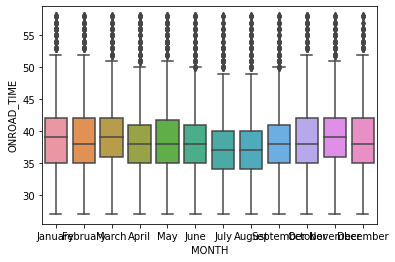

6109_6110


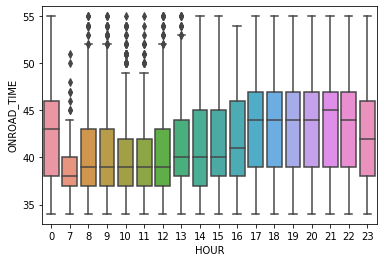

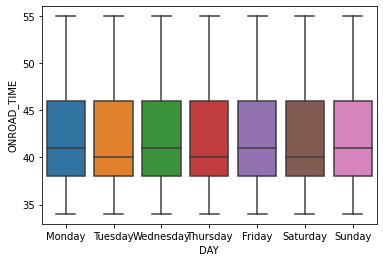

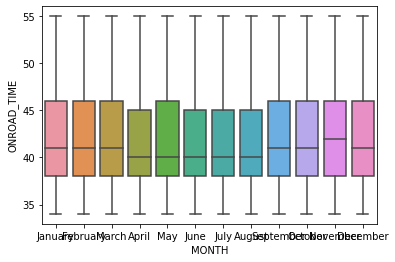

7161_7162


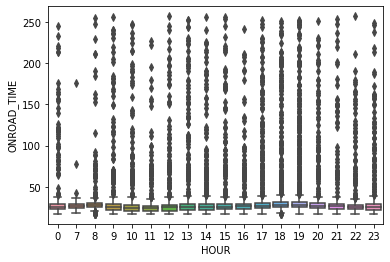

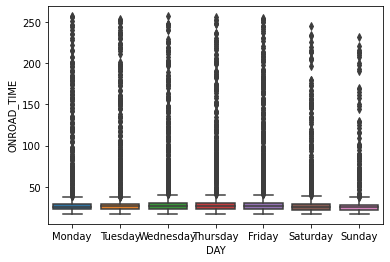

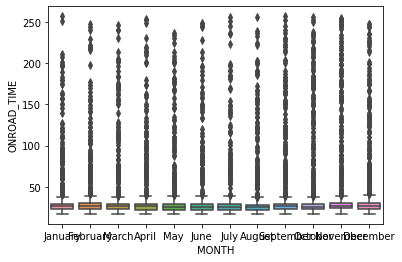

1876_1877


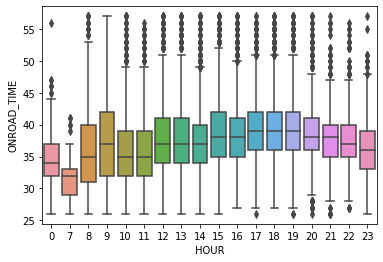

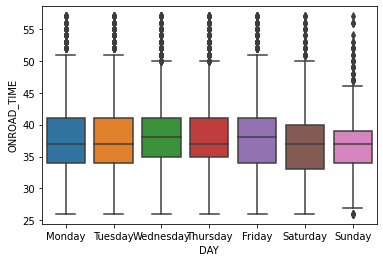

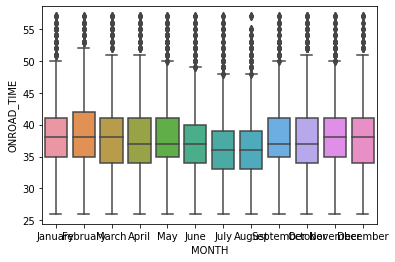

1875_1876


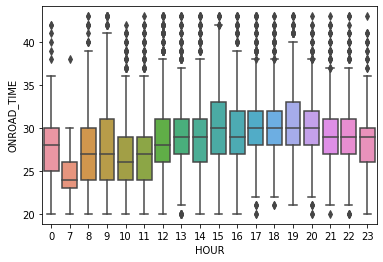

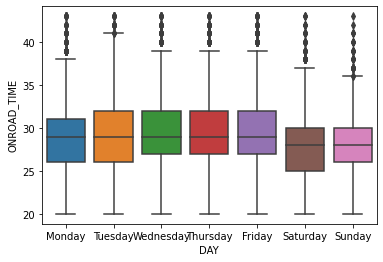

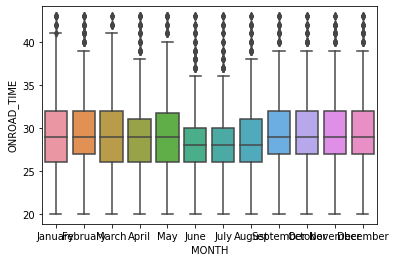

1872_1873


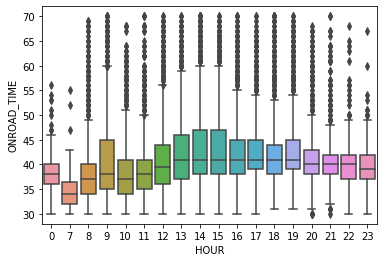

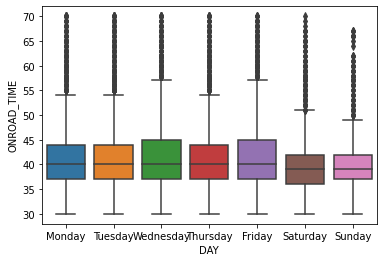

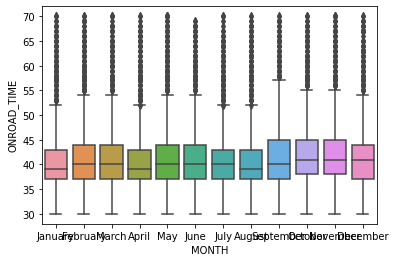

1873_1874


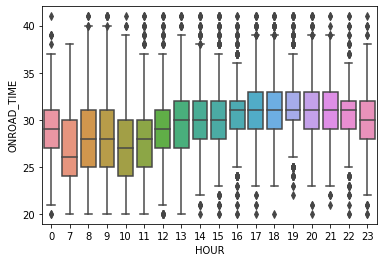

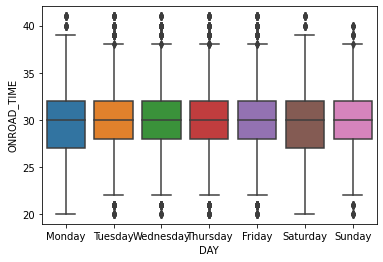

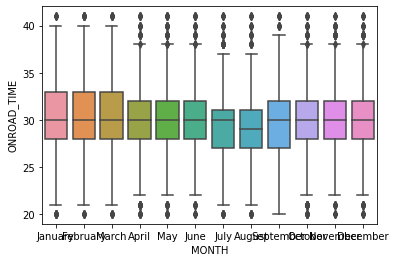

1874_1875


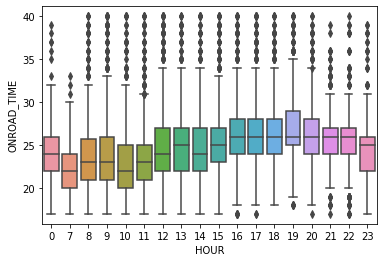

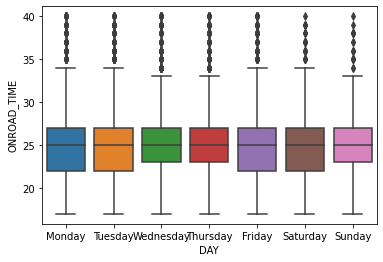

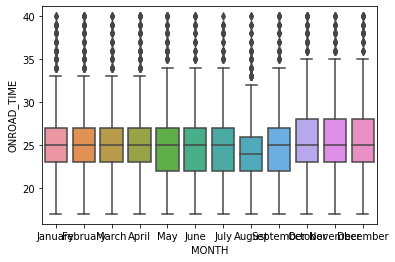

1871_1872


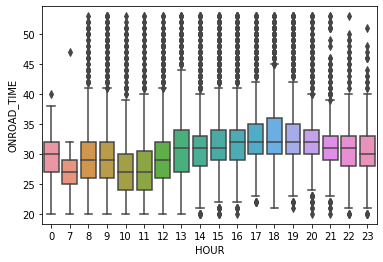

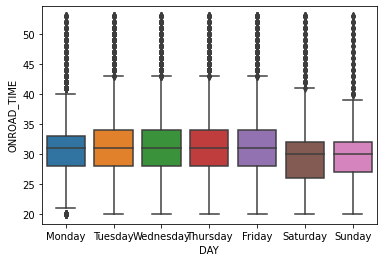

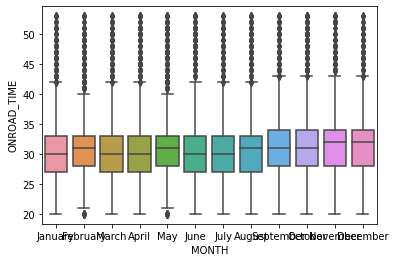

1899_6107


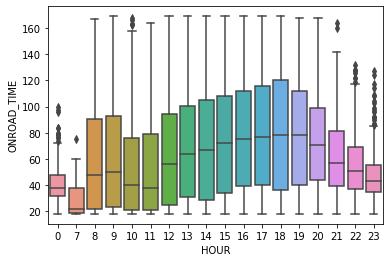

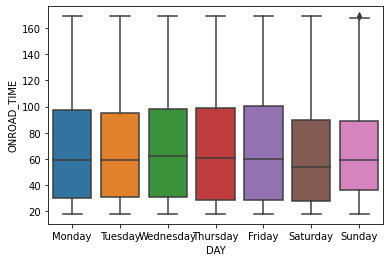

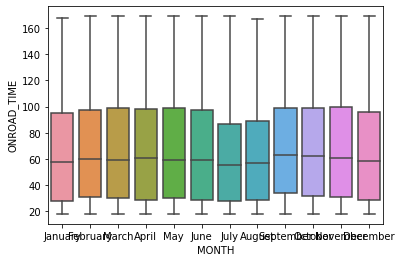

6108_6109


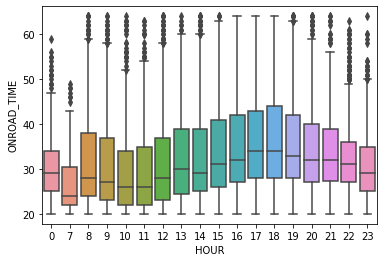

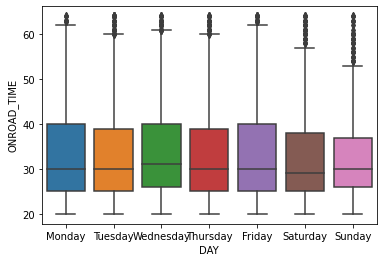

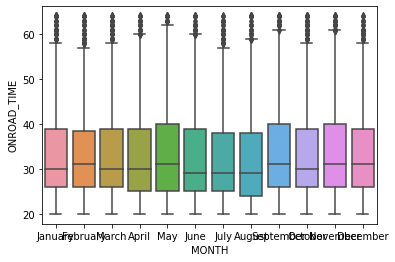

1879_1899


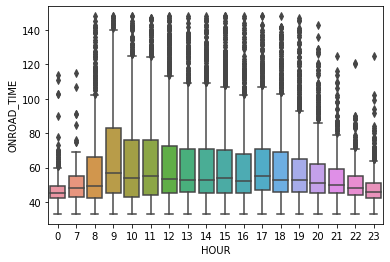

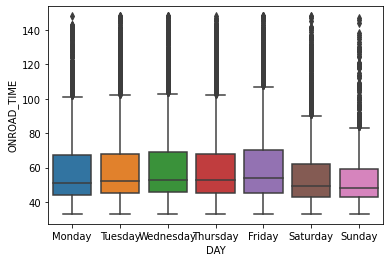

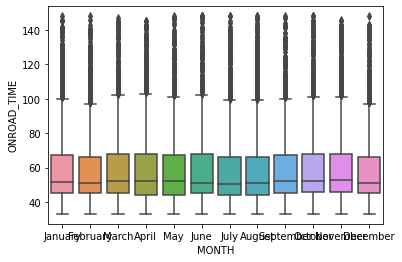

1878_1879


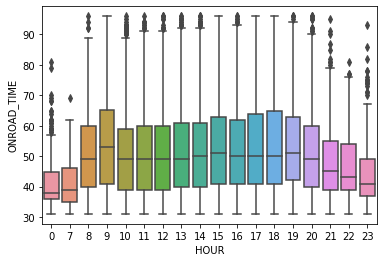

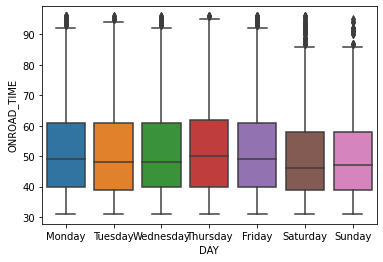

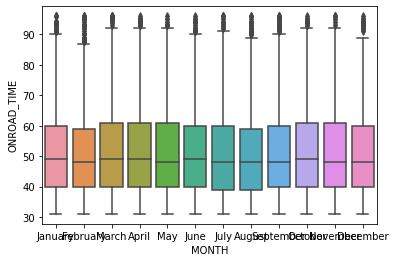

6107_6108


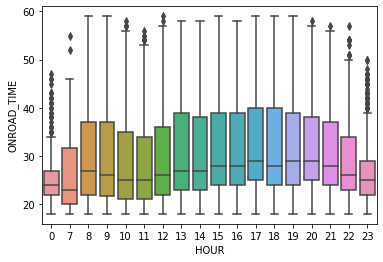

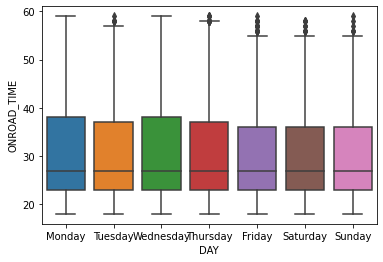

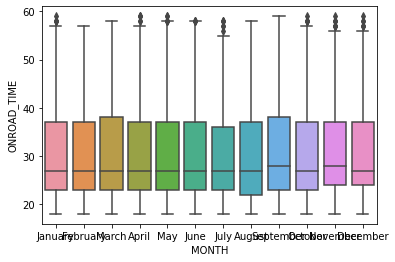

1870_1871


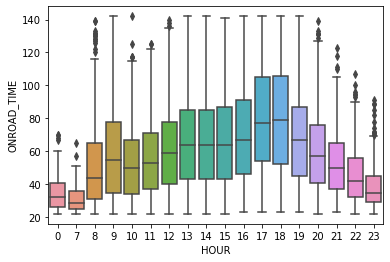

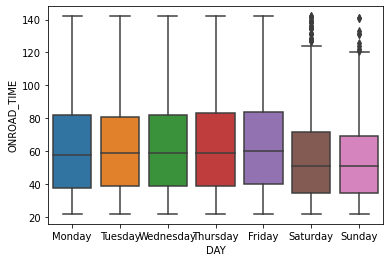

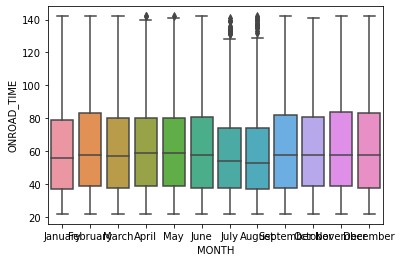

7029_7038


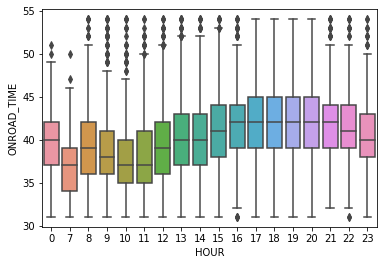

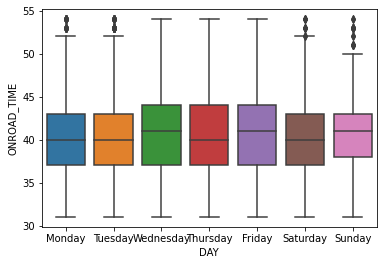

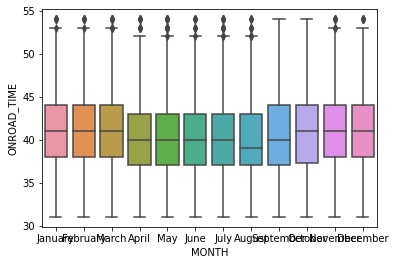

7160_7047


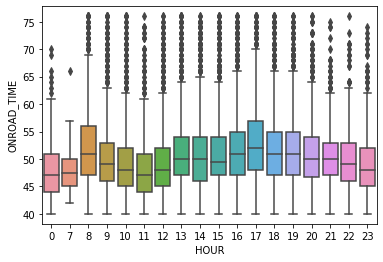

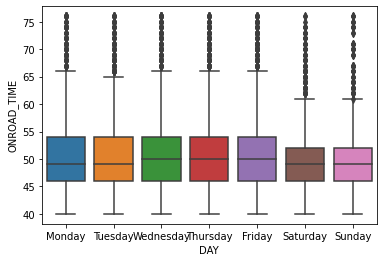

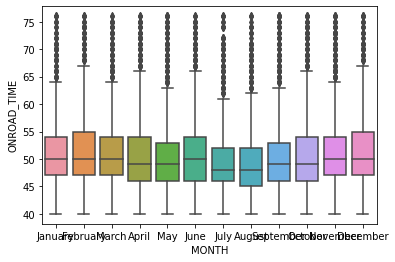

7020_7029


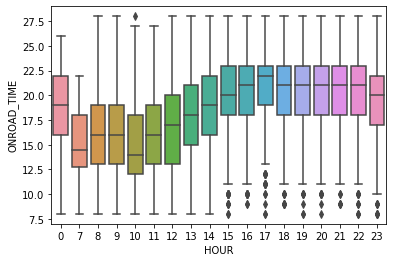

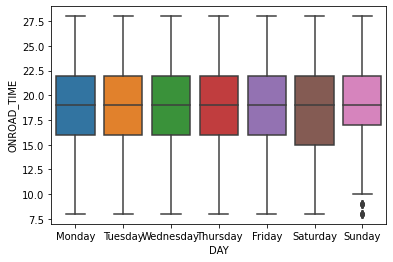

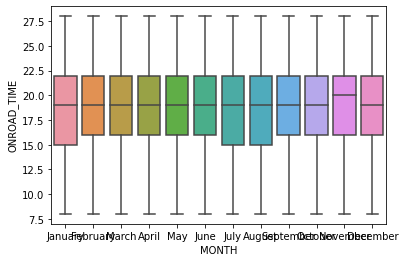

1869_1870


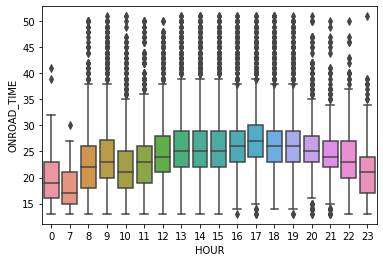

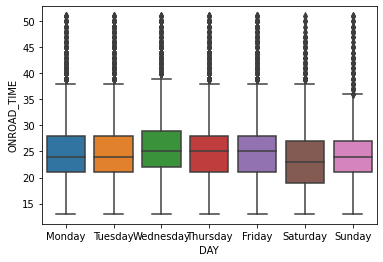

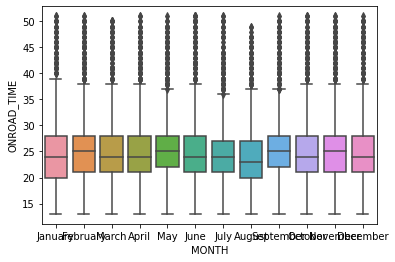

7047_7161


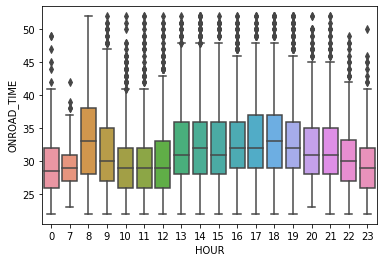

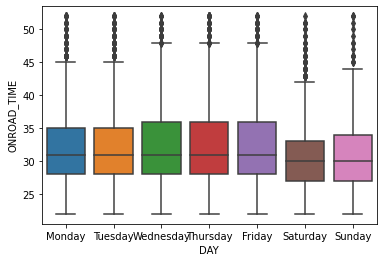

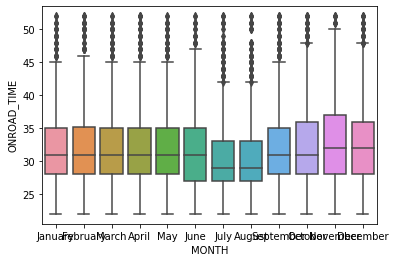

7038_7011


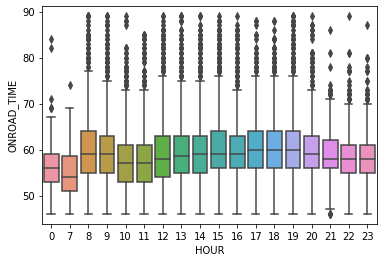

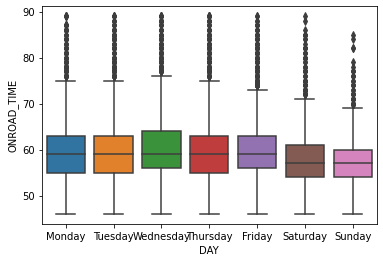

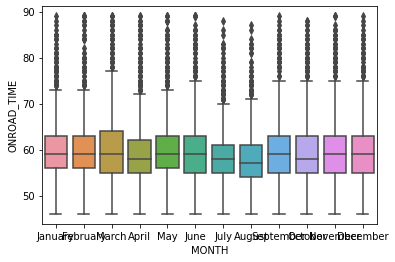

7586_7587


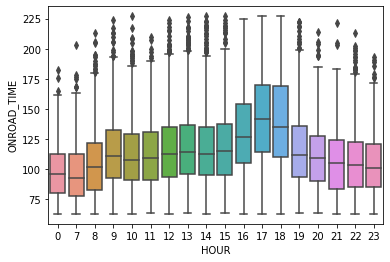

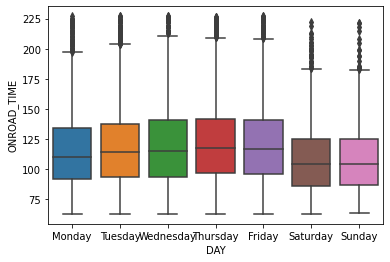

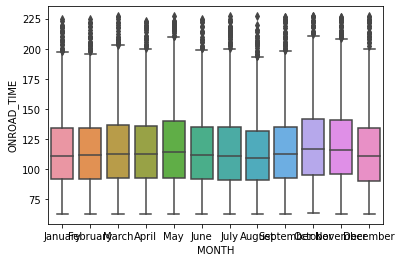

6110_7020


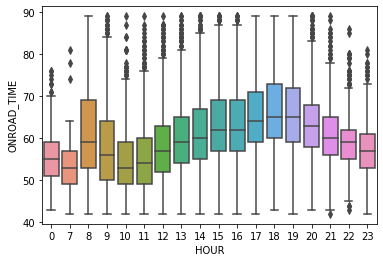

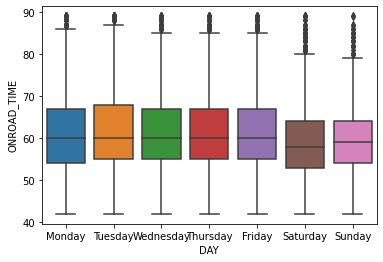

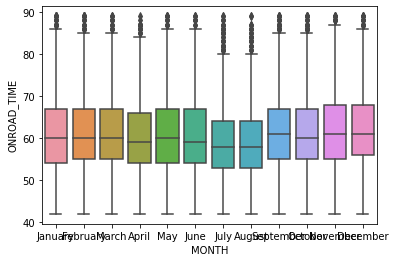

2171_7160


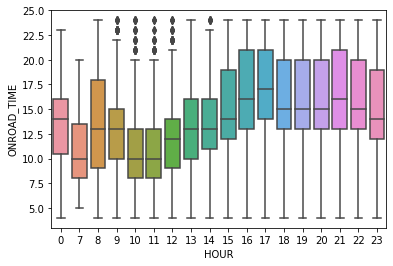

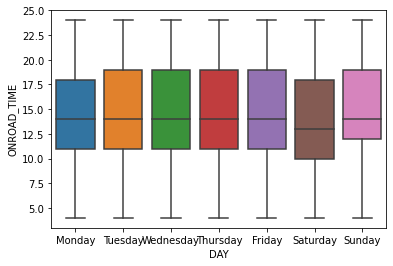

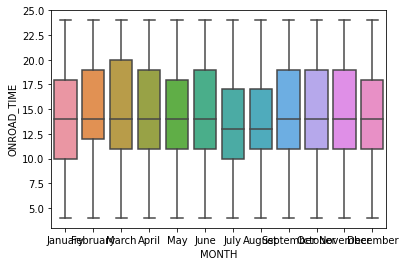

7011_2171


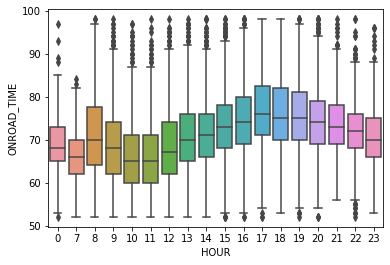

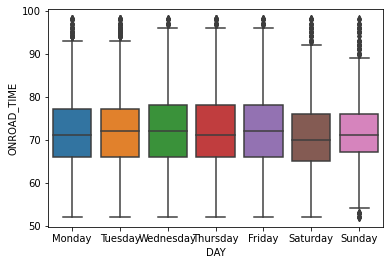

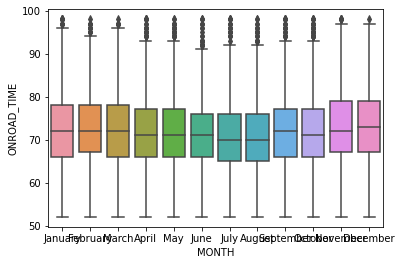

7389_7025


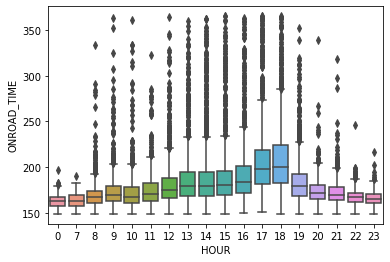

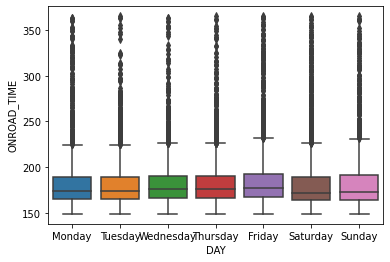

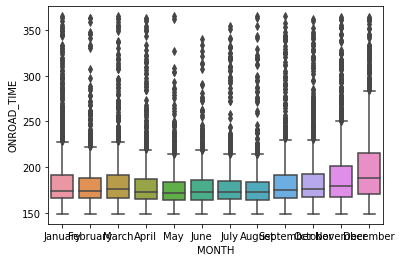

7588_328


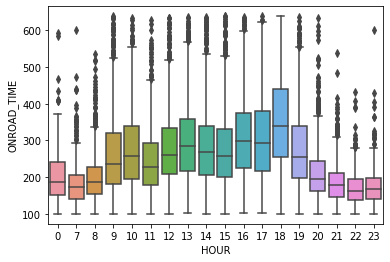

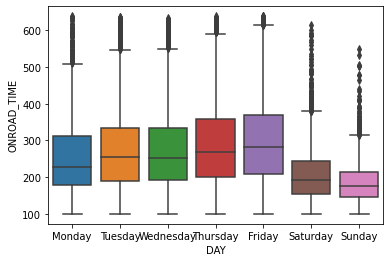

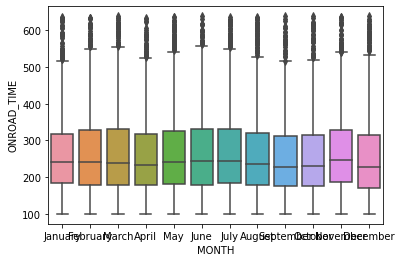

1666_1807


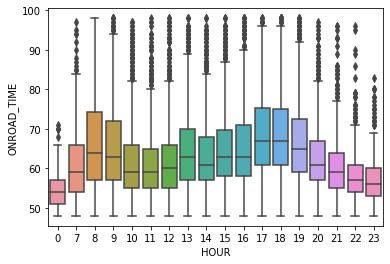

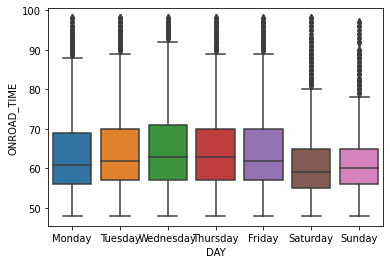

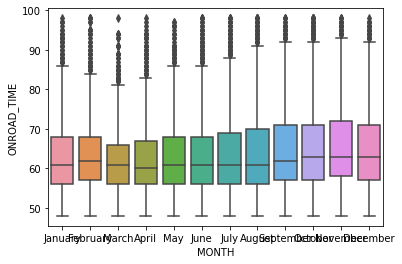

4464_1869


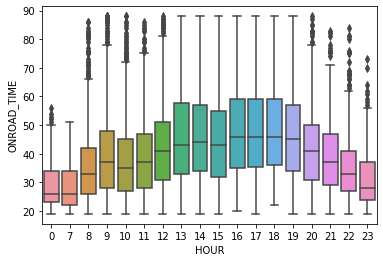

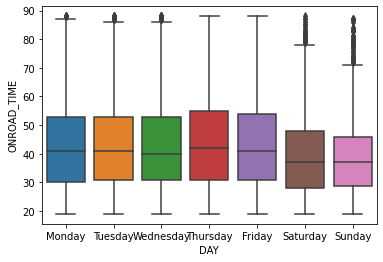

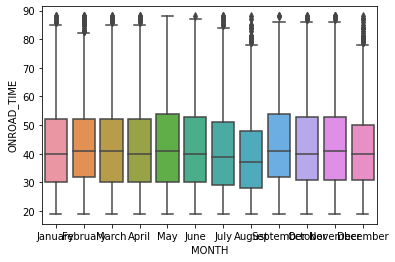

1808_7389


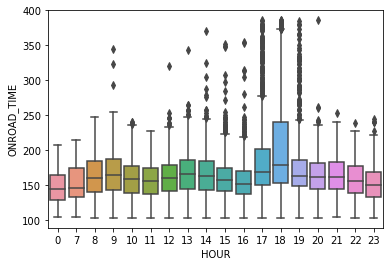

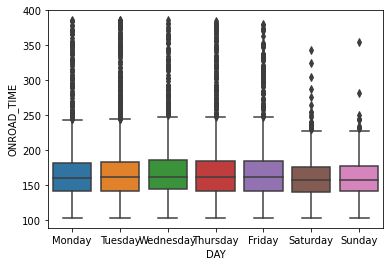

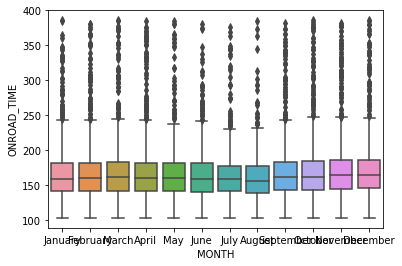

1807_7167


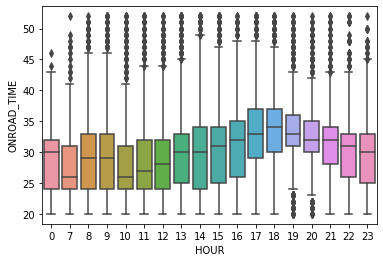

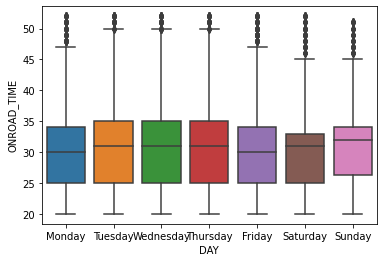

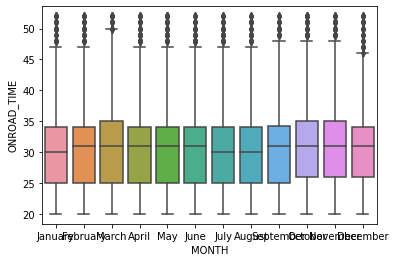

7167_1808


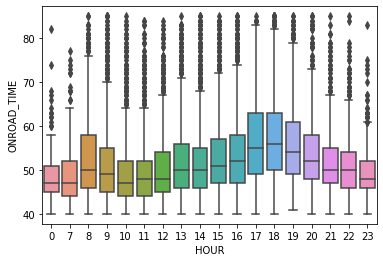

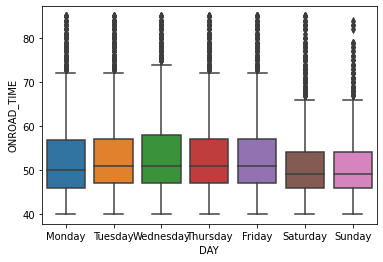

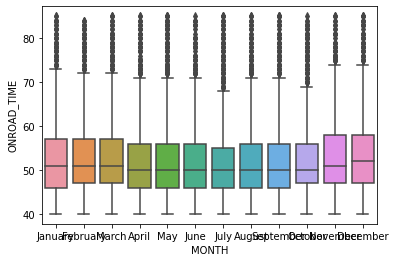

7025_4464


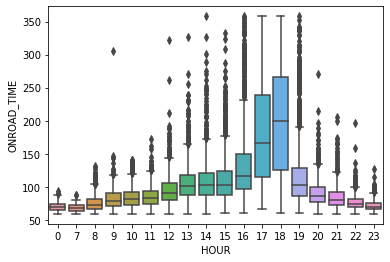

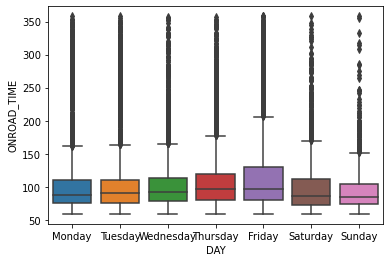

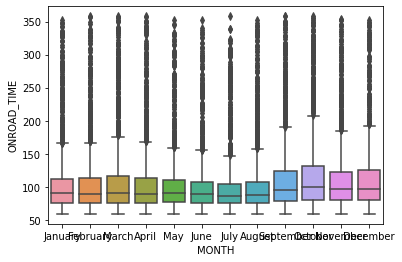

1665_1666


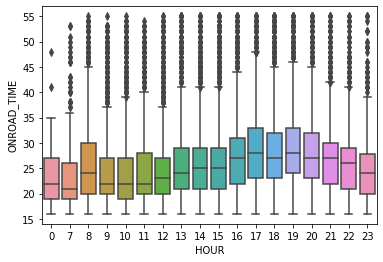

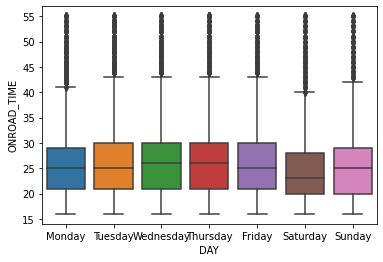

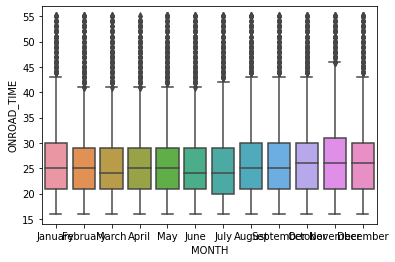

1664_1665


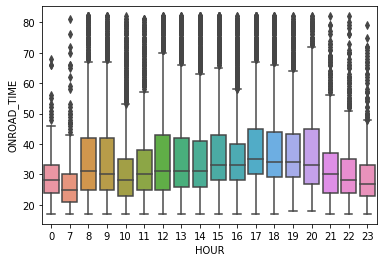

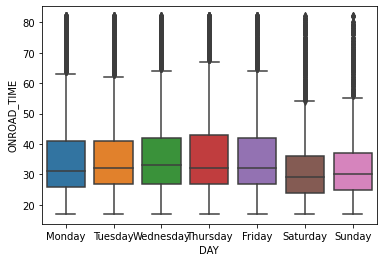

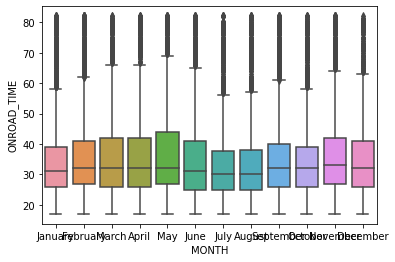

1662_1664


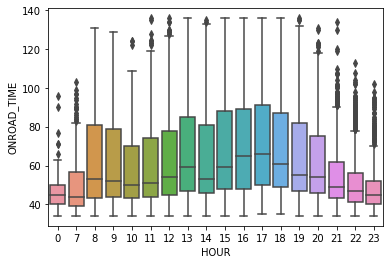

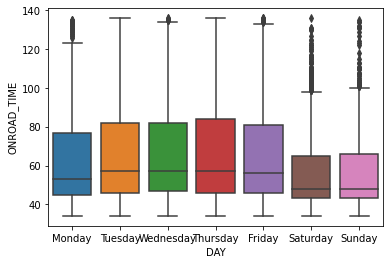

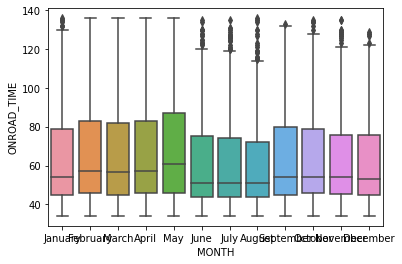

1661_1662


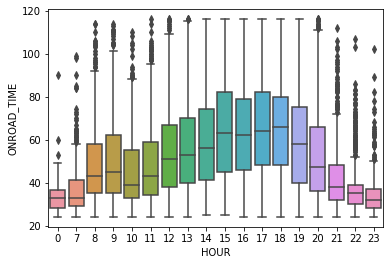

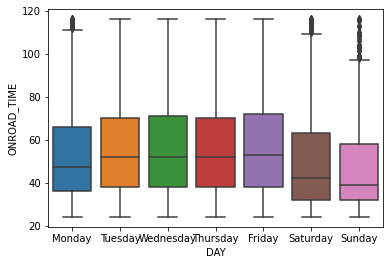

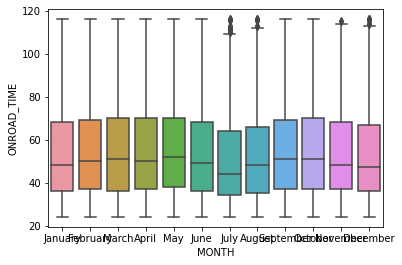

1660_1661


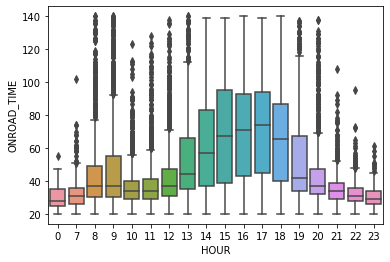

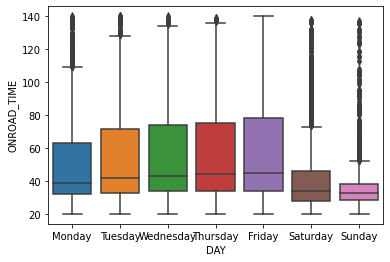

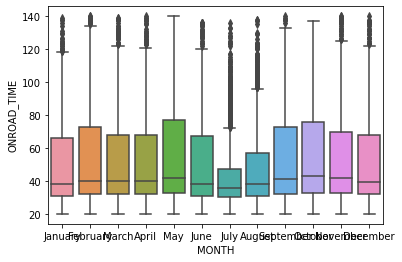

1806_1660


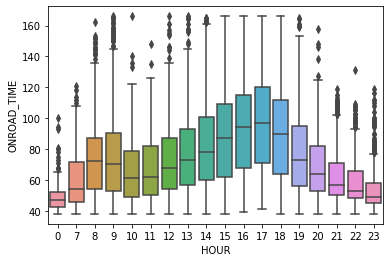

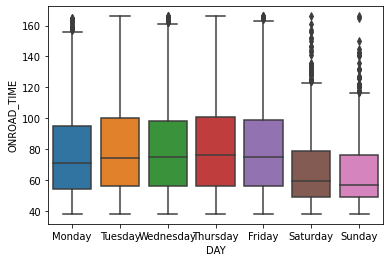

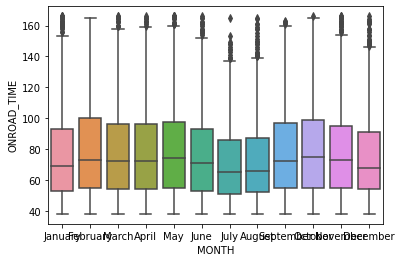

1805_1806


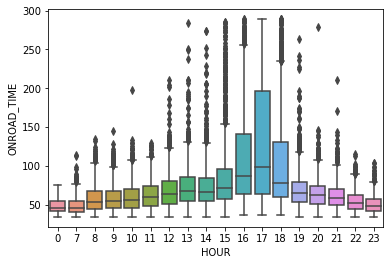

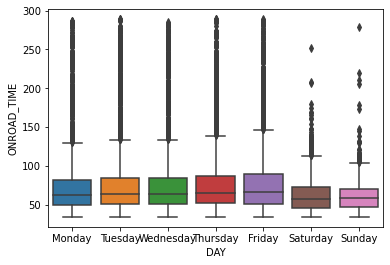

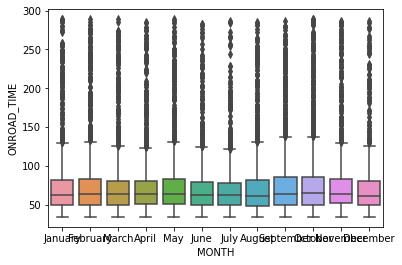

1914_1805


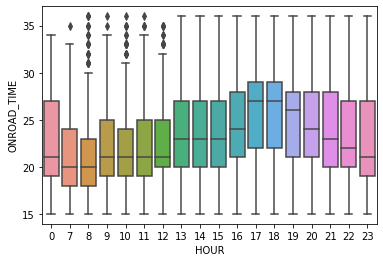

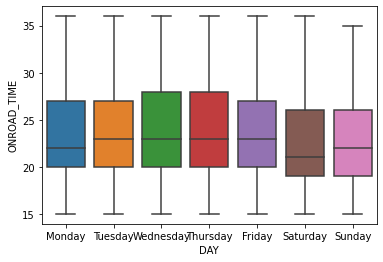

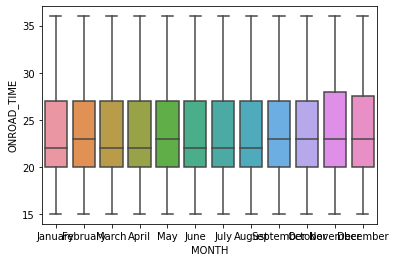

1648_1649


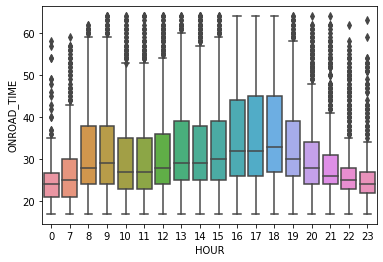

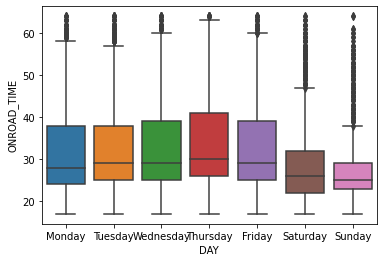

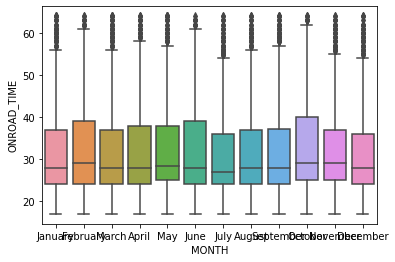

1649_1911


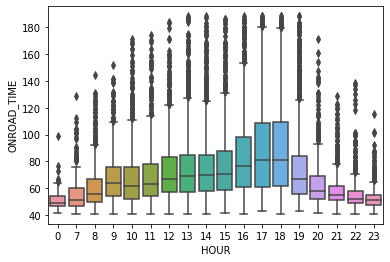

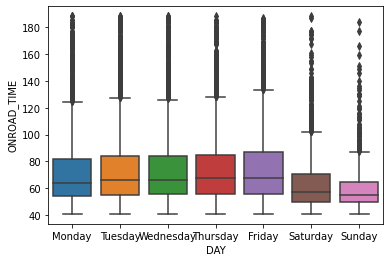

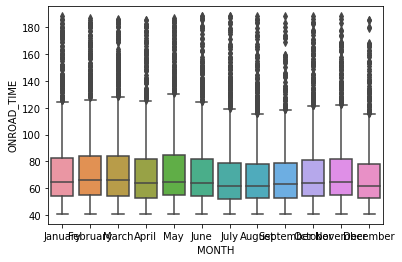

1913_1914


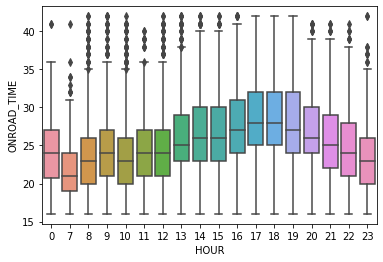

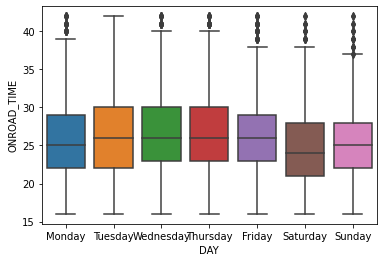

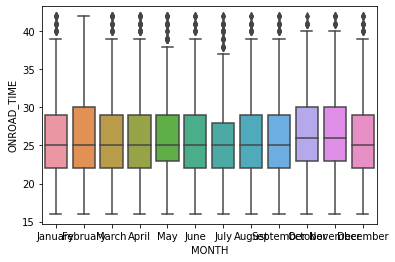

1647_1648


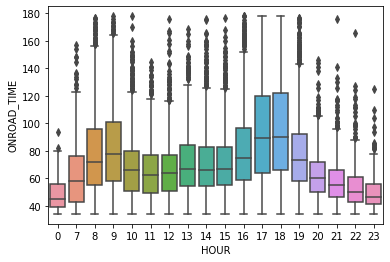

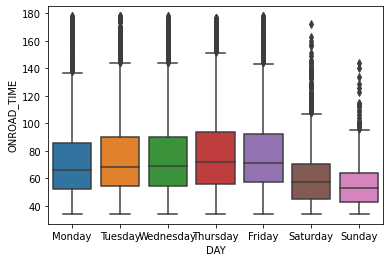

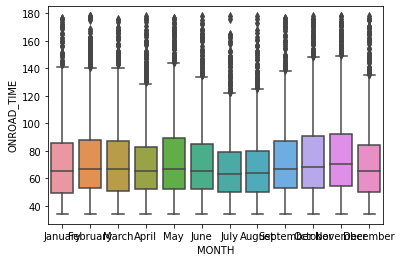

1911_1913


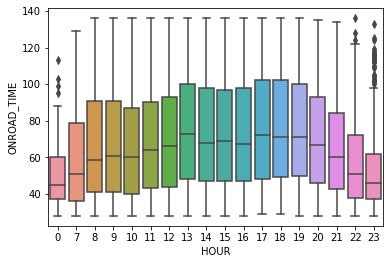

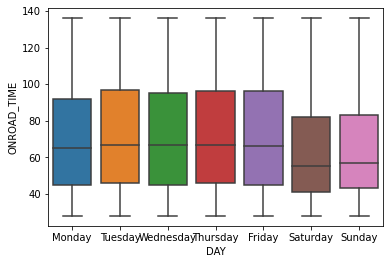

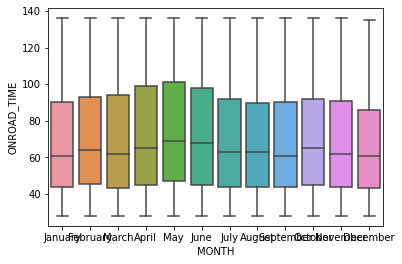

786_793


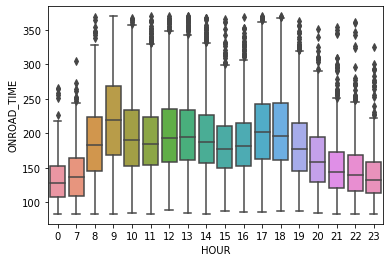

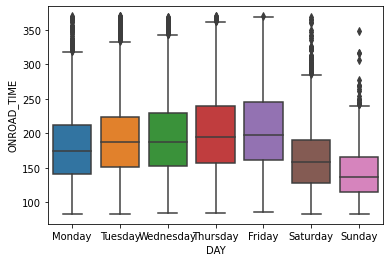

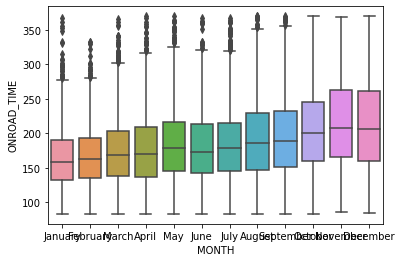

1445_1647


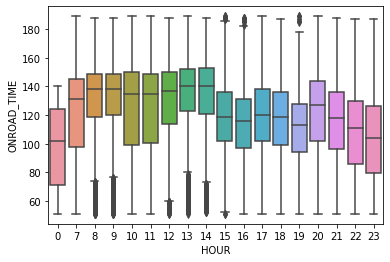

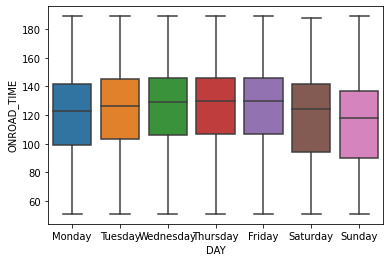

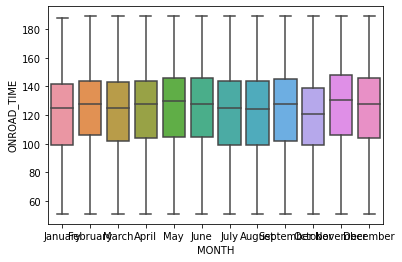

1444_1445


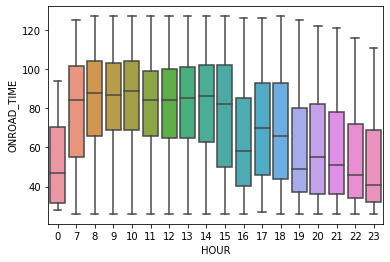

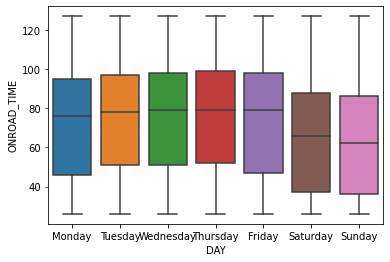

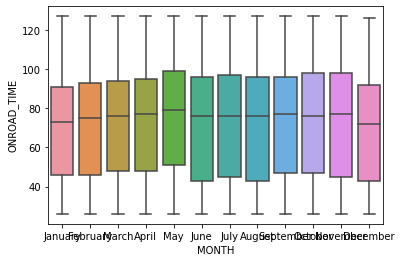

793_7576


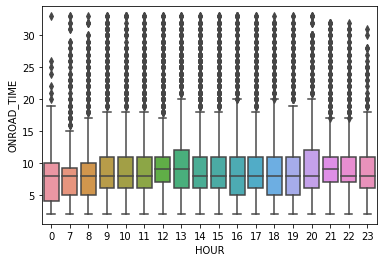

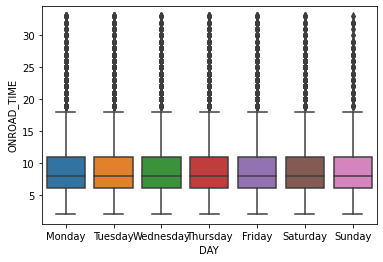

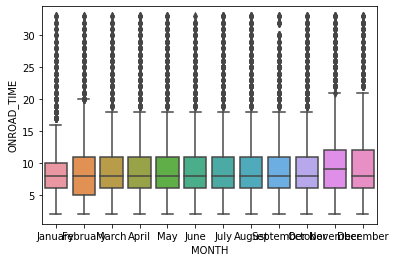

1443_1444


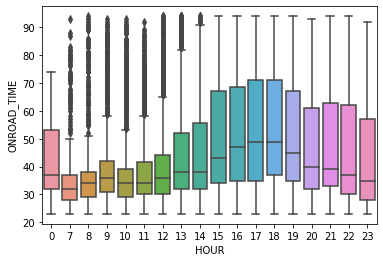

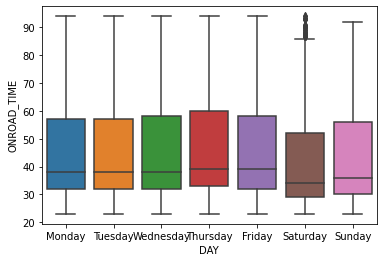

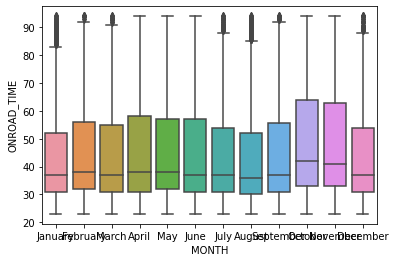

328_1443


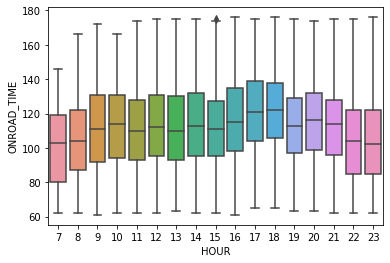

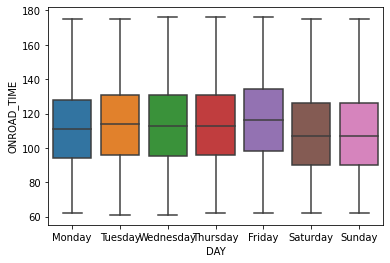

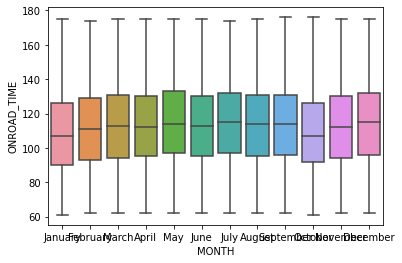

4529_7586


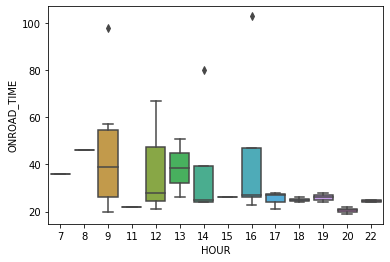

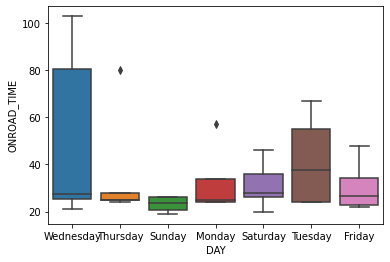

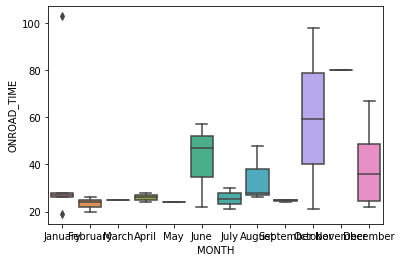

7576_4529


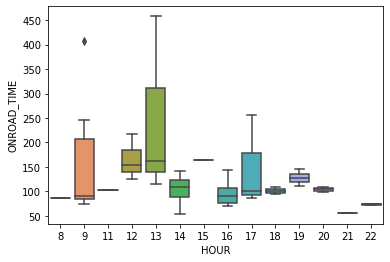

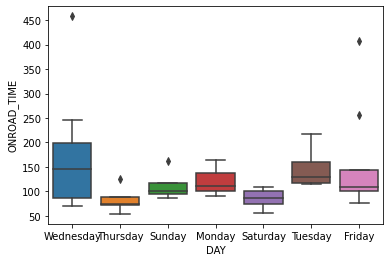

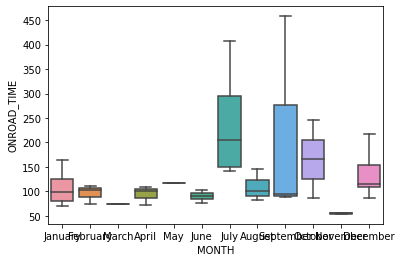

In [22]:
for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
    print(pair)
    
    data = df.loc[(df['STARTSTOP'] == start_end_pairs.loc[i, 'STARTSTOP']) & (df['ENDSTOP'] == start_end_pairs.loc[i, 'ENDSTOP'])]
    
    for categorical_feature in ['HOUR', 'DAY', 'MONTH']:
        sns.boxplot(x = categorical_feature, y = 'ONROAD_TIME', data = data)
        plt.show()

## Rush Hour

In [23]:
df.head()

,STARTSTOP,LINEID,HOUR,ENDSTOP,JOURNEYTIME,PLANNED_JOURNEYTIME,STOP_TIME,MONTH,DAY,ONROAD_TIME
0,767,39A_1,9,768,138.0,103.0,0.0,January,Monday,138.0
1,768,39A_1,9,769,20.0,24.0,0.0,January,Monday,20.0
2,769,39A_1,9,770,29.0,38.0,0.0,January,Monday,29.0
3,770,39A_1,9,771,10.0,16.0,0.0,January,Monday,10.0
4,771,39A_1,9,772,28.0,32.0,0.0,January,Monday,28.0


In [24]:
df['HOUR_BIN'] = pd.cut(x = df['HOUR'], bins = [0, 8, 20, 23], labels = [0, 1, 2])
df['RUSH_HOUR'] = 0

df.head()

,STARTSTOP,LINEID,HOUR,ENDSTOP,JOURNEYTIME,PLANNED_JOURNEYTIME,STOP_TIME,MONTH,DAY,ONROAD_TIME,HOUR_BIN,RUSH_HOUR
0,767,39A_1,9,768,138.0,103.0,0.0,January,Monday,138.0,1,0
1,768,39A_1,9,769,20.0,24.0,0.0,January,Monday,20.0,1,0
2,769,39A_1,9,770,29.0,38.0,0.0,January,Monday,29.0,1,0
3,770,39A_1,9,771,10.0,16.0,0.0,January,Monday,10.0,1,0
4,771,39A_1,9,772,28.0,32.0,0.0,January,Monday,28.0,1,0


In [25]:
df.loc[df['HOUR_BIN'] == 1, 'RUSH_HOUR'] = 1

df.head()

,STARTSTOP,LINEID,HOUR,ENDSTOP,JOURNEYTIME,PLANNED_JOURNEYTIME,STOP_TIME,MONTH,DAY,ONROAD_TIME,HOUR_BIN,RUSH_HOUR
0,767,39A_1,9,768,138.0,103.0,0.0,January,Monday,138.0,1,1
1,768,39A_1,9,769,20.0,24.0,0.0,January,Monday,20.0,1,1
2,769,39A_1,9,770,29.0,38.0,0.0,January,Monday,29.0,1,1
3,770,39A_1,9,771,10.0,16.0,0.0,January,Monday,10.0,1,1
4,771,39A_1,9,772,28.0,32.0,0.0,January,Monday,28.0,1,1


In [26]:
df.drop(['HOUR_BIN'], axis = 1, inplace = True)

df.head()

,STARTSTOP,LINEID,HOUR,ENDSTOP,JOURNEYTIME,PLANNED_JOURNEYTIME,STOP_TIME,MONTH,DAY,ONROAD_TIME,RUSH_HOUR
0,767,39A_1,9,768,138.0,103.0,0.0,January,Monday,138.0,1
1,768,39A_1,9,769,20.0,24.0,0.0,January,Monday,20.0,1
2,769,39A_1,9,770,29.0,38.0,0.0,January,Monday,29.0,1
3,770,39A_1,9,771,10.0,16.0,0.0,January,Monday,10.0,1
4,771,39A_1,9,772,28.0,32.0,0.0,January,Monday,28.0,1


## Weekday

In [27]:
df['WEEKDAY'] = 0

In [28]:
df.loc[((df['DAY'] == 'Saturday') | (df['DAY'] == 'Sunday')), 'WEEKDAY'] = 1

df.head()

,STARTSTOP,LINEID,HOUR,ENDSTOP,JOURNEYTIME,PLANNED_JOURNEYTIME,STOP_TIME,MONTH,DAY,ONROAD_TIME,RUSH_HOUR,WEEKDAY
0,767,39A_1,9,768,138.0,103.0,0.0,January,Monday,138.0,1,0
1,768,39A_1,9,769,20.0,24.0,0.0,January,Monday,20.0,1,0
2,769,39A_1,9,770,29.0,38.0,0.0,January,Monday,29.0,1,0
3,770,39A_1,9,771,10.0,16.0,0.0,January,Monday,10.0,1,0
4,771,39A_1,9,772,28.0,32.0,0.0,January,Monday,28.0,1,0


### outliers

In [29]:
for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
    print(pair)
    
    data = df.loc[(df['STARTSTOP'] == start_end_pairs.loc[i, 'STARTSTOP']) & (df['ENDSTOP'] == start_end_pairs.loc[i, 'ENDSTOP'])]
    
    # remove outliers
    if (data['RUSH_HOUR'].nunique() == 2):
        outliers = data[(data.loc[data['RUSH_HOUR'] != 1, 'ONROAD_TIME'] > np.percentile(data.loc[data['RUSH_HOUR'] == 1, 'ONROAD_TIME'], 99)) | 
                        (data.loc[data['RUSH_HOUR'] != 1, 'STOP_TIME'] >  np.percentile(data.loc[data['RUSH_HOUR'] == 1, 'STOP_TIME'], 99)) | 
                        (data.loc[data['RUSH_HOUR'] == 1, 'ONROAD_TIME'] < np.percentile(data.loc[data['RUSH_HOUR'] != 1, 'ONROAD_TIME'], 1)) | 
                        (data.loc[data['RUSH_HOUR'] == 1, 'STOP_TIME'] <  np.percentile(data.loc[data['RUSH_HOUR'] != 1, 'STOP_TIME'], 1))]
    
        df.drop(outliers.index, inplace = True)

777_779
773_774
776_777
774_775
772_773
775_776
782_783
781_782
779_780
780_781
771_772
783_784
784_785
770_771
785_786
769_770
767_768
768_769
7587_7588
1877_1878
6109_6110
7161_7162
1876_1877
1875_1876
1872_1873
1873_1874
1874_1875
1871_1872
1899_6107
6108_6109
1879_1899
1878_1879
6107_6108
1870_1871
7029_7038
7160_7047
7020_7029
1869_1870
7047_7161
7038_7011
7586_7587
6110_7020
2171_7160
7011_2171
7389_7025
7588_328
1666_1807
4464_1869
1808_7389
1807_7167
7167_1808
7025_4464
1665_1666
1664_1665
1662_1664
1661_1662
1660_1661
1806_1660
1805_1806
1914_1805
1648_1649
1649_1911
1913_1914
1647_1648
1911_1913
786_793
1445_1647
1444_1445
793_7576
1443_1444
328_1443
4529_7586
7576_4529


In [30]:
for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
    print(pair)
    
    data = df.loc[(df['STARTSTOP'] == start_end_pairs.loc[i, 'STARTSTOP']) & (df['ENDSTOP'] == start_end_pairs.loc[i, 'ENDSTOP'])]
    
    if (data['WEEKDAY'].nunique() == 2):
    # remove outliers
        outliers = data[(data.loc[data['WEEKDAY'] != 1, 'ONROAD_TIME'] > np.percentile(data.loc[data['WEEKDAY'] == 1, 'ONROAD_TIME'], 99)) | 
                        (data.loc[data['WEEKDAY'] != 1, 'STOP_TIME'] >  np.percentile(data.loc[data['WEEKDAY'] == 1, 'STOP_TIME'], 99)) | 
                        (data.loc[data['WEEKDAY'] == 1, 'ONROAD_TIME'] < np.percentile(data.loc[data['WEEKDAY'] != 1, 'ONROAD_TIME'], 1)) | 
                        (data.loc[data['WEEKDAY'] == 1, 'STOP_TIME'] <  np.percentile(data.loc[data['WEEKDAY'] != 1, 'STOP_TIME'], 1))]
    
        df.drop(outliers.index, inplace = True)

777_779
773_774
776_777
774_775
772_773
775_776
782_783
781_782
779_780
780_781
771_772
783_784
784_785
770_771
785_786
769_770
767_768
768_769
7587_7588
1877_1878
6109_6110
7161_7162
1876_1877
1875_1876
1872_1873
1873_1874
1874_1875
1871_1872
1899_6107
6108_6109
1879_1899
1878_1879
6107_6108
1870_1871
7029_7038
7160_7047
7020_7029
1869_1870
7047_7161
7038_7011
7586_7587
6110_7020
2171_7160
7011_2171
7389_7025
7588_328
1666_1807
4464_1869
1808_7389
1807_7167
7167_1808
7025_4464
1665_1666
1664_1665
1662_1664
1661_1662
1660_1661
1806_1660
1805_1806
1914_1805
1648_1649
1649_1911
1913_1914
1647_1648
1911_1913
786_793
1445_1647
1444_1445
793_7576
1443_1444
328_1443
4529_7586
7576_4529


In [31]:
df[['JOURNEYTIME', 'PLANNED_JOURNEYTIME', 'STOP_TIME', 'ONROAD_TIME']].describe().T

,count,mean,std,min,25%,50%,75%,max
JOURNEYTIME,1352423.0,68.644245,55.120628,2.0,36.0,53.0,82.0,643.0
PLANNED_JOURNEYTIME,1352423.0,62.681208,56.229586,5.0,31.0,45.0,70.0,865.0
STOP_TIME,1352423.0,13.093470,23.165153,0.0,0.0,11.0,17.0,486.0
ONROAD_TIME,1352423.0,55.550775,45.730781,2.0,27.0,41.0,67.0,613.0


### ONROAD_TIME + STOP_TIME, PLANNED_JOURNEYTIME 

In [32]:
for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
    print(pair)
    
    data = df.loc[(df['STARTSTOP'] == start_end_pairs.loc[i, 'STARTSTOP']) & (df['ENDSTOP'] == start_end_pairs.loc[i, 'ENDSTOP'])]
    
    # onroad_time is supposed to be very close to planned_journeytime
    outliers = data[((data['ONROAD_TIME'] + data['STOP_TIME'].max()) < data['PLANNED_JOURNEYTIME']) | 
                    ((data['ONROAD_TIME'].max() + data['STOP_TIME']) < data['PLANNED_JOURNEYTIME']) |
                    ((data['ONROAD_TIME'].min() + data['STOP_TIME']) > data['PLANNED_JOURNEYTIME'])]
    
    df.drop(outliers.index, inplace = True)

777_779
773_774
776_777
774_775
772_773
775_776
782_783
781_782
779_780
780_781
771_772
783_784
784_785
770_771
785_786
769_770
767_768
768_769
7587_7588
1877_1878
6109_6110
7161_7162
1876_1877
1875_1876
1872_1873
1873_1874
1874_1875
1871_1872
1899_6107
6108_6109
1879_1899
1878_1879
6107_6108
1870_1871
7029_7038
7160_7047
7020_7029
1869_1870
7047_7161
7038_7011
7586_7587
6110_7020
2171_7160
7011_2171
7389_7025
7588_328
1666_1807
4464_1869
1808_7389
1807_7167
7167_1808
7025_4464
1665_1666
1664_1665
1662_1664
1661_1662
1660_1661
1806_1660
1805_1806
1914_1805
1648_1649
1649_1911
1913_1914
1647_1648
1911_1913
786_793
1445_1647
1444_1445
793_7576
1443_1444
328_1443
4529_7586
7576_4529


In [33]:
df[['JOURNEYTIME', 'PLANNED_JOURNEYTIME', 'STOP_TIME', 'ONROAD_TIME']].describe().T

,count,mean,std,min,25%,50%,75%,max
JOURNEYTIME,835789.0,62.407537,50.555793,2.0,32.0,48.0,75.0,629.0
PLANNED_JOURNEYTIME,835789.0,60.526608,42.189269,5.0,38.0,49.0,70.0,417.0
STOP_TIME,835789.0,9.069530,10.479239,0.0,0.0,9.0,15.0,129.0
ONROAD_TIME,835789.0,53.338008,47.224103,2.0,26.0,38.0,63.0,613.0


### zscore < 3

777_779


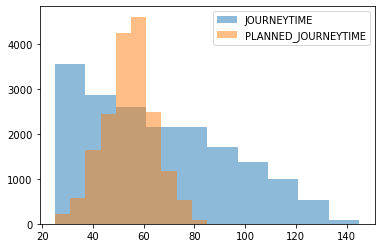

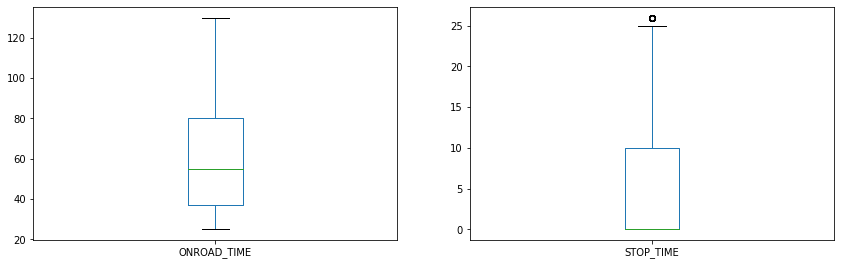

773_774


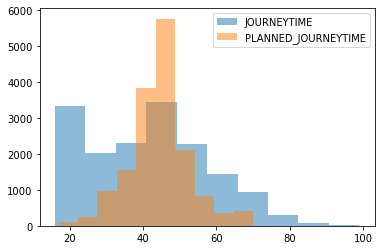

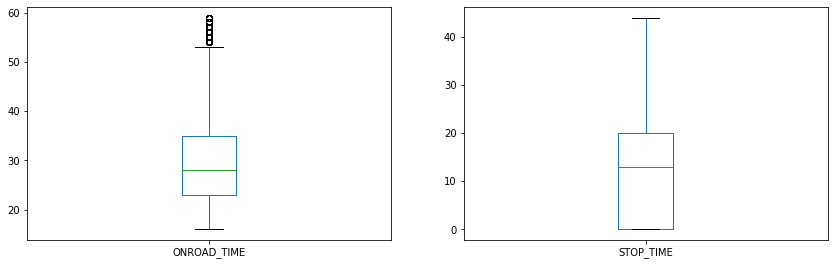

776_777


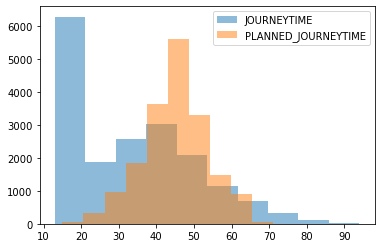

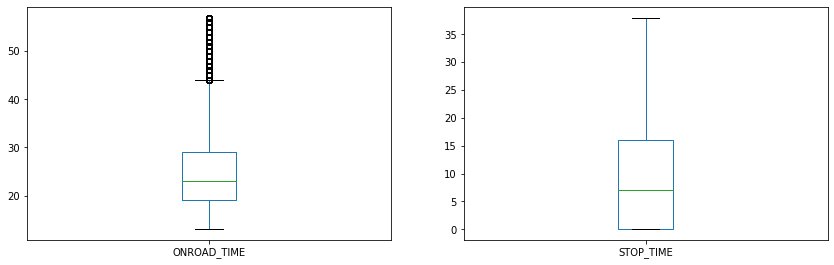

774_775


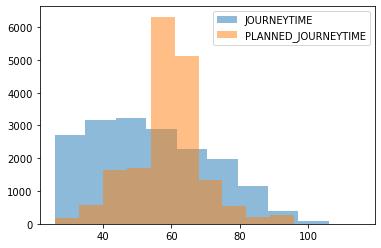

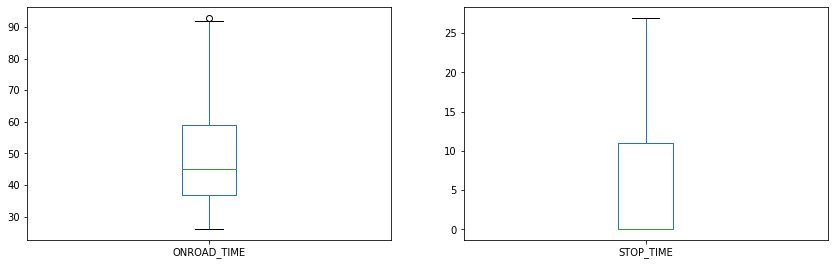

772_773


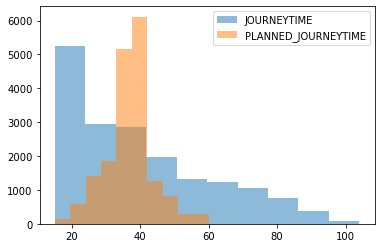

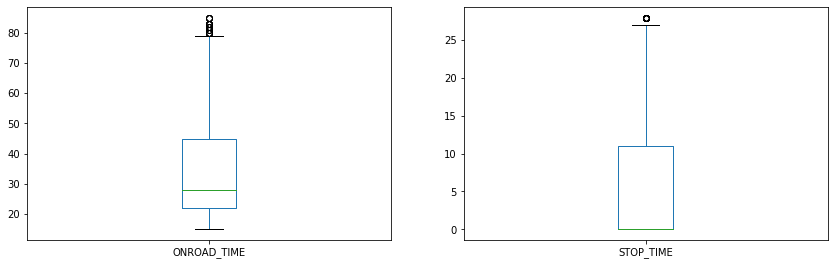

775_776


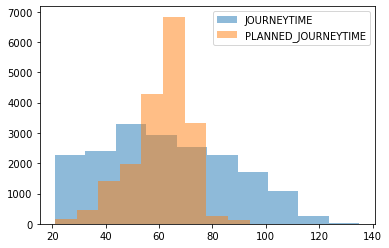

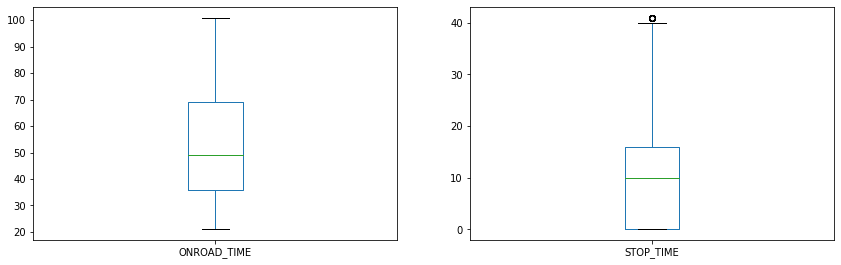

782_783


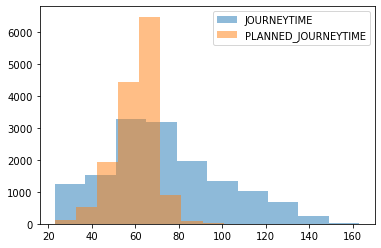

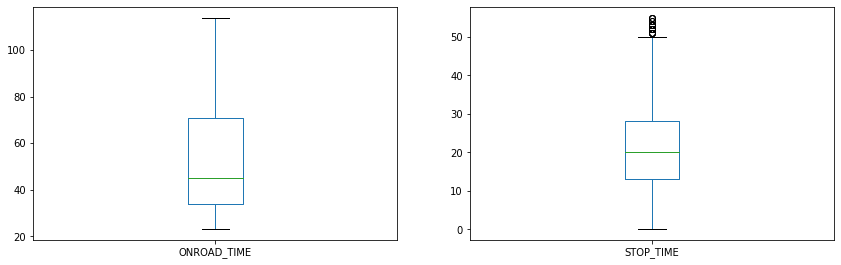

781_782


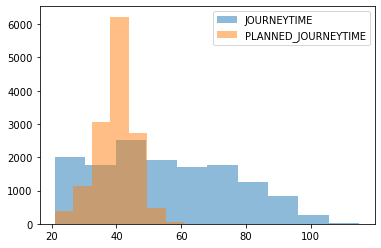

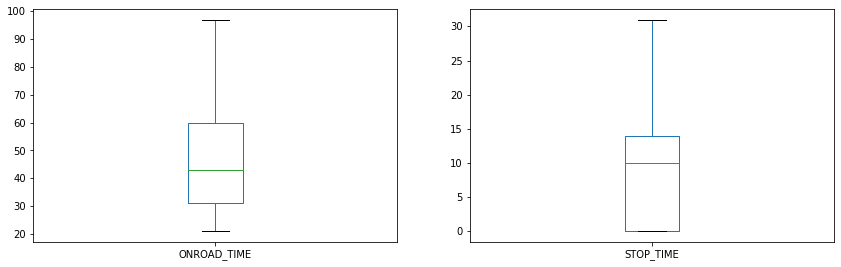

779_780


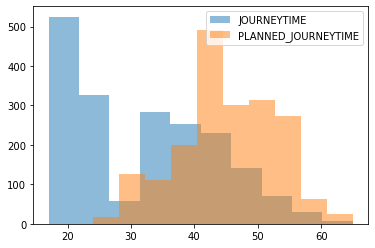

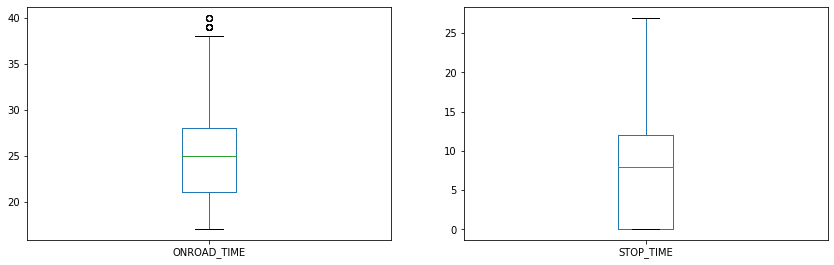

780_781


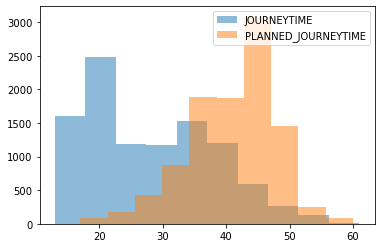

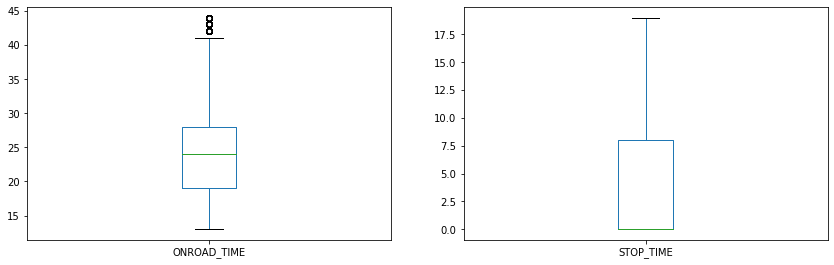

771_772


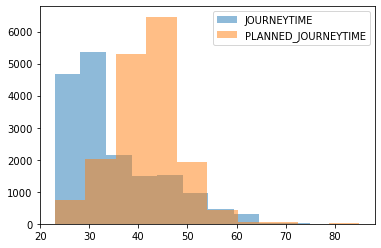

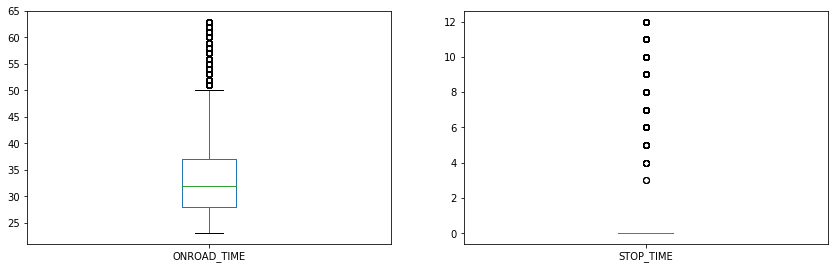

783_784


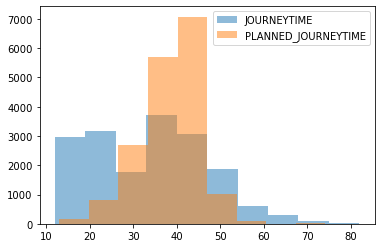

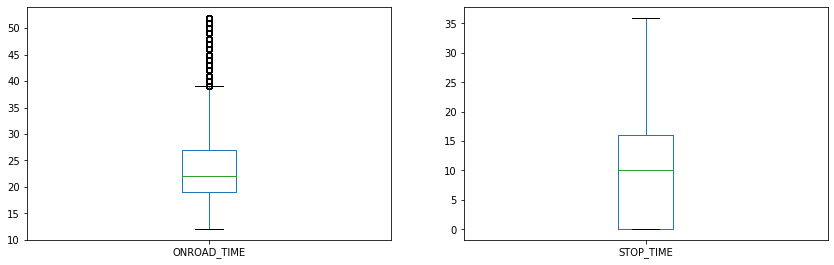

784_785


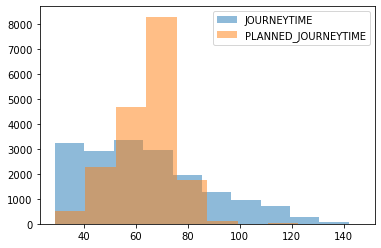

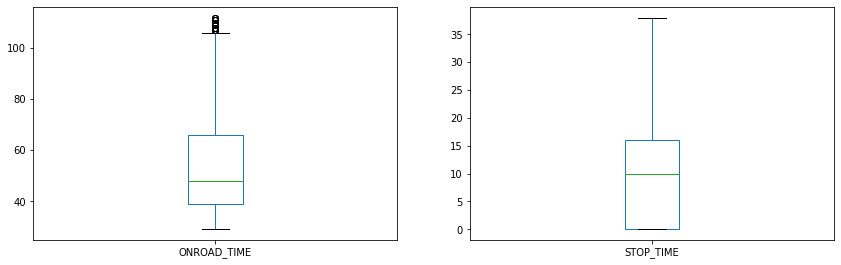

770_771


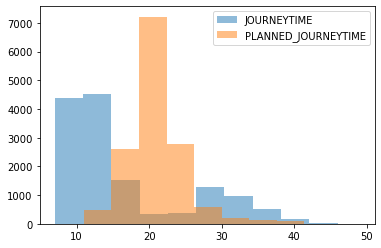

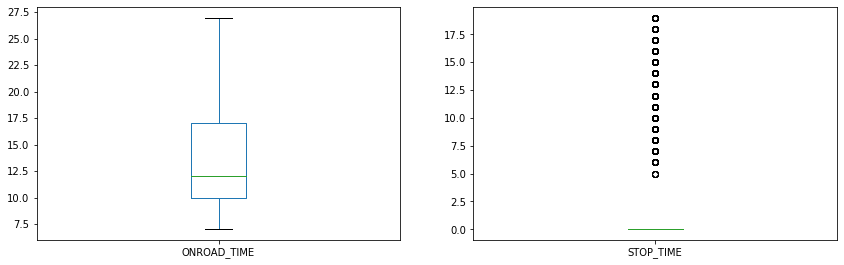

785_786


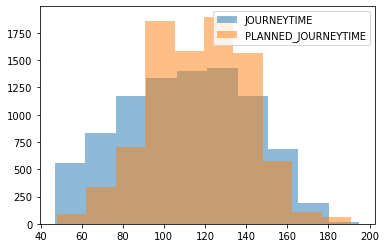

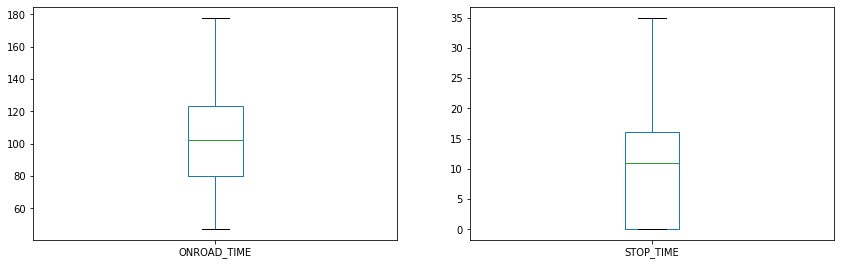

769_770


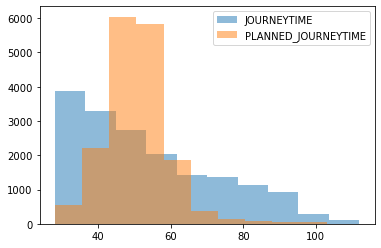

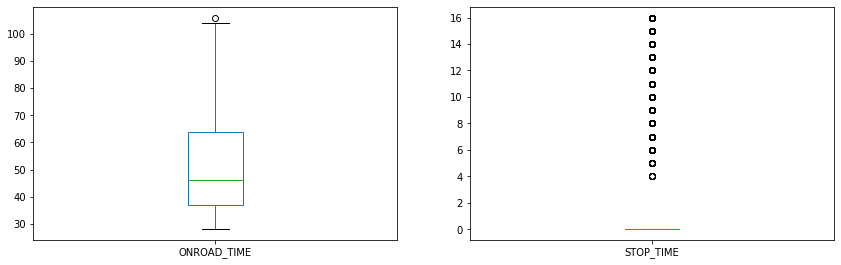

767_768


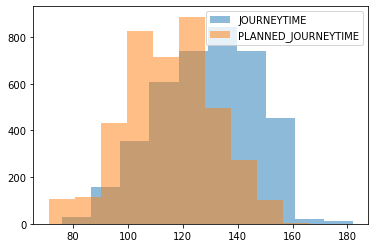

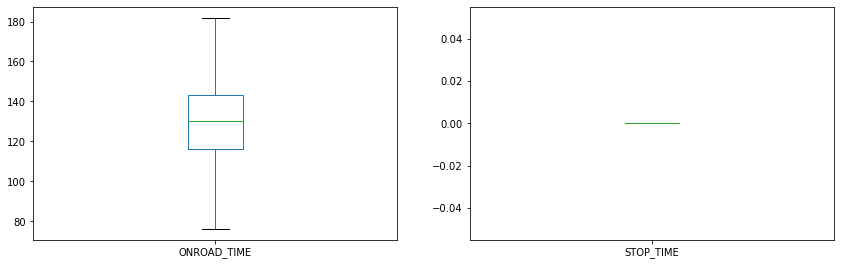

768_769


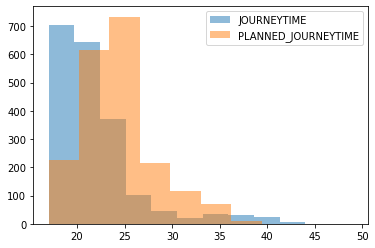

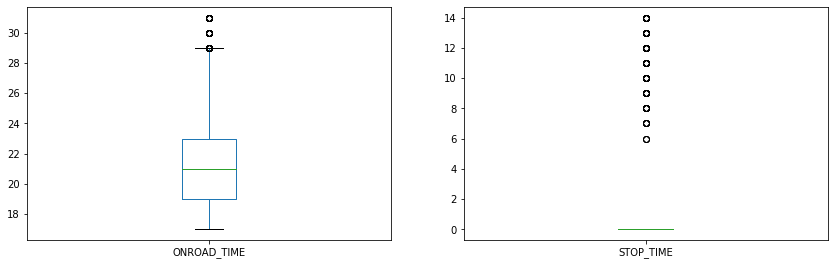

7587_7588


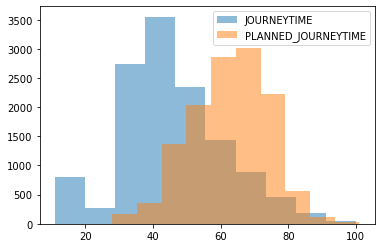

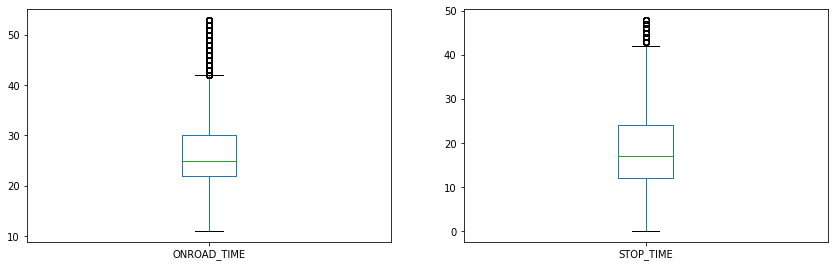

1877_1878


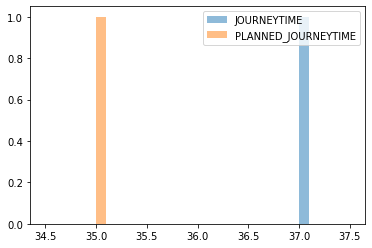

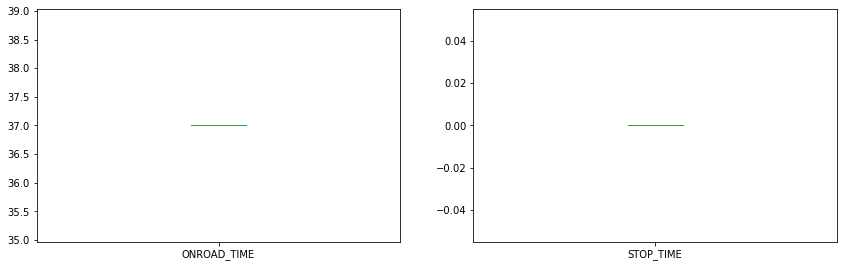

6109_6110


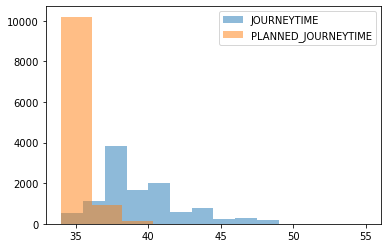

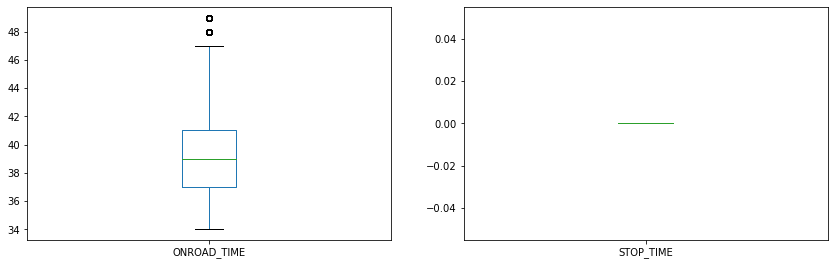

7161_7162


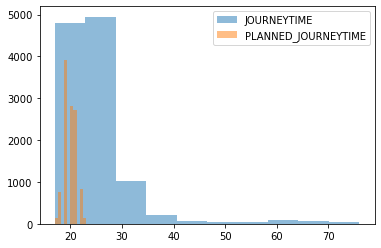

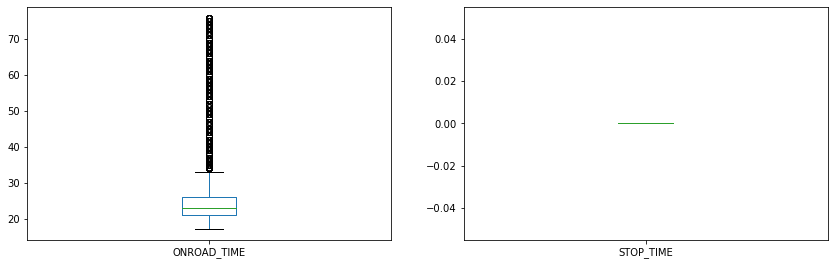

1876_1877


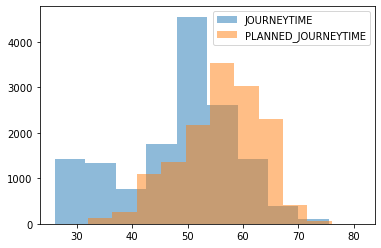

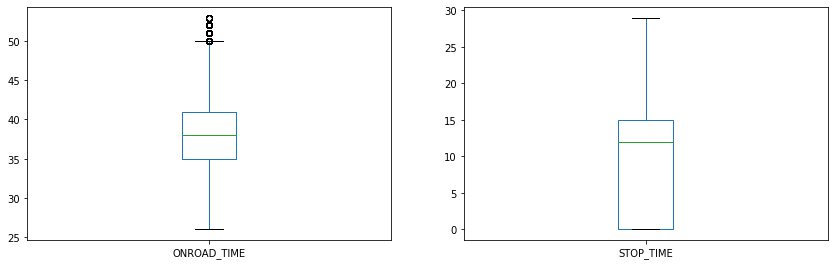

1875_1876


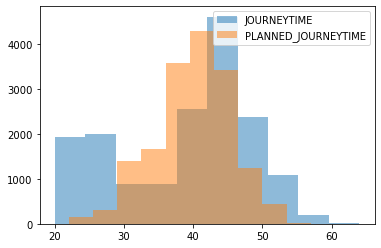

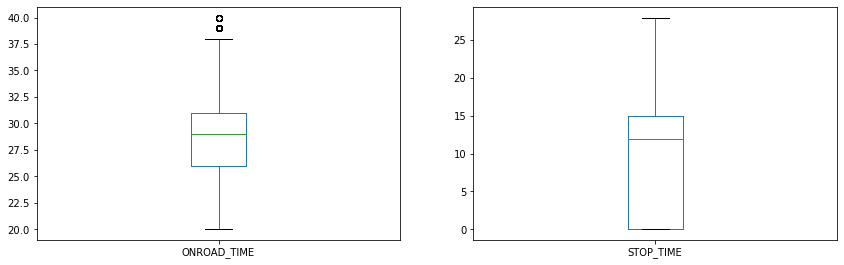

1872_1873


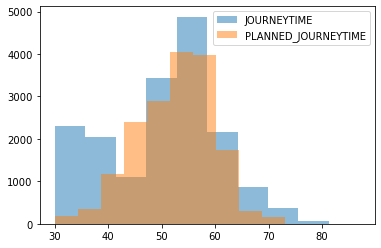

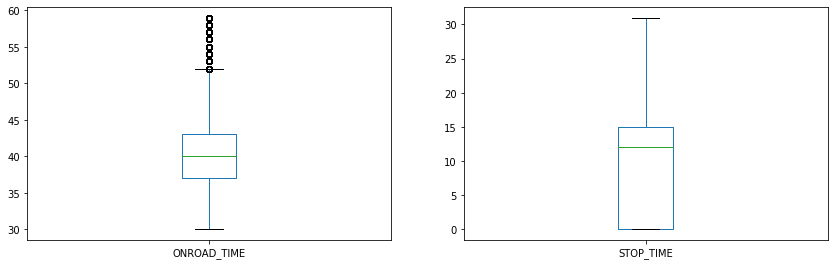

1873_1874


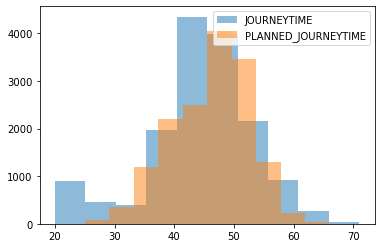

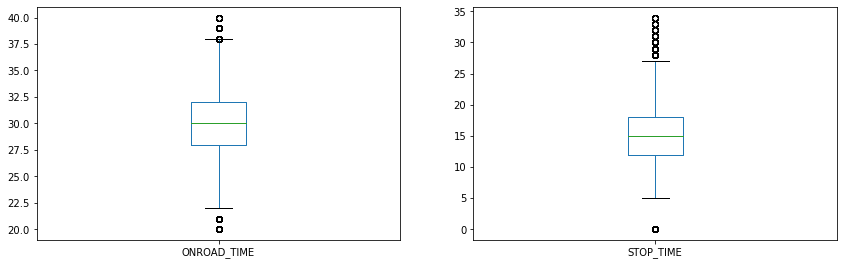

1874_1875


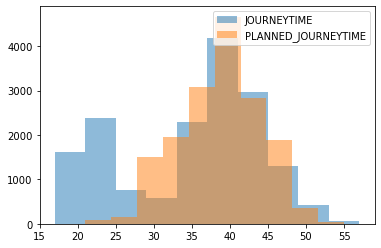

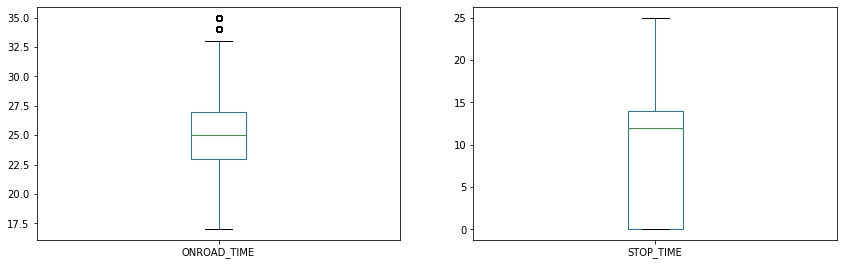

1871_1872


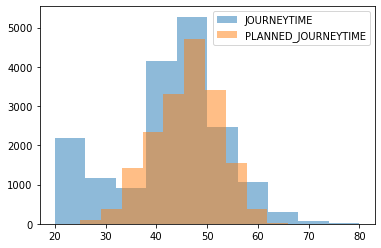

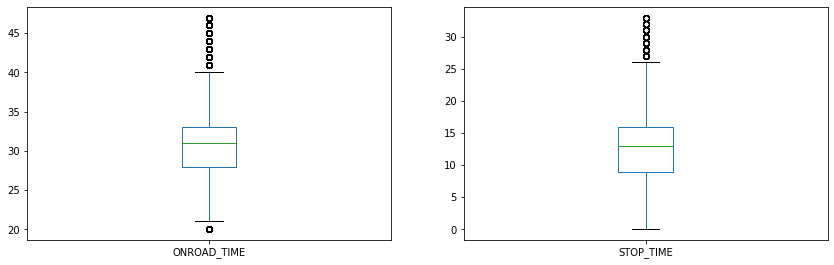

1899_6107


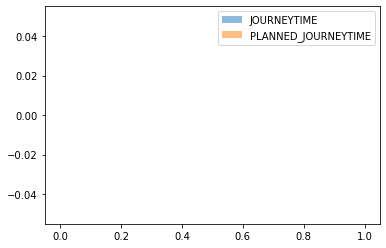

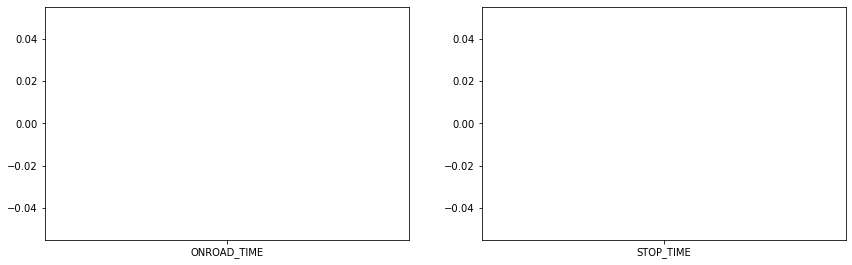

6108_6109


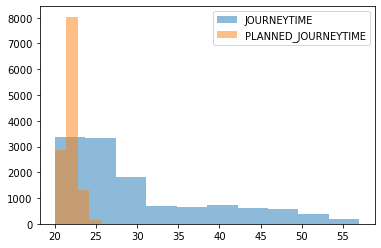

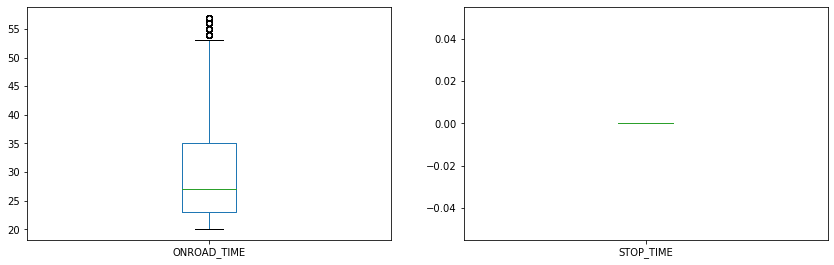

1879_1899


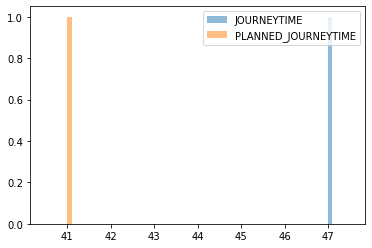

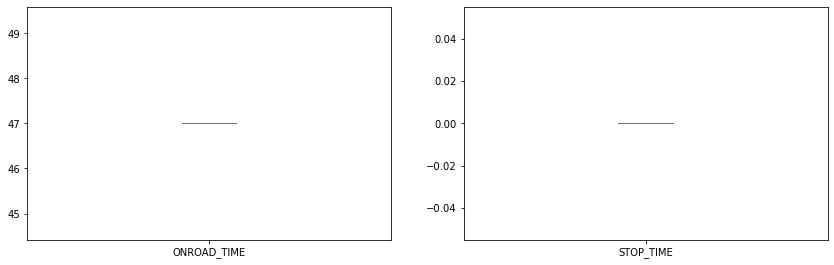

1878_1879


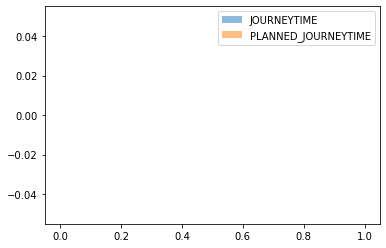

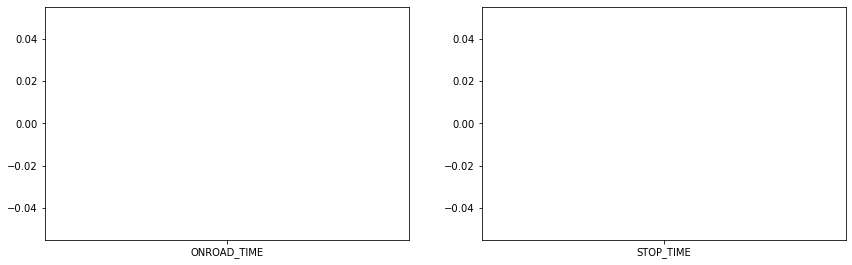

6107_6108


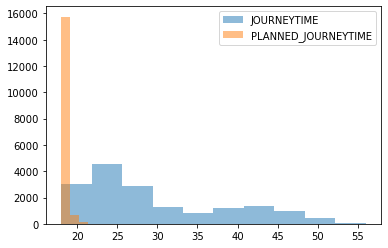

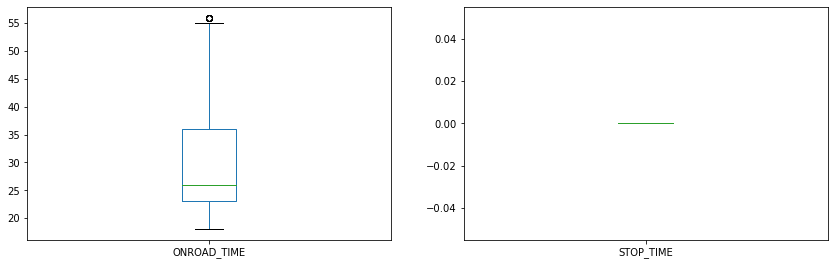

1870_1871


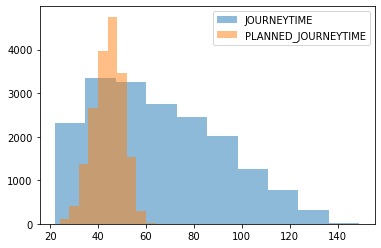

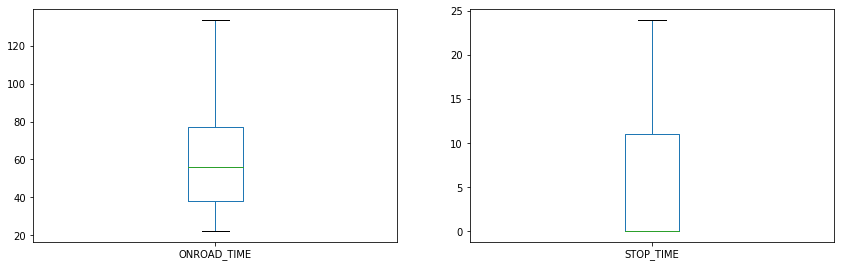

7029_7038


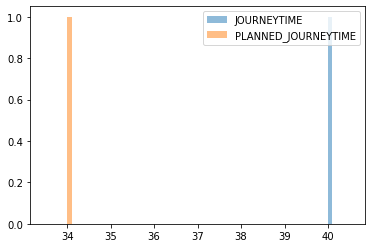

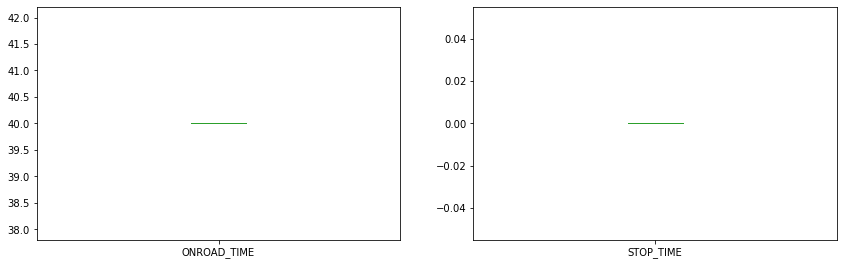

7160_7047


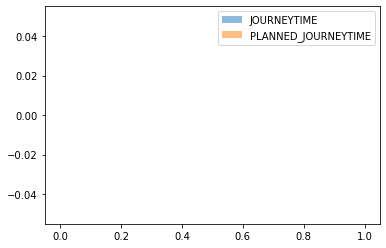

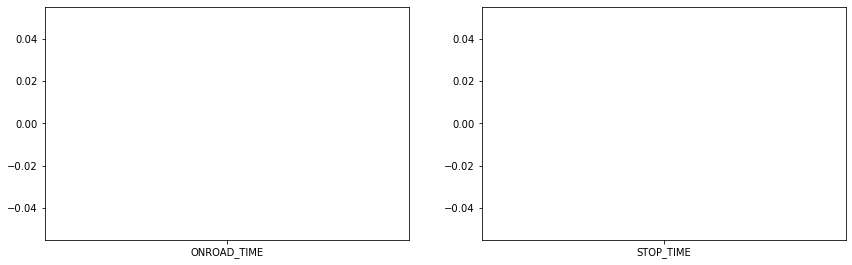

7020_7029


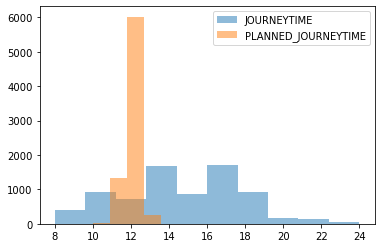

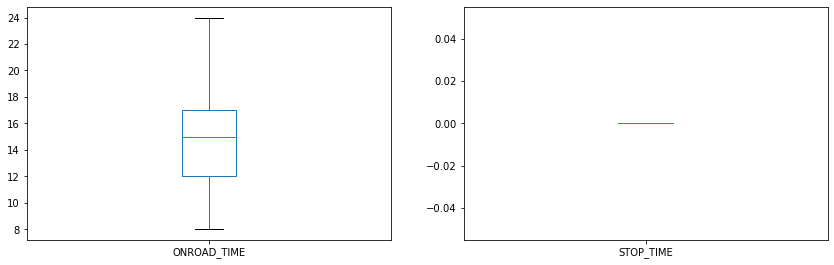

1869_1870


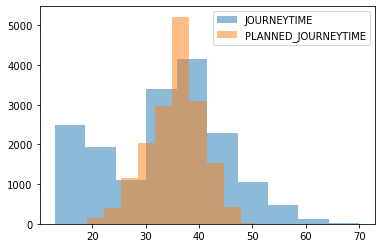

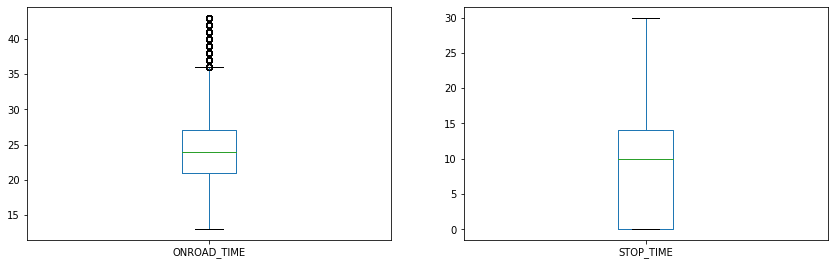

7047_7161


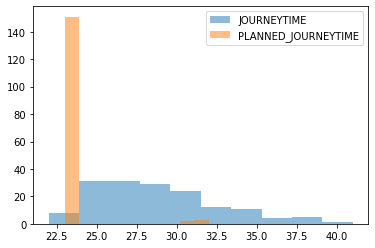

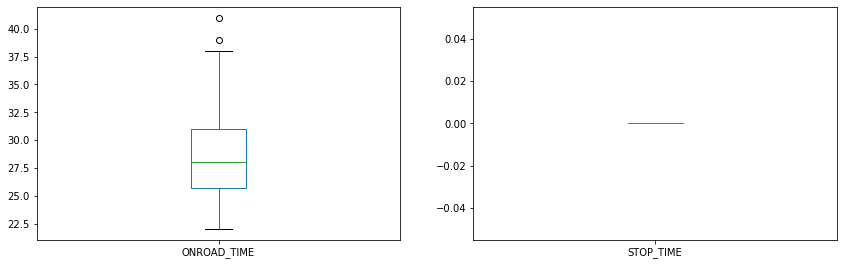

7038_7011


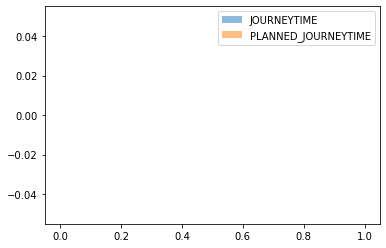

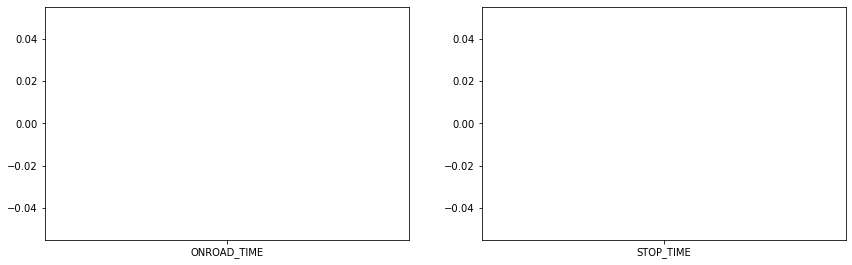

7586_7587


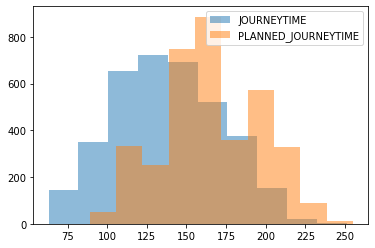

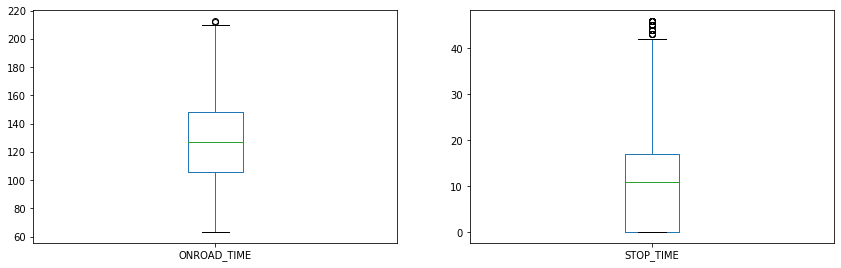

6110_7020


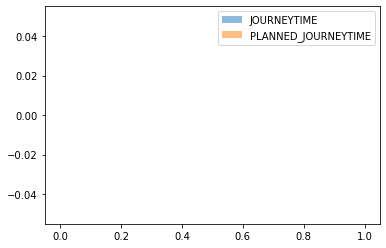

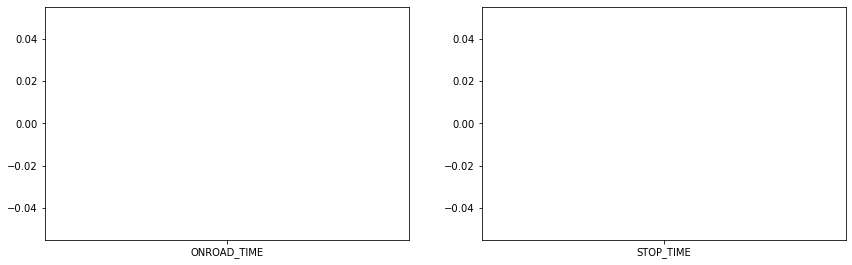

2171_7160


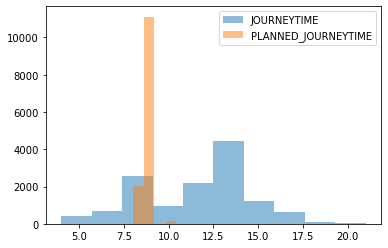

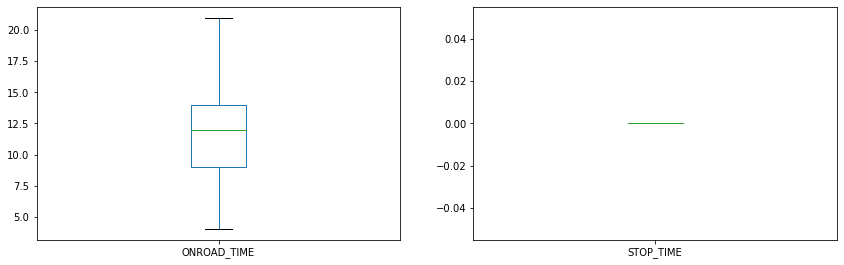

7011_2171


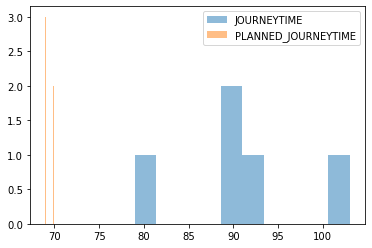

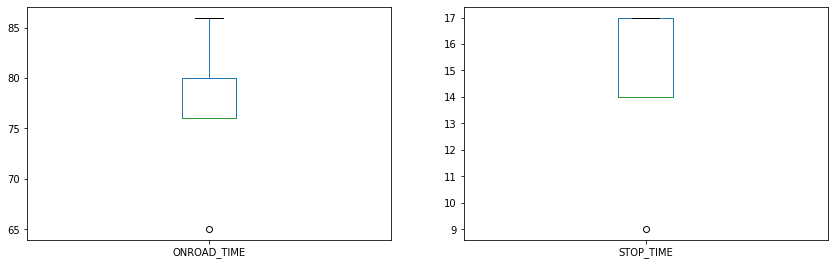

7389_7025


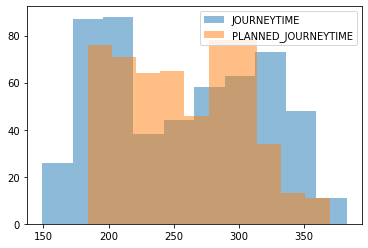

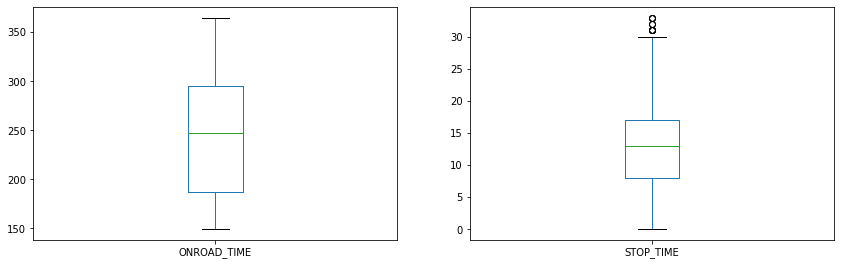

7588_328


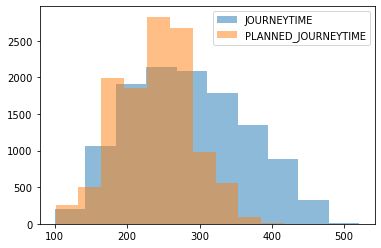

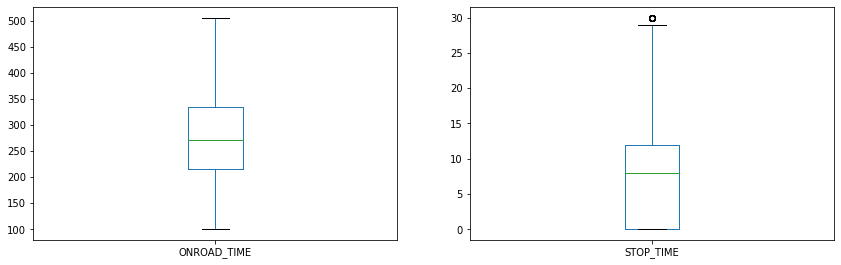

1666_1807


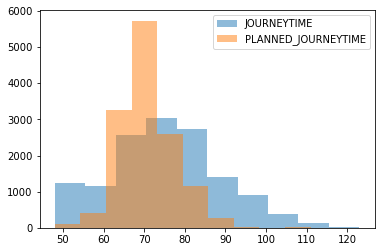

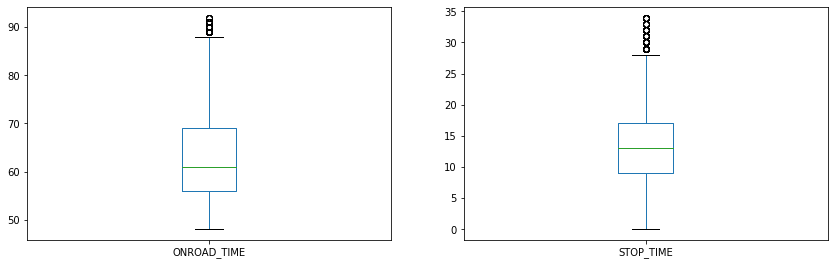

4464_1869


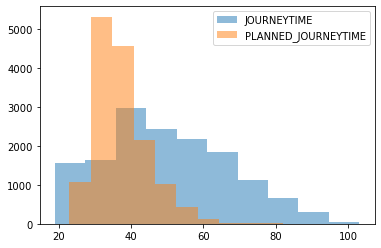

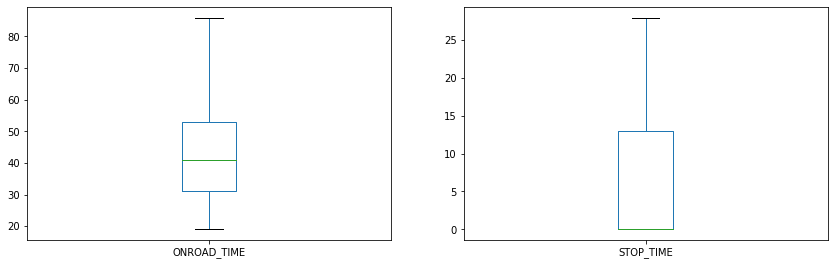

1808_7389


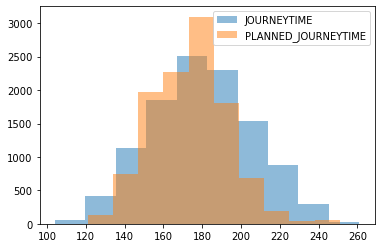

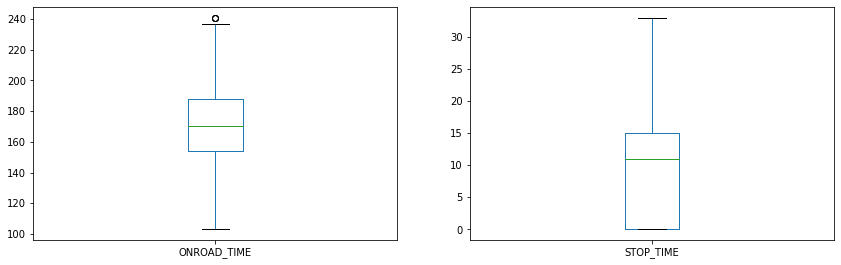

1807_7167


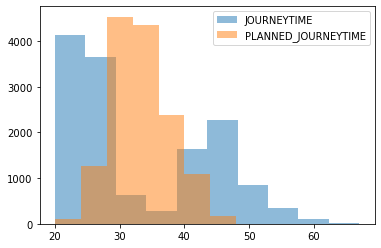

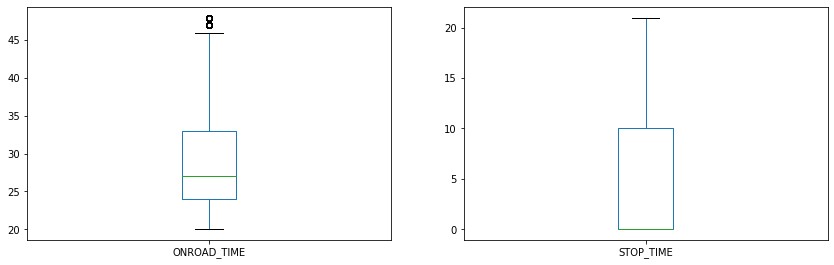

7167_1808


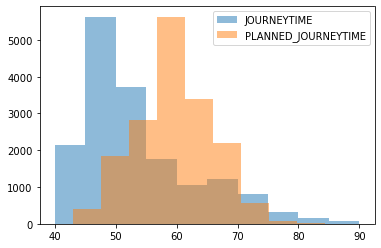

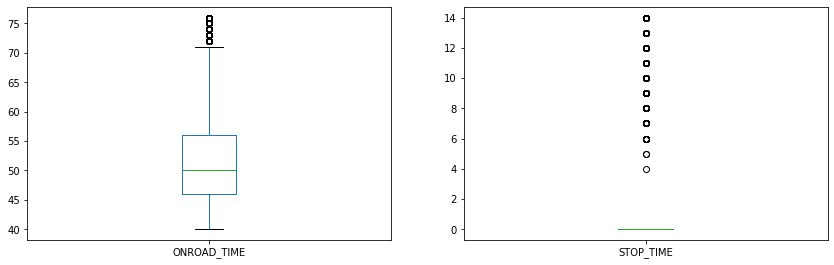

7025_4464


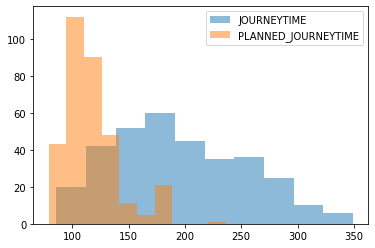

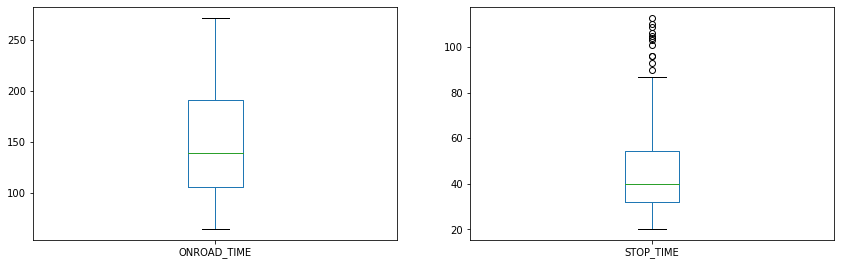

1665_1666


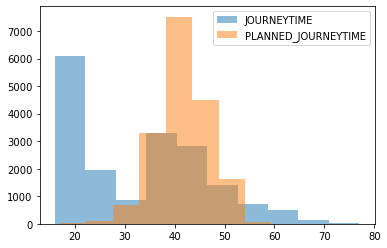

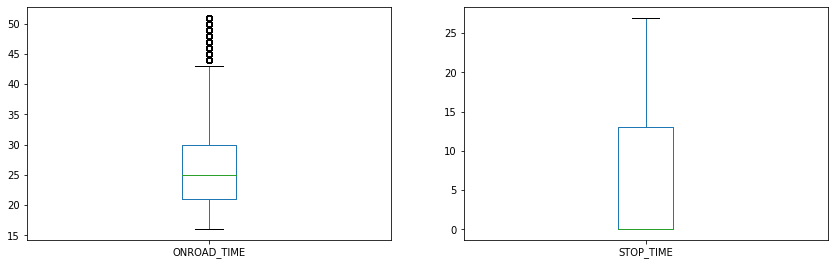

1664_1665


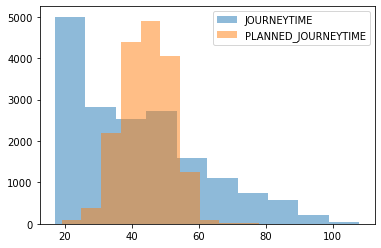

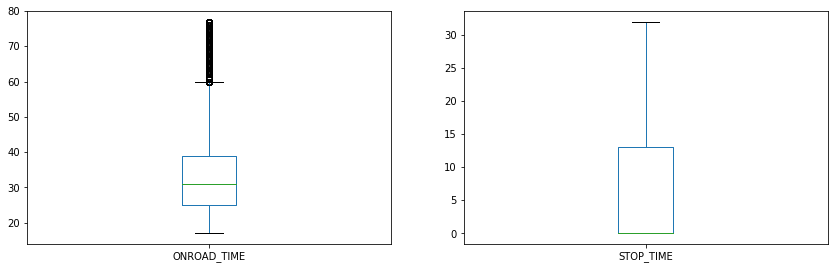

1662_1664


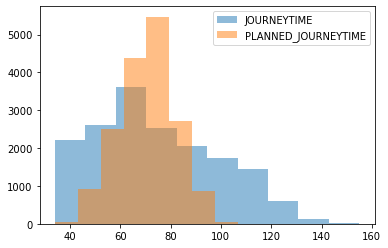

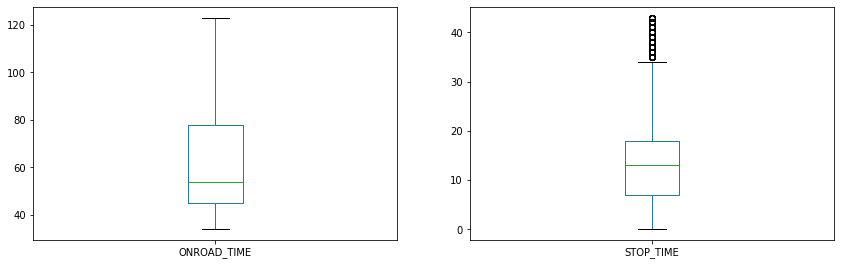

1661_1662


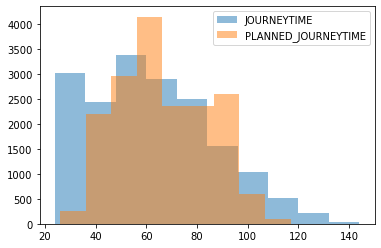

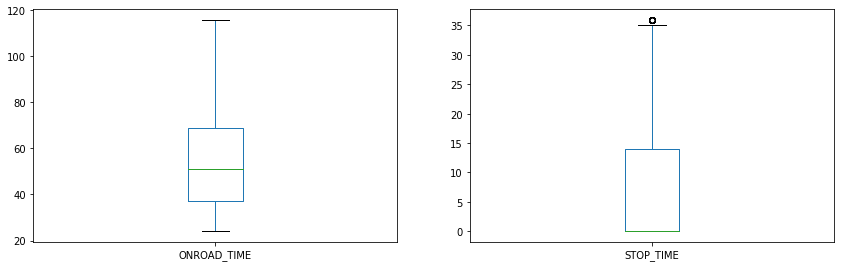

1660_1661


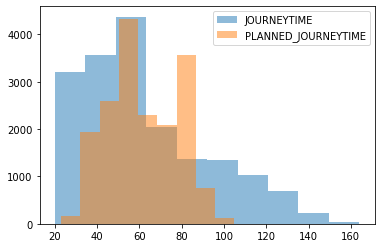

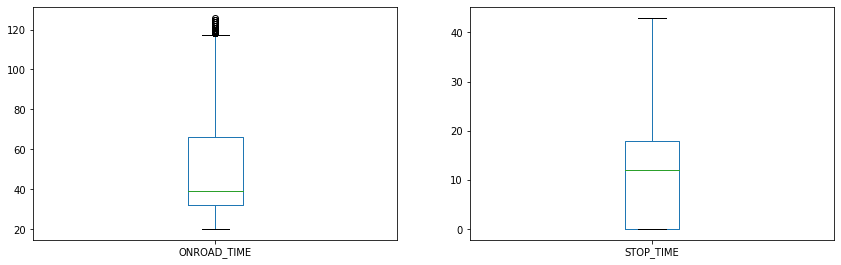

1806_1660


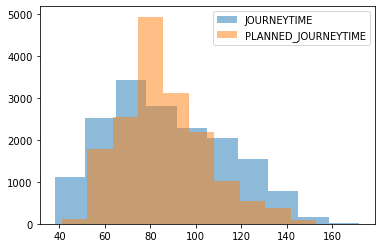

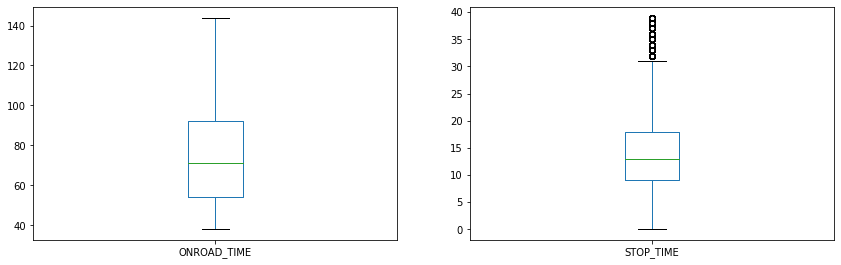

1805_1806


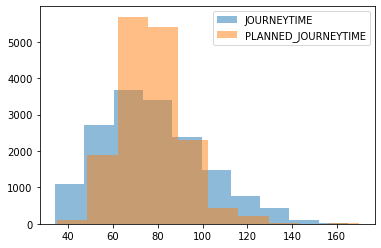

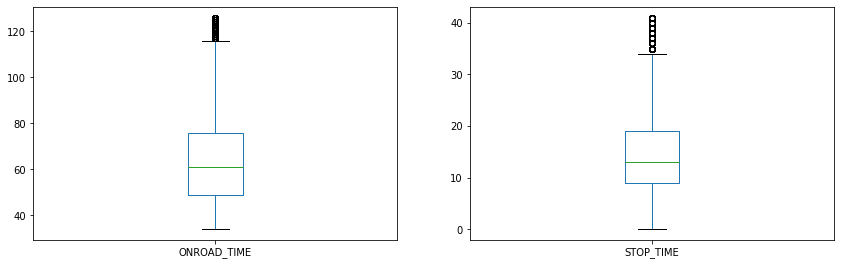

1914_1805


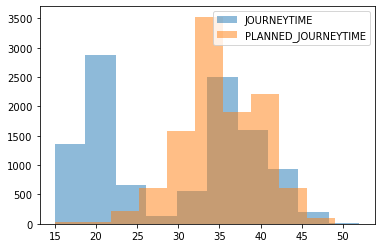

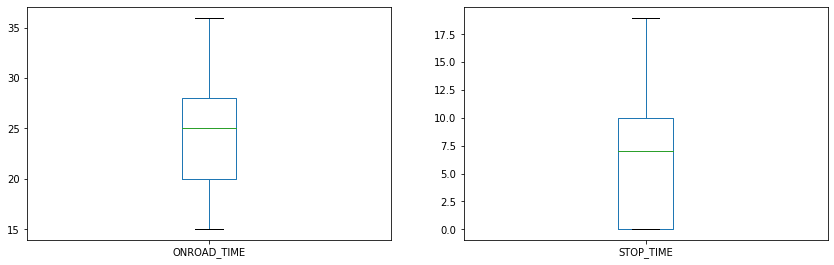

1648_1649


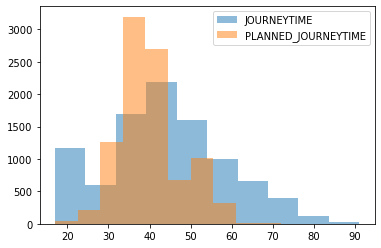

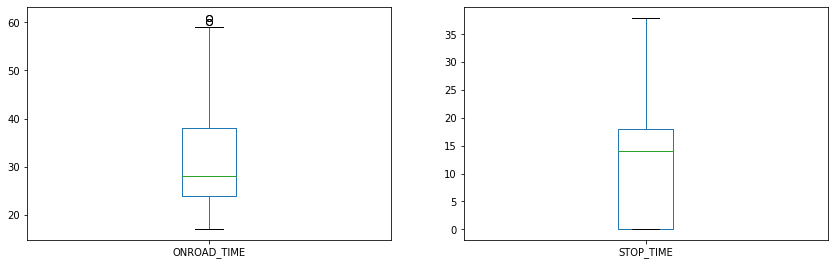

1649_1911


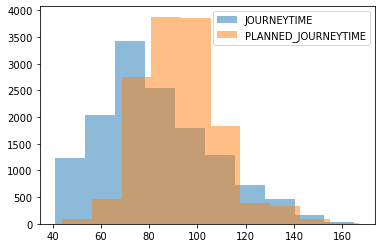

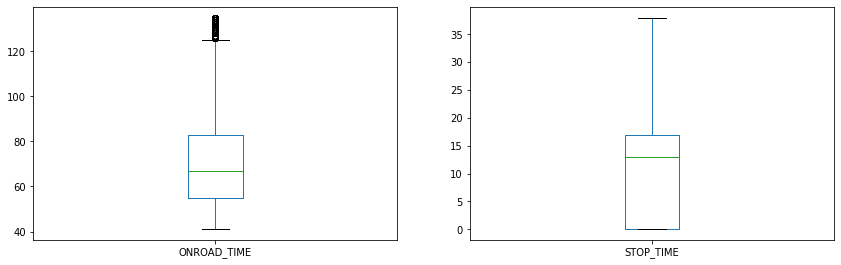

1913_1914


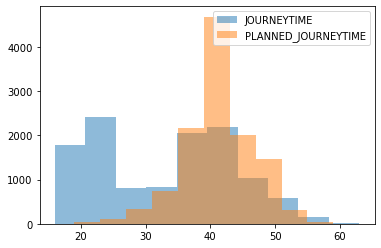

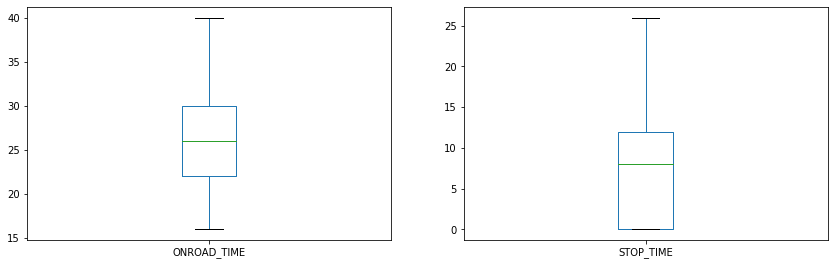

1647_1648


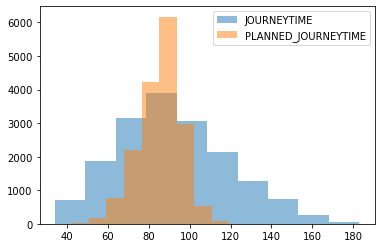

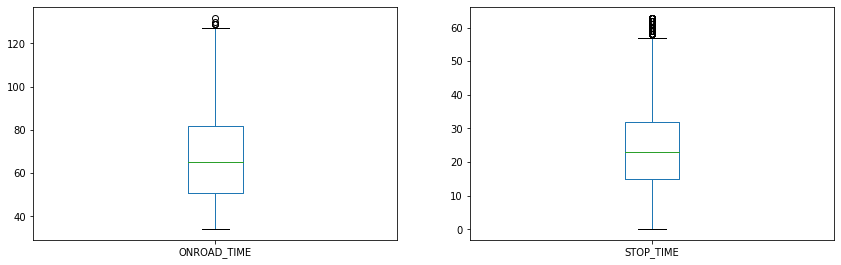

1911_1913


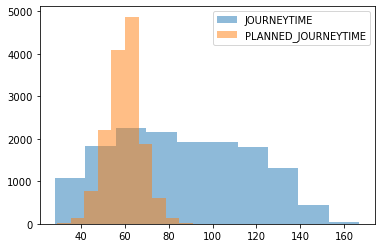

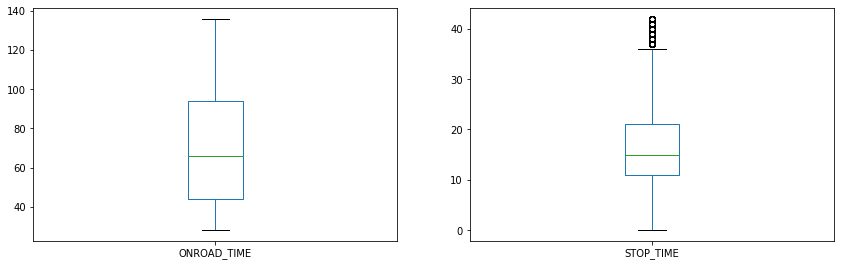

786_793


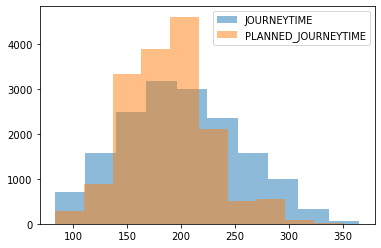

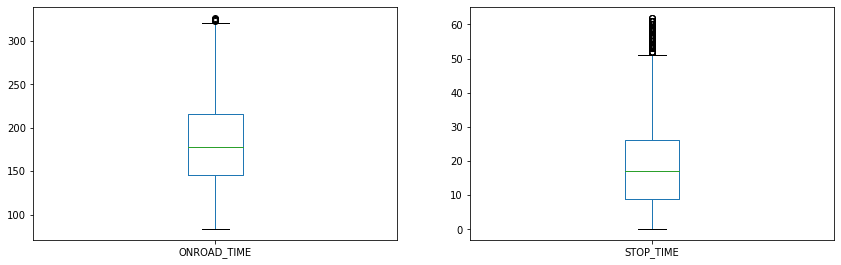

1445_1647


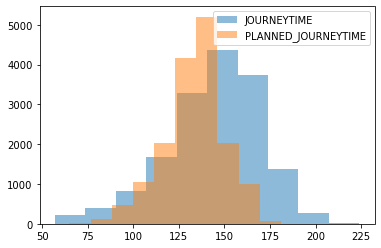

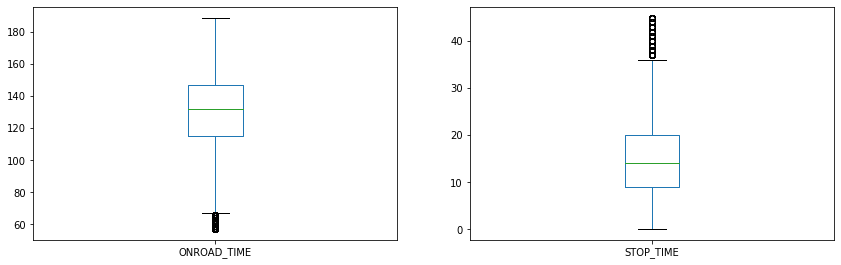

1444_1445


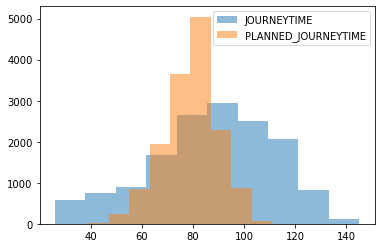

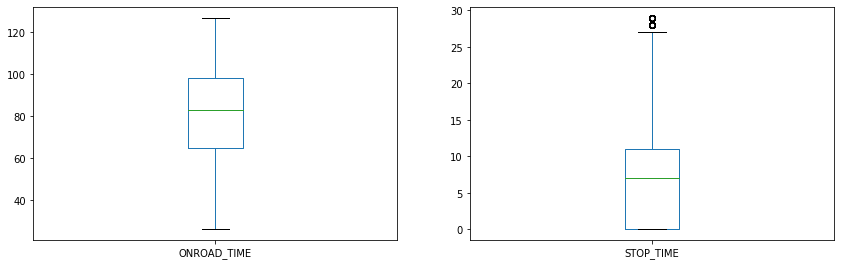

793_7576


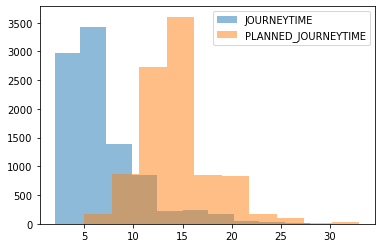

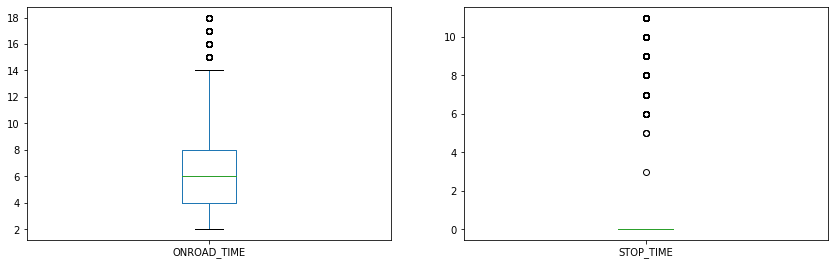

1443_1444


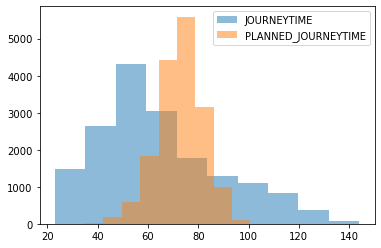

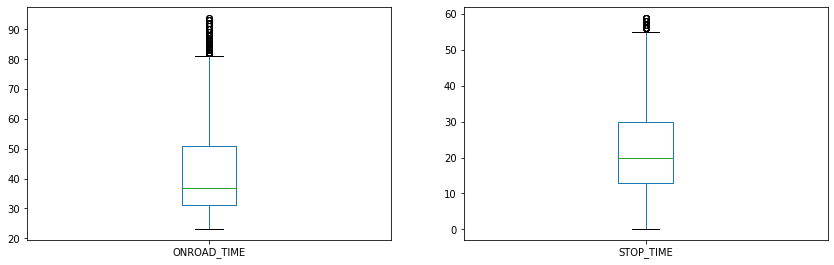

328_1443


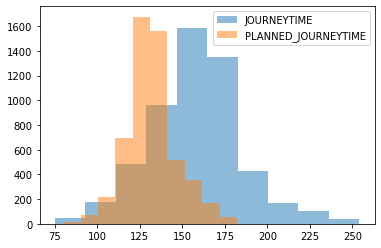

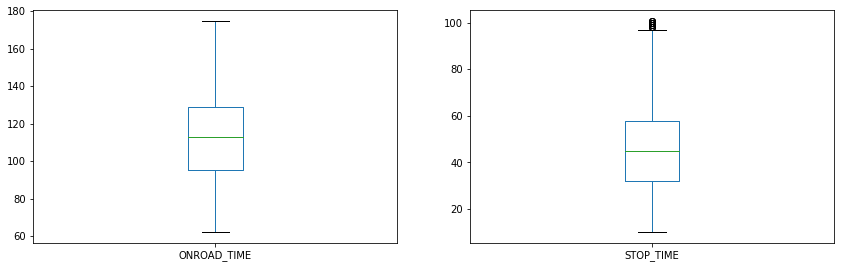

4529_7586


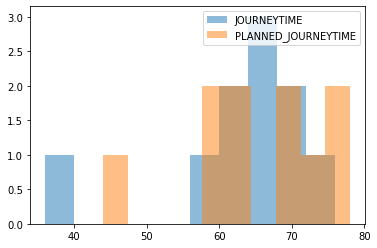

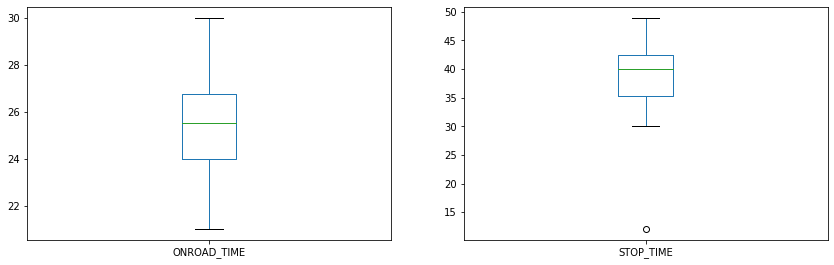

7576_4529


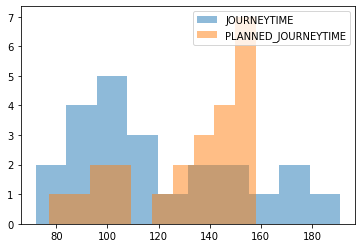

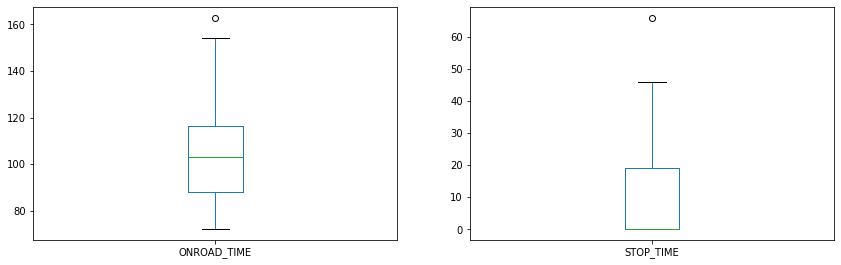

In [34]:
for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
    print(pair)
    
    data = df.loc[(df['STARTSTOP'] == start_end_pairs.loc[i, 'STARTSTOP']) & (df['ENDSTOP'] == start_end_pairs.loc[i, 'ENDSTOP'])]
    
    # remove outliers
    data = data[(np.abs(stats.zscore(data['ONROAD_TIME'])) > 3) | 
                (np.abs(stats.zscore(data['STOP_TIME'])) > 3)]
    
    df.drop(data.index, inplace = True)
    
    # show plot
    data = df.loc[(df['STARTSTOP'] == start_end_pairs.loc[i, 'STARTSTOP']) & (df['ENDSTOP'] == start_end_pairs.loc[i, 'ENDSTOP'])]

    plt.hist(data['JOURNEYTIME'], alpha=0.5, label='JOURNEYTIME')
    plt.hist(data['PLANNED_JOURNEYTIME'], alpha=0.5, label='PLANNED_JOURNEYTIME')
    plt.legend(loc='upper right')
    
    data[['ONROAD_TIME', 'STOP_TIME']].plot(kind='box', subplots=True, figsize=(30,30), layout=(6,4), sharex=False, sharey=False)

    plt.show()

In [35]:
df['JOURNEYTIME'] = df['STOP_TIME'] + df['ONROAD_TIME']
df[['JOURNEYTIME', 'PLANNED_JOURNEYTIME', 'STOP_TIME', 'ONROAD_TIME']].describe().T

,count,mean,std,min,25%,50%,75%,max
JOURNEYTIME,828243.0,62.232799,50.502342,2.0,32.0,48.0,75.0,521.0
PLANNED_JOURNEYTIME,828243.0,60.559772,42.238174,5.0,37.0,49.0,70.0,417.0
STOP_TIME,828243.0,8.989099,10.374727,0.0,0.0,9.0,15.0,113.0
ONROAD_TIME,828243.0,53.243700,47.200829,2.0,26.0,38.0,63.0,506.0


# Models

In [36]:
df_raw = df.copy()
start_end_pairs_raw = start_end_pairs.copy()

In [37]:
df = df_raw
start_end_pairs = start_end_pairs_raw

In [38]:
df.head()

,STARTSTOP,LINEID,HOUR,ENDSTOP,JOURNEYTIME,PLANNED_JOURNEYTIME,STOP_TIME,MONTH,DAY,ONROAD_TIME,RUSH_HOUR,WEEKDAY
0,767,39A_1,9,768,138.0,103.0,0.0,January,Monday,138.0,1,0
1,768,39A_1,9,769,20.0,24.0,0.0,January,Monday,20.0,1,0
2,769,39A_1,9,770,29.0,38.0,0.0,January,Monday,29.0,1,0
3,770,39A_1,9,771,10.0,16.0,0.0,January,Monday,10.0,1,0
4,771,39A_1,9,772,28.0,32.0,0.0,January,Monday,28.0,1,0


In [39]:
df = df.drop(['LINEID', 'PLANNED_JOURNEYTIME', 'RUSH_HOUR', 'WEEKDAY'], axis = 1)

In [40]:
df = pd.get_dummies(df, columns = ['MONTH', 'DAY', 'HOUR'], drop_first = True)
df.head()

,STARTSTOP,ENDSTOP,JOURNEYTIME,STOP_TIME,ONROAD_TIME,MONTH_August,MONTH_December,MONTH_February,MONTH_January,MONTH_July,...,HOUR_14,HOUR_15,HOUR_16,HOUR_17,HOUR_18,HOUR_19,HOUR_20,HOUR_21,HOUR_22,HOUR_23
0,767,768,138.0,0.0,138.0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,768,769,20.0,0.0,20.0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2,769,770,29.0,0.0,29.0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,770,771,10.0,0.0,10.0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,771,772,28.0,0.0,28.0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


### stop_time and on_road separately

In [41]:
# separate data for each start stop
X_trainDict = {}
y_trainDict = {}
X_testDict ={}
y_testDict = {}

# store data for start stops which have few data to train a model
remove = {}

for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
    print(i, pair)
    
    data = df.loc[(df['STARTSTOP'] == start_end_pairs.loc[i, 'STARTSTOP']) & (df['ENDSTOP'] == start_end_pairs.loc[i, 'ENDSTOP'])]
    
    # check start stops which have few data to train a model
    if data.shape[0] < 100:
        print('----------------------------')
        print(f'the data of {pair} too small')
        print('----------------------------')
        remove[pair] = i
        continue
    
    # drop unnecessary columns
    data.drop(columns=['STARTSTOP', 'ENDSTOP'], inplace=True)    
    
    # target feature is 'JOURNEYTIME'
    y = data[['JOURNEYTIME', 'ONROAD_TIME', 'STOP_TIME']]
    X = data.drop(['JOURNEYTIME', 'ONROAD_TIME', 'STOP_TIME'], axis = 1)
    
    # Split the dataset into two datasets: 70% training and 30% test
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0,  test_size=0.3)
    
    X_trainDict[pair] = X_train
    X_testDict[pair] = X_test
    y_trainDict[pair] = y_train
    y_testDict[pair] = y_test
    
    X_train.reset_index(drop=True, inplace=True)
    y_train.reset_index(drop=True, inplace=True)
    X_test.reset_index(drop=True, inplace=True)
    y_test.reset_index(drop=True, inplace=True)

for i in remove.values():
    start_end_pairs = start_end_pairs.drop(i)

0 777_779
1 773_774
2 776_777
3 774_775
4 772_773
5 775_776
6 782_783
7 781_782
8 779_780
9 780_781
10 771_772
11 783_784
12 784_785
13 770_771
14 785_786
15 769_770
16 767_768
17 768_769
18 7587_7588
19 1877_1878
----------------------------
the data of 1877_1878 too small
----------------------------
20 6109_6110
21 7161_7162
22 1876_1877
23 1875_1876
24 1872_1873
25 1873_1874
26 1874_1875
27 1871_1872
28 1899_6107
----------------------------
the data of 1899_6107 too small
----------------------------
29 6108_6109
30 1879_1899
----------------------------
the data of 1879_1899 too small
----------------------------
31 1878_1879
----------------------------
the data of 1878_1879 too small
----------------------------
32 6107_6108
33 1870_1871
34 7029_7038
----------------------------
the data of 7029_7038 too small
----------------------------
35 7160_7047
----------------------------
the data of 7160_7047 too small
----------------------------
36 7020_7029
37 1869_1870
38 7047_7161

In [42]:
if len(remove) > 0:
    start_end_pairs = start_end_pairs.reset_index()

### linear regression

In [43]:
# store models for each start stop
models_LR_1 = {}
models_LR_2 = {}

# train model for each start stop
for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
    print(i, pair)
    
    # got data for a certain start stop
    X_train = X_trainDict[pair]
    X_test = X_testDict[pair]
    y1_train = y_trainDict[pair]['ONROAD_TIME']
    y1_test = y_testDict[pair]['ONROAD_TIME']
    y2_train = y_trainDict[pair]['STOP_TIME']
    y2_test = y_testDict[pair]['STOP_TIME']
    
    # train models
    linreg1 = LinearRegression().fit(X_train, y1_train)
    linreg1.fit(X_train, y1_train)
    models_LR_1[pair] = linreg1
    
    # pickle files
    filename1 = f'0TEST/{pair}_LR_1.sav'
    pickle.dump(linreg1, open(filename1, 'wb'))
    
    # train models
    linreg2 = LinearRegression().fit(X_train, y2_train)
    linreg2.fit(X_train, y2_train)
    models_LR_2[pair] = linreg2
    
    # pickle files
    filename2 = f'0TEST/{pair}_LR_2.sav'
    pickle.dump(linreg2, open(filename2, 'wb'))

0 777_779
1 773_774
2 776_777
3 774_775
4 772_773
5 775_776
6 782_783
7 781_782
8 779_780
9 780_781
10 771_772
11 783_784
12 784_785
13 770_771
14 785_786
15 769_770
16 767_768
17 768_769
18 7587_7588
19 6109_6110
20 7161_7162
21 1876_1877
22 1875_1876
23 1872_1873
24 1873_1874
25 1874_1875
26 1871_1872
27 6108_6109
28 6107_6108
29 1870_1871
30 7020_7029
31 1869_1870
32 7047_7161
33 7586_7587
34 2171_7160
35 7389_7025
36 7588_328
37 1666_1807
38 4464_1869
39 1808_7389
40 1807_7167
41 7167_1808
42 7025_4464
43 1665_1666
44 1664_1665
45 1662_1664
46 1661_1662
47 1660_1661
48 1806_1660
49 1805_1806
50 1914_1805
51 1648_1649
52 1649_1911
53 1913_1914
54 1647_1648
55 1911_1913
56 786_793
57 1445_1647
58 1444_1445
59 793_7576
60 1443_1444
61 328_1443


In [44]:
mae = {}
mape = {}
mse = {}
rmse = {}
r2 = {}

for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
    
    X_train = X_trainDict[pair]
    y1_train = y_trainDict[pair]['ONROAD_TIME']
    y2_train = y_trainDict[pair]['STOP_TIME']
     
    linreg1 = models_LR_1[pair]
    linreg2 = models_LR_2[pair]   
        
    linreg1_predictions = linreg1.predict(X_train)
    linreg2_predictions = linreg2.predict(X_train)
    
    y_train = y_trainDict[pair]['JOURNEYTIME']
    linreg_predictions = linreg1_predictions + linreg1_predictions
    linreg_predictions = linreg_predictions.round()
        
    mae[pair] = metrics.mean_absolute_error(y_train, linreg_predictions)
    mape[pair] = metrics.mean_absolute_percentage_error(y_train, linreg_predictions)
    mse[pair] = metrics.mean_squared_error(y_train, linreg_predictions)
    rmse[pair] = metrics.mean_squared_error(y_train, linreg_predictions)**(0.5)
    r2[pair] = metrics.r2_score(y_train, linreg_predictions)

data = {'stop':list(mae.keys()), 'mae':list(mae.values()), 'mape':list(mape.values()), 
        'mse':list(mse.values()), 'rmse':list(rmse.values()), 'r2':list(r2.values())}

models_train_LR = pd.DataFrame.from_dict(data)
models_train_LR

,stop,mae,mape,mse,rmse,r2
0,777_779,55.524724,1.205094,3781.527251,61.494124,-3.759620
1,773_774,20.477554,0.712653,573.842524,23.955010,-1.157233
2,776_777,19.456431,0.877865,512.639585,22.641546,-0.973034
3,774_775,43.383971,0.965917,2142.427317,46.286362,-6.230994
4,772_773,31.520304,1.217300,1260.991607,35.510444,-1.983283
...,...,...,...,...,...,...
57,1445_1647,115.540505,0.864213,13996.454183,118.306611,-20.007720
58,1444_1445,73.662414,0.999934,5974.536558,77.295126,-9.250346
59,793_7576,6.512355,1.499044,49.867450,7.061689,-2.284989
60,1443_1444,27.532082,0.575031,1022.927635,31.983240,-0.727474


In [45]:
mae = {}
mape = {}
mse = {}
rmse = {}
r2 = {}

for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
    
    X_test = X_testDict[pair]
    y1_test = y_testDict[pair]['ONROAD_TIME']
    y2_test = y_testDict[pair]['STOP_TIME']
     
    linreg1 = models_LR_1[pair]
    linreg2 = models_LR_2[pair]   
        
    linreg1_predictions = linreg1.predict(X_test)
    linreg2_predictions = linreg2.predict(X_test)
    
    y_test = y_testDict[pair]['JOURNEYTIME']
    linreg_predictions = linreg1_predictions + linreg1_predictions
    linreg_predictions = linreg_predictions.round()
            
    mae[pair] = metrics.mean_absolute_error(y_test, linreg_predictions)
    mape[pair] = metrics.mean_absolute_percentage_error(y_test, linreg_predictions)
    mse[pair] = metrics.mean_squared_error(y_test, linreg_predictions)
    rmse[pair] = metrics.mean_squared_error(y_test, linreg_predictions)**(0.5)
    r2[pair] = metrics.r2_score(y_test, linreg_predictions)

data = {'stop':list(mae.keys()), 'mae':list(mae.values()), 'mape':list(mape.values()), 
        'mse':list(mse.values()), 'rmse':list(rmse.values()), 'r2':list(r2.values())}

models_test_LR = pd.DataFrame.from_dict(data)
models_test_LR

,stop,mae,mape,mse,rmse,r2
0,777_779,55.749539,1.215523,3790.250461,61.565010,-3.769442
1,773_774,20.349278,0.703027,566.183918,23.794620,-1.202872
2,776_777,19.407149,0.877795,508.470394,22.549288,-0.947100
3,774_775,43.211918,0.958995,2134.934078,46.205347,-6.125178
4,772_773,31.808840,1.230173,1275.729765,35.717359,-2.032797
...,...,...,...,...,...,...
57,1445_1647,114.773187,0.856055,13814.185705,117.533764,-19.926717
58,1444_1445,73.024206,0.982390,5885.284477,76.715608,-8.852030
59,793_7576,6.583778,1.521999,50.705443,7.120775,-2.414788
60,1443_1444,27.998422,0.589595,1050.345957,32.409041,-0.749378


In [46]:
models_train_LR[['mape', 'r2']].describe().T

,count,mean,std,min,25%,50%,75%,max
mape,62.0,0.879067,0.216683,0.407990,0.733604,0.911776,1.011805,1.499044
r2,62.0,-11.064176,24.294739,-181.389725,-10.601194,-4.044704,-2.593982,-0.019298


In [47]:
models_test_LR[['mape', 'r2']].describe().T

,count,mean,std,min,25%,50%,75%,max
mape,62.0,0.878954,0.218322,0.395903,0.733061,0.907734,1.021236,1.521999
r2,62.0,-11.623339,25.229473,-183.768075,-10.831436,-3.971533,-2.593923,-0.014320


### random forest

In [48]:
# store models for each start stop
models_RF_1 = {}
models_RF_2 = {}

# train model for each start stop
for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
    print(i, pair)
    
    # got data for a certain start stop
    X_train = X_trainDict[pair]
    X_test = X_testDict[pair]
    y1_train = y_trainDict[pair]['ONROAD_TIME']
    y1_test = y_testDict[pair]['ONROAD_TIME']
    y2_train = y_trainDict[pair]['STOP_TIME']
    y2_test = y_testDict[pair]['STOP_TIME']
    
    # train models
    rfc1 = RandomForestRegressor(n_estimators=64, max_features='auto', oob_score=True, random_state=1)
    rfc1.fit(X_train, y1_train)
    models_RF_1[pair] = rfc1
    
    # pickle files
    filename1 = f'0TEST/{pair}_RF_1.sav'
    pickle.dump(rfc1, open(filename1, 'wb'))
    
    # train models
    rfc2 = RandomForestRegressor(n_estimators=64, max_features='auto', oob_score=True, random_state=1)
    rfc2.fit(X_train, y2_train)
    models_RF_2[pair] = rfc2
    
    # pickle files
    filename2 = f'0TEST/{pair}_RF_2.sav'
    pickle.dump(rfc2, open(filename2, 'wb'))

0 777_779
1 773_774
2 776_777
3 774_775
4 772_773
5 775_776
6 782_783
7 781_782
8 779_780
9 780_781
10 771_772
11 783_784
12 784_785
13 770_771
14 785_786
15 769_770
16 767_768
17 768_769
18 7587_7588
19 6109_6110
20 7161_7162
21 1876_1877
22 1875_1876
23 1872_1873
24 1873_1874
25 1874_1875
26 1871_1872
27 6108_6109
28 6107_6108
29 1870_1871
30 7020_7029
31 1869_1870
32 7047_7161
33 7586_7587
34 2171_7160
35 7389_7025
36 7588_328
37 1666_1807
38 4464_1869
39 1808_7389
40 1807_7167
41 7167_1808
42 7025_4464
43 1665_1666
44 1664_1665
45 1662_1664
46 1661_1662
47 1660_1661
48 1806_1660
49 1805_1806
50 1914_1805
51 1648_1649
52 1649_1911
53 1913_1914
54 1647_1648
55 1911_1913
56 786_793
57 1445_1647
58 1444_1445
59 793_7576
60 1443_1444
61 328_1443


In [49]:
mae = {}
mape = {}
mse = {}
rmse = {}
r2 = {}

for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
   
    X_train = X_trainDict[pair]
    y1_train = y_trainDict[pair]['ONROAD_TIME']
    y2_train = y_trainDict[pair]['STOP_TIME']
     
    rfc1 = models_RF_1[pair]
    rfc2 = models_RF_2[pair]   
        
    rfc1_predictions = rfc1.predict(X_train)
    rfc2_predictions = rfc2.predict(X_train)
    
    y_train = y_trainDict[pair]['JOURNEYTIME']
    rfc_predictions = rfc1_predictions + rfc2_predictions
    rfc_predictions = rfc_predictions.round()

    mae[pair] = metrics.mean_absolute_error(y_train, rfc_predictions)
    mape[pair] = metrics.mean_absolute_percentage_error(y_train, rfc_predictions)
    mse[pair] = metrics.mean_squared_error(y_train, rfc_predictions)
    rmse[pair] = metrics.mean_squared_error(y_train, rfc_predictions)**(0.5)
    r2[pair] = metrics.r2_score(y_train, rfc_predictions)

data = {'stop':list(mae.keys()), 'mae':list(mae.values()), 'mape':list(mape.values()), 
        'mse':list(mse.values()), 'rmse':list(rmse.values()), 'r2':list(r2.values())}

models_train_RF = pd.DataFrame.from_dict(data)
models_train_RF

,stop,mae,mape,mse,rmse,r2
0,777_779,20.239968,0.375075,610.673776,24.711814,0.231375
1,773_774,10.710852,0.308773,177.563450,13.325294,0.332490
2,776_777,11.353893,0.408819,195.726173,13.990217,0.246694
3,774_775,11.382853,0.227162,200.373992,14.155352,0.323710
4,772_773,14.716787,0.441451,333.841966,18.271343,0.210189
...,...,...,...,...,...,...
57,1445_1647,16.245153,0.125772,449.146968,21.193088,0.325861
58,1444_1445,15.279608,0.210476,359.492289,18.960282,0.383229
59,793_7576,2.469646,0.459179,11.513575,3.393166,0.241550
60,1443_1444,16.563446,0.295810,456.714431,21.370878,0.228721


In [50]:
mae = {}
mape = {}
mse = {}
rmse = {}
r2 = {}

for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
   
    X_test = X_testDict[pair]
    y1_test = y_testDict[pair]['ONROAD_TIME'] 
    y2_test = y_testDict[pair]['STOP_TIME']
    
    rfc1 = models_RF_1[pair]
    rfc2 = models_RF_2[pair]
   
    rfc1_predictions = rfc1.predict(X_test)
    rfc2_predictions = rfc2.predict(X_test)

    y_test = y_testDict[pair]['JOURNEYTIME']
    rfc_predictions = rfc1_predictions + rfc2_predictions
    rfc_predictions = rfc_predictions.round()
    
    mae[pair] = metrics.mean_absolute_error(y_test, rfc_predictions)
    mape[pair] = metrics.mean_absolute_percentage_error(y_test, rfc_predictions)
    mse[pair] = metrics.mean_squared_error(y_test, rfc_predictions)
    rmse[pair] = metrics.mean_squared_error(y_test, rfc_predictions)**(0.5)
    r2[pair] = metrics.r2_score(y_test, rfc_predictions)

data = {'stop':list(mae.keys()), 'mae':list(mae.values()), 'mape':list(mape.values()), 
        'mse':list(mse.values()), 'rmse':list(rmse.values()), 'r2':list(r2.values())}

models_test_RF = pd.DataFrame.from_dict(data)
models_test_RF

,stop,mae,mape,mse,rmse,r2
0,777_779,22.528750,0.425636,751.113343,27.406447,0.054840
1,773_774,11.961649,0.346390,219.713402,14.822733,0.145153
2,776_777,12.685793,0.460194,242.906874,15.585470,0.069830
3,774_775,12.960894,0.259414,254.729609,15.960251,0.149860
4,772_773,16.470720,0.501785,415.286460,20.378578,0.012738
...,...,...,...,...,...,...
57,1445_1647,18.487296,0.143486,577.743235,24.036290,0.124793
58,1444_1445,18.058183,0.246920,501.154342,22.386477,0.161062
59,793_7576,3.093561,0.587814,17.550338,4.189312,-0.181938
60,1443_1444,18.664300,0.336849,576.809862,24.016866,0.039308


In [51]:
models_train_RF[['mape', 'r2']].describe().T

,count,mean,std,min,25%,50%,75%,max
mape,62.0,0.220411,0.098930,0.043935,0.144268,0.211557,0.292065,0.459179
r2,62.0,0.367305,0.161867,0.134778,0.240701,0.324400,0.459033,0.927858


In [52]:
models_test_RF[['mape', 'r2']].describe().T

,count,mean,std,min,25%,50%,75%,max
mape,62.0,0.258107,0.109614,0.059155,0.178301,0.246956,0.333131,0.587814
r2,62.0,0.121759,0.186667,-0.356187,0.006621,0.114116,0.254135,0.698794


### journey time

In [53]:
start_end_pairs = start_end_pairs_raw

In [54]:
# separate data for each start stop
X_trainDict = {}
y_trainDict = {}
X_testDict ={}
y_testDict = {}

# store data for start stops which have few data to train a model
remove = {}

for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
    print(i, pair)
    
    data = df.loc[(df['STARTSTOP'] == start_end_pairs.loc[i, 'STARTSTOP']) & (df['ENDSTOP'] == start_end_pairs.loc[i, 'ENDSTOP'])]
    
    # check start stops which have few data to train a model
    if data.shape[0] < 100:
        print('----------------------------')
        print(f'the data of {pair} too small')
        print('----------------------------')
        remove[pair] = i
        continue
    
    # drop unnecessary columns
    data.drop(columns=['STARTSTOP', 'ENDSTOP'], inplace=True)    
    
    # target feature is 'JOURNEYTIME'
    y = data['JOURNEYTIME']
    X = data.drop(['JOURNEYTIME', 'ONROAD_TIME', 'STOP_TIME'], axis = 1)
    
    # Split the dataset into two datasets: 70% training and 30% test
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0,  test_size=0.3)
    
    X_trainDict[pair] = X_train
    X_testDict[pair] = X_test
    y_trainDict[pair] = y_train
    y_testDict[pair] = y_test
    
    X_train.reset_index(drop=True, inplace=True)
    y_train.reset_index(drop=True, inplace=True)
    X_test.reset_index(drop=True, inplace=True)
    y_test.reset_index(drop=True, inplace=True)

for i in remove.values():
    start_end_pairs = start_end_pairs.drop(i)

0 777_779
1 773_774
2 776_777
3 774_775
4 772_773
5 775_776
6 782_783
7 781_782
8 779_780
9 780_781
10 771_772
11 783_784
12 784_785
13 770_771
14 785_786
15 769_770
16 767_768
17 768_769
18 7587_7588
19 1877_1878
----------------------------
the data of 1877_1878 too small
----------------------------
20 6109_6110
21 7161_7162
22 1876_1877
23 1875_1876
24 1872_1873
25 1873_1874
26 1874_1875
27 1871_1872
28 1899_6107
----------------------------
the data of 1899_6107 too small
----------------------------
29 6108_6109
30 1879_1899
----------------------------
the data of 1879_1899 too small
----------------------------
31 1878_1879
----------------------------
the data of 1878_1879 too small
----------------------------
32 6107_6108
33 1870_1871
34 7029_7038
----------------------------
the data of 7029_7038 too small
----------------------------
35 7160_7047
----------------------------
the data of 7160_7047 too small
----------------------------
36 7020_7029
37 1869_1870
38 7047_7161

In [55]:
if len(remove) > 0:
    start_end_pairs = start_end_pairs.reset_index()

### linear regression

In [56]:
# store models for each start stop
models_LR = {}

# train model for each start stop
for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
    print(i, pair)
    
    X_train = X_trainDict[pair]
    X_test = X_testDict[pair]
    y_train = y_trainDict[pair]
    y_test = y_testDict[pair]
    
    # train models
    linreg = LinearRegression().fit(X_train, y_train)
    models_LR[pair] = linreg
    
    # pickle files
    filename = f'0TEST/{pair}.sav'
    
    pickle.dump(linreg, open(filename, 'wb'))

0 777_779
1 773_774
2 776_777
3 774_775
4 772_773
5 775_776
6 782_783
7 781_782
8 779_780
9 780_781
10 771_772
11 783_784
12 784_785
13 770_771
14 785_786
15 769_770
16 767_768
17 768_769
18 7587_7588
19 6109_6110
20 7161_7162
21 1876_1877
22 1875_1876
23 1872_1873
24 1873_1874
25 1874_1875
26 1871_1872
27 6108_6109
28 6107_6108
29 1870_1871
30 7020_7029
31 1869_1870
32 7047_7161
33 7586_7587
34 2171_7160
35 7389_7025
36 7588_328
37 1666_1807
38 4464_1869
39 1808_7389
40 1807_7167
41 7167_1808
42 7025_4464
43 1665_1666
44 1664_1665
45 1662_1664
46 1661_1662
47 1660_1661
48 1806_1660
49 1805_1806
50 1914_1805
51 1648_1649
52 1649_1911
53 1913_1914
54 1647_1648
55 1911_1913
56 786_793
57 1445_1647
58 1444_1445
59 793_7576
60 1443_1444
61 328_1443


In [57]:
mae = {}
mape = {}
mse = {}
rmse = {}
r2 = {}

for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
     
    X_train = X_trainDict[pair]
    y_train = y_trainDict[pair]
    linreg = models_LR[pair]
        
    linreg_predictions = linreg.predict(X_train)
    
    mae[pair] = metrics.mean_absolute_error(y_train, linreg_predictions)
    mape[pair] = metrics.mean_absolute_percentage_error(y_train, linreg_predictions)
    mse[pair] = metrics.mean_squared_error(y_train, linreg_predictions)
    rmse[pair] = metrics.mean_squared_error(y_train, linreg_predictions)**(0.5)
    r2[pair] = metrics.r2_score(y_train, linreg_predictions)

data = {'stop':list(mae.keys()), 'mae':list(mae.values()), 'mape':list(mape.values()), 
        'mse':list(mse.values()), 'rmse':list(rmse.values()), 'r2':list(r2.values())}

models_train_LR = pd.DataFrame.from_dict(data)
models_train_LR

,stop,mae,mape,mse,rmse,r2
0,777_779,22.001151,0.412723,698.328941,26.425914,0.121048
1,773_774,11.870859,0.350473,212.823563,14.588474,0.199937
2,776_777,12.422276,0.454468,224.477287,14.982566,0.136037
3,774_775,12.714354,0.258054,241.824548,15.550709,0.183808
4,772_773,16.254061,0.495861,389.372795,19.732531,0.078813
...,...,...,...,...,...,...
57,1445_1647,18.294536,0.143273,565.276694,23.775548,0.151558
58,1444_1445,17.250976,0.242481,446.256863,21.124793,0.234370
59,793_7576,2.816024,0.540172,14.629991,3.824917,0.036258
60,1443_1444,17.743508,0.320082,518.838975,22.778037,0.123808


In [58]:
mae = {}
mape = {}
mse = {}
rmse = {}
r2 = {}

for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
    
    X_test = X_testDict[pair]
    y_test = y_testDict[pair]
    linreg = models_LR[pair]
        
    linreg_predictions = linreg.predict(X_test)
    
    mae[pair] = metrics.mean_absolute_error(y_test, linreg_predictions)
    mape[pair] = metrics.mean_absolute_percentage_error(y_test, linreg_predictions)
    mse[pair] = metrics.mean_squared_error(y_test, linreg_predictions)
    rmse[pair] = metrics.mean_squared_error(y_test, linreg_predictions)**(0.5)
    r2[pair] = metrics.r2_score(y_test, linreg_predictions)

data = {'stop':list(mae.keys()), 'mae':list(mae.values()), 'mape':list(mape.values()), 
        'mse':list(mse.values()), 'rmse':list(rmse.values()), 'r2':list(r2.values())}

models_test_LR = pd.DataFrame.from_dict(data)
models_test_LR

,stop,mae,mape,mse,rmse,r2
0,777_779,21.868324,0.414924,690.056493,26.268926,0.131671
1,773_774,11.776421,0.348290,210.005511,14.491567,0.182924
2,776_777,12.389731,0.454168,223.649838,14.954927,0.143571
3,774_775,12.952346,0.260876,248.502277,15.763955,0.170643
4,772_773,16.205718,0.497636,388.221691,19.703342,0.077079
...,...,...,...,...,...,...
57,1445_1647,18.201554,0.142432,559.118520,23.645687,0.153007
58,1444_1445,17.564660,0.241872,456.817400,21.373287,0.235283
59,793_7576,2.826220,0.548553,14.447915,3.801041,0.026997
60,1443_1444,17.994054,0.327549,533.681562,23.101549,0.111140


In [59]:
models_train_LR[['mape', 'r2']].describe().T

,count,mean,std,min,25%,50%,75%,max
mape,62.0,0.252420,0.107301,0.056230,0.171254,0.240357,0.318182,0.540172
r2,62.0,0.218718,0.142857,0.024265,0.121308,0.179982,0.310723,0.788958


In [60]:
models_test_LR[['mape', 'r2']].describe().T

,count,mean,std,min,25%,50%,75%,max
mape,62.0,0.252731,0.10744,0.054608,0.167637,0.244298,0.324637,0.548553
r2,62.0,0.205181,0.14263,-0.072873,0.112302,0.174178,0.292036,0.712404


### random forest

In [61]:
# store models for each start stop
models_RF = {}

# train model for each start stop
for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
    print(i, pair)
    
    # got data for a certain start stop
    X_train = X_trainDict[pair]
    X_test = X_testDict[pair]
    y_train = y_trainDict[pair]
    y_test = y_testDict[pair]
    
    # train models
    rfc = RandomForestRegressor(n_estimators=64, max_features='auto', oob_score=True, random_state=1)
    rfc.fit(X_train, y_train)
    models_RF[pair] = rfc
    
    # pickle files
    filename = f'0TEST/{pair}_RF.sav'
    
    pickle.dump(rfc, open(filename, 'wb'))

0 777_779
1 773_774
2 776_777
3 774_775
4 772_773
5 775_776
6 782_783
7 781_782
8 779_780
9 780_781
10 771_772
11 783_784
12 784_785
13 770_771
14 785_786
15 769_770
16 767_768
17 768_769
18 7587_7588
19 6109_6110
20 7161_7162
21 1876_1877
22 1875_1876
23 1872_1873
24 1873_1874
25 1874_1875
26 1871_1872
27 6108_6109
28 6107_6108
29 1870_1871
30 7020_7029
31 1869_1870
32 7047_7161
33 7586_7587
34 2171_7160
35 7389_7025
36 7588_328
37 1666_1807
38 4464_1869
39 1808_7389
40 1807_7167
41 7167_1808
42 7025_4464
43 1665_1666
44 1664_1665
45 1662_1664
46 1661_1662
47 1660_1661
48 1806_1660
49 1805_1806
50 1914_1805
51 1648_1649
52 1649_1911
53 1913_1914
54 1647_1648
55 1911_1913
56 786_793
57 1445_1647
58 1444_1445
59 793_7576
60 1443_1444
61 328_1443


In [62]:
mae = {}
mape = {}
mse = {}
rmse = {}
r2 = {}

for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
   
    X_train = X_trainDict[pair]
    y_train = y_trainDict[pair]
    rfc = models_RF[pair]
        
    rfc_predictions = rfc.predict(X_train).round()
    
    mae[pair] = metrics.mean_absolute_error(y_train, rfc_predictions)
    mape[pair] = metrics.mean_absolute_percentage_error(y_train, rfc_predictions)
    mse[pair] = metrics.mean_squared_error(y_train, rfc_predictions)
    rmse[pair] = metrics.mean_squared_error(y_train, rfc_predictions)**(0.5)
    r2[pair] = metrics.r2_score(y_train, rfc_predictions)

data = {'stop':list(mae.keys()), 'mae':list(mae.values()), 'mape':list(mape.values()), 
        'mse':list(mse.values()), 'rmse':list(rmse.values()), 'r2':list(r2.values())}

models_train_RF = pd.DataFrame.from_dict(data)
models_train_RF

,stop,mae,mape,mse,rmse,r2
0,777_779,20.240284,0.375092,610.681043,24.711962,0.231366
1,773_774,10.707671,0.308593,177.548427,13.324730,0.332546
2,776_777,11.352165,0.408668,195.717215,13.989897,0.246729
3,774_775,11.381496,0.227113,200.365610,14.155056,0.323738
4,772_773,14.716946,0.441471,333.833973,18.271124,0.210208
...,...,...,...,...,...,...
57,1445_1647,16.244887,0.125775,449.126516,21.192605,0.325892
58,1444_1445,15.278180,0.210451,359.499238,18.960465,0.383217
59,793_7576,2.470256,0.459283,11.520592,3.394200,0.241088
60,1443_1444,16.563530,0.295858,456.739877,21.371473,0.228678


In [63]:
mae = {}
mape = {}
mse = {}
rmse = {}
r2 = {}

for i in range(start_end_pairs.shape[0]):
    pair = str(start_end_pairs.loc[i, 'STARTSTOP']) + '_' + str(start_end_pairs.loc[i, 'ENDSTOP'])
   
    X_test = X_testDict[pair]
    y_test = y_testDict[pair]
    rfc = models_RF[pair]
        
    rfc_predictions = rfc.predict(X_test)
    
    mae[pair] = metrics.mean_absolute_error(y_test, rfc_predictions)
    mape[pair] = metrics.mean_absolute_percentage_error(y_test, rfc_predictions)
    mse[pair] = metrics.mean_squared_error(y_test, rfc_predictions)
    rmse[pair] = metrics.mean_squared_error(y_test, rfc_predictions)**(0.5)
    r2[pair] = metrics.r2_score(y_test, rfc_predictions)

data = {'stop':list(mae.keys()), 'mae':list(mae.values()), 'mape':list(mape.values()), 
        'mse':list(mse.values()), 'rmse':list(rmse.values()), 'r2':list(r2.values())}

models_test_RF = pd.DataFrame.from_dict(data)
models_test_RF

,stop,mae,mape,mse,rmse,r2
0,777_779,22.532742,0.425676,751.286541,27.409607,0.054622
1,773_774,11.947283,0.345775,219.130779,14.803067,0.147420
2,776_777,12.674032,0.459490,242.470309,15.571458,0.071502
3,774_775,12.963649,0.259430,254.717923,15.959885,0.149899
4,772_773,16.476998,0.501938,415.213490,20.376788,0.012912
...,...,...,...,...,...,...
57,1445_1647,18.496181,0.143559,577.975944,24.041130,0.124441
58,1444_1445,18.058217,0.246813,500.790399,22.378347,0.161671
59,793_7576,3.099201,0.588062,17.449388,4.177246,-0.175139
60,1443_1444,18.665616,0.336962,576.776038,24.016162,0.039365


In [64]:
models_train_RF[['mape', 'r2']].describe().T

,count,mean,std,min,25%,50%,75%,max
mape,62.0,0.220409,0.098931,0.043663,0.144190,0.211548,0.292103,0.459283
r2,62.0,0.367322,0.161977,0.134778,0.240575,0.324406,0.458954,0.929380


In [65]:
models_test_RF[['mape', 'r2']].describe().T

,count,mean,std,min,25%,50%,75%,max
mape,62.0,0.258091,0.109714,0.059479,0.178415,0.246978,0.333221,0.588062
r2,62.0,0.123875,0.183863,-0.321360,0.012748,0.114626,0.255016,0.705863
